In [ ]:
# Перезапустить runtime
import os
os.kill(os.getpid(), 9)

In [27]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Подготовка данных

In [28]:
import os
from abc import ABC, abstractmethod
from collections import Counter
from enum import Enum

import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

class Model(Enum):
    HOMOGENEOUS = 'homogeneous'
    HOMOGENEOUS_INF = 'homogeneous_inf'
    HOMOGENEOUS_FIN = 'homogeneous_fin'

    DUAL_POROSITY_INF = 'dual_porosity_inf'
    DUAL_POROSITY_FIN = 'dual_porosity_fin'

    DUAL_PERMEABILITY_INF = 'dual_permeability_inf'
    DUAL_PERMEABILITY_FIN = 'dual_permeability_fin'

    RADIAL_COMPOSITE_INF = 'radial_composite_inf'


class AbstractPressureDataPreprocessor(ABC):
    """
    Подготовка данных кривых давления из файлов
    """
    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        self.data_dir = data_dir
        self.test_size = test_size
        self.val_size = val_size
        self.random_state = random_state
        self.debug = debug

    @abstractmethod
    def load_data(self):
        """Загрузка датасета"""
        pass

    def normalize(self, X):
        """
        Принимает:
        -----------
        X : numpy array, shape (samples, timesteps, channels)
            Входные данные, где:
            X[:, :, 0] = p_D (безразмерная производная давления)
            X[:, :, 1] = t_D (безразмерное время)

        Возвращает:
        --------
        X_norm : numpy array, shape (samples, timesteps, channels)
            Нормализованные данные
        """
        X_norm = X.copy()

        for i in range(X.shape[2]):
            channel = X[:, :, i]

            channel_min = np.min(channel, axis=1, keepdims=True)
            channel_max = np.max(channel, axis=1, keepdims=True)
            channel_range = channel_max - channel_min

            channel_norm = (channel - channel_min) / channel_range

            X_norm[:, :, i] = channel_norm

        return X_norm

    def get_dataset(self, task='classification'):
        X, y = self.load_data()

        if self.debug:
            print('shape X =', X.shape)

        if task == 'classification':
            X_train_val, X_test, y_train_val, y_test = train_test_split(
                X, y,
                test_size=self.test_size,
                random_state=42,
                shuffle=True,
                stratify=y
            )
        elif task == 'regression':
            X_train_val, X_test, y_train_val, y_test = train_test_split(
                X, y,
                test_size=self.test_size,
                random_state=42,
                shuffle=True,
                stratify=None
            )
        else:
            print('Task may be: classification or regression')
            return None

        val_size_relative = self.val_size / (1 - self.test_size)

        if task == 'classification':
            X_train, X_val, y_train, y_val = train_test_split(
                X_train_val, y_train_val,
                test_size=val_size_relative,
                random_state=42,
                shuffle=True,
                stratify=y_train_val
            )
        elif task == 'regression':
            X_train, X_val, y_train, y_val = train_test_split(
                X_train_val, y_train_val,
                test_size=val_size_relative,
                random_state=42,
                shuffle=True,
                stratify=None
            )
        else:
            print('Task may be: classification or regression')
            return None

        if self.debug:
            print(f"Train: {X_train.shape} ({(X_train.shape[0] / X.shape[0]) * 100:.1f}%)")
            print(f"Val: {X_val.shape} ({(X_val.shape[0] / X.shape[0]) * 100:.1f}%)")
            print(f"Test: {X_test.shape} ({(X_test.shape[0] / X.shape[0]) * 100:.1f}%)")

        self.X_train, self.X_val, self.X_test = X_train, X_val, X_test
        self.y_train, self.y_val, self.y_test = y_train, y_val, y_test
        self.X_original, self.y_original = X, y

        return X_train, X_val, X_test, y_train, y_val, y_test



class AbstractPressureDataClassificationPreprocessor(AbstractPressureDataPreprocessor, ABC):
    """
    Подготовка данных кривых давления для классификации из файлов
    """

    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        super().__init__(data_dir, test_size, val_size, random_state, debug)
        self.class_names = []
        self.label_encoder = LabelEncoder()
        self.one_hot_encoder = OneHotEncoder(sparse_output=False)
        self.scaler = StandardScaler()

    def _encode_new_sample(self, new_label):
        """
        Кодирование нового значения (строки)
        :param new_label: строка с меткой
        :return: one-hot закодированный вектор
        """
        integer_encoded = self.label_encoder.transform([new_label])
        integer_encoded_reshaped = integer_encoded.reshape(-1, 1)
        one_hot_encoded = self.one_hot_encoder.transform(integer_encoded_reshaped)
        return one_hot_encoded

    def _init_target_encoders(self):
        targets = []
        for item in os.listdir(f'{self.data_dir}/curve'):
            if item.endswith('.csv'):
                label = self._get_label_from_filename(item)
                targets.append(label)

        if not targets:
            raise ValueError("В директории не найдено CSV файлов")

        # LabelEncoder сортирует алфавитно — берём тот же порядок
        self.label_encoder = LabelEncoder()
        integer_encoded = self.label_encoder.fit_transform(targets)

        # class_names в том же порядке что и энкодер
        self.class_names = list(self.label_encoder.classes_)  # <- вот так

        self.one_hot_encoder = OneHotEncoder(sparse_output=False)
        self.one_hot_encoder.fit_transform(integer_encoded.reshape(-1, 1))

    def _get_label_from_filename(self, filename):
        parts = filename.rsplit('_', 1)
        label = parts[0]
        return label

    def stats(self, return_dict=False):
        """
        Выводит статистику распределения меток по подвыборкам.
        Работает с one-hot encoded метками.
        """
        if not hasattr(self, 'y_original'):
            raise ValueError("Сначала вызовите get_dataset()")

        print(f"Формат y_original: {self.y_original.shape}")
        print(f"Пример y_original[0]: {self.y_original[0]}")

        if len(self.y_original.shape) > 1 and self.y_original.shape[1] > 1:
            print("Обнаружены one-hot encoded метки. Преобразую в целые числа...")
            y_original_int = np.argmax(self.y_original, axis=1)
            y_train_int = np.argmax(self.y_train, axis=1)
            y_val_int = np.argmax(self.y_val, axis=1)
            y_test_int = np.argmax(self.y_test, axis=1)
        else:
            y_original_int = self.y_original.flatten()
            y_train_int = self.y_train.flatten()
            y_val_int = self.y_val.flatten()
            y_test_int = self.y_test.flatten()

        datasets = {
            'Original': y_original_int,
            'Train': y_train_int,
            'Validation': y_val_int,
            'Test': y_test_int
        }

        stats_dict = {}

        print("=" * 70)
        print("СТАТИСТИКА РАСПРЕДЕЛЕНИЯ МЕТОК")
        print("=" * 70)

        for name, y_data in datasets.items():
            total = len(y_data)
            counter = Counter(y_data)

            sorted_classes = sorted(counter.items())

            stats = {
                'total': total,
                'counts': dict(sorted_classes),
                'percentages': {k: v / total * 100 for k, v in sorted_classes}
            }

            stats_dict[name] = stats

            print(f"\n{name} (n={total}):")
            print("-" * 40)

            for cls, count in sorted_classes:
                percentage = count / total * 100
                print(f"  Класс {cls}: {count:4d} ({percentage:6.2f}%)")

        print("\n" + "=" * 70)
        print("СВОДНАЯ ТАБЛИЦА")
        print("=" * 70)

        all_classes = sorted(set(y_original_int))

        header = f"{'Класс':<8} {'Original':<12} {'Train':<12} {'Val':<12} {'Test':<12}"
        print(header)
        print("-" * 60)

        for cls in all_classes:
            row = f"{cls:<8}"
            for name in ['Original', 'Train', 'Validation', 'Test']:
                count = stats_dict[name]['counts'].get(cls, 0)
                total = stats_dict[name]['total']
                percentage = count / total * 100 if total > 0 else 0
                row += f"{count} ({percentage:5.1f}%)  "
            print(row)

        if return_dict:
            return stats_dict

    def get_class_names(self):
        return self.class_names

In [29]:
import os
import re

import numpy as np
import pandas as pd
from typing_extensions import override


class PressureDataClassificationPreprocessor1D(AbstractPressureDataClassificationPreprocessor):
    """Подготовка данных для классификации типа пласта из файлов кривых"""

    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        super().__init__(data_dir, test_size, val_size, random_state, debug)

    @override
    def load_data(self):
        """
        Загрузка датасета
        :return: np.array(X), np.array(y)
        """
        X_list = []
        y_list = []

        curve_dir = self.data_dir + '/curve'
        self._init_target_encoders()

        for item in os.listdir(curve_dir):
            file_path = os.path.join(curve_dir, item)

            df = pd.read_csv(file_path)[['t_D', 'dP_wD']]

            t_D = np.array(df['t_D'])
            dP_wD = np.array(df['dP_wD'])

            model, boundary, num = self._get_labels_from_filename(item)
            num = int(num)

            k = self.get_k(model, num)[0]

            dP_wD = dP_wD / k
            t_D = t_D / k

            sample = np.column_stack([dP_wD, t_D])
            X_list.append(sample)

            label = self._get_label_from_filename(item)
            target = self._encode_new_sample(label)[0]
            y_list.append(target)

        X = np.array(X_list)
        y = np.array(y_list)

        return X, y

    def _get_labels_from_filename(self, item):
        """
        Получение target из названия файла.
        Пример входного файла: homogeneous_inf_12_inc1
        """
        basename = os.path.basename(item)
        name_without_ext = os.path.splitext(basename)[0]
        parts = name_without_ext.split('_')

        if len(parts) > 3:
            return parts[0] + '_' + parts[1], parts[2], parts[3]
        else:
            return parts[0], parts[1], parts[2]

    def get_k(self, model_type, num):
        """
        Получение параметра k.
        """
        file_name = f'{self.data_dir}/params/{num}.csv'
        param_df = pd.read_csv(file_name)

        if model_type == 'homogeneous':
            return param_df['k']

        if model_type == 'dual_porosity':
            return param_df['k_f']

        if model_type == 'dual_permeability':
            return param_df['k2']

        if model_type == 'radial_composite':
            return param_df['k1']

        return None


class PressureDataRegressionPreprocessor1D(AbstractPressureDataPreprocessor):

    def __init__(self, data_dir, model_type, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        super().__init__(data_dir, test_size, val_size, random_state, debug)

        self.model_type = model_type

        self.model_params = {
            Model.HOMOGENEOUS.value: ['k', 'C_D', 'S', 'r_D_e'],
            Model.DUAL_POROSITY_INF.value: ['k_f', 'C_D', 'S', 'omega', 'lambda'],
            Model.DUAL_PERMEABILITY_INF.value : ['k', 'C_D', 'S', 'omega', 'lambda', 'kappa'],
            Model.RADIAL_COMPOSITE_INF.value : ['k', 'C_D', 'S', 'M', 'R_f'],
        }

    @override
    def load_data(self):
        """
        Загрузка датасета
        :return: np.array(X), np.array(y)
        """
        X_list = []
        y_list = []

        curve_data_dir = self.data_dir + "/curve"

        pattern = r'(.+)_(\d+)\.csv$'

        for item in os.listdir(curve_data_dir):
            match = re.match(pattern, item)
            model_type = match.group(1)
            num = int(match.group(2))

            if not model_type.startswith(self.model_type.value):
                continue

            file_path = os.path.join(curve_data_dir, item)

            df = pd.read_csv(file_path)[['t_D', 'dP_wD']]

            t_D = np.array(df['t_D'])
            dP_wD = np.array(df['dP_wD'])

            sample = np.column_stack([dP_wD, t_D])
            X_list.append(sample)

            y_list.append(self.get_params_from_file(num))

        X = np.array(X_list)
        y = np.array(y_list)

        return X, y

    def get_params_from_file(self, num):
        file_name = f'{self.data_dir}/params/{num}.csv'
        param_df = pd.read_csv(file_name)

        if self.model_type == Model.HOMOGENEOUS:
            return [param_df['k'], param_df['C_D'], param_df['S'], param_df['r_D_e']]

        if self.model_type == Model.HOMOGENEOUS_FIN:
            return [param_df['k'], param_df['C_D'], param_df['S'], param_df['r_D_e']]

        if self.model_type == Model.HOMOGENEOUS_INF:
            return [param_df['k'], param_df['C_D'], param_df['S']]

        if self.model_type == Model.DUAL_POROSITY_INF:
            return [param_df['k_f'], param_df['C_D'], param_df['S'], param_df['omega'], param_df['lambda']]

        if self.model_type == Model.DUAL_POROSITY_FIN:
            return [param_df['k_f'], param_df['C_D'], param_df['S'], param_df['omega'], param_df['lambda'], param_df['R_eD']]

        if self.model_type == Model.DUAL_PERMEABILITY_INF:
            return [param_df['k1'], param_df['C_D'], param_df['S1'], param_df['omega'], param_df['lambda'], param_df['kappa']]

        if self.model_type == Model.DUAL_PERMEABILITY_FIN:
            return [param_df['k1'], param_df['C_D'], param_df['S1'], param_df['omega'], param_df['lambda'], param_df['kappa'], param_df['R_eD']]

        if self.model_type == Model.RADIAL_COMPOSITE_INF:
            return [param_df['k1'],
                    param_df['S'],
                    param_df['C_D'],
                    param_df['M12'],
                    param_df['omega12'],
                    param_df['r_fD']]

        return None

In [30]:
import os
from typing import override

import numpy as np
import pandas as pd


class PressureDataClassificationPreprocessor2D(AbstractPressureDataClassificationPreprocessor):
    """
    Загрузка датасета для классификации через для обучения модели 2D CNN.
    Данные формируются в виде time_series_size x time_series_size.
    [кривая давления^T * (time_series_size / 2) | кривая производной давления^T * (time_series_size / 2)].
    """
    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        super().__init__(data_dir, test_size, val_size, random_state, debug)

    @override
    def load_data(self):
        """
        Загрузка датасета и преобразование в матрицы 128×128 согласно статье
        :return: np.array(X), np.array(y)
        """
        X_list = []
        y_list = []

        self._init_target_encoders()

        for item in os.listdir(self.data_dir):
            file_path = os.path.join(self.data_dir, item)

            df = pd.read_csv(file_path)[['t_D', 'dP_wD', 'P_wD']]

            # Извлекаем данные
            t_D = np.array(df['t_D'])            # время (128 точек)
            dP_wD = np.array(df['dP_wD'])        # производная давления (128 точек)
            P_wD = np.array(df['P_wD'])          # изменение давления (128 точек)

            # Проверяем, что у нас 128 точек
            assert len(dP_wD) == 128, f"Ожидается 128 точек давления, получено {len(dP_wD)}"
            assert len(P_wD) == 128, f"Ожидается 128 точек производной, получено {len(P_wD)}"

            # Дублируем каждый вектор 64 раз для создания матрицы 128×64
            # pressure_matrix = P_wD.reshape(128, 1).repeat(64, axis=1)
            # derivative_matrix = dP_wD.reshape(128, 1).repeat(64, axis=1)
            pressure_matrix = np.tile(P_wD.reshape(-1, 1), (1, 64))
            derivative_matrix = np.tile(dP_wD.reshape(-1, 1), (1, 64))

            # Склеиваем матрицы горизонтально: слева давление, справа производная
            # Получаем матрицу 128×128
            sample_matrix = np.hstack([pressure_matrix, derivative_matrix])

            # Добавляем размерность канала для CNN (batch_size, height, width, channels)
            sample_matrix = sample_matrix.reshape(128, 128, 1)

            X_list.append(sample_matrix)

            # Получаем метку как в исходном коде
            label = self._get_label_from_filename(item)
            target = self._encode_new_sample(label)[0]
            y_list.append(target)

        X = np.array(X_list)
        y = np.array(y_list)

        print(f"Загружено {len(X)} образцов")
        print(f"Форма X: {X.shape}")  # (n_samples, 128, 128, 1)
        print(f"Форма y: {y.shape}")

        return X, y

## Предобработка для regression

In [31]:
class AbstractCustomPressureDataPreprocessor(ABC):
    """
    Подготовка данных кривых давления из файлов
    Деление на train, test, val уже выполнено кастомно
    """
    def __init__(self, data_dir, debug=False):
        self.data_dir = data_dir
        self.debug = debug

    @abstractmethod
    def load_data(self):
        """Загрузка датасета"""
        pass

    def normalize(self, X):
        """
        Принимает:
        -----------
        X : numpy array, shape (samples, timesteps, channels)
            Входные данные, где:
            X[:, :, 0] = p_D (безразмерная производная давления)
            X[:, :, 1] = t_D (безразмерное время)

        Возвращает:
        --------
        X_norm : numpy array, shape (samples, timesteps, channels)
            Нормализованные данные
        """
        X_norm = X.copy()

        for i in range(X.shape[2]):
            channel = X[:, :, i]

            channel_min = np.min(channel, axis=1, keepdims=True)
            channel_max = np.max(channel, axis=1, keepdims=True)
            channel_range = channel_max - channel_min

            channel_norm = (channel - channel_min) / channel_range

            X_norm[:, :, i] = channel_norm

        return X_norm

    def get_dataset(self):
        X_list, y_list = self.load_data()

        print(y_list[0])  # Для отладки

        # Разделяем по data_type
        train_idx = [i for i, y in enumerate(y_list) if y['data_type'] == 'train']
        val_idx = [i for i, y in enumerate(y_list) if y['data_type'] == 'val']
        test_idx = [i for i, y in enumerate(y_list) if y['data_type'] == 'test']

        X_train = [X_list[i] for i in train_idx]
        X_val = [X_list[i] for i in val_idx]
        X_test = [X_list[i] for i in test_idx]

        # Убираем data_type из словарей
        y_train = [{k: v for k, v in y_list[i].items() if k != 'data_type'} for i in train_idx]
        y_val = [{k: v for k, v in y_list[i].items() if k != 'data_type'} for i in val_idx]
        y_test = [{k: v for k, v in y_list[i].items() if k != 'data_type'} for i in test_idx]

        # Определяем порядок параметров для преобразования в массив
        # Используем model_params или ключи первого элемента
        if y_train:
            # Пробуем получить порядок из model_params
            param_order = self.model_params.get(self.model_type.value, [])

            # Если model_params не содержит нужные ключи, используем ключи из словаря
            if not param_order or not all(p in y_train[0] for p in param_order):
                # Исключаем data_type, если он вдруг остался
                param_order = [k for k in y_train[0].keys() if k != 'data_type']

            # Преобразуем в numpy массивы
            y_train_array = np.array([[y[p] for p in param_order] for y in y_train])
            y_val_array = np.array([[y[p] for p in param_order] for y in y_val]) if y_val else np.array([])
            y_test_array = np.array([[y[p] for p in param_order] for y in y_test]) if y_test else np.array([])
        else:
            y_train_array = np.array([])
            y_val_array = np.array([])
            y_test_array = np.array([])

        # Конвертируем X в numpy массивы
        X_train = np.array(X_train)
        X_val = np.array(X_val)
        X_test = np.array(X_test)

        if self.debug:
            print(f"X_train shape: {X_train.shape}")
            print(f"y_train shape: {y_train_array.shape}")

        return X_train, X_val, X_test, y_train_array, y_val_array, y_test_array

In [32]:
class PressureDataRegressionCustomPreprocessor1D(AbstractCustomPressureDataPreprocessor):

    def __init__(self, data_dir, model_type, debug=False):
        super().__init__(data_dir, debug)

        self.model_type = model_type

        self.model_params = {
            Model.HOMOGENEOUS.value: ['k', 'C_D', 'S', 'r_D_e'],
            Model.HOMOGENEOUS_INF.value: ['k', 'C_D', 'S'],
            Model.HOMOGENEOUS_FIN.value: ['k', 'C_D', 'S', 'r_D_e'],
            Model.DUAL_POROSITY_INF.value: ['k_f', 'C_D', 'S', 'omega', 'lambda'],
            Model.DUAL_POROSITY_FIN.value: ['k_f', 'C_D', 'S', 'omega', 'lambda', 'R_eD'],
            Model.DUAL_PERMEABILITY_INF.value: ['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa'],
            Model.DUAL_PERMEABILITY_FIN.value: ['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa', 'R_eD'],
            Model.RADIAL_COMPOSITE_INF.value: ['k1', 'C_D', 'S', 'M12', 'omega12', 'r_fD'],
        }

    @override
    def load_data(self):
        """
        Загрузка датасета
        :return: X, y (оба как списки)
        """
        X_list = []
        y_list = []  # Каждый элемент будет словарем или объектом с атрибутами

        curve_data_dir = self.data_dir + "/curve"
        pattern = r'(.+)_(\d+)\.csv$'

        for item in os.listdir(curve_data_dir):
            match = re.match(pattern, item)
            if not match:
                continue

            model_type = match.group(1)
            num = int(match.group(2))

            if not model_type.startswith(self.model_type.value):
                continue

            file_path = os.path.join(curve_data_dir, item)
            df = pd.read_csv(file_path)[['t_D', 'dP_wD']]

            t_D = np.array(df['t_D'])
            dP_wD = np.array(df['dP_wD'])
            sample = np.column_stack([dP_wD, t_D])

            X_list.append(sample)

            # Получаем параметры и data_type
            params = self.get_params_from_file(num)
            if params:
                y_list.append(params)

        return X_list, y_list

    def get_params_from_file(self, num):
        file_name = f'{self.data_dir}/params/{num}.csv'
        param_df = pd.read_csv(file_name)

        if self.model_type == Model.HOMOGENEOUS:
            return {
                'k': param_df['k'].values[0],  # Добавьте .values[0] или .iloc[0]
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'r_D_e': param_df['r_D_e'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.HOMOGENEOUS_FIN:
            return {
                'k': param_df['k'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'r_D_e': param_df['r_D_e'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.HOMOGENEOUS_INF:
            return {
                'k': param_df['k'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.DUAL_POROSITY_INF:
            return {
                'k_f': param_df['k_f'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.DUAL_POROSITY_FIN:
            return {
                'k_f': param_df['k_f'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'R_eD': param_df['R_eD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.DUAL_PERMEABILITY_INF:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S1': param_df['S1'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'kappa': param_df['kappa'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.DUAL_PERMEABILITY_FIN:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S1': param_df['S1'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'kappa': param_df['kappa'].values[0],
                'R_eD': param_df['R_eD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.RADIAL_COMPOSITE_INF:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega12': param_df['omega12'].values[0],
                'M12': param_df['M12'].values[0],
                'r_fD': param_df['r_fD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        return None

## Предобработка для classification

In [33]:
class AbstractPressureDataClassificationPreprocessor(ABC):
    """
    Подготовка данных кривых давления из файлов
    """
    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        self.data_dir = data_dir
        self.test_size = test_size
        self.val_size = val_size
        self.random_state = random_state
        self.debug = debug

    @abstractmethod
    def load_data(self):
        """Загрузка датасета"""
        pass

    def normalize(self, X):
        """
        Принимает:
        -----------
        X : numpy array, shape (samples, timesteps, channels)
            Входные данные, где:
            X[:, :, 0] = p_D (безразмерная производная давления)
            X[:, :, 1] = t_D (безразмерное время)

        Возвращает:
        --------
        X_norm : numpy array, shape (samples, timesteps, channels)
            Нормализованные данные
        """
        X_norm = X.copy()

        for i in range(X.shape[2]):
            channel = X[:, :, i]

            channel_min = np.min(channel, axis=1, keepdims=True)
            channel_max = np.max(channel, axis=1, keepdims=True)
            channel_range = channel_max - channel_min

            channel_norm = (channel - channel_min) / channel_range

            X_norm[:, :, i] = channel_norm

        return X_norm

    def get_dataset(self):
        X_list, y_list = self.load_data()

        print(y_list[0])  # Для отладки

        # Разделяем по data_type
        train_idx = [i for i, y in enumerate(y_list) if y[1] == 'train']
        val_idx = [i for i, y in enumerate(y_list) if y[1] == 'val']
        test_idx = [i for i, y in enumerate(y_list) if y[1] == 'test']

        X_train = [X_list[i] for i in train_idx]
        X_val = [X_list[i] for i in val_idx]
        X_test = [X_list[i] for i in test_idx]

        # Убираем data_type из словарей
        y_train = np.array([y_list[i][0] for i in train_idx])
        y_val   = np.array([y_list[i][0] for i in val_idx])   if val_idx  else np.array([])
        y_test  = np.array([y_list[i][0] for i in test_idx])  if test_idx else np.array([])

        # Конвертируем X в numpy массивы
        X_train = np.array(X_train)
        X_val = np.array(X_val)
        X_test = np.array(X_test)

        print(f"X_train shape: {X_train.shape}")
        print(f"y_train shape: {y_train.shape}")

        return X_train, X_val, X_test, y_train, y_val, y_test

    def get_class_names(self):
        return self.class_names

In [34]:
class PressureDataClassificationCustomPreprocessor1D(AbstractPressureDataClassificationPreprocessor):

    def __init__(self, data_dir, debug=False):
        super().__init__(data_dir, debug)

        self.class_names = []
        self.label_encoder = LabelEncoder()
        self.one_hot_encoder = OneHotEncoder(sparse_output=False)
        self.scaler = StandardScaler()

    @override
    def load_data(self):
        """
        Загрузка датасета
        :return: X, y (оба как списки)
        """
        X_list = []
        y_list = []

        curve_data_dir = self.data_dir + "/curve"
        pattern = r'(.+)_(\d+)\.csv$'

        self._init_target_encoders()

        for item in os.listdir(curve_data_dir):
            match = re.match(pattern, item)

            model_type = match.group(1)
            num = int(match.group(2))

            model_type = Model(model_type)

            file_path = os.path.join(curve_data_dir, item)
            df = pd.read_csv(file_path)[['t_D', 'dP_wD']]

            # Получаем параметры и data_type
            params = self.get_params_from_file(model_type, num)

            t_D = np.array(df['t_D'])
            dP_wD = np.array(df['dP_wD'])
            k = self.get_k(model_type, params)

            t_D = t_D / k
            dP_wD = dP_wD / k

            sample = np.column_stack([dP_wD, t_D])

            label = self._get_label_from_filename(item)
            target = self._encode_new_sample(label)[0]

            X_list.append(sample)
            y_list.append((target, params['data_type']))

        return X_list, y_list

    def _encode_new_sample(self, new_label):
        """
        Кодирование нового значения (строки)
        :param new_label: строка с меткой
        :return: one-hot закодированный вектор
        """
        integer_encoded = self.label_encoder.transform([new_label])
        integer_encoded_reshaped = integer_encoded.reshape(-1, 1)
        one_hot_encoded = self.one_hot_encoder.transform(integer_encoded_reshaped)
        return one_hot_encoded

    def _init_target_encoders(self):
        targets = []
        for item in os.listdir(f'{self.data_dir}/curve'):
            if item.endswith('.csv'):
                label = self._get_label_from_filename(item)
                targets.append(label)

        if not targets:
            raise ValueError("В директории не найдено CSV файлов")

        # LabelEncoder сортирует алфавитно — берём тот же порядок
        self.label_encoder = LabelEncoder()
        integer_encoded = self.label_encoder.fit_transform(targets)

        # class_names в том же порядке что и энкодер
        self.class_names = list(self.label_encoder.classes_)  # <- вот так

        self.one_hot_encoder = OneHotEncoder(sparse_output=False)
        self.one_hot_encoder.fit_transform(integer_encoded.reshape(-1, 1))

    def _get_label_from_filename(self, filename):
        parts = filename.rsplit('_', 1)
        label = parts[0]
        return label

    def _get_labels_from_filename(self, item):
        """
        Получение target из названия файла.
        Пример входного файла: homogeneous_inf_12_inc1
        """
        basename = os.path.basename(item)
        name_without_ext = os.path.splitext(basename)[0]
        parts = name_without_ext.split('_')

        if len(parts) > 3:
            return parts[0] + '_' + parts[1], parts[2], parts[3]
        else:
            return parts[0], parts[1], parts[2]

    def get_k(self, model_type, param_df):
        """
        Получение параметра k.
        """
        if model_type == Model.HOMOGENEOUS_INF or model_type == Model.HOMOGENEOUS_FIN:
            return param_df['k']

        if model_type == Model.DUAL_POROSITY_INF or model_type == Model.DUAL_POROSITY_FIN:
            return param_df['k_f']

        if model_type == Model.DUAL_PERMEABILITY_INF or model_type == Model.DUAL_PERMEABILITY_FIN:
            return param_df['k1']

        if model_type == Model.RADIAL_COMPOSITE_INF:
            return param_df['k1']

        return None

    def get_params_from_file(self, model_type, num):
        file_name = f'{self.data_dir}/params/{num}.csv'
        param_df = pd.read_csv(file_name)

        if model_type == Model.HOMOGENEOUS:
            return {
                'k': param_df['k'].values[0],  # Добавьте .values[0] или .iloc[0]
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'r_D_e': param_df['r_D_e'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.HOMOGENEOUS_FIN:
            return {
                'k': param_df['k'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'r_D_e': param_df['r_D_e'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.HOMOGENEOUS_INF:
            return {
                'k': param_df['k'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.DUAL_POROSITY_INF:
            return {
                'k_f': param_df['k_f'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.DUAL_POROSITY_FIN:
            return {
                'k_f': param_df['k_f'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'R_eD': param_df['R_eD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.DUAL_PERMEABILITY_INF:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S1': param_df['S1'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'kappa': param_df['kappa'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.DUAL_PERMEABILITY_FIN:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S1': param_df['S1'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'kappa': param_df['kappa'].values[0],
                'R_eD': param_df['R_eD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.RADIAL_COMPOSITE_INF:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega12': param_df['omega12'].values[0],
                'M12': param_df['M12'].values[0],
                'r_fD': param_df['r_fD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        return None



## Подготовка данных для multilabel классификации

In [35]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer

class MultilabelEncoder:
    def __init__(self):
        # Определяем все возможные метки
        self.all_labels = [
            'homogeneous',
            'dual_porosity',
            'dual_permeability',
            'radial_composite',
            'inf',
            'fin',
            'inc1',
            'inc2',
            'full'
        ]

        # Создаем маппинг label -> индекс
        self.label_to_idx = {label: i for i, label in enumerate(self.all_labels)}

        self.n_classes = len(self.all_labels)

    def encode(self, reservoir, boundary, suffix):
        """
        Преобразование трех меток в multilabel вектор

        Parameters:
        -----------
        reservoir : str (например, 'homogeneous')
        boundary : str (например, 'infinite')
        suffix : str (например, 'inc1')

        Returns:
        --------
        np.array : бинарный вектор длины 8
        """
        # Инициализируем нулевой вектор
        y = np.zeros(self.n_classes, dtype=np.int8)

        # Устанавливаем 1 для соответствующих меток
        y[self.label_to_idx[reservoir]] = 1
        y[self.label_to_idx[boundary]] = 1
        y[self.label_to_idx[suffix]] = 1

        return y

    def encode_batch(self, reservoirs, boundaries, suffixes):
        """
        Преобразование батча меток
        """
        y_batch = []
        for r, b, s in zip(reservoirs, boundaries, suffixes):
            y_batch.append(self.encode(r, b, s))
        return np.array(y_batch)

    def decode(self, y_vector, threshold=0.5):
        """
        Обратное преобразование: из бинарного вектора в метки
        """
        if isinstance(y_vector, np.ndarray):
            y_binary = (y_vector > threshold).astype(int)
        else:
            y_binary = y_vector

        # Получаем индексы, где значение = 1
        indices = np.where(y_binary == 1)[0]

        # Преобразуем индексы в названия меток
        labels = [self.all_labels[i] for i in indices]

        # Разделяем на три категории
        reservoir_labels = [l for l in labels if l in ['homogeneous', 'dual_porosity', 'dual_permeability', 'radial_composite']]
        boundary_labels = [l for l in labels if l in ['inf', 'fin']]
        suffix_labels = [l for l in labels if l in ['inc1', 'inc2', 'full']]

        return {
            'reservoir': reservoir_labels[0] if reservoir_labels else None,
            'boundary': boundary_labels[0] if boundary_labels else None,
            'suffix': suffix_labels[0] if suffix_labels else None
        }

In [36]:
class PressureDataMultilabelClassificationPreprocessor1D(AbstractPressureDataClassificationPreprocessor):
    """Подготовка данных для multilabel классификации типа пласта из файлов кривых"""

    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        super().__init__(data_dir, test_size, val_size, random_state, debug)
        self.encoder = MultilabelEncoder()

    @override
    def load_data(self):
        """
        Загрузка датасета
        :return: np.array(X), np.array(y)
        """
        X_list = []
        y_list = []

        curve_data_dir = self.data_dir + "/curve"

        for item in os.listdir(curve_data_dir):
            file_path = os.path.join(curve_data_dir, item)

            df = pd.read_csv(file_path)[['t_D', 'dP_wD']]

            t_D = np.array(df['t_D'])
            dP_wD = np.array(df['dP_wD'])

            model, boundary, num, type = self._get_labels_from_filename(item)
            num = int(num)

            k = self.get_k(model, num)[0]

            dP_wD = dP_wD / k
            t_D = t_D / k

            sample = np.column_stack([dP_wD, t_D])
            X_list.append(sample)

            target = self.encoder.encode(model, boundary, type)
            y_list.append(target)

        X = np.array(X_list)
        y = np.array(y_list)

        return X, y

    def _get_labels_from_filename(self, item):
        """
        Получение target из названия файла.
        Пример входного файла: homogeneous_inf_12_inc1
        """
        basename = os.path.basename(item)
        name_without_ext = os.path.splitext(basename)[0]
        parts = name_without_ext.split('_')

        if len(parts) > 4:
            return parts[0] + '_' + parts[1], parts[2], parts[3], parts[4]
        else:
            return parts[0], parts[1], parts[2], parts[3]

    def get_k(self, model_type, num):
        """
        Получение параметра k.
        """
        file_name = f'{self.data_dir}/params/{num}.csv'
        param_df = pd.read_csv(file_name)

        if model_type == 'homogeneous':
            return param_df['k']

        if model_type == 'dual_porosity':
            return param_df['k_f']

        if model_type == 'dual_permeability':
            return param_df['k2']

        if model_type == 'radial_composite':
            return param_df['k1']

        return None

In [ ]:
class PressureDataMultilabelClassificationCustomPreprocessor1D:
    """
    Multilabel classification preprocessor with custom train/val/test split.
    Splits by data_type column in params CSV — no random split.
    """

    def __init__(self, data_dir, debug=False):
        self.data_dir = data_dir
        self.debug = debug
        self.encoder = MultilabelEncoder()

    def normalize(self, X):
        """Per-sample min-max normalization, same as parent class."""
        X_norm = X.copy()
        for i in range(X.shape[2]):
            channel = X[:, :, i]
            channel_min = np.min(channel, axis=1, keepdims=True)
            channel_max = np.max(channel, axis=1, keepdims=True)
            channel_range = channel_max - channel_min
            X_norm[:, :, i] = np.where(
                channel_range > 0,
                (channel - channel_min) / channel_range,
                0,
            )
        return X_norm

    def _get_labels_from_filename(self, item):
        """homogeneous_inf_12_inc1.csv  ->  ('homogeneous', 'inf', 12, 'inc1')"""
        name = os.path.splitext(os.path.basename(item))[0]
        parts = name.split('_')
        # Parse from the right: suffix | num | boundary | model...
        # Handles any model name length (homogeneous, dual_porosity, radial_composite, etc.)
        if len(parts) < 4:
            return None
        suffix   = parts[-1]
        try:
            num = int(parts[-2])
        except ValueError:
            return None
        boundary = parts[-3]
        model    = '_'.join(parts[:-3])
        return model, boundary, num, suffix

    def _get_k(self, model_type, num):
        param_df = pd.read_csv(f'{self.data_dir}/params/{num}.csv')
        k_col = {'homogeneous': 'k', 'dual_porosity': 'k_f',
                 'dual_permeability': 'k2', 'radial_composite': 'k1'}.get(model_type)
        return param_df[k_col].values[0] if k_col else 1.0

    def _get_data_type(self, num):
        param_df = pd.read_csv(f'{self.data_dir}/params/{num}.csv')
        return param_df['data_type'].values[0]

    def load_data(self):
        X_list, y_list, splits = [], [], []
        curve_dir = self.data_dir + "/curve"

        for item in sorted(os.listdir(curve_dir)):
            if not item.endswith('.csv'):
                continue
            parsed = self._get_labels_from_filename(item)
            if parsed is None:
                continue
            model, boundary, num, suffix = parsed

            df = pd.read_csv(os.path.join(curve_dir, item))[['t_D', 'dP_wD']]
            k = self._get_k(model, num)
            data_type = self._get_data_type(num)

            t_D   = np.array(df['t_D'])   / k
            dP_wD = np.array(df['dP_wD']) / k

            X_list.append(np.column_stack([dP_wD, t_D]))
            y_list.append(self.encoder.encode(model, boundary, suffix))
            splits.append(data_type)

        return X_list, y_list, splits

    def get_dataset(self):
        X_list, y_list, splits = self.load_data()

        def _collect(tag):
            idx = [i for i, s in enumerate(splits) if s == tag]
            return (np.array([X_list[i] for i in idx]),
                    np.array([y_list[i] for i in idx]))

        X_train, y_train = _collect('train')
        X_val,   y_val   = _collect('val')
        X_test,  y_test  = _collect('test')

        if self.debug:
            print(f"train={len(y_train)}, val={len(y_val)}, test={len(y_test)}")

        return X_train, X_val, X_test, y_train, y_val, y_test

# Код обучения

In [37]:
import json
import os
import time

import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt

from sklearn.metrics import (classification_report, confusion_matrix,
                             precision_recall_fscore_support, roc_auc_score,
                             mean_squared_error, mean_absolute_error, r2_score)


class WellTestTrainer:
    TASK_TYPES = ['classification', 'regression']

    def __init__(self, model, task_type='classification', class_names=None,
                 output_names=None, use_mixed_precision=True):
        """
        Класс для обучения моделей (поддерживает классификацию и регрессию)

        Parameters:
        -----------
        model : keras.Model
            Модель для обучения
        task_type : str
            Тип задачи ('classification' или 'regression')
        class_names : list, optional
            Названия классов (для классификации)
        output_names : list, optional
            Названия выходных параметров (для регрессии)
        use_mixed_precision : bool
            Использовать mixed precision для ускорения на GPU
        """
        if task_type not in self.TASK_TYPES:
            raise ValueError(f"task_type должен быть одним из {self.TASK_TYPES}")

        self.model = model
        self.task_type = task_type
        self.class_names = class_names or []
        self.output_names = output_names or [f'output_{i}' for i in range(model.output_shape[-1])]

        self.num_outputs = model.output_shape[-1]

        self.device_type = self._setup_device(use_mixed_precision)

        self.best_model_path = f'best_model_{task_type}.h5'
        self.checkpoint_dir = f'training_checkpoints_{task_type}'
        self.metrics_file = f'training_metrics_{task_type}.json'

        self.history = None
        self.metrics = None
        self.training_time = None
        self.scaler_y = None

        os.makedirs(self.checkpoint_dir, exist_ok=True)

    def _setup_device(self, use_mixed_precision=True):
        """Настройка устройства (GPU/CPU)"""
        print("=" * 60)
        print(f"НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ ({self.task_type.upper()})")
        print("=" * 60)

        gpus = tf.config.list_physical_devices('GPU')

        if gpus:
            print(f"Обнаружено GPU: {len(gpus)}")
            if use_mixed_precision:
                tf.keras.mixed_precision.set_global_policy('mixed_float16')
                print("✅ Mixed precision включен")
            return 'GPU'
        else:
            print("GPU не обнаружен, используется CPU")
            return 'CPU'

    def _get_loss_and_metrics(self):
        """Возвращает функцию потерь и метрики в зависимости от типа задачи"""
        if self.task_type == 'classification':
            loss = 'categorical_crossentropy'
            metrics = ['accuracy']
        else:  # regression
            loss = 'mse'  # Mean Squared Error
            metrics = ['mae', 'mse']  # Mean Absolute Error, Mean Squared Error

        return loss, metrics

    def _get_monitor_metric(self):
        """Возвращает метрику для мониторинга в callbacks"""
        if self.task_type == 'classification':
            return 'val_accuracy', 'max'
        else:  # regression
            return 'val_loss', 'min'

    def _create_callbacks(self, patience=50, reduce_lr_patience=5, use_tensorboard=True):
        """Создание callback'ов для обучения"""
        monitor_metric, monitor_mode = self._get_monitor_metric()

        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=self.best_model_path,
                monitor=monitor_metric,
                mode=monitor_mode,
                save_best_only=True,
                save_weights_only=False,
                verbose=1,
                save_freq='epoch'
            ),

            keras.callbacks.ReduceLROnPlateau(
                monitor=monitor_metric,
                factor=0.5,
                patience=reduce_lr_patience,
                min_lr=1e-6,
                verbose=1,
                mode=monitor_mode
            ),

            keras.callbacks.CSVLogger(
                os.path.join(self.checkpoint_dir, 'training_log.csv'),
                separator=',',
                append=True
            ),

            keras.callbacks.TerminateOnNaN()
        ]

        # Добавляем TensorBoard
        if use_tensorboard:
            # Создаем директорию с временной меткой для разных запусков
            tensorboard_dir = os.path.join(self.checkpoint_dir, 'tensorboard',
                                          time.strftime('%Y%m%d_%H%M%S'))

            # Настройка profile_batch в зависимости от устройства
            if self.device_type == 'GPU':
                # На GPU можно включить профилирование для небольшого диапазона
                profile_batch = (2, 10)  # Профилировать батчи со 2 по 10
            else:
                # На CPU отключаем профилирование для стабильности
                profile_batch = 0  # 0 означает "не профилировать"

            tensorboard_callback = keras.callbacks.TensorBoard(
                log_dir=tensorboard_dir,
                histogram_freq=1,           # Частота записи гистограмм (0 - отключено)
                write_graph=True,           # Записывать граф модели
                write_images=True,          # Записывать изображения
                write_steps_per_second=True, # Записывать скорость обучения
                update_freq='epoch',        # Обновление после каждой эпохи
                profile_batch=profile_batch, # Профилирование только на GPU
                embeddings_freq=0           # Частота записи эмбеддингов
            )

            callbacks.append(tensorboard_callback)
            print(f"📊 TensorBoard logs will be saved to: {tensorboard_dir}")
            print(f"   Profile mode: {'Enabled' if profile_batch != 0 else 'Disabled (CPU mode)'}")


        return callbacks

    def _get_optimizer(self, initial_lr=0.01, optimizer_type='adam'):
        """Создание оптимизатора"""
        clipnorm = 1.0
        epsilon = 1e-7

        if optimizer_type == 'adam':
            optimizer = keras.optimizers.Adam(
                learning_rate=initial_lr,
                beta_1=0.9,
                beta_2=0.999,
                epsilon=epsilon,
                clipnorm=clipnorm
            )
        elif optimizer_type == 'sgd':
            optimizer = keras.optimizers.SGD(
                learning_rate=initial_lr,
                momentum=0.9,
                nesterov=True,
                clipnorm=clipnorm
            )
        elif optimizer_type == 'rmsprop':
            optimizer = keras.optimizers.RMSprop(
                learning_rate=initial_lr,
                rho=0.9,
                epsilon=epsilon,
                clipnorm=clipnorm
            )
        else:
            raise ValueError(f"Неизвестный оптимизатор: {optimizer_type}")

        return optimizer

    def _compile_model(self, optimizer):
        """Компиляция модели"""
        loss, metrics = self._get_loss_and_metrics()

        self.model.compile(
            optimizer=optimizer,
            loss=loss,
            metrics=metrics
        )

    def set_y_scaler(self, scaler):
        """Установка scaler для нормализации целевых значений (для регрессии)"""
        self.scaler_y = scaler

    def train(self, X_train, y_train, X_val, y_val,
              batch_size=32, epochs=300, initial_lr=0.01,
              optimizer_type='adam', custom_lr_schedule=None,
              class_weight=None, validation_freq=1):
        """
        Обучение модели
        """
        print("\n" + "=" * 60)
        print(f"НАЧАЛО ОБУЧЕНИЯ НА {self.device_type} ({self.task_type.upper()})")
        print("=" * 60)

        print(f"Устройство: {self.device_type}")
        print(f"Размер батча: {batch_size}")
        print(f"Тренировочные данные: X {X_train.shape}, y {y_train.shape}")
        print(f"Валидационные данные: X {X_val.shape}, y {y_val.shape}")
        print(f"Эпохи: {epochs}")

        optimizer = self._get_optimizer(initial_lr, optimizer_type)
        self._compile_model(optimizer)

        if custom_lr_schedule is None:
            if self.task_type == 'classification':
                def lr_schedule(epoch, lr):
                    if epoch in [50, 150, 250]:
                        return lr * 0.1
                    return lr
            else:  # regression
                def lr_schedule(epoch, lr):
                    if epoch in [30, 50, 70]:
                        return lr * 0.1
                    return lr
        else:
            lr_schedule = custom_lr_schedule

        lr_scheduler = keras.callbacks.LearningRateScheduler(lr_schedule, verbose=1)

        callbacks = self._create_callbacks()
        callbacks.append(lr_scheduler)

        start_time = time.time()

        try:
            self.history = self.model.fit(
                X_train, y_train,
                validation_data=(X_val, y_val),
                batch_size=batch_size,
                epochs=epochs,
                callbacks=callbacks,
                verbose=1,
                shuffle=True,
                class_weight=class_weight if self.task_type == 'classification' else None,
                validation_freq=validation_freq
            )

            self.training_time = time.time() - start_time

            print(f"\n✅ Обучение завершено за {self.training_time:.2f} секунд")
            print(f"✅ Лучшая модель сохранена в: {self.best_model_path}")

            self._save_training_info(X_train, X_val)

            return self.history

        except Exception as e:
            print(f"\n❌ Ошибка при обучении: {e}")
            print("Попытка восстановления...")

            if os.path.exists(self.best_model_path):
                self.model = keras.models.load_model(self.best_model_path)
                print("✅ Загружена лучшая сохраненная модель")

            raise

    def _save_training_info(self, X_train, X_val):
        """Сохранение информации об обучении"""
        info = {
            'task_type': self.task_type,
            'device_type': self.device_type,
            'training_time': self.training_time,
            'training_samples': len(X_train),
            'validation_samples': len(X_val),
            'input_shape': X_train.shape[1:],
            'model_summary': []
        }

        if self.task_type == 'classification':
            info.update({
                'num_classes': len(self.class_names),
                'class_names': self.class_names
            })
        else:  # regression
            info.update({
                'num_outputs': self.num_outputs,
                'output_names': self.output_names
            })

        self.model.summary(print_fn=lambda x: info['model_summary'].append(x))

        with open(self.metrics_file, 'w') as f:
            json.dump(info, f, indent=2, default=str)

        print(f"✅ Информация об обучении сохранена в {self.metrics_file}")

    def evaluate(self, X_test, y_test, batch_size=None):
        """
        Оценка модели на тестовых данных
        """
        print("\n" + "=" * 60)
        print(f"ОЦЕНКА МОДЕЛИ ({self.task_type.upper()})")
        print("=" * 60)

        if batch_size is None:
            batch_size = 32

        # Базовая оценка
        results = self.model.evaluate(
            X_test, y_test,
            batch_size=batch_size,
            verbose=0,
            return_dict=True
        )

        print(f"\n📊 Базовые метрики:")
        for metric_name, metric_value in results.items():
            print(f"  {metric_name}: {metric_value:.4f}")

        # Предсказания
        y_pred = self.model.predict(X_test, batch_size=batch_size, verbose=0)

        # Специфичная оценка в зависимости от типа задачи
        if self.task_type == 'classification':
            self._evaluate_classification(y_test, y_pred)
        else:  # regression
            self._evaluate_regression(y_test, y_pred, self.scaler_y)

        # Сохранение метрик
        self.metrics = {
            'task_type': self.task_type,
            'test_metrics': results,
            'device_used': self.device_type,
            'evaluation_time': time.time()
        }

        if self.task_type == 'classification':
            self.metrics.update(self._get_classification_metrics_dict())
        else:
            self.metrics.update(self._get_regression_metrics_dict(y_test, y_pred))

        with open(f'evaluation_metrics_{self.task_type}.json', 'w') as f:
            json.dump(self.metrics, f, indent=2, default=str)

        return self.metrics

    def _evaluate_classification(self, y_test, y_pred):
        """Оценка для классификации"""
        y_pred_classes = np.argmax(y_pred, axis=1)
        y_true = np.argmax(y_test, axis=1)

        try:
            if len(self.class_names) == 2:
                roc_auc = roc_auc_score(y_true, y_pred[:, 1])
                print(f"\n📈 ROC AUC Score: {roc_auc:.4f}")
            else:
                roc_auc = roc_auc_score(y_true, y_pred, multi_class='ovr', average='macro')
                print(f"\n📈 ROC AUC Score (macro): {roc_auc:.4f}")
        except:
            roc_auc = None
            print("\n⚠️ ROC AUC не может быть вычислен")

        print("\n📊 Classification Report:")
        print(classification_report(
            y_true, y_pred_classes,
            target_names=self.class_names,
            digits=4
        ))

    def _evaluate_regression(self, y_test, y_pred, scaler=None):
        # Всегда приводим к оригинальному масштабу для метрик
        if scaler is not None:
            y_test_real = scaler.inverse_transform(y_test)
            y_pred_real = scaler.inverse_transform(y_pred)
        else:
            y_test_real = y_test
            y_pred_real = y_pred

        print("\n📊 Регрессионные метрики (в исходном масштабе):")

        for i in range(self.num_outputs):
            output_name = self.output_names[i] if i < len(self.output_names) else f'Output {i}'

            # Считаем ВСЁ на реальных данных
            mse = mean_squared_error(y_test_real[:, i], y_pred_real[:, i])
            mae = mean_absolute_error(y_test_real[:, i], y_pred_real[:, i])
            r2 = r2_score(y_test_real[:, i], y_pred_real[:, i])

            print(f"\n  {output_name}:")
            print(f"    MSE:  {mse:.4e}") # Используем экспоненту для больших чисел
            print(f"    MAE:  {mae:.4e}")
            print(f"    R²:   {r2:.4f}")

            # Диагностика: если R2 < 0, модель хуже, чем простое среднее
            if r2 < 0:
                print(f"    ⚠️  КРИТИЧЕСКАЯ ОШИБКА: Модель работает хуже константы (среднего)!")

    def _get_regression_metrics_dict(self, y_test, y_pred):
        """Возвращает словарь с метриками регрессии"""
        if self.scaler_y is not None:
            y_test_orig = self.scaler_y.inverse_transform(y_test)
            y_pred_orig = self.scaler_y.inverse_transform(y_pred)
        else:
            y_test_orig = y_test
            y_pred_orig = y_pred

        metrics_dict = {
            'output_names': self.output_names,
            'per_output_metrics': {}
        }

        for i in range(self.num_outputs):
            mse = float(mean_squared_error(y_test_orig[:, i], y_pred_orig[:, i]))
            mae = float(mean_absolute_error(y_test_orig[:, i], y_pred_orig[:, i]))
            r2 = float(r2_score(y_test_orig[:, i], y_pred_orig[:, i]))

            metrics_dict['per_output_metrics'][self.output_names[i]] = {
                'mse': mse,
                'mae': mae,
                'r2': r2
            }

        metrics_dict['overall'] = {
            'mse': float(mean_squared_error(y_test_orig, y_pred_orig)),
            'mae': float(mean_absolute_error(y_test_orig, y_pred_orig))
        }

        return metrics_dict

    def _get_classification_metrics_dict(self):
        """Возвращает словарь с метриками классификации"""
        return {}  # Здесь можно добавить сохранение classification report в словарь

    def predict_single(self, X_single, return_original_scale=False):
        """
        Предсказание для одного примера

        Parameters:
        -----------
        X_single : numpy array
            Один пример данных
        return_original_scale : bool
            Для регрессии - возвращать ли значения в исходном масштабе

        Returns:
        --------
        Для классификации: (class_name, probabilities, confidence)
            - class_name : str - название предсказанного класса
            - probabilities : array - вероятности для всех классов
            - confidence : float - уверенность в предсказании
        Для регрессии: predictions (и опционально в исходном масштабе)
        """
        X_batch = np.expand_dims(X_single, axis=0)
        predictions = self.model.predict(X_batch, batch_size=1, verbose=0)[0]

        if self.task_type == 'classification':
            predicted_class_idx = np.argmax(predictions)
            confidence = predictions[predicted_class_idx]

            # Получаем имя класса
            if self.class_names and predicted_class_idx < len(self.class_names):
                class_name = self.class_names[predicted_class_idx]
            else:
                class_name = f"Class_{predicted_class_idx}"

            return class_name, predictions, confidence
        else:  # regression
            if return_original_scale and self.scaler_y is not None:
                predictions = predictions.reshape(1, -1)
                predictions = self.scaler_y.inverse_transform(predictions)[0]
            return predictions

    def plot_training_history(self, save_path=None):
        """Визуализация истории обучения"""
        if self.history is None:
            print("⚠️ Модель еще не обучена!")
            return

        history_dict = self.history.history

        if self.task_type == 'classification':
            self._plot_classification_history(history_dict, save_path)
        else:
            self._plot_regression_history(history_dict, save_path)

    def _plot_classification_history(self, history_dict, save_path):
        """Визуализация истории для классификации"""
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        # Accuracy
        axes[0].plot(history_dict['accuracy'], label='Train', linewidth=2)
        axes[0].plot(history_dict['val_accuracy'], label='Validation', linewidth=2)
        axes[0].set_title(f'Model Accuracy ({self.device_type})', fontsize=14)
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Accuracy')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        # Loss
        axes[1].plot(history_dict['loss'], label='Train', linewidth=2)
        axes[1].plot(history_dict['val_loss'], label='Validation', linewidth=2)
        axes[1].set_title(f'Model Loss ({self.device_type})', fontsize=14)
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Loss')
        axes[1].legend()
        axes[1].grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def _plot_regression_history(self, history_dict, save_path):
        """Визуализация истории для регрессии"""
        num_metrics = len([k for k in history_dict.keys() if not k.startswith('val_')])
        val_metrics = len([k for k in history_dict.keys() if k.startswith('val_')])

        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        # Loss
        axes[0].plot(history_dict['loss'], label='Train Loss', linewidth=2)
        axes[0].plot(history_dict['val_loss'], label='Validation Loss', linewidth=2)
        axes[0].set_title(f'Model Loss ({self.device_type})', fontsize=14)
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Loss')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        # MAE если есть
        if 'mae' in history_dict:
            axes[1].plot(history_dict['mae'], label='Train MAE', linewidth=2)
            axes[1].plot(history_dict['val_mae'], label='Validation MAE', linewidth=2)
            axes[1].set_title(f'Model MAE ({self.device_type})', fontsize=14)
            axes[1].set_xlabel('Epoch')
            axes[1].set_ylabel('MAE')
            axes[1].legend()
            axes[1].grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def plot_confusion_matrix(self, X_test, y_test, batch_size=None,
                             normalize=True, save_path=None, show_plot=True):
        """
        Построение и визуализация confusion matrix

        Parameters:
        -----------
        X_test, y_test : numpy arrays
            Тестовые данные
        batch_size : int, optional
            Размер батча для предсказания
        normalize : bool
            Нормализовать ли значения (проценты) или оставить абсолютные значения
        save_path : str, optional
            Путь для сохранения графика
        show_plot : bool
            Показывать ли график

        Returns:
        --------
        numpy.ndarray : confusion matrix
        """
        print("\n" + "=" * 60)
        print("CONFUSION MATRIX")
        print("=" * 60)

        if batch_size is None:
            batch_size = 32

        y_pred = self.model.predict(X_test, batch_size=batch_size, verbose=0)
        y_pred_classes = np.argmax(y_pred, axis=1)
        y_true = np.argmax(y_test, axis=1)

        cm = confusion_matrix(y_true, y_pred_classes)

        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
            fmt = '.2f'
            title_suffix = ' (%)'
        else:
            fmt = 'd'
            title_suffix = ''

        fig, ax = plt.subplots(figsize=(10, 8))

        im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
        ax.figure.colorbar(im, ax=ax)

        ax.set(xticks=np.arange(cm.shape[1]),
               yticks=np.arange(cm.shape[0]),
               xticklabels=self.class_names,
               yticklabels=self.class_names,
               title=f'Confusion Matrix{title_suffix}',
               ylabel='True Label',
               xlabel='Predicted Label')

        plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

        thresh = cm.max() / 2.
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                ax.text(j, i, format(cm[i, j], fmt),
                        ha="center", va="center",
                        color="white" if cm[i, j] > thresh else "black",
                        fontsize=10)

        fig.tight_layout()

        if self.metrics is not None:
            self.metrics['confusion_matrix'] = cm.tolist()
            self.metrics['confusion_matrix_normalized'] = normalize
            with open('evaluation_metrics.json', 'w') as f:
                json.dump(self.metrics, f, indent=2, default=str)

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 Confusion matrix сохранена в {save_path}")

        if show_plot:
            plt.show()

        return cm


    def plot_predictions_vs_actual(self, X_test, y_test, batch_size=None, save_path=None):
        """
        Построение графика предсказаний vs реальных значений (только для регрессии)
        """
        if self.task_type != 'regression':
            print("⚠️ Этот метод доступен только для регрессии")
            return

        if batch_size is None:
            batch_size = 32

        y_pred = self.model.predict(X_test, batch_size=batch_size, verbose=0)

        if self.scaler_y is not None:
            y_test_orig = self.scaler_y.inverse_transform(y_test)
            y_pred_orig = self.scaler_y.inverse_transform(y_pred)
        else:
            y_test_orig = y_test
            y_pred_orig = y_pred

        print(f"Количество выходов: {self.num_outputs}")
        print(f"Форма y_test_orig: {y_test_orig.shape}")
        print("Results:", y_pred_orig[:, 0].min(), y_pred_orig[:, 0].max())
        print("Results:", y_test_orig[:, 0].min(), y_test_orig[:, 0].max())

        # Отображаем ВСЕ выходы, но не более 6 для читаемости
        n_outputs = self.num_outputs  # Убираем min, чтобы видеть все выходы
        max_display = 8  # Максимум для отображения

        if n_outputs > max_display:
            print(f"⚠️ Внимание: {n_outputs} выходов, но для читаемости будет показано только {max_display}")
            n_outputs = max_display

        n_cols = min(n_outputs, 2)
        n_rows = (n_outputs + 1) // 2

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 5 * n_rows))
        if n_outputs == 1:
            axes = np.array([axes])
        axes = axes.flatten()

        for i in range(n_outputs):
            ax = axes[i]
            output_name = self.output_names[i] if i < len(self.output_names) else f'Output {i}'

            ax.scatter(y_test_orig[:, i], y_pred_orig[:, i], alpha=0.5, s=10)

            # Линия идеального предсказания
            min_val = min(y_test_orig[:, i].min(), y_pred_orig[:, i].min())
            max_val = max(y_test_orig[:, i].max(), y_pred_orig[:, i].max())
            ax.plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2, label='Идеальное предсказание')

            ax.set_xlabel('Реальные значения')
            ax.set_ylabel('Предсказанные значения')
            ax.set_title(f'{output_name}\nR² = {r2_score(y_test_orig[:, i], y_pred_orig[:, i]):.4f}')
            ax.grid(True, alpha=0.3)
            ax.legend()

        # Скрыть лишние подграфики
        for j in range(n_outputs, len(axes)):
            axes[j].set_visible(False)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def get_bad_predictions(self, X_test, y_test, batch_size=None, error_threshold=None, top_k=None):
        """
        Находит примеры с плохими предсказаниями

        Параметры:
        -----------
        error_threshold : float, optional
            Порог абсолютной ошибки
        top_k : int, optional
            Количество самых плохих предсказаний
        """
        if self.task_type != 'regression':
            print("⚠️ Этот метод доступен только для регрессии")
            return None

        if batch_size is None:
            batch_size = 32

        y_pred = self.model.predict(X_test, batch_size=batch_size, verbose=0)

        if self.scaler_y is not None:
            y_test_orig = self.scaler_y.inverse_transform(y_test)
            y_pred_orig = self.scaler_y.inverse_transform(y_pred)
        else:
            y_test_orig = y_test
            y_pred_orig = y_pred

        # Отладочная информация
        print(f"Shape of y_test_orig: {y_test_orig.shape}")
        print(f"Shape of y_pred_orig: {y_pred_orig.shape}")
        print(f"Type of X_test: {type(X_test)}")
        if hasattr(X_test, 'shape'):
            print(f"Shape of X_test: {X_test.shape}")

        # Убеждаемся, что данные - numpy массивы
        y_test_orig = np.array(y_test_orig)
        y_pred_orig = np.array(y_pred_orig)

        # Проверяем размерности y
        if y_test_orig.ndim == 1:
            y_test_orig = y_test_orig.reshape(-1, 1)
            y_pred_orig = y_pred_orig.reshape(-1, 1)

        # Вычисляем ошибки
        abs_errors = np.abs(y_test_orig - y_pred_orig)
        rel_errors = np.abs((y_test_orig - y_pred_orig) / (y_test_orig + 1e-8)) * 100

        # Создаем DataFrame с результатами
        results_data = {}

        # Добавляем информацию о предсказаниях и ошибках для каждого выхода
        n_outputs = y_test_orig.shape[1]
        for i in range(n_outputs):
            output_name = self.output_names[i] if hasattr(self, 'output_names') and i < len(self.output_names) else f'Output_{i}'
            results_data[f'Actual_{output_name}'] = y_test_orig[:, i]
            results_data[f'Predicted_{output_name}'] = y_pred_orig[:, i]
            results_data[f'AbsError_{output_name}'] = abs_errors[:, i]
            results_data[f'RelError_{output_name}_%'] = rel_errors[:, i]

        # Добавляем общие метрики
        results_data['MeanAbsError'] = abs_errors.mean(axis=1)
        results_data['MeanRelError_%'] = rel_errors.mean(axis=1)
        results_data['MaxAbsError'] = abs_errors.max(axis=1)

        # Создаем DataFrame из результатов
        results_df = pd.DataFrame(results_data)

        # Для 3-мерных данных X_test (например, для LSTM) добавляем сводные статистики
        if X_test.ndim == 3:
            print("Обнаружены 3-мерные данные, добавляем статистики признаков...")

            # Вычисляем статистики для каждого временного шага
            # Форма: (samples, time_steps, features)
            X_test_array = np.array(X_test)

            # Добавляем статистики по временному измерению
            results_data_features = {}

            for i in range(X_test_array.shape[2]):  # По количеству признаков
                feature_data = X_test_array[:, :, i]
                results_data_features[f'Feature_{i}_mean'] = feature_data.mean(axis=1)
                results_data_features[f'Feature_{i}_std'] = feature_data.std(axis=1)
                results_data_features[f'Feature_{i}_min'] = feature_data.min(axis=1)
                results_data_features[f'Feature_{i}_max'] = feature_data.max(axis=1)
                results_data_features[f'Feature_{i}_last'] = feature_data[:, -1]  # Последнее значение

            # Создаем DataFrame с признаками
            features_df = pd.DataFrame(results_data_features)

            # Объединяем с результатами
            results_df = pd.concat([features_df, results_df], axis=1)

        elif X_test.ndim == 2:
            # Для 2-мерных данных добавляем все признаки
            X_test_array = np.array(X_test)
            for i in range(X_test_array.shape[1]):
                results_df[f'Feature_{i}'] = X_test_array[:, i]

        elif isinstance(X_test, pd.DataFrame):
            # Для DataFrame
            for col in X_test.columns:
                results_df[col] = X_test[col].values

        print(f"Created DataFrame with shape: {results_df.shape}")

        # Фильтруем по порогу
        if error_threshold is not None:
            mask = results_df['MeanAbsError'] > error_threshold
            bad_predictions = results_df[mask].copy()
            print(f"Found {len(bad_predictions)} bad predictions with error > {error_threshold}")
        else:
            bad_predictions = results_df.copy()

        # Берем топ-K
        if top_k is not None:
            bad_predictions = bad_predictions.nlargest(top_k, 'MeanAbsError')
            print(f"Taking top {top_k} bad predictions")

        # Сортируем по убыванию ошибки
        bad_predictions = bad_predictions.sort_values('MeanAbsError', ascending=False)

        # Добавляем информацию о процентиле
        if len(bad_predictions) > 0:
            bad_predictions['ErrorPercentile'] = bad_predictions['MeanAbsError'].rank(pct=True) * 100

        return bad_predictions

    def save_model(self, path=None, format='keras'):
        """Сохранение модели"""
        if path is None:
            path = f'welltest_model_{self.task_type}'

        os.makedirs(os.path.dirname(path) if os.path.dirname(path) else '.', exist_ok=True)

        if format in ['h5', 'all']:
            try:
                weights_path = f"{path}.weights.h5"
                self.model.save_weights(weights_path)
                print(f"✅ Веса модели сохранены: {weights_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить веса: {e}")

        if format in ['keras', 'all']:
            keras_path = f"{path}.keras" if not path.endswith('.keras') else path
            try:
                self.model.save(keras_path)
                print(f"✅ Модель сохранена в Keras format: {keras_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить в Keras format: {e}")

        if format in ['savedmodel', 'all']:
            savedmodel_path = f"{path}_savedmodel"
            try:
                tf.saved_model.save(self.model, savedmodel_path)
                print(f"✅ Модель сохранена в SavedModel: {savedmodel_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить в SavedModel: {e}")

        # Сохранение конфигурации
        config = {
            'task_type': self.task_type,
            'class_names': self.class_names if self.task_type == 'classification' else [],
            'output_names': self.output_names if self.task_type == 'regression' else [],
            'num_outputs': self.num_outputs if self.task_type == 'regression' else None,
            'input_shape': self.model.input_shape[1:],
            'device_used': self.device_type,
            'model_format': format,
            'save_time': time.strftime('%Y-%m-%d %H:%M:%S')
        }

        config_path = f"{path}_config.json"
        with open(config_path, 'w') as f:
            json.dump(config, f, indent=2)
        print(f"✅ Конфигурация сохранена: {config_path}")

# Модель нейронной сети

In [38]:
from tensorflow import keras
from tensorflow.keras import layers


class WellTest1DCNN_REG:
    def __init__(self, output_dim=3, input_shape=(128, 2)):
        """
        Инициализация 1D CNN для регрессии параметров ГДИС

        Parameters:
        -----------
        output_dim : int
            Размерность выходных данных (количество регрессионных параметров)
        input_shape : tuple
            Форма входных данных (временные точки, каналы)
        """
        self.output_dim = output_dim
        self.input_shape = input_shape
        self.model = self._build_model()

    def _build_model(self):
        """Построение архитектуры сети для регрессии"""
        inputs = keras.Input(shape=self.input_shape)  # (128, 2)

        # Первый сверточный блок
        x = layers.Conv1D(
            filters=32,
            kernel_size=5,
            strides=2,
            padding='same',
            name='conv1d_1'
        )(inputs)
        x = layers.BatchNormalization(name='bn1d_1')(x)
        x = layers.ReLU(name='relu_1')(x)
        x = layers.MaxPooling1D(
            pool_size=2,
            strides=2,
            padding='same',
            name='maxpool1d_1'
        )(x)

        # Второй сверточный блок
        x = layers.Conv1D(
            filters=64,
            kernel_size=5,
            strides=2,
            padding='same',
            name='conv1d_2'
        )(x)
        x = layers.BatchNormalization(name='bn1d_2')(x)
        x = layers.ReLU(name='relu_2')(x)
        x = layers.MaxPooling1D(
            pool_size=2,
            strides=2,
            padding='same',
            name='maxpool1d_2'
        )(x)

        # Третий сверточный блок
        x = layers.Conv1D(
            filters=128,
            kernel_size=5,
            strides=2,
            padding='same',
            name='conv1d_3'
        )(x)
        x = layers.BatchNormalization(name='bn1d_3')(x)
        x = layers.ReLU(name='relu_3')(x)
        x = layers.MaxPooling1D(
            pool_size=2,
            strides=2,
            padding='same',
            name='maxpool1d_3'
        )(x)

        x = layers.Flatten(name='flatten')(x)
        x = layers.Dense(256, activation='relu', name='fc1')(x)
        x = layers.Dropout(0.1, name='dropout1')(x)
        x = layers.Dense(128, activation='relu', name='fc2')(x)
        x = layers.Dropout(0.1, name='dropout2')(x)

        outputs = layers.Dense(
            self.output_dim,
            activation='linear',
            name='output'
        )(x)

        model = keras.Model(inputs=inputs, outputs=outputs, name='WellTest1DCNN_Regressor')

        return model

    def compile_model(self, learning_rate=0.001):
        """Компиляция модели с функцией потерь для регрессии"""
        optimizer = keras.optimizers.Adam(learning_rate=learning_rate, clipnorm=1.0)

        self.model.compile(
            optimizer=optimizer,
            loss='mse',
            metrics=['mae', 'mse'],
            # loss_weights=[1.0, 0.2, 0.2]
        )

        return self.model

    def summary(self):
        """Вывод архитектуры модели"""
        return self.model.summary()

In [39]:
from tensorflow import keras
from tensorflow.keras import layers


class WellTest1DCNN:
    def __init__(self, num_classes=2, input_shape=(128, 2)):
        """
        Инициализация 1D CNN для классификации кривых ГДИС

        Parameters:
        -----------
        num_classes : int
            Количество классов (типов пластов)
        input_shape : tuple
            Форма входных данных (каналы, временные точки)
        """
        self.num_classes = num_classes
        self.input_shape = input_shape
        self.model = self._build_model()

    def _build_model(self):
        """Построение архитектуры сети"""
        inputs = keras.Input(shape=self.input_shape)  # (2, 128)

        # Первый сверточный блок
        x = layers.Conv1D(
            filters=32,
            kernel_size=5,
            strides=2,
            padding='same',
            name='conv1d_1'
        )(inputs)
        x = layers.BatchNormalization(name='bn1d_1')(x)
        x = layers.ReLU(name='relu_1')(x)
        x = layers.MaxPooling1D(
            pool_size=2,
            strides=2,
            padding='same',
            name='maxpool1d_1'
        )(x)

        # Второй сверточный блок
        x = layers.Conv1D(
            filters=64,
            kernel_size=5,
            strides=2,
            padding='same',
            name='conv1d_2'
        )(x)
        x = layers.BatchNormalization(name='bn1d_2')(x)
        x = layers.ReLU(name='relu_2')(x)
        x = layers.MaxPooling1D(
            pool_size=2,
            strides=2,
            padding='same',
            name='maxpool1d_2'
        )(x)

        # Третий сверточный блок
        x = layers.Conv1D(
            filters=128,
            kernel_size=5,
            strides=2,
            padding='same',
            name='conv1d_3'
        )(x)
        x = layers.BatchNormalization(name='bn1d_3')(x)
        x = layers.ReLU(name='relu_3')(x)
        x = layers.MaxPooling1D(
            pool_size=2,
            strides=2,
            padding='same',
            name='maxpool1d_3'
        )(x)

        # Полносвязные слои
        x = layers.Flatten(name='flatten')(x)
        x = layers.Dense(256, activation='relu', name='fc1')(x)
        x = layers.Dropout(0.5, name='dropout1')(x)
        x = layers.Dense(128, activation='relu', name='fc2')(x)
        x = layers.Dropout(0.5, name='dropout2')(x)

        # Выходной слой
        outputs = layers.Dense(
            self.num_classes,
            activation='softmax',
            name='output'
        )(x)

        model = keras.Model(inputs=inputs, outputs=outputs, name='WellTest1DCNN')

        return model

    def summary(self):
        """Вывод архитектуры модели"""
        return self.model.summary()

# Классификация multiclass new

In [40]:
!unzip /content/drive/MyDrive/datasets/cls_data.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: cls_data/params/31.csv  
  inflating: cls_data/params/53.csv  
  inflating: cls_data/params/60.csv  
  inflating: cls_data/params/77.csv  
  inflating: cls_data/params/81.csv  
  inflating: cls_data/params/83.csv  
  inflating: cls_data/params/157.csv  
  inflating: cls_data/params/160.csv  
  inflating: cls_data/params/171.csv  
  inflating: cls_data/params/189.csv  
  inflating: cls_data/params/229.csv  
  inflating: cls_data/params/232.csv  
  inflating: cls_data/params/261.csv  
  inflating: cls_data/params/394.csv  
  inflating: cls_data/params/481.csv  
  inflating: cls_data/params/482.csv  
  inflating: cls_data/params/520.csv  
  inflating: cls_data/params/536.csv  
  inflating: cls_data/params/561.csv  
  inflating: cls_data/params/565.csv  
  inflating: cls_data/params/629.csv  
  inflating: cls_data/params/631.csv  
  inflating: cls_data/params/633.csv  
  inflating: cls_data/params/639.csv  
  

In [41]:
# Подготовка данных
data_preprocess = PressureDataClassificationCustomPreprocessor1D(data_dir = '/content/cls_data', debug=True)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()
class_names = data_preprocess.get_class_names()
num_classes = len(class_names)

X_train = data_preprocess.normalize(X_train)
X_val = data_preprocess.normalize(X_val)
X_test = data_preprocess.normalize(X_test)

(array([0., 1., 0., 0., 0., 0., 0.]), 'train')
X_train shape: (24500, 128, 2)
y_train shape: (24500, 7)


In [42]:
class_names = data_preprocess.get_class_names()
class_names

[np.str_('dual_permeability_fin'),
 np.str_('dual_permeability_inf'),
 np.str_('dual_porosity_fin'),
 np.str_('dual_porosity_inf'),
 np.str_('homogeneous_fin'),
 np.str_('homogeneous_inf'),
 np.str_('radial_composite_inf')]

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
GPU не обнаружен, используется CPU

НАЧАЛО ОБУЧЕНИЯ НА CPU (CLASSIFICATION)
Устройство: CPU
Размер батча: 64
Тренировочные данные: X (24500, 128, 2), y (24500, 7)
Валидационные данные: X (3500, 128, 2), y (3500, 7)
Эпохи: 80
📊 TensorBoard logs will be saved to: training_checkpoints_classification/tensorboard/20260518_114442
   Profile mode: Disabled (CPU mode)

Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/80
381/383 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.4581 - loss: 1.3608
Epoch 1: val_accuracy improved from None to 0.35029, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - accuracy: 0.5502 - loss: 1.0955 - val_accuracy: 0.3503 - val_loss: 1.5621 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6615 - loss: 0.8107
Epoch 2: val_accuracy improved from 0.35029 to 0.73486, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6725 - loss: 0.7779 - val_accuracy: 0.7349 - val_loss: 0.6709 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/80
380/383 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.6971 - loss: 0.7187
Epoch 3: val_accuracy did not improve from 0.73486
383/383 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - accuracy: 0.7057 - loss: 0.6994 - val_accuracy: 0.7043 - val_loss: 0.7136 - learning_rate: 0.0010

Epoch 4: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 4/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.7254 - loss: 0.6559
Epoch 4: val_accuracy did not improve from 0.73486
383/383 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.7327 - loss: 0.6413 - val_accuracy: 0.4677 - val_loss: 2.0792 - learning_rate: 0.0010

Epoch 5: LearningRateScheduler setting learning rate to 0.0010000000474


Epoch 6: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - accuracy: 0.7647 - loss: 0.5599 - val_accuracy: 0.7983 - val_loss: 0.5277 - learning_rate: 0.0010

Epoch 7: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 7/80
380/383 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.7760 - loss: 0.5323
Epoch 7: val_accuracy did not improve from 0.79829
383/383 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.7819 - loss: 0.5230 - val_accuracy: 0.6471 - val_loss: 1.0574 - learning_rate: 0.0010

Epoch 8: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 8/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.7873 - loss: 0.4987
Epoch 8: val_accuracy did not improve from 0.79829
383/383 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - accuracy: 0.7922 - loss: 0.4917 - val_accuracy: 0.6334 - val_loss: 1.4624 - learning_rate: 0.0010

Epoch 9: LearningRateScheduler setting learning rate to 0.0010000000474


Epoch 20: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - accuracy: 0.8834 - loss: 0.2833 - val_accuracy: 0.8986 - val_loss: 0.3057 - learning_rate: 2.5000e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 21/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8823 - loss: 0.2850
Epoch 21: val_accuracy did not improve from 0.89857
383/383 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.8806 - loss: 0.2894 - val_accuracy: 0.5854 - val_loss: 3.8045 - learning_rate: 2.5000e-04

Epoch 22: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 22/80
381/383 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.8876 - loss: 0.2676
Epoch 22: val_accuracy did not improve from 0.89857
383/383 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - accuracy: 0.8867 - loss: 0.2742 - val_accuracy: 0.7471 - val_loss: 0.9106 - learning_rate: 2.5000e-04

Epoch 23: LearningRateScheduler setting learning rate


Epoch 27: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.8949 - loss: 0.2540 - val_accuracy: 0.9069 - val_loss: 0.3279 - learning_rate: 1.2500e-04

Epoch 28: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 28/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.8981 - loss: 0.2474
Epoch 28: val_accuracy did not improve from 0.90686
383/383 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - accuracy: 0.8965 - loss: 0.2525 - val_accuracy: 0.5223 - val_loss: 6.1140 - learning_rate: 1.2500e-04

Epoch 29: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 29/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.8952 - loss: 0.2484
Epoch 29: val_accuracy did not improve from 0.90686
383/383 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - accuracy: 0.8954 - loss: 0.2514 - val_accuracy: 0.7806 - val_loss: 1.0582 - learning_rate: 1.2500e-04

Epoch 30: LearningRateScheduler setting learning ra


Epoch 42: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.9096 - loss: 0.2183 - val_accuracy: 0.9169 - val_loss: 0.3026 - learning_rate: 3.1250e-05

Epoch 43: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 43/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9105 - loss: 0.2129
Epoch 43: val_accuracy did not improve from 0.91686
383/383 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.9128 - loss: 0.2136 - val_accuracy: 0.7637 - val_loss: 0.9381 - learning_rate: 3.1250e-05

Epoch 44: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 44/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9097 - loss: 0.2138
Epoch 44: val_accuracy improved from 0.91686 to 0.93086, saving model to best_model_classification.h5



Epoch 44: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - accuracy: 0.9092 - loss: 0.2172 - val_accuracy: 0.9309 - val_loss: 0.2660 - learning_rate: 3.1250e-05

Epoch 45: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 45/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9105 - loss: 0.2161
Epoch 45: val_accuracy did not improve from 0.93086
383/383 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.9103 - loss: 0.2139 - val_accuracy: 0.6700 - val_loss: 2.4827 - learning_rate: 3.1250e-05

Epoch 46: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 46/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.9132 - loss: 0.2099
Epoch 46: val_accuracy did not improve from 0.93086
383/383 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.9116 - loss: 0.2109 - val_accuracy: 0.8191 - val_loss: 0.5285 - learning_rate: 3.1250e-05

Epoch 47: LearningRateScheduler setting learning rat

✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9020
  loss: 0.3193

📈 ROC AUC Score (macro): 0.9911

📊 Classification Report:
                       precision    recall  f1-score   support

dual_permeability_fin     0.9710    0.6700    0.7929      1000
dual_permeability_inf     0.7784    0.8780    0.8252      1000
    dual_porosity_fin     0.8829    0.9580    0.9189      1000
    dual_porosity_inf     0.8813    0.9950    0.9347      1000
      homogeneous_fin     0.9533    0.8980    0.9248      1000
      homogeneous_inf     0.9154    0.9850    0.9489      1000
 radial_composite_inf     0.9789    0.9300    0.9538      1000

             accuracy                         0.9020      7000
            macro avg     0.9088    0.9020    0.8999      7000
         weighted avg     0.9088    0.9020    0.8999      7000

Predicted class: dual_porosity_inf, Confidence: 99.98%
True class: 3
📊 График сохране

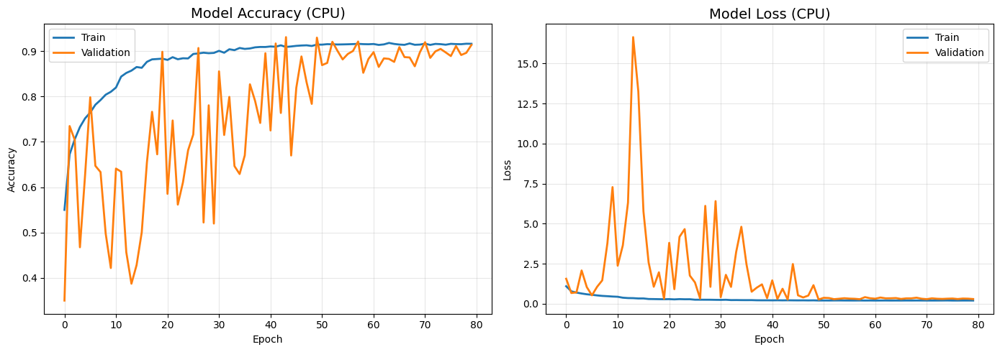

In [43]:
model = WellTest1DCNN(
    num_classes=num_classes,
    input_shape=(128, 2)
)

trainer = WellTestTrainer(
    model=model.model,
    task_type='classification',
    class_names=class_names
)

history = trainer.train(
    X_train, y_train,
    X_val, y_val,
    batch_size=64,
    epochs=80,
    initial_lr=0.001
)

metrics = trainer.evaluate(X_test, y_test)

sample = X_test[0]
pred_class, probs, confidence = trainer.predict_single(X_test[0])
print(f"Predicted class: {pred_class}, Confidence: {confidence:.2%}")
print(f"True class: {np.argmax(y_test[0])}")

trainer.plot_training_history(save_path='training_results.png')

In [44]:
trainer.save_model('1d_cnn_model_classification_multiclass', format='all')

✅ Веса модели сохранены: 1d_cnn_model_classification_multiclass.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_classification_multiclass.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_classification_multiclass_config.json


In [45]:
import tensorflow as tf
from tensorflow import keras

model = keras.models.load_model('/content/1d_cnn_model_classification_multiclass.keras')

print("Модель успешно загружена!")
print(f"Архитектура: {model.summary()}")
print(f"Входная форма: {model.input_shape}")
print(f"Выходная форма: {model.output_shape}")

Модель успешно загружена!


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 20 variables whereas the saved optimizer has 38 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Model: "WellTest1DCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 128, 2)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 64, 32)         │           352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1d_1 (BatchNormalization)     │ (None, 64, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu_1 (ReLU)                   │ (None, 64, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpool1d_1 (MaxPooling1D)      │ (None, 32, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 16, 64)         │        10,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1d_2 (BatchNormalization)     │ (None, 16, 64)         │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu_2 (ReLU)                   │ (None, 16, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpool1d_2 (MaxPooling1D)      │ (None, 8, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 4, 128)         │        41,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1d_3 (BatchNormalization)     │ (None, 4, 128)         │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu_3 (ReLU)                   │ (None, 4, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpool1d_3 (MaxPooling1D)      │ (None, 2, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout1 (Dropout)              │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout2 (Dropout)              │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 304,016 (1.16 MB)

 Trainable params: 151,783 (592.90 KB)

 Non-trainable params: 448 (1.75 KB)

 Optimizer params: 151,785 (592.91 KB)

Архитектура: None
Входная форма: (None, 128, 2)
Выходная форма: (None, 7)



CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix.png


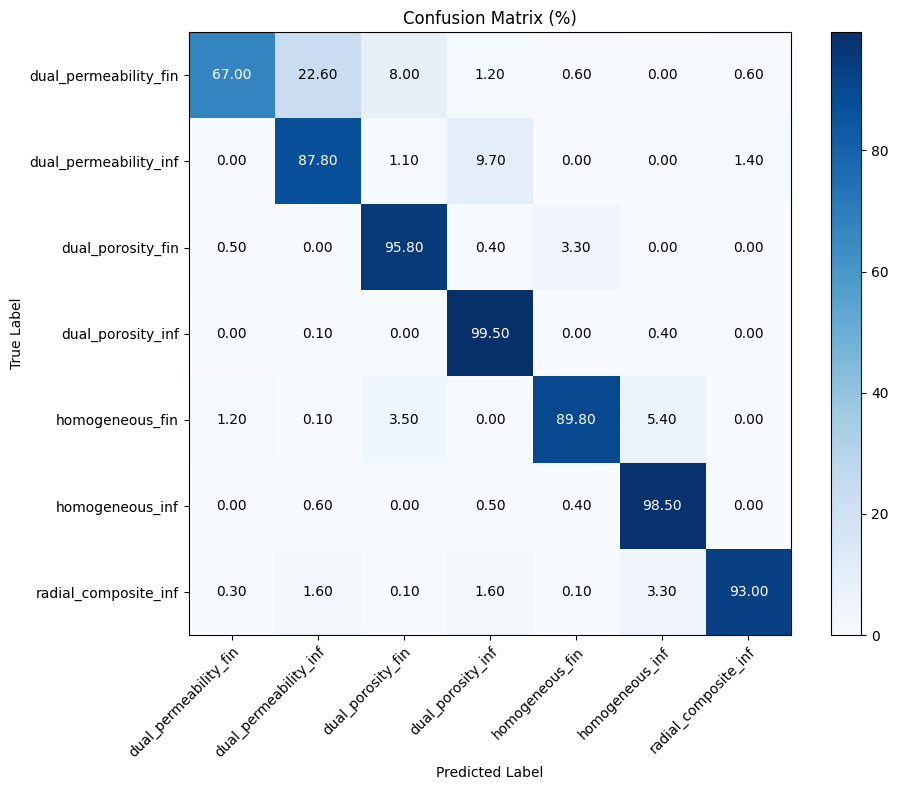

In [46]:
cm = trainer.plot_confusion_matrix(X_test, y_test,
                                  normalize=True,
                                  save_path='confusion_matrix.png')

# Классификация multilabel

In [ ]:
!unzip /content/drive/MyDrive/models_incs.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: models_incs/params/31.csv  
  inflating: models_incs/params/53.csv  
  inflating: models_incs/params/60.csv  
  inflating: models_incs/params/77.csv  
  inflating: models_incs/params/81.csv  
  inflating: models_incs/params/83.csv  
  inflating: models_incs/params/157.csv  
  inflating: models_incs/params/160.csv  
  inflating: models_incs/params/171.csv  
  inflating: models_incs/params/189.csv  
  inflating: models_incs/params/229.csv  
  inflating: models_incs/params/232.csv  
  inflating: models_incs/params/261.csv  
  inflating: models_incs/params/394.csv  
  inflating: models_incs/params/481.csv  
  inflating: models_incs/params/482.csv  
  inflating: models_incs/params/520.csv  
  inflating: models_incs/params/536.csv  
  inflating: models_incs/params/561.csv  
  inflating: models_incs/params/565.csv  
  inflating: models_incs/params/629.csv  
  inflating: models_incs/params/631.csv  
  inflating: m

## Модель нейронной сети

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

class WellTest1DCNN_MultiLabel:
    def __init__(self, num_classes=8, input_shape=(128, 2)):
        """
        Инициализация 1D CNN для MULTILABEL классификации кривых ГДИС

        Parameters:
        -----------
        num_classes : int
            Общее количество бинарных меток (4 типа пласта + 2 границы + 2 обрезания = 8)
        input_shape : tuple
            Форма входных данных (временные точки, каналы)
        """
        self.num_classes = num_classes
        self.input_shape = input_shape
        self.model = self._build_model()

    def _build_model(self):
        """Построение архитектуры сети для MULTILABEL"""
        inputs = keras.Input(shape=self.input_shape)  # (128, 2) или (2, 128)

        # Проверка и изменение размерности если нужно
        # Если вход (2, 128), транспонируем для Conv1D
        if self.input_shape[0] == 2 and len(self.input_shape) == 2:
            # Изменяем форму с (2, 128) на (128, 2)
            inputs = layers.Permute((2, 1))(inputs)

        # Первый сверточный блок
        x = layers.Conv1D(
            filters=32,
            kernel_size=5,
            strides=2,
            padding='same',
            name='conv1d_1'
        )(inputs)
        x = layers.BatchNormalization(name='bn1d_1')(x)
        x = layers.ReLU(name='relu_1')(x)
        x = layers.MaxPooling1D(
            pool_size=2,
            strides=2,
            padding='same',
            name='maxpool1d_1'
        )(x)

        # Второй сверточный блок
        x = layers.Conv1D(
            filters=64,
            kernel_size=5,
            strides=2,
            padding='same',
            name='conv1d_2'
        )(x)
        x = layers.BatchNormalization(name='bn1d_2')(x)
        x = layers.ReLU(name='relu_2')(x)
        x = layers.MaxPooling1D(
            pool_size=2,
            strides=2,
            padding='same',
            name='maxpool1d_2'
        )(x)

        # Третий сверточный блок
        x = layers.Conv1D(
            filters=128,
            kernel_size=5,
            strides=2,
            padding='same',
            name='conv1d_3'
        )(x)
        x = layers.BatchNormalization(name='bn1d_3')(x)
        x = layers.ReLU(name='relu_3')(x)
        x = layers.GlobalAveragePooling1D(name='global_avg_pool')(x)  # Вместо MaxPooling

        # Полносвязные слои
        x = layers.Dense(256, activation='relu', name='fc1')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.5, name='dropout1')(x)

        x = layers.Dense(128, activation='relu', name='fc2')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.3, name='dropout2')(x)

        outputs = layers.Dense(
            self.num_classes,
            activation='sigmoid',
            name='output'
        )(x)

        model = keras.Model(inputs=inputs, outputs=outputs, name='WellTest1DCNN_MultiLabel')

        return model

    def compile_model(self, learning_rate=0.001):
        """
        Компиляция модели с метриками для multilabel
        """
        # Binary crossentropy для multilabel
        self.model.compile(
            optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
            loss='binary_crossentropy',
            metrics=[
                'accuracy',
                keras.metrics.Precision(name='precision'),
                keras.metrics.Recall(name='recall'),
                keras.metrics.AUC(name='auc')
            ]
        )
        return self.model

    def summary(self):
        """Вывод архитектуры модели"""
        return self.model.summary()

## Код обучения

In [ ]:
import json
import os
import time

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt

from sklearn.metrics import (classification_report, confusion_matrix,
                             precision_recall_fscore_support, roc_auc_score,
                             mean_squared_error, mean_absolute_error, r2_score,
                             accuracy_score, hamming_loss, jaccard_score)


class WellTestTrainer:
    TASK_TYPES = ['classification', 'regression', 'multilabel']

    def __init__(self, model, task_type='classification', class_names=None,
                 output_names=None, use_mixed_precision=True, multilabel_threshold=0.5):
        """
        Класс для обучения моделей (поддерживает классификацию, регрессию и multilabel)

        Parameters:
        -----------
        model : keras.Model
            Модель для обучения
        task_type : str
            Тип задачи ('classification', 'regression' или 'multilabel')
        class_names : list, optional
            Названия классов (для классификации и multilabel)
        output_names : list, optional
            Названия выходных параметров (для регрессии)
        use_mixed_precision : bool
            Использовать mixed precision для ускорения на GPU
        multilabel_threshold : float
            Порог для бинаризации предсказаний в multilabel (по умолчанию 0.5)
        """
        if task_type not in self.TASK_TYPES:
            raise ValueError(f"task_type должен быть одним из {self.TASK_TYPES}")

        self.model = model
        self.task_type = task_type
        self.class_names = class_names or []
        self.output_names = output_names or [f'output_{i}' for i in range(model.output_shape[-1])]
        self.multilabel_threshold = multilabel_threshold

        self.num_outputs = model.output_shape[-1]

        self.device_type = self._setup_device(use_mixed_precision)

        self.best_model_path = f'best_model_{task_type}.h5'
        self.checkpoint_dir = f'training_checkpoints_{task_type}'
        self.metrics_file = f'training_metrics_{task_type}.json'

        self.history = None
        self.metrics = None
        self.training_time = None
        self.scaler_y = None

        os.makedirs(self.checkpoint_dir, exist_ok=True)

    def _setup_device(self, use_mixed_precision=True):
        """Настройка устройства (GPU/CPU)"""
        print("=" * 60)
        print(f"НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ ({self.task_type.upper()})")
        print("=" * 60)

        gpus = tf.config.list_physical_devices('GPU')

        if gpus:
            print(f"Обнаружено GPU: {len(gpus)}")
            if use_mixed_precision and self.task_type != 'multilabel':
                # Mixed precision может быть проблематичен для multilabel
                tf.keras.mixed_precision.set_global_policy('mixed_float16')
                print("✅ Mixed precision включен")
            return 'GPU'
        else:
            print("GPU не обнаружен, используется CPU")
            return 'CPU'

    def _get_loss_and_metrics(self):
        """Возвращает функцию потерь и метрики в зависимости от типа задачи"""
        if self.task_type == 'classification':
            loss = 'categorical_crossentropy'
            metrics = ['accuracy']
        elif self.task_type == 'multilabel':
            # Для multilabel: бинарная кросс-энтропия
            loss = 'binary_crossentropy'
            metrics = [
                'accuracy',
                keras.metrics.Precision(name='precision'),
                keras.metrics.Recall(name='recall'),
                keras.metrics.AUC(name='auc')
            ]
        else:  # regression
            loss = 'mse'
            metrics = ['mae', 'mse']

        return loss, metrics

    def _get_monitor_metric(self):
        """Возвращает метрику для мониторинга в callbacks"""
        if self.task_type == 'classification':
            return 'val_accuracy', 'max'
        elif self.task_type == 'multilabel':
            # Для multilabel можно мониторить val_auc или val_loss
            return 'val_auc', 'max'
        else:  # regression
            return 'val_loss', 'min'

    def _create_callbacks(self, patience=50, reduce_lr_patience=5):
        """Создание callback'ов для обучения"""
        monitor_metric, monitor_mode = self._get_monitor_metric()

        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=self.best_model_path,
                monitor=monitor_metric,
                mode=monitor_mode,
                save_best_only=True,
                save_weights_only=False,
                verbose=1,
                save_freq='epoch'
            ),

            keras.callbacks.ReduceLROnPlateau(
                monitor=monitor_metric,
                factor=0.5,
                patience=reduce_lr_patience,
                min_lr=1e-6,
                verbose=1,
                mode=monitor_mode
            ),

            keras.callbacks.CSVLogger(
                os.path.join(self.checkpoint_dir, 'training_log.csv'),
                separator=',',
                append=True
            ),

            keras.callbacks.TerminateOnNaN()
        ]

        if self.device_type == 'GPU':
            callbacks.append(
                keras.callbacks.TensorBoard(
                    log_dir=os.path.join(self.checkpoint_dir, 'tensorboard_logs'),
                    histogram_freq=1,
                    write_graph=True,
                    write_images=True,
                    update_freq='epoch'
                )
            )

        return callbacks

    def _get_optimizer(self, initial_lr=0.01, optimizer_type='adam'):
        """Создание оптимизатора"""
        clipnorm = 1.0
        epsilon = 1e-7

        if optimizer_type == 'adam':
            optimizer = keras.optimizers.Adam(
                learning_rate=initial_lr,
                beta_1=0.9,
                beta_2=0.999,
                epsilon=epsilon,
                clipnorm=clipnorm
            )
        elif optimizer_type == 'sgd':
            optimizer = keras.optimizers.SGD(
                learning_rate=initial_lr,
                momentum=0.9,
                nesterov=True,
                clipnorm=clipnorm
            )
        elif optimizer_type == 'rmsprop':
            optimizer = keras.optimizers.RMSprop(
                learning_rate=initial_lr,
                rho=0.9,
                epsilon=epsilon,
                clipnorm=clipnorm
            )
        else:
            raise ValueError(f"Неизвестный оптимизатор: {optimizer_type}")

        return optimizer

    def _compile_model(self, optimizer):
        """Компиляция модели"""
        loss, metrics = self._get_loss_and_metrics()

        self.model.compile(
            optimizer=optimizer,
            loss=loss,
            metrics=metrics
        )

    def set_y_scaler(self, scaler):
        """Установка scaler для нормализации целевых значений (для регрессии)"""
        self.scaler_y = scaler

    def train(self, X_train, y_train, X_val, y_val,
              batch_size=32, epochs=300, initial_lr=0.01,
              optimizer_type='adam', custom_lr_schedule=None,
              class_weight=None, validation_freq=1):
        """
        Обучение модели
        """
        print("\n" + "=" * 60)
        print(f"НАЧАЛО ОБУЧЕНИЯ НА {self.device_type} ({self.task_type.upper()})")
        print("=" * 60)

        print(f"Устройство: {self.device_type}")
        print(f"Размер батча: {batch_size}")
        print(f"Тренировочные данные: X {X_train.shape}, y {y_train.shape}")
        print(f"Валидационные данные: X {X_val.shape}, y {y_val.shape}")
        print(f"Эпохи: {epochs}")

        # Для multilabel проверяем формат меток
        if self.task_type == 'multilabel':
            print(f"Multilabel формат: {y_train.shape[1]} бинарных меток")
            self._print_multilabel_stats(y_train, "Train")
            self._print_multilabel_stats(y_val, "Validation")

        optimizer = self._get_optimizer(initial_lr, optimizer_type)
        self._compile_model(optimizer)

        if custom_lr_schedule is None:
            if self.task_type == 'classification':
                def lr_schedule(epoch, lr):
                    if epoch in [50, 150, 250]:
                        return lr * 0.1
                    return lr
            elif self.task_type == 'multilabel':
                def lr_schedule(epoch, lr):
                    if epoch in [30, 80, 150]:
                        return lr * 0.5
                    return lr
            else:  # regression
                def lr_schedule(epoch, lr):
                    if epoch in [30, 50, 70]:
                        return lr * 0.1
                    return lr
        else:
            lr_schedule = custom_lr_schedule

        lr_scheduler = keras.callbacks.LearningRateScheduler(lr_schedule, verbose=1)

        callbacks = self._create_callbacks()
        callbacks.append(lr_scheduler)

        start_time = time.time()

        try:
            self.history = self.model.fit(
                X_train, y_train,
                validation_data=(X_val, y_val),
                batch_size=batch_size,
                epochs=epochs,
                callbacks=callbacks,
                verbose=1,
                shuffle=True,
                class_weight=class_weight if self.task_type == 'classification' else None,
                validation_freq=validation_freq
            )

            self.training_time = time.time() - start_time

            print(f"\n✅ Обучение завершено за {self.training_time:.2f} секунд")
            print(f"✅ Лучшая модель сохранена в: {self.best_model_path}")

            self._save_training_info(X_train, X_val)

            return self.history

        except Exception as e:
            print(f"\n❌ Ошибка при обучении: {e}")
            print("Попытка восстановления...")

            if os.path.exists(self.best_model_path):
                self.model = keras.models.load_model(self.best_model_path)
                print("✅ Загружена лучшая сохраненная модель")

            raise

    def _print_multilabel_stats(self, y, name):
        """Вывод статистики для multilabel меток"""
        print(f"\n{name} multilabel статистика:")
        print(f"  Форма: {y.shape}")

        # Частота каждой метки
        label_counts = y.sum(axis=0)
        for i, count in enumerate(label_counts):
            label_name = self.class_names[i] if i < len(self.class_names) else f"Label_{i}"
            pct = count / len(y) * 100
            print(f"  {label_name}: {count:.0f} ({pct:.1f}%)")

        # Количество меток на образец
        n_labels_per_sample = y.sum(axis=1)
        print(f"  Среднее меток на образец: {n_labels_per_sample.mean():.2f}")
        print(f"  Медиана меток на образец: {np.median(n_labels_per_sample):.0f}")

    def _save_training_info(self, X_train, X_val):
        """Сохранение информации об обучении"""
        info = {
            'task_type': self.task_type,
            'device_type': self.device_type,
            'training_time': self.training_time,
            'training_samples': len(X_train),
            'validation_samples': len(X_val),
            'input_shape': X_train.shape[1:],
            'model_summary': []
        }

        if self.task_type == 'classification':
            info.update({
                'num_classes': len(self.class_names),
                'class_names': self.class_names
            })
        elif self.task_type == 'multilabel':
            info.update({
                'num_labels': len(self.class_names),
                'label_names': self.class_names,
                'multilabel_threshold': self.multilabel_threshold
            })
        else:  # regression
            info.update({
                'num_outputs': self.num_outputs,
                'output_names': self.output_names
            })

        self.model.summary(print_fn=lambda x: info['model_summary'].append(x))

        with open(self.metrics_file, 'w') as f:
            json.dump(info, f, indent=2, default=str)

        print(f"✅ Информация об обучении сохранена в {self.metrics_file}")

    def evaluate(self, X_test, y_test, batch_size=None):
        """
        Оценка модели на тестовых данных
        """
        print("\n" + "=" * 60)
        print(f"ОЦЕНКА МОДЕЛИ ({self.task_type.upper()})")
        print("=" * 60)

        if batch_size is None:
            batch_size = 32

        # Базовая оценка
        results = self.model.evaluate(
            X_test, y_test,
            batch_size=batch_size,
            verbose=0,
            return_dict=True
        )

        print(f"\n📊 Базовые метрики:")
        for metric_name, metric_value in results.items():
            print(f"  {metric_name}: {metric_value:.4f}")

        # Предсказания
        y_pred = self.model.predict(X_test, batch_size=batch_size, verbose=0)

        # Специфичная оценка в зависимости от типа задачи
        if self.task_type == 'classification':
            self._evaluate_classification(y_test, y_pred)
        elif self.task_type == 'multilabel':
            self._evaluate_multilabel(y_test, y_pred)
        else:  # regression
            self._evaluate_regression(y_test, y_pred, self.scaler_y)

        # Сохранение метрик
        self.metrics = {
            'task_type': self.task_type,
            'test_metrics': results,
            'device_used': self.device_type,
            'evaluation_time': time.time()
        }

        if self.task_type == 'classification':
            self.metrics.update(self._get_classification_metrics_dict())
        elif self.task_type == 'multilabel':
            self.metrics.update(self._get_multilabel_metrics_dict(y_test, y_pred))
        else:
            self.metrics.update(self._get_regression_metrics_dict(y_test, y_pred))

        with open(f'evaluation_metrics_{self.task_type}.json', 'w') as f:
            json.dump(self.metrics, f, indent=2, default=str)

        return self.metrics

    def _evaluate_multilabel(self, y_test, y_pred):
        """
        Оценка для multilabel классификации
        """
        # Бинаризация предсказаний
        y_pred_binary = (y_pred > self.multilabel_threshold).astype(int)
        y_true = y_test

        print(f"\n📊 Multilabel метрики (порог={self.multilabel_threshold}):")

        # 1. Hamming Loss
        hamming = hamming_loss(y_true, y_pred_binary)
        print(f"  Hamming Loss: {hamming:.4f} (чем меньше, тем лучше)")

        # 2. Subset Accuracy (точное совпадение всех меток)
        subset_acc = accuracy_score(y_true, y_pred_binary)
        print(f"  Subset Accuracy: {subset_acc:.4f}")

        # 3. Jaccard Score (Intersection over Union)
        jaccard_micro = jaccard_score(y_true, y_pred_binary, average='micro')
        jaccard_macro = jaccard_score(y_true, y_pred_binary, average='macro')
        print(f"  Jaccard (micro): {jaccard_micro:.4f}")
        print(f"  Jaccard (macro): {jaccard_macro:.4f}")

        # 4. F1 Score по каждому классу
        precision, recall, f1, _ = precision_recall_fscore_support(
            y_true, y_pred_binary, average=None, zero_division=0
        )

        print(f"\n📊 Пер-класс метрики:")
        print(f"{'Метка':<20} | {'Precision':>10} | {'Recall':>10} | {'F1':>10}")
        print("-" * 55)

        for i in range(len(self.class_names)):
            label_name = self.class_names[i] if i < len(self.class_names) else f'Label_{i}'
            print(f"{label_name:<20} | {precision[i]:>10.4f} | {recall[i]:>10.4f} | {f1[i]:>10.4f}")

        # 5. Средние метрики
        print(f"\n📊 Средние метрики:")
        print(f"  Macro F1: {np.mean(f1):.4f}")
        print(f"  Micro F1: {precision_recall_fscore_support(y_true, y_pred_binary, average='micro')[2]:.4f}")

        # 6. ROC AUC если возможно
        try:
            if y_true.shape[1] == 2:
                roc_auc = roc_auc_score(y_true, y_pred)
                print(f"  ROC AUC: {roc_auc:.4f}")
            else:
                roc_auc_macro = roc_auc_score(y_true, y_pred, average='macro', multi_class='ovr')
                print(f"  ROC AUC (macro): {roc_auc_macro:.4f}")
        except Exception as e:
            print(f"  ROC AUC не может быть вычислен: {e}")

    def _get_multilabel_metrics_dict(self, y_test, y_pred):
        """Возвращает словарь с метриками multilabel"""
        y_pred_binary = (y_pred > self.multilabel_threshold).astype(int)
        y_true = y_test

        precision, recall, f1, _ = precision_recall_fscore_support(
            y_true, y_pred_binary, average=None, zero_division=0
        )

        metrics_dict = {
            'threshold': self.multilabel_threshold,
            'hamming_loss': float(hamming_loss(y_true, y_pred_binary)),
            'subset_accuracy': float(accuracy_score(y_true, y_pred_binary)),
            'jaccard_micro': float(jaccard_score(y_true, y_pred_binary, average='micro')),
            'jaccard_macro': float(jaccard_score(y_true, y_pred_binary, average='macro')),
            'macro_f1': float(np.mean(f1)),
            'micro_f1': float(precision_recall_fscore_support(y_true, y_pred_binary, average='micro')[2]),
            'per_label_metrics': {}
        }

        for i, label_name in enumerate(self.class_names):
            metrics_dict['per_label_metrics'][label_name] = {
                'precision': float(precision[i]),
                'recall': float(recall[i]),
                'f1': float(f1[i])
            }

        return metrics_dict

    def _evaluate_classification(self, y_test, y_pred):
        """Оценка для классификации (без изменений)"""
        y_pred_classes = np.argmax(y_pred, axis=1)
        y_true = np.argmax(y_test, axis=1)

        try:
            if len(self.class_names) == 2:
                roc_auc = roc_auc_score(y_true, y_pred[:, 1])
                print(f"\n📈 ROC AUC Score: {roc_auc:.4f}")
            else:
                roc_auc = roc_auc_score(y_true, y_pred, multi_class='ovr', average='macro')
                print(f"\n📈 ROC AUC Score (macro): {roc_auc:.4f}")
        except:
            roc_auc = None
            print("\n⚠️ ROC AUC не может быть вычислен")

        print("\n📊 Classification Report:")
        print(classification_report(
            y_true, y_pred_classes,
            target_names=self.class_names,
            digits=4
        ))

    def _evaluate_regression(self, y_test, y_pred, scaler=None):
        """Оценка для регрессии (без изменений)"""
        if scaler is not None:
            y_test_real = scaler.inverse_transform(y_test)
            y_pred_real = scaler.inverse_transform(y_pred)
        else:
            y_test_real = y_test
            y_pred_real = y_pred

        print("\n📊 Регрессионные метрики (в исходном масштабе):")

        for i in range(self.num_outputs):
            output_name = self.output_names[i] if i < len(self.output_names) else f'Output {i}'

            mse = mean_squared_error(y_test_real[:, i], y_pred_real[:, i])
            mae = mean_absolute_error(y_test_real[:, i], y_pred_real[:, i])
            r2 = r2_score(y_test_real[:, i], y_pred_real[:, i])

            print(f"\n  {output_name}:")
            print(f"    MSE:  {mse:.4e}")
            print(f"    MAE:  {mae:.4e}")
            print(f"    R²:   {r2:.4f}")

            if r2 < 0:
                print(f"    ⚠️  КРИТИЧЕСКАЯ ОШИБКА: Модель работает хуже константы!")

    def _get_regression_metrics_dict(self, y_test, y_pred):
        """Возвращает словарь с метриками регрессии (без изменений)"""
        if self.scaler_y is not None:
            y_test_orig = self.scaler_y.inverse_transform(y_test)
            y_pred_orig = self.scaler_y.inverse_transform(y_pred)
        else:
            y_test_orig = y_test
            y_pred_orig = y_pred

        metrics_dict = {
            'output_names': self.output_names,
            'per_output_metrics': {}
        }

        for i in range(self.num_outputs):
            mse = float(mean_squared_error(y_test_orig[:, i], y_pred_orig[:, i]))
            mae = float(mean_absolute_error(y_test_orig[:, i], y_pred_orig[:, i]))
            r2 = float(r2_score(y_test_orig[:, i], y_pred_orig[:, i]))

            metrics_dict['per_output_metrics'][self.output_names[i]] = {
                'mse': mse,
                'mae': mae,
                'r2': r2
            }

        metrics_dict['overall'] = {
            'mse': float(mean_squared_error(y_test_orig, y_pred_orig)),
            'mae': float(mean_absolute_error(y_test_orig, y_pred_orig))
        }

        return metrics_dict

    def _get_classification_metrics_dict(self):
        """Возвращает словарь с метриками классификации"""
        return {}

    def predict_single(self, X_single, return_original_scale=False):
        """
        Предсказание для одного примера
        """
        X_batch = np.expand_dims(X_single, axis=0)
        predictions = self.model.predict(X_batch, batch_size=1, verbose=0)[0]

        if self.task_type == 'classification':
            predicted_class = np.argmax(predictions)
            confidence = predictions[predicted_class]
            return predicted_class, predictions, confidence

        elif self.task_type == 'multilabel':
            # Возвращаем бинарные метки и вероятности
            predicted_labels = (predictions > self.multilabel_threshold).astype(int)
            return predicted_labels, predictions

        else:  # regression
            if return_original_scale and self.scaler_y is not None:
                predictions = predictions.reshape(1, -1)
                predictions = self.scaler_y.inverse_transform(predictions)[0]
            return predictions

    def plot_training_history(self, save_path=None):
        """Визуализация истории обучения"""
        if self.history is None:
            print("⚠️ Модель еще не обучена!")
            return

        history_dict = self.history.history

        if self.task_type == 'classification':
            self._plot_classification_history(history_dict, save_path)
        elif self.task_type == 'multilabel':
            self._plot_multilabel_history(history_dict, save_path)
        else:
            self._plot_regression_history(history_dict, save_path)

    def _plot_multilabel_history(self, history_dict, save_path):
        """Визуализация истории для multilabel"""
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))

        # Loss
        axes[0, 0].plot(history_dict['loss'], label='Train', linewidth=2)
        axes[0, 0].plot(history_dict['val_loss'], label='Validation', linewidth=2)
        axes[0, 0].set_title(f'Model Loss ({self.device_type})', fontsize=14)
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)

        # Accuracy
        axes[0, 1].plot(history_dict['accuracy'], label='Train', linewidth=2)
        axes[0, 1].plot(history_dict['val_accuracy'], label='Validation', linewidth=2)
        axes[0, 1].set_title(f'Model Accuracy ({self.device_type})', fontsize=14)
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Accuracy')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)

        # Precision/Recall если есть
        if 'precision' in history_dict:
            axes[1, 0].plot(history_dict['precision'], label='Train Precision', linewidth=2)
            axes[1, 0].plot(history_dict['val_precision'], label='Val Precision', linewidth=2)
            axes[1, 0].plot(history_dict['recall'], label='Train Recall', linewidth=2)
            axes[1, 0].plot(history_dict['val_recall'], label='Val Recall', linewidth=2)
            axes[1, 0].set_title('Precision & Recall', fontsize=14)
            axes[1, 0].set_xlabel('Epoch')
            axes[1, 0].legend()
            axes[1, 0].grid(True, alpha=0.3)

        # AUC если есть
        if 'auc' in history_dict:
            axes[1, 1].plot(history_dict['auc'], label='Train AUC', linewidth=2)
            axes[1, 1].plot(history_dict['val_auc'], label='Validation AUC', linewidth=2)
            axes[1, 1].set_title('ROC AUC', fontsize=14)
            axes[1, 1].set_xlabel('Epoch')
            axes[1, 1].legend()
            axes[1, 1].grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def _plot_classification_history(self, history_dict, save_path):
        """Визуализация истории для классификации (без изменений)"""
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        axes[0].plot(history_dict['accuracy'], label='Train', linewidth=2)
        axes[0].plot(history_dict['val_accuracy'], label='Validation', linewidth=2)
        axes[0].set_title(f'Model Accuracy ({self.device_type})', fontsize=14)
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Accuracy')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        axes[1].plot(history_dict['loss'], label='Train', linewidth=2)
        axes[1].plot(history_dict['val_loss'], label='Validation', linewidth=2)
        axes[1].set_title(f'Model Loss ({self.device_type})', fontsize=14)
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Loss')
        axes[1].legend()
        axes[1].grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def _plot_regression_history(self, history_dict, save_path):
        """Визуализация истории для регрессии (без изменений)"""
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        axes[0].plot(history_dict['loss'], label='Train Loss', linewidth=2)
        axes[0].plot(history_dict['val_loss'], label='Validation Loss', linewidth=2)
        axes[0].set_title(f'Model Loss ({self.device_type})', fontsize=14)
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Loss')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        if 'mae' in history_dict:
            axes[1].plot(history_dict['mae'], label='Train MAE', linewidth=2)
            axes[1].plot(history_dict['val_mae'], label='Validation MAE', linewidth=2)
            axes[1].set_title(f'Model MAE ({self.device_type})', fontsize=14)
            axes[1].set_xlabel('Epoch')
            axes[1].set_ylabel('MAE')
            axes[1].legend()
            axes[1].grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    # Остальные методы (plot_confusion_matrix, plot_predictions_vs_actual,
    # get_bad_predictions, save_model) остаются без изменений,
    # но plot_confusion_matrix нужно адаптировать для multilabel

    def save_model(self, path=None, format='keras'):
        """Сохранение модели"""
        if path is None:
            path = f'welltest_model_{self.task_type}'

        os.makedirs(os.path.dirname(path) if os.path.dirname(path) else '.', exist_ok=True)

        if format in ['h5', 'all']:
            try:
                weights_path = f"{path}.weights.h5"
                self.model.save_weights(weights_path)
                print(f"✅ Веса модели сохранены: {weights_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить веса: {e}")

        if format in ['keras', 'all']:
            keras_path = f"{path}.keras" if not path.endswith('.keras') else path
            try:
                self.model.save(keras_path)
                print(f"✅ Модель сохранена в Keras format: {keras_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить в Keras format: {e}")

        if format in ['savedmodel', 'all']:
            savedmodel_path = f"{path}_savedmodel"
            try:
                tf.saved_model.save(self.model, savedmodel_path)
                print(f"✅ Модель сохранена в SavedModel: {savedmodel_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить в SavedModel: {e}")

        config = {
            'task_type': self.task_type,
            'class_names': self.class_names if self.task_type in ['classification', 'multilabel'] else [],
            'output_names': self.output_names if self.task_type == 'regression' else [],
            'num_outputs': self.num_outputs if self.task_type == 'regression' else None,
            'input_shape': self.model.input_shape[1:],
            'device_used': self.device_type,
            'model_format': format,
            'save_time': time.strftime('%Y-%m-%d %H:%M:%S')
        }

        if self.task_type == 'multilabel':
            config['multilabel_threshold'] = self.multilabel_threshold

        config_path = f"{path}_config.json"
        with open(config_path, 'w') as f:
            json.dump(config, f, indent=2)
        print(f"✅ Конфигурация сохранена: {config_path}")

## Обучение

In [ ]:
data_preprocess = PressureDataMultilabelClassificationPreprocessor1D(data_dir='/content/models_incs')

X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='classification')

In [ ]:
X_train = data_preprocess.normalize(X_train)
X_val = data_preprocess.normalize(X_val)
X_test = data_preprocess.normalize(X_test)

In [ ]:
model = WellTest1DCNN_MultiLabel(
    num_classes=9,  # 4 типа пласта + 2 границы + 3 обрезания
    input_shape=(128, 2)
)

trainer = WellTestTrainer(
    model=model.model,
    task_type='multilabel',
    class_names=[
        'homogeneous', 'dual_porosity', 'dual_permeability', 'radial_composite',
        'inf', 'fin',
        'inc1', 'inc2', 'full'
    ],
    use_mixed_precision=False
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (MULTILABEL)
Обнаружено GPU: 1


In [ ]:
# Обучение
history = trainer.train(
    X_train, y_train,
    X_val, y_val,
    batch_size=32,
    epochs=100,
    initial_lr=0.001
)


НАЧАЛО ОБУЧЕНИЯ НА GPU (MULTILABEL)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (24500, 128, 2), y (24500, 9)
Валидационные данные: X (3500, 128, 2), y (3500, 9)
Эпохи: 100
Multilabel формат: 9 бинарных меток

Train multilabel статистика:
  Форма: (24500, 9)
  homogeneous: 6999 (28.6%)
  dual_porosity: 7002 (28.6%)
  dual_permeability: 6999 (28.6%)
  radial_composite: 3500 (14.3%)
  inf: 14001 (57.1%)
  fin: 10499 (42.9%)
  inc1: 8165 (33.3%)
  inc2: 8166 (33.3%)
  full: 8169 (33.3%)
  Среднее меток на образец: 3.00
  Медиана меток на образец: 3

Validation multilabel статистика:
  Форма: (3500, 9)
  homogeneous: 1000 (28.6%)
  dual_porosity: 999 (28.5%)
  dual_permeability: 1001 (28.6%)
  radial_composite: 500 (14.3%)
  inf: 1999 (57.1%)
  fin: 1501 (42.9%)
  inc1: 1167 (33.3%)
  inc2: 1166 (33.3%)
  full: 1167 (33.3%)
  Среднее меток на образец: 3.00
  Медиана меток на образец: 3

Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/100


Epoch 1: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - accuracy: 0.0096 - auc: 0.8853 - loss: 0.3787 - precision: 0.7188 - recall: 0.6726 - val_accuracy: 0.0000e+00 - val_auc: 0.9325 - val_loss: 0.2857 - val_precision: 0.8478 - val_recall: 0.6897 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/100
757/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0100 - auc: 0.9263 - loss: 0.3000 - precision: 0.8159 - recall: 0.6927
Epoch 2: val_auc improved from 0.93251 to 0.94117, saving model to best_model_multilabel.h5



Epoch 2: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.0118 - auc: 0.9308 - loss: 0.2916 - precision: 0.8218 - recall: 0.7048 - val_accuracy: 0.0420 - val_auc: 0.9412 - val_loss: 0.2639 - val_precision: 0.8376 - val_recall: 0.7279 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/100
764/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0129 - auc: 0.9388 - loss: 0.2749 - precision: 0.8348 - recall: 0.7196
Epoch 3: val_auc improved from 0.94117 to 0.94880, saving model to best_model_multilabel.h5



Epoch 3: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0126 - auc: 0.9395 - loss: 0.2732 - precision: 0.8369 - recall: 0.7214 - val_accuracy: 0.0417 - val_auc: 0.9488 - val_loss: 0.2511 - val_precision: 0.8551 - val_recall: 0.7254 - learning_rate: 0.0010

Epoch 4: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 4/100
763/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0165 - auc: 0.9427 - loss: 0.2667 - precision: 0.8408 - recall: 0.7285
Epoch 4: val_auc improved from 0.94880 to 0.95435, saving model to best_model_multilabel.h5



Epoch 4: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0183 - auc: 0.9449 - loss: 0.2614 - precision: 0.8446 - recall: 0.7331 - val_accuracy: 0.0071 - val_auc: 0.9544 - val_loss: 0.2372 - val_precision: 0.8641 - val_recall: 0.7536 - learning_rate: 0.0010

Epoch 5: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 5/100
758/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0221 - auc: 0.9479 - loss: 0.2543 - precision: 0.8504 - recall: 0.7437
Epoch 5: val_auc did not improve from 0.95435
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0224 - auc: 0.9481 - loss: 0.2539 - precision: 0.8504 - recall: 0.7437 - val_accuracy: 0.0060 - val_auc: 0.9436 - val_loss: 0.2608 - val_precision: 0.8325 - val_recall: 0.7178 - learning_rate: 0.0010

Epoch 6: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 6/100
757/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0219 - auc: 0.9497 


Epoch 7: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0302 - auc: 0.9530 - loss: 0.2418 - precision: 0.8583 - recall: 0.7567 - val_accuracy: 0.0077 - val_auc: 0.9573 - val_loss: 0.2310 - val_precision: 0.8697 - val_recall: 0.7627 - learning_rate: 0.0010

Epoch 8: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 8/100
762/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0313 - auc: 0.9540 - loss: 0.2391 - precision: 0.8601 - recall: 0.7587
Epoch 8: val_auc did not improve from 0.95729
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0336 - auc: 0.9539 - loss: 0.2397 - precision: 0.8603 - recall: 0.7591 - val_accuracy: 0.0077 - val_auc: 0.9535 - val_loss: 0.2379 - val_precision: 0.8507 - val_recall: 0.7584 - learning_rate: 0.0010

Epoch 9: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 9/100
759/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0368 - auc: 0.9556 


Epoch 9: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.0351 - auc: 0.9549 - loss: 0.2373 - precision: 0.8617 - recall: 0.7617 - val_accuracy: 0.0746 - val_auc: 0.9589 - val_loss: 0.2265 - val_precision: 0.8745 - val_recall: 0.7692 - learning_rate: 0.0010

Epoch 10: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 10/100
759/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0352 - auc: 0.9568 - loss: 0.2326 - precision: 0.8659 - recall: 0.7641
Epoch 10: val_auc did not improve from 0.95890
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.0373 - auc: 0.9561 - loss: 0.2343 - precision: 0.8629 - recall: 0.7622 - val_accuracy: 0.0220 - val_auc: 0.9584 - val_loss: 0.2250 - val_precision: 0.8771 - val_recall: 0.7582 - learning_rate: 0.0010

Epoch 11: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 11/100
760/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0357 - auc: 0.


Epoch 12: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0338 - auc: 0.9568 - loss: 0.2321 - precision: 0.8653 - recall: 0.7668 - val_accuracy: 0.0646 - val_auc: 0.9605 - val_loss: 0.2186 - val_precision: 0.8705 - val_recall: 0.7714 - learning_rate: 0.0010

Epoch 13: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 13/100
759/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0378 - auc: 0.9575 - loss: 0.2307 - precision: 0.8665 - recall: 0.7687
Epoch 13: val_auc did not improve from 0.96055
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.0377 - auc: 0.9580 - loss: 0.2290 - precision: 0.8666 - recall: 0.7694 - val_accuracy: 0.0569 - val_auc: 0.9510 - val_loss: 0.2467 - val_precision: 0.8570 - val_recall: 0.7411 - learning_rate: 0.0010

Epoch 14: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 14/100
761/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0434 - auc: 0


Epoch 15: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0413 - auc: 0.9591 - loss: 0.2259 - precision: 0.8691 - recall: 0.7716 - val_accuracy: 0.0606 - val_auc: 0.9615 - val_loss: 0.2174 - val_precision: 0.8750 - val_recall: 0.7742 - learning_rate: 0.0010

Epoch 16: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 16/100
758/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0428 - auc: 0.9593 - loss: 0.2256 - precision: 0.8706 - recall: 0.7736
Epoch 16: val_auc did not improve from 0.96146
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0424 - auc: 0.9591 - loss: 0.2261 - precision: 0.8704 - recall: 0.7732 - val_accuracy: 0.0817 - val_auc: 0.9610 - val_loss: 0.2189 - val_precision: 0.8714 - val_recall: 0.7741 - learning_rate: 0.0010

Epoch 17: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 17/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0449 - auc: 0


Epoch 20: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0536 - auc: 0.9609 - loss: 0.2210 - precision: 0.8724 - recall: 0.7767 - val_accuracy: 0.0634 - val_auc: 0.9642 - val_loss: 0.2101 - val_precision: 0.8822 - val_recall: 0.7804 - learning_rate: 0.0010

Epoch 21: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 21/100
763/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0518 - auc: 0.9608 - loss: 0.2208 - precision: 0.8713 - recall: 0.7757
Epoch 21: val_auc did not improve from 0.96418
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0535 - auc: 0.9609 - loss: 0.2209 - precision: 0.8736 - recall: 0.7772 - val_accuracy: 0.0554 - val_auc: 0.9595 - val_loss: 0.2274 - val_precision: 0.8709 - val_recall: 0.7740 - learning_rate: 0.0010

Epoch 22: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 22/100
757/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0493 - auc: 0


Epoch 24: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0534 - auc: 0.9617 - loss: 0.2190 - precision: 0.8759 - recall: 0.7807 - val_accuracy: 0.0749 - val_auc: 0.9646 - val_loss: 0.2080 - val_precision: 0.8773 - val_recall: 0.7795 - learning_rate: 0.0010

Epoch 25: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 25/100
763/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0592 - auc: 0.9621 - loss: 0.2169 - precision: 0.8742 - recall: 0.7785
Epoch 25: val_auc did not improve from 0.96463
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0563 - auc: 0.9620 - loss: 0.2176 - precision: 0.8754 - recall: 0.7791 - val_accuracy: 0.0640 - val_auc: 0.9641 - val_loss: 0.2112 - val_precision: 0.8812 - val_recall: 0.7802 - learning_rate: 0.0010

Epoch 26: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 26/100
759/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0556 - auc: 0


Epoch 28: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0522 - auc: 0.9630 - loss: 0.2145 - precision: 0.8764 - recall: 0.7822 - val_accuracy: 0.0840 - val_auc: 0.9667 - val_loss: 0.2015 - val_precision: 0.8894 - val_recall: 0.7876 - learning_rate: 0.0010

Epoch 29: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 29/100
761/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0531 - auc: 0.9635 - loss: 0.2132 - precision: 0.8786 - recall: 0.7838
Epoch 29: val_auc did not improve from 0.96674
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0537 - auc: 0.9635 - loss: 0.2134 - precision: 0.8782 - recall: 0.7836 - val_accuracy: 0.0320 - val_auc: 0.9525 - val_loss: 0.2408 - val_precision: 0.8565 - val_recall: 0.7514 - learning_rate: 0.0010

Epoch 30: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 30/100
761/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0570 - auc: 0


Epoch 30: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.0593 - auc: 0.9631 - loss: 0.2144 - precision: 0.8774 - recall: 0.7827 - val_accuracy: 0.0780 - val_auc: 0.9671 - val_loss: 0.2015 - val_precision: 0.8864 - val_recall: 0.7927 - learning_rate: 0.0010

Epoch 31: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 31/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0602 - auc: 0.9651 - loss: 0.2084 - precision: 0.8813 - recall: 0.7888
Epoch 31: val_auc improved from 0.96708 to 0.96934, saving model to best_model_multilabel.h5



Epoch 31: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0627 - auc: 0.9652 - loss: 0.2078 - precision: 0.8820 - recall: 0.7893 - val_accuracy: 0.0840 - val_auc: 0.9693 - val_loss: 0.1940 - val_precision: 0.8920 - val_recall: 0.7969 - learning_rate: 5.0000e-04

Epoch 32: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 32/100
762/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0625 - auc: 0.9660 - loss: 0.2065 - precision: 0.8827 - recall: 0.7929
Epoch 32: val_auc improved from 0.96934 to 0.96937, saving model to best_model_multilabel.h5



Epoch 32: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0622 - auc: 0.9657 - loss: 0.2065 - precision: 0.8819 - recall: 0.7897 - val_accuracy: 0.0611 - val_auc: 0.9694 - val_loss: 0.1938 - val_precision: 0.8922 - val_recall: 0.7929 - learning_rate: 5.0000e-04

Epoch 33: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 33/100
758/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0647 - auc: 0.9651 - loss: 0.2082 - precision: 0.8815 - recall: 0.7877
Epoch 33: val_auc improved from 0.96937 to 0.96997, saving model to best_model_multilabel.h5



Epoch 33: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0641 - auc: 0.9659 - loss: 0.2059 - precision: 0.8821 - recall: 0.7898 - val_accuracy: 0.0700 - val_auc: 0.9700 - val_loss: 0.1916 - val_precision: 0.8900 - val_recall: 0.7981 - learning_rate: 5.0000e-04

Epoch 34: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 34/100
761/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0674 - auc: 0.9670 - loss: 0.2028 - precision: 0.8849 - recall: 0.7953
Epoch 34: val_auc did not improve from 0.96997
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0669 - auc: 0.9660 - loss: 0.2055 - precision: 0.8826 - recall: 0.7917 - val_accuracy: 0.0686 - val_auc: 0.9680 - val_loss: 0.1980 - val_precision: 0.8891 - val_recall: 0.7907 - learning_rate: 5.0000e-04

Epoch 35: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 35/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0713 


Epoch 37: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.0688 - auc: 0.9664 - loss: 0.2048 - precision: 0.8829 - recall: 0.7926 - val_accuracy: 0.0900 - val_auc: 0.9701 - val_loss: 0.1929 - val_precision: 0.8931 - val_recall: 0.7985 - learning_rate: 5.0000e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 38/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0738 - auc: 0.9675 - loss: 0.2016 - precision: 0.8850 - recall: 0.7952
Epoch 38: val_auc did not improve from 0.97015
766/766 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.0726 - auc: 0.9671 - loss: 0.2026 - precision: 0.8839 - recall: 0.7939 - val_accuracy: 0.0809 - val_auc: 0.9669 - val_loss: 0.2038 - val_precision: 0.8852 - val_recall: 0.7881 - learning_rate: 5.0000e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 39/100
764/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0755


Epoch 40: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0768 - auc: 0.9670 - loss: 0.2025 - precision: 0.8837 - recall: 0.7935 - val_accuracy: 0.0800 - val_auc: 0.9706 - val_loss: 0.1906 - val_precision: 0.8965 - val_recall: 0.8000 - learning_rate: 5.0000e-04

Epoch 41: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 41/100
761/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0721 - auc: 0.9672 - loss: 0.2014 - precision: 0.8852 - recall: 0.7947
Epoch 41: val_auc did not improve from 0.97057
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0732 - auc: 0.9674 - loss: 0.2012 - precision: 0.8855 - recall: 0.7944 - val_accuracy: 0.0797 - val_auc: 0.9701 - val_loss: 0.1913 - val_precision: 0.8920 - val_recall: 0.7940 - learning_rate: 5.0000e-04

Epoch 42: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 42/100
758/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0728 


Epoch 46: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0787 - auc: 0.9689 - loss: 0.1967 - precision: 0.8868 - recall: 0.7992 - val_accuracy: 0.0869 - val_auc: 0.9709 - val_loss: 0.1886 - val_precision: 0.8926 - val_recall: 0.7984 - learning_rate: 2.5000e-04

Epoch 47: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 47/100
763/766 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0847 - auc: 0.9691 - loss: 0.1962 - precision: 0.8886 - recall: 0.8000
Epoch 47: val_auc improved from 0.97088 to 0.97201, saving model to best_model_multilabel.h5



Epoch 47: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0828 - auc: 0.9692 - loss: 0.1958 - precision: 0.8877 - recall: 0.7999 - val_accuracy: 0.0891 - val_auc: 0.9720 - val_loss: 0.1878 - val_precision: 0.8990 - val_recall: 0.8038 - learning_rate: 2.5000e-04

Epoch 48: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 48/100
763/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0807 - auc: 0.9695 - loss: 0.1946 - precision: 0.8879 - recall: 0.8013
Epoch 48: val_auc did not improve from 0.97201
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0820 - auc: 0.9695 - loss: 0.1946 - precision: 0.8871 - recall: 0.8010 - val_accuracy: 0.0963 - val_auc: 0.9719 - val_loss: 0.1870 - val_precision: 0.8979 - val_recall: 0.8023 - learning_rate: 2.5000e-04

Epoch 49: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 49/100
763/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0901 


Epoch 51: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0874 - auc: 0.9695 - loss: 0.1945 - precision: 0.8869 - recall: 0.8001 - val_accuracy: 0.0914 - val_auc: 0.9730 - val_loss: 0.1832 - val_precision: 0.8976 - val_recall: 0.8052 - learning_rate: 2.5000e-04

Epoch 52: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 52/100
761/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0824 - auc: 0.9699 - loss: 0.1932 - precision: 0.8863 - recall: 0.7983
Epoch 52: val_auc did not improve from 0.97299
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.0864 - auc: 0.9698 - loss: 0.1937 - precision: 0.8862 - recall: 0.8000 - val_accuracy: 0.1000 - val_auc: 0.9717 - val_loss: 0.1862 - val_precision: 0.8946 - val_recall: 0.8018 - learning_rate: 2.5000e-04

Epoch 53: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 53/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0930 


Epoch 58: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0900 - auc: 0.9707 - loss: 0.1907 - precision: 0.8893 - recall: 0.8047 - val_accuracy: 0.1000 - val_auc: 0.9730 - val_loss: 0.1817 - val_precision: 0.8971 - val_recall: 0.8032 - learning_rate: 1.2500e-04

Epoch 59: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 59/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0936 - auc: 0.9711 - loss: 0.1901 - precision: 0.8916 - recall: 0.8063
Epoch 59: val_auc did not improve from 0.97304
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0922 - auc: 0.9713 - loss: 0.1893 - precision: 0.8910 - recall: 0.8076 - val_accuracy: 0.1020 - val_auc: 0.9728 - val_loss: 0.1825 - val_precision: 0.8984 - val_recall: 0.8044 - learning_rate: 1.2500e-04

Epoch 60: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 60/100
759/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0989 


Epoch 62: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0939 - auc: 0.9712 - loss: 0.1891 - precision: 0.8891 - recall: 0.8069 - val_accuracy: 0.0983 - val_auc: 0.9736 - val_loss: 0.1805 - val_precision: 0.8993 - val_recall: 0.8070 - learning_rate: 6.2500e-05

Epoch 63: LearningRateScheduler setting learning rate to 6.25000029685907e-05.
Epoch 63/100
762/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0970 - auc: 0.9712 - loss: 0.1888 - precision: 0.8902 - recall: 0.8067
Epoch 63: val_auc did not improve from 0.97362
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.0972 - auc: 0.9715 - loss: 0.1880 - precision: 0.8907 - recall: 0.8070 - val_accuracy: 0.0963 - val_auc: 0.9734 - val_loss: 0.1806 - val_precision: 0.8992 - val_recall: 0.8061 - learning_rate: 6.2500e-05

Epoch 64: LearningRateScheduler setting learning rate to 6.25000029685907e-05.
Epoch 64/100
761/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0960 - 


Epoch 67: finished saving model to best_model_multilabel.h5

Epoch 67: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
766/766 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.0971 - auc: 0.9716 - loss: 0.1880 - precision: 0.8909 - recall: 0.8090 - val_accuracy: 0.1046 - val_auc: 0.9737 - val_loss: 0.1801 - val_precision: 0.8992 - val_recall: 0.8074 - learning_rate: 3.1250e-05

Epoch 68: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 68/100
760/766 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0991 - auc: 0.9718 - loss: 0.1872 - precision: 0.8891 - recall: 0.8081
Epoch 68: val_auc improved from 0.97369 to 0.97379, saving model to best_model_multilabel.h5



Epoch 68: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.1000 - auc: 0.9719 - loss: 0.1870 - precision: 0.8906 - recall: 0.8083 - val_accuracy: 0.1066 - val_auc: 0.9738 - val_loss: 0.1791 - val_precision: 0.8994 - val_recall: 0.8076 - learning_rate: 3.1250e-05

Epoch 69: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 69/100
761/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1008 - auc: 0.9722 - loss: 0.1862 - precision: 0.8915 - recall: 0.8098
Epoch 69: val_auc did not improve from 0.97379
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.1002 - auc: 0.9719 - loss: 0.1871 - precision: 0.8903 - recall: 0.8082 - val_accuracy: 0.1071 - val_auc: 0.9737 - val_loss: 0.1792 - val_precision: 0.8984 - val_recall: 0.8075 - learning_rate: 3.1250e-05

Epoch 70: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 70/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1012 


Epoch 73: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0988 - auc: 0.9719 - loss: 0.1872 - precision: 0.8902 - recall: 0.8096 - val_accuracy: 0.1003 - val_auc: 0.9739 - val_loss: 0.1789 - val_precision: 0.8995 - val_recall: 0.8089 - learning_rate: 3.1250e-05

Epoch 74: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 74/100
758/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0981 - auc: 0.9721 - loss: 0.1864 - precision: 0.8900 - recall: 0.8086
Epoch 74: val_auc did not improve from 0.97393
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0973 - auc: 0.9721 - loss: 0.1864 - precision: 0.8901 - recall: 0.8090 - val_accuracy: 0.0994 - val_auc: 0.9738 - val_loss: 0.1791 - val_precision: 0.8985 - val_recall: 0.8068 - learning_rate: 3.1250e-05

Epoch 75: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 75/100
763/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0995 


Epoch 79: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.0975 - auc: 0.9722 - loss: 0.1862 - precision: 0.8902 - recall: 0.8098 - val_accuracy: 0.1057 - val_auc: 0.9740 - val_loss: 0.1783 - val_precision: 0.8988 - val_recall: 0.8076 - learning_rate: 1.5625e-05

Epoch 80: LearningRateScheduler setting learning rate to 1.5625000742147677e-05.
Epoch 80/100
763/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0999 - auc: 0.9715 - loss: 0.1883 - precision: 0.8891 - recall: 0.8065
Epoch 80: val_auc did not improve from 0.97402
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0998 - auc: 0.9723 - loss: 0.1856 - precision: 0.8908 - recall: 0.8100 - val_accuracy: 0.1040 - val_auc: 0.9740 - val_loss: 0.1785 - val_precision: 0.8991 - val_recall: 0.8071 - learning_rate: 1.5625e-05

Epoch 81: LearningRateScheduler setting learning rate to 7.812500371073838e-06.
Epoch 81/100
759/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0993


Epoch 82: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.1013 - auc: 0.9722 - loss: 0.1861 - precision: 0.8908 - recall: 0.8100 - val_accuracy: 0.1040 - val_auc: 0.9741 - val_loss: 0.1780 - val_precision: 0.8995 - val_recall: 0.8087 - learning_rate: 7.8125e-06

Epoch 83: LearningRateScheduler setting learning rate to 7.812500371073838e-06.
Epoch 83/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0986 - auc: 0.9725 - loss: 0.1850 - precision: 0.8909 - recall: 0.8104
Epoch 83: val_auc did not improve from 0.97409
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0985 - auc: 0.9722 - loss: 0.1859 - precision: 0.8909 - recall: 0.8102 - val_accuracy: 0.1054 - val_auc: 0.9741 - val_loss: 0.1780 - val_precision: 0.8997 - val_recall: 0.8090 - learning_rate: 7.8125e-06

Epoch 84: LearningRateScheduler setting learning rate to 7.812500371073838e-06.
Epoch 84/100
757/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0997 


Epoch 88: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.1007 - auc: 0.9721 - loss: 0.1863 - precision: 0.8911 - recall: 0.8100 - val_accuracy: 0.1063 - val_auc: 0.9741 - val_loss: 0.1779 - val_precision: 0.8999 - val_recall: 0.8095 - learning_rate: 3.9063e-06

Epoch 89: LearningRateScheduler setting learning rate to 3.906250185536919e-06.
Epoch 89/100
762/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0988 - auc: 0.9730 - loss: 0.1838 - precision: 0.8945 - recall: 0.8146
Epoch 89: val_auc did not improve from 0.97410
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.1004 - auc: 0.9723 - loss: 0.1858 - precision: 0.8910 - recall: 0.8109 - val_accuracy: 0.1071 - val_auc: 0.9741 - val_loss: 0.1783 - val_precision: 0.8993 - val_recall: 0.8087 - learning_rate: 3.9063e-06

Epoch 90: LearningRateScheduler setting learning rate to 3.906250185536919e-06.
Epoch 90/100
761/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1020 


Epoch 92: finished saving model to best_model_multilabel.h5

Epoch 92: ReduceLROnPlateau reducing learning rate to 1.9531250927684596e-06.
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.1016 - auc: 0.9724 - loss: 0.1856 - precision: 0.8911 - recall: 0.8097 - val_accuracy: 0.1069 - val_auc: 0.9741 - val_loss: 0.1780 - val_precision: 0.9007 - val_recall: 0.8096 - learning_rate: 1.9531e-06

Epoch 93: LearningRateScheduler setting learning rate to 1.9531250927684596e-06.
Epoch 93/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0968 - auc: 0.9728 - loss: 0.1842 - precision: 0.8941 - recall: 0.8124
Epoch 93: val_auc improved from 0.97415 to 0.97416, saving model to best_model_multilabel.h5



Epoch 93: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0965 - auc: 0.9723 - loss: 0.1859 - precision: 0.8918 - recall: 0.8109 - val_accuracy: 0.1074 - val_auc: 0.9742 - val_loss: 0.1778 - val_precision: 0.8999 - val_recall: 0.8096 - learning_rate: 1.9531e-06

Epoch 94: LearningRateScheduler setting learning rate to 1.9531250927684596e-06.
Epoch 94/100
758/766 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1019 - auc: 0.9718 - loss: 0.1872 - precision: 0.8906 - recall: 0.8083
Epoch 94: val_auc did not improve from 0.97416
766/766 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.1017 - auc: 0.9722 - loss: 0.1858 - precision: 0.8908 - recall: 0.8093 - val_accuracy: 0.1051 - val_auc: 0.9740 - val_loss: 0.1783 - val_precision: 0.8995 - val_recall: 0.8083 - learning_rate: 1.9531e-06

Epoch 95: LearningRateScheduler setting learning rate to 1.9531250927684596e-06.
Epoch 95/100
763/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.102


Epoch 95: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.1009 - auc: 0.9723 - loss: 0.1857 - precision: 0.8915 - recall: 0.8105 - val_accuracy: 0.1054 - val_auc: 0.9742 - val_loss: 0.1779 - val_precision: 0.9003 - val_recall: 0.8089 - learning_rate: 1.9531e-06

Epoch 96: LearningRateScheduler setting learning rate to 1.9531250927684596e-06.
Epoch 96/100
760/766 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1009 - auc: 0.9721 - loss: 0.1865 - precision: 0.8899 - recall: 0.8098
Epoch 96: val_auc did not improve from 0.97417
766/766 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0999 - auc: 0.9723 - loss: 0.1860 - precision: 0.8910 - recall: 0.8097 - val_accuracy: 0.1063 - val_auc: 0.9741 - val_loss: 0.1778 - val_precision: 0.8996 - val_recall: 0.8090 - learning_rate: 1.9531e-06

Epoch 97: LearningRateScheduler setting learning rate to 1.9531250927684596e-06.
Epoch 97/100
760/766 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.100

✅ Информация об обучении сохранена в training_metrics_multilabel.json


In [ ]:
# Оценка
metrics = trainer.evaluate(X_test, y_test)

# Предсказание
predicted_labels, probabilities = trainer.predict_single(X_test[0])


ОЦЕНКА МОДЕЛИ (MULTILABEL)

📊 Базовые метрики:
  accuracy: 0.1063
  auc: 0.9748
  loss: 0.1761
  precision: 0.8998
  recall: 0.8086

📊 Multilabel метрики (порог=0.5):
  Hamming Loss: 0.0938 (чем меньше, тем лучше)
  Subset Accuracy: 0.5590
  Jaccard (micro): 0.7418
  Jaccard (macro): 0.7521

📊 Пер-класс метрики:
Метка                |  Precision |     Recall |         F1
-------------------------------------------------------
homogeneous          |     0.9273 |     0.6692 |     0.7774
dual_porosity        |     0.9443 |     0.6273 |     0.7538
dual_permeability    |     0.9266 |     0.6310 |     0.7507
radial_composite     |     0.9959 |     0.7350 |     0.8458
inf                  |     0.7249 |     0.9633 |     0.8273
fin                  |     0.9133 |     0.5123 |     0.6564
inc1                 |     1.0000 |     1.0000 |     1.0000
inc2                 |     1.0000 |     1.0000 |     1.0000
full                 |     1.0000 |     1.0000 |     1.0000

📊 Средние метрики:
  Macro F

In [ ]:
trainer.save_model('1d_cnn_model_classification_multilabel', format='all')

✅ Веса модели сохранены: 1d_cnn_model_classification_multilabel.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_classification_multilabel.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_classification_multilabel_config.json


# Классификация multilabel с кастомным разбиением на train/val/test

In [ ]:
!unzip /content/drive/MyDrive/datasets/models_incs_prc.zip

In [ ]:
data_preprocess = PressureDataMultilabelClassificationCustomPreprocessor1D(
    data_dir='/content/models_incs_prc',
    debug=True
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

In [ ]:
X_train = data_preprocess.normalize(X_train)
X_val   = data_preprocess.normalize(X_val)
X_test  = data_preprocess.normalize(X_test)

In [ ]:
model = WellTest1DCNN_MultiLabel(
    num_classes=9,
    input_shape=(128, 2)
)

trainer = WellTestTrainer(
    model=model.model,
    task_type='multilabel',
    class_names=[
        'homogeneous', 'dual_porosity', 'dual_permeability', 'radial_composite',
        'inf', 'fin',
        'inc1', 'inc2', 'full'
    ],
    use_mixed_precision=False
)

history = trainer.train(
    X_train, y_train,
    X_val, y_val,
    batch_size=32,
    epochs=100,
    initial_lr=0.001
)

In [ ]:
metrics = trainer.evaluate(X_test, y_test)

In [ ]:
trainer.save_model('1d_cnn_model_classification_multilabel', format='all')

# Scaler

In [13]:
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

class KValueScaler(BaseEstimator, TransformerMixin):
    """
    Кастомный скейлер для параметров ГДИС.

    Логика:
    1. Для k (столбец 0):
       - Умножаем на 10^12, затем StandardScaler
    2. Для log_cols (например omega, lambda):
       - Применяем log10, затем StandardScaler
    3. Для остальных (C_D, S и др.):
       - Применяем StandardScaler
    """

    def __init__(self, log_cols=None):
        self.k_multiplier = 1e12
        self.log_cols = log_cols or []
        self.k_scaler = None
        self.log_scalers = {}
        self.other_scaler = None

    def _other_cols(self, n_cols):
        return [i for i in range(1, n_cols) if i not in self.log_cols]

    def fit(self, y, **fit_params):
        n_cols = y.shape[1]

        self.k_scaler = StandardScaler()
        self.k_scaler.fit(y[:, 0:1] * self.k_multiplier)

        for col in self.log_cols:
            scaler = StandardScaler()
            scaler.fit(np.log10(y[:, col:col+1]))
            self.log_scalers[col] = scaler

        other = self._other_cols(n_cols)
        if other:
            self.other_scaler = StandardScaler()
            self.other_scaler.fit(y[:, other])

        return self

    def transform(self, y):
        n_cols = y.shape[1]
        y_t = np.zeros_like(y, dtype=np.float64)

        y_t[:, 0:1] = self.k_scaler.transform(y[:, 0:1] * self.k_multiplier)

        for col in self.log_cols:
            y_t[:, col:col+1] = self.log_scalers[col].transform(np.log10(y[:, col:col+1]))

        other = self._other_cols(n_cols)
        if other and self.other_scaler is not None:
            y_t[:, other] = self.other_scaler.transform(y[:, other])

        return y_t

    def inverse_transform(self, y):
        n_cols = y.shape[1]
        y_i = np.zeros_like(y, dtype=np.float64)

        y_i[:, 0:1] = self.k_scaler.inverse_transform(y[:, 0:1]) / self.k_multiplier

        for col in self.log_cols:
            y_i[:, col:col+1] = 10 ** self.log_scalers[col].inverse_transform(y[:, col:col+1])

        other = self._other_cols(n_cols)
        if other and self.other_scaler is not None:
            y_i[:, other] = self.other_scaler.inverse_transform(y[:, other])

        return y_i

    def fit_transform(self, y, **fit_params):
        self.fit(y, **fit_params)
        return self.transform(y)


# Обучение: бесконечный пласт

In [ ]:
!unzip /content/drive/MyDrive/homogeneous_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: homogeneous_inf/params/24.csv  
  inflating: homogeneous_inf/params/46.csv  
  inflating: homogeneous_inf/params/48.csv  
  inflating: homogeneous_inf/params/85.csv  
  inflating: homogeneous_inf/params/168.csv  
  inflating: homogeneous_inf/params/183.csv  
  inflating: homogeneous_inf/params/208.csv  
  inflating: homogeneous_inf/params/209.csv  
  inflating: homogeneous_inf/params/215.csv  
  inflating: homogeneous_inf/params/226.csv  
  inflating: homogeneous_inf/params/252.csv  
  inflating: homogeneous_inf/params/268.csv  
  inflating: homogeneous_inf/params/274.csv  
  inflating: homogeneous_inf/params/283.csv  
  inflating: homogeneous_inf/params/290.csv  
  inflating: homogeneous_inf/params/311.csv  
  inflating: homogeneous_inf/params/314.csv  
  inflating: homogeneous_inf/params/319.csv  
  inflating: homogeneous_inf/params/328.csv  
  inflating: homogeneous_inf/params/347.csv  
  inflating: hom

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/homogeneous_inf',
    model_type=Model.HOMOGENEOUS_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 3).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 3).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 3).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler()
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

Transformed data:  0.22697507189173602 1.094020668159395 0.6250484361989477
Transformed data:  0.2297738057665848 1.090636452589685 0.6285015034787514
Transformed data:  0.22716161786558992 1.0819902948692142 0.6231868395191038


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std


In [ ]:
# убран мёртвый код: X_train_norm не используется в обучении;
# normalize() делает per-sample min-max и уничтожила бы межсэмпловую вариацию k


In [ ]:
model = WellTest1DCNN_REG(output_dim=3, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k', 'C_D', 'S']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=60,
    initial_lr=0.00005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 3)
Валидационные данные: X (2000, 128, 2), y (2000, 3)
Эпохи: 60

Epoch 1: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 1/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.7597 - mae: 0.6356 - mse: 0.7597
Epoch 1: val_loss improved from None to 1.37695, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.5087 - mae: 0.4970 - mse: 0.5087 - val_loss: 1.3770 - val_mae: 0.9685 - val_mse: 1.3770 - learning_rate: 5.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 2/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1966 - mae: 0.2965 - mse: 0.1966
Epoch 2: val_loss improved from 1.37695 to 0.53621, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1681 - mae: 0.2720 - mse: 0.1681 - val_loss: 0.5362 - val_mae: 0.5598 - val_mse: 0.5362 - learning_rate: 5.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 3/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1240 - mae: 0.2295 - mse: 0.1240
Epoch 3: val_loss improved from 0.53621 to 0.24818, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1104 - mae: 0.2217 - mse: 0.1104 - val_loss: 0.2482 - val_mae: 0.3565 - val_mse: 0.2482 - learning_rate: 5.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 4/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0883 - mae: 0.1968 - mse: 0.0883
Epoch 4: val_loss improved from 0.24818 to 0.11168, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0841 - mae: 0.1945 - mse: 0.0841 - val_loss: 0.1117 - val_mae: 0.2782 - val_mse: 0.1117 - learning_rate: 5.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 5/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0718 - mae: 0.1841 - mse: 0.0718
Epoch 5: val_loss did not improve from 0.11168
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0707 - mae: 0.1838 - mse: 0.0707 - val_loss: 0.2393 - val_mae: 0.3429 - val_mse: 0.2393 - learning_rate: 5.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 6/60
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0584 - mae: 0.1709 - mse: 0.0584
Epoch 6: val_loss improved from 0.11168 to 0.10733, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0602 - mae: 0.1714 - mse: 0.0602 - val_loss: 0.1073 - val_mae: 0.2361 - val_mse: 0.1073 - learning_rate: 5.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 7/60
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0550 - mae: 0.1658 - mse: 0.0550
Epoch 7: val_loss improved from 0.10733 to 0.05803, saving model to best_model_regression.h5



Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0566 - mae: 0.1660 - mse: 0.0566 - val_loss: 0.0580 - val_mae: 0.1921 - val_mse: 0.0580 - learning_rate: 5.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 8/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0498 - mae: 0.1566 - mse: 0.0498
Epoch 8: val_loss did not improve from 0.05803
219/219 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0501 - mae: 0.1569 - mse: 0.0501 - val_loss: 0.0893 - val_mae: 0.2207 - val_mse: 0.0893 - learning_rate: 5.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 9/60
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0499 - mae: 0.1549 - mse: 0.0499
Epoch 9: val_loss did not improve from 0.05803
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - loss: 0.0463 - mae: 0.1507 - mse: 0.0463 - val_loss: 0.1023 - val_mae: 0.2645 - val_mse: 0.1023 - learning_rate: 5.00


Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0438 - mae: 0.1496 - mse: 0.0438 - val_loss: 0.0506 - val_mae: 0.1711 - val_mse: 0.0506 - learning_rate: 5.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 11/60
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0406 - mae: 0.1440 - mse: 0.0406
Epoch 11: val_loss improved from 0.05065 to 0.04182, saving model to best_model_regression.h5



Epoch 11: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - loss: 0.0412 - mae: 0.1464 - mse: 0.0412 - val_loss: 0.0418 - val_mae: 0.1626 - val_mse: 0.0418 - learning_rate: 5.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 12/60
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0426 - mae: 0.1492 - mse: 0.0426
Epoch 12: val_loss did not improve from 0.04182
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0414 - mae: 0.1477 - mse: 0.0414 - val_loss: 0.0652 - val_mae: 0.1976 - val_mse: 0.0652 - learning_rate: 5.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 13/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0388 - mae: 0.1427 - mse: 0.0388
Epoch 13: val_loss did not improve from 0.04182
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0384 - mae: 0.1415 - mse: 0.0384 - val_loss: 0.2231 - val_mae: 0.3610 - val_mse: 0.2231 - learning_rate


Epoch 14: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0362 - mae: 0.1383 - mse: 0.0362 - val_loss: 0.0278 - val_mae: 0.1214 - val_mse: 0.0278 - learning_rate: 5.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 15/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0378 - mae: 0.1409 - mse: 0.0378
Epoch 15: val_loss did not improve from 0.02781
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0350 - mae: 0.1360 - mse: 0.0350 - val_loss: 0.0696 - val_mae: 0.2155 - val_mse: 0.0696 - learning_rate: 5.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 16/60
209/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0355 - mae: 0.1375 - mse: 0.0355
Epoch 16: val_loss improved from 0.02781 to 0.01376, saving model to best_model_regression.h5



Epoch 16: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0341 - mae: 0.1338 - mse: 0.0341 - val_loss: 0.0138 - val_mae: 0.0848 - val_mse: 0.0138 - learning_rate: 5.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 17/60
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0357 - mae: 0.1376 - mse: 0.0357
Epoch 17: val_loss improved from 0.01376 to 0.00852, saving model to best_model_regression.h5



Epoch 17: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0341 - mae: 0.1348 - mse: 0.0341 - val_loss: 0.0085 - val_mae: 0.0675 - val_mse: 0.0085 - learning_rate: 5.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 18/60
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0389 - mae: 0.1436 - mse: 0.0389
Epoch 18: val_loss did not improve from 0.00852
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0357 - mae: 0.1385 - mse: 0.0357 - val_loss: 0.1800 - val_mae: 0.3240 - val_mse: 0.1800 - learning_rate: 5.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 19/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0324 - mae: 0.1316 - mse: 0.0324
Epoch 19: val_loss did not improve from 0.00852
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0328 - mae: 0.1325 - mse: 0.0328 - val_loss: 0.0255 - val_mae: 0.1123 - val_mse: 0.0255 - learning_rate:


Epoch 23: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0284 - mae: 0.1241 - mse: 0.0284 - val_loss: 0.0061 - val_mae: 0.0563 - val_mse: 0.0061 - learning_rate: 2.5000e-05

Epoch 24: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 24/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0304 - mae: 0.1264 - mse: 0.0304
Epoch 24: val_loss did not improve from 0.00611
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0292 - mae: 0.1247 - mse: 0.0292 - val_loss: 0.0133 - val_mae: 0.0818 - val_mse: 0.0133 - learning_rate: 2.5000e-05

Epoch 25: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 25/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0284 - mae: 0.1245 - mse: 0.0284
Epoch 25: val_loss did not improve from 0.00611
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0280 - mae: 0.1233 - mse: 0.0280 - val_loss: 0.0080 - val_mae: 0.0668 - val_mse: 0.0080 - learning_rate:


Epoch 30: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0265 - mae: 0.1189 - mse: 0.0265 - val_loss: 0.0050 - val_mae: 0.0502 - val_mse: 0.0050 - learning_rate: 1.2500e-05

Epoch 31: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 31/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0257 - mae: 0.1184 - mse: 0.0257
Epoch 31: val_loss improved from 0.00496 to 0.00299, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0248 - mae: 0.1161 - mse: 0.0248 - val_loss: 0.0030 - val_mae: 0.0354 - val_mse: 0.0030 - learning_rate: 1.2500e-06

Epoch 32: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 32/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0264 - mae: 0.1182 - mse: 0.0264
Epoch 32: val_loss improved from 0.00299 to 0.00297, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0255 - mae: 0.1163 - mse: 0.0255 - val_loss: 0.0030 - val_mae: 0.0357 - val_mse: 0.0030 - learning_rate: 1.2500e-06

Epoch 33: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 33/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0250 - mae: 0.1152 - mse: 0.0250
Epoch 33: val_loss improved from 0.00297 to 0.00296, saving model to best_model_regression.h5



Epoch 33: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0258 - mae: 0.1174 - mse: 0.0258 - val_loss: 0.0030 - val_mae: 0.0352 - val_mse: 0.0030 - learning_rate: 1.2500e-06

Epoch 34: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 34/60
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0229 - mae: 0.1123 - mse: 0.0229
Epoch 34: val_loss did not improve from 0.00296
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0238 - mae: 0.1133 - mse: 0.0238 - val_loss: 0.0031 - val_mae: 0.0350 - val_mse: 0.0031 - learning_rate: 1.2500e-06

Epoch 35: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 35/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0238 - mae: 0.1136 - mse: 0.0238
Epoch 35: val_loss did not improve from 0.00296
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0246 - mae: 0.1148 - mse: 0.0246 - val_loss: 0.0030 - val_mae: 0.0354 - val_mse: 0.0030 - learning_rate:


Epoch 42: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0236 - mae: 0.1126 - mse: 0.0236 - val_loss: 0.0029 - val_mae: 0.0343 - val_mse: 0.0029 - learning_rate: 1.0000e-06

Epoch 43: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 43/60
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0260 - mae: 0.1173 - mse: 0.0260
Epoch 43: val_loss did not improve from 0.00294
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0257 - mae: 0.1165 - mse: 0.0257 - val_loss: 0.0031 - val_mae: 0.0349 - val_mse: 0.0031 - learning_rate: 1.0000e-06

Epoch 44: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 44/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0258 - mae: 0.1175 - mse: 0.0258
Epoch 44: val_loss improved from 0.00294 to 0.00290, saving model to best_model_regression.h5



Epoch 44: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0256 - mae: 0.1165 - mse: 0.0256 - val_loss: 0.0029 - val_mae: 0.0339 - val_mse: 0.0029 - learning_rate: 1.0000e-06

Epoch 45: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 45/60
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0247 - mae: 0.1165 - mse: 0.0247
Epoch 45: val_loss did not improve from 0.00290
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0240 - mae: 0.1145 - mse: 0.0240 - val_loss: 0.0029 - val_mae: 0.0350 - val_mse: 0.0029 - learning_rate: 1.0000e-06

Epoch 46: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 46/60
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0245 - mae: 0.1157 - mse: 0.0245
Epoch 46: val_loss did not improve from 0.00290
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0237 - mae: 0.1135 - mse: 0.0237 - val_loss: 0.0029 - val_mae: 0.0346 - val_mse: 0.0029 - learning_rate:


Epoch 58: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0249 - mae: 0.1152 - mse: 0.0249 - val_loss: 0.0029 - val_mae: 0.0344 - val_mse: 0.0029 - learning_rate: 1.0000e-07

Epoch 59: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 59/60
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0243 - mae: 0.1124 - mse: 0.0243
Epoch 59: val_loss improved from 0.00290 to 0.00289, saving model to best_model_regression.h5



Epoch 59: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0240 - mae: 0.1136 - mse: 0.0240 - val_loss: 0.0029 - val_mae: 0.0341 - val_mse: 0.0029 - learning_rate: 1.0000e-07

Epoch 60: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 60/60
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0245 - mae: 0.1164 - mse: 0.0245
Epoch 60: val_loss did not improve from 0.00289
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0249 - mae: 0.1164 - mse: 0.0249 - val_loss: 0.0029 - val_mae: 0.0348 - val_mse: 0.0029 - learning_rate: 1.0000e-07

✅ Обучение завершено за 122.74 секунд
✅ Лучшая модель сохранена в: best_model_regression.h5


✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0050
  mae: 0.0359
  mse: 0.0050

📊 Регрессионные метрики (в исходном масштабе):

  k:
    MSE:  1.0109e-28
    MAE:  7.1307e-15
    R²:   0.9979

  C_D:
    MSE:  2.5305e+02
    MAE:  5.4622e+00
    R²:   0.9911

  S:
    MSE:  1.9323e-02
    MAE:  9.7176e-02
    R²:   0.9964


Количество выходов: 3
Форма y_test_orig: (4000, 3)
Results: 2.0258232211970567e-13 1.0577211849438495e-12
Results: 2.2697507189173603e-13 1.0940206681593949e-12


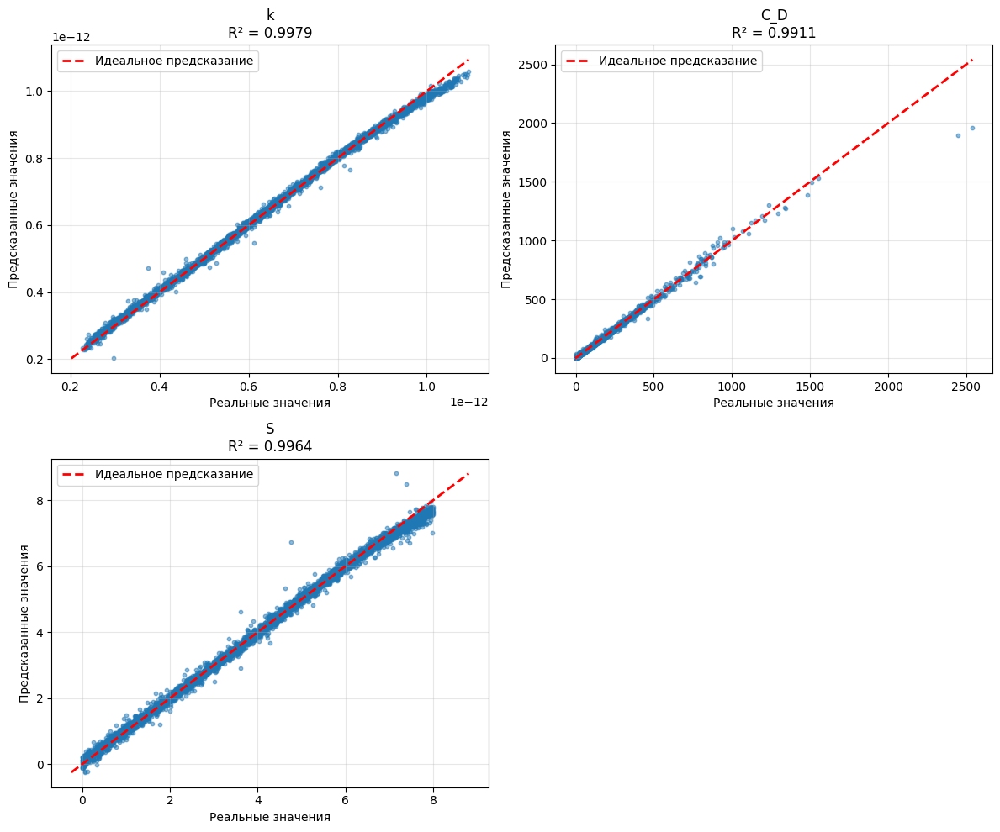

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


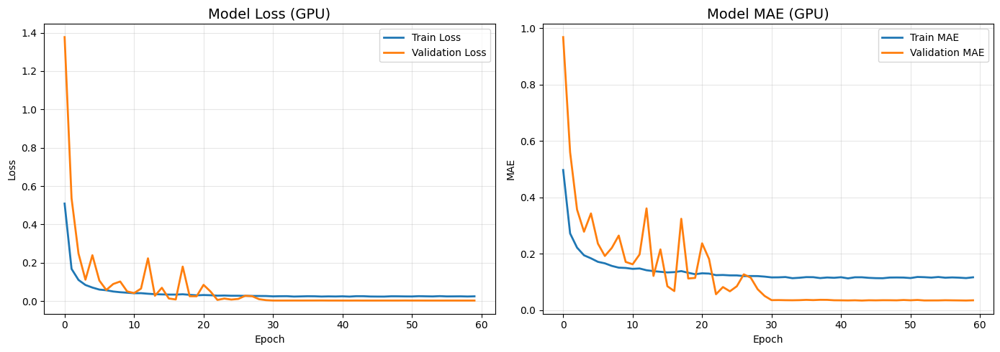

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_homogeneous_inf', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_homogeneous_inf.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_homogeneous_inf.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_homogeneous_inf_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_homogeneous_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_homogeneous_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение бесконечный пласт однородный пласт с различными кривыми в train, val

In [ ]:
!unzip /content/drive/MyDrive/datasets/homogeneous_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: homogeneous_inf/params/24.csv  
  inflating: homogeneous_inf/params/46.csv  
  inflating: homogeneous_inf/params/48.csv  
  inflating: homogeneous_inf/params/85.csv  
  inflating: homogeneous_inf/params/168.csv  
  inflating: homogeneous_inf/params/183.csv  
  inflating: homogeneous_inf/params/208.csv  
  inflating: homogeneous_inf/params/209.csv  
  inflating: homogeneous_inf/params/215.csv  
  inflating: homogeneous_inf/params/226.csv  
  inflating: homogeneous_inf/params/252.csv  
  inflating: homogeneous_inf/params/268.csv  
  inflating: homogeneous_inf/params/274.csv  
  inflating: homogeneous_inf/params/283.csv  
  inflating: homogeneous_inf/params/290.csv  
  inflating: homogeneous_inf/params/311.csv  
  inflating: homogeneous_inf/params/314.csv  
  inflating: homogeneous_inf/params/319.csv  
  inflating: homogeneous_inf/params/328.csv  
  inflating: homogeneous_inf/params/347.csv  
  inflating: hom

In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/homogeneous_inf',
    model_type=Model.HOMOGENEOUS_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k': np.float64(6.757901772841053e-13), 'C_D': np.float64(201.2886626617674), 'S': np.float64(2.9795346165694694), 'data_type': 'train'}


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 3).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 3).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 3).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler()
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTest1DCNN_REG(output_dim=3, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k', 'C_D', 'S']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.00005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
GPU не обнаружен, используется CPU

НАЧАЛО ОБУЧЕНИЯ НА CPU (REGRESSION)
Устройство: CPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 3)
Валидационные данные: X (2000, 128, 2), y (2000, 3)
Эпохи: 100
📊 TensorBoard logs will be saved to: training_checkpoints_regression/tensorboard/20260517_174500
   Profile mode: Disabled (CPU mode)

Epoch 1: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.6045 - mae: 0.6059 - mse: 0.6045
Epoch 1: val_loss improved from None to 0.80691, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3903 - mae: 0.4744 - mse: 0.3903 - val_loss: 0.8069 - val_mae: 0.7499 - val_mse: 0.8069 - learning_rate: 5.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 2/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1531 - mae: 0.3002 - mse: 0.1531
Epoch 2: val_loss improved from 0.80691 to 0.16330, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1378 - mae: 0.2850 - mse: 0.1378 - val_loss: 0.1633 - val_mae: 0.3272 - val_mse: 0.1633 - learning_rate: 5.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1048 - mae: 0.2475 - mse: 0.1048
Epoch 3: val_loss improved from 0.16330 to 0.05264, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0978 - mae: 0.2392 - mse: 0.0978 - val_loss: 0.0526 - val_mae: 0.1678 - val_mse: 0.0526 - learning_rate: 5.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 4/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0812 - mae: 0.2195 - mse: 0.0812
Epoch 4: val_loss improved from 0.05264 to 0.03391, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0786 - mae: 0.2153 - mse: 0.0786 - val_loss: 0.0339 - val_mae: 0.1287 - val_mse: 0.0339 - learning_rate: 5.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 5/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0738 - mae: 0.2101 - mse: 0.0738
Epoch 5: val_loss improved from 0.03391 to 0.03285, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0704 - mae: 0.2047 - mse: 0.0704 - val_loss: 0.0329 - val_mae: 0.1302 - val_mse: 0.0329 - learning_rate: 5.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0645 - mae: 0.1967 - mse: 0.0645
Epoch 6: val_loss improved from 0.03285 to 0.03218, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0656 - mae: 0.1981 - mse: 0.0656 - val_loss: 0.0322 - val_mae: 0.1205 - val_mse: 0.0322 - learning_rate: 5.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0585 - mae: 0.1882 - mse: 0.0585
Epoch 7: val_loss improved from 0.03218 to 0.02503, saving model to best_model_regression.h5



Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.0591 - mae: 0.1883 - mse: 0.0591 - val_loss: 0.0250 - val_mae: 0.1132 - val_mse: 0.0250 - learning_rate: 5.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 8/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0555 - mae: 0.1819 - mse: 0.0555
Epoch 8: val_loss improved from 0.02503 to 0.02309, saving model to best_model_regression.h5



Epoch 8: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0546 - mae: 0.1807 - mse: 0.0546 - val_loss: 0.0231 - val_mae: 0.1033 - val_mse: 0.0231 - learning_rate: 5.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 9/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0496 - mae: 0.1717 - mse: 0.0496
Epoch 9: val_loss improved from 0.02309 to 0.02097, saving model to best_model_regression.h5



Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.0514 - mae: 0.1749 - mse: 0.0514 - val_loss: 0.0210 - val_mae: 0.1033 - val_mse: 0.0210 - learning_rate: 5.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 10/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0532 - mae: 0.1768 - mse: 0.0532
Epoch 10: val_loss did not improve from 0.02097
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0505 - mae: 0.1734 - mse: 0.0505 - val_loss: 0.0234 - val_mae: 0.1085 - val_mse: 0.0234 - learning_rate: 5.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 11/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0500 - mae: 0.1739 - mse: 0.0500
Epoch 11: val_loss improved from 0.02097 to 0.01904, saving model to best_model_regression.h5



Epoch 11: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.0482 - mae: 0.1701 - mse: 0.0482 - val_loss: 0.0190 - val_mae: 0.0944 - val_mse: 0.0190 - learning_rate: 5.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 12/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0462 - mae: 0.1665 - mse: 0.0462
Epoch 12: val_loss improved from 0.01904 to 0.01507, saving model to best_model_regression.h5



Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0458 - mae: 0.1654 - mse: 0.0458 - val_loss: 0.0151 - val_mae: 0.0882 - val_mse: 0.0151 - learning_rate: 5.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 13/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0457 - mae: 0.1657 - mse: 0.0457
Epoch 13: val_loss did not improve from 0.01507
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0451 - mae: 0.1646 - mse: 0.0451 - val_loss: 0.0176 - val_mae: 0.0872 - val_mse: 0.0176 - learning_rate: 5.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 14/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0421 - mae: 0.1605 - mse: 0.0421
Epoch 14: val_loss did not improve from 0.01507
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.0426 - mae: 0.1603 - mse: 0.0426 - val_loss: 0.0155 - val_mae: 0.0843 - val_mse: 0.0155 - learnin


Epoch 15: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0412 - mae: 0.1573 - mse: 0.0412 - val_loss: 0.0148 - val_mae: 0.0807 - val_mse: 0.0148 - learning_rate: 5.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 16/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0410 - mae: 0.1562 - mse: 0.0410
Epoch 16: val_loss improved from 0.01479 to 0.01377, saving model to best_model_regression.h5



Epoch 16: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0411 - mae: 0.1573 - mse: 0.0411 - val_loss: 0.0138 - val_mae: 0.0817 - val_mse: 0.0138 - learning_rate: 5.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 17/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0408 - mae: 0.1568 - mse: 0.0408
Epoch 17: val_loss did not improve from 0.01377
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0405 - mae: 0.1563 - mse: 0.0405 - val_loss: 0.0161 - val_mae: 0.0851 - val_mse: 0.0161 - learning_rate: 5.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 18/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0405 - mae: 0.1562 - mse: 0.0405
Epoch 18: val_loss improved from 0.01377 to 0.01223, saving model to best_model_regression.h5



Epoch 18: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0410 - mae: 0.1567 - mse: 0.0410 - val_loss: 0.0122 - val_mae: 0.0725 - val_mse: 0.0122 - learning_rate: 5.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 19/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0399 - mae: 0.1558 - mse: 0.0399
Epoch 19: val_loss did not improve from 0.01223
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.0387 - mae: 0.1529 - mse: 0.0387 - val_loss: 0.0171 - val_mae: 0.0890 - val_mse: 0.0171 - learning_rate: 5.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 20/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0390 - mae: 0.1532 - mse: 0.0390
Epoch 20: val_loss did not improve from 0.01223
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0390 - mae: 0.1532 - mse: 0.0390 - val_loss: 0.0237 - val_mae: 0.1140 - val_mse: 0.0237 - learnin


Epoch 24: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0342 - mae: 0.1432 - mse: 0.0342 - val_loss: 0.0118 - val_mae: 0.0729 - val_mse: 0.0118 - learning_rate: 2.5000e-05

Epoch 25: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 25/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0346 - mae: 0.1437 - mse: 0.0346
Epoch 25: val_loss improved from 0.01183 to 0.01169, saving model to best_model_regression.h5



Epoch 25: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0326 - mae: 0.1399 - mse: 0.0326 - val_loss: 0.0117 - val_mae: 0.0738 - val_mse: 0.0117 - learning_rate: 2.5000e-05

Epoch 26: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 26/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0342 - mae: 0.1429 - mse: 0.0342
Epoch 26: val_loss did not improve from 0.01169
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0333 - mae: 0.1415 - mse: 0.0333 - val_loss: 0.0125 - val_mae: 0.0728 - val_mse: 0.0125 - learning_rate: 2.5000e-05

Epoch 27: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 27/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0317 - mae: 0.1377 - mse: 0.0317
Epoch 27: val_loss did not improve from 0.01169
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0337 - mae: 0.1419 - mse: 0.0337 - val_loss: 0.0149 - val_mae: 0.0853 - val_mse: 0.0149 - learnin


Epoch 28: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0324 - mae: 0.1397 - mse: 0.0324 - val_loss: 0.0107 - val_mae: 0.0750 - val_mse: 0.0107 - learning_rate: 2.5000e-05

Epoch 29: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 29/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0336 - mae: 0.1414 - mse: 0.0336
Epoch 29: val_loss improved from 0.01073 to 0.01019, saving model to best_model_regression.h5



Epoch 29: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0327 - mae: 0.1398 - mse: 0.0327 - val_loss: 0.0102 - val_mae: 0.0677 - val_mse: 0.0102 - learning_rate: 2.5000e-05

Epoch 30: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 30/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0322 - mae: 0.1385 - mse: 0.0322
Epoch 30: val_loss did not improve from 0.01019
219/219 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.0317 - mae: 0.1376 - mse: 0.0317 - val_loss: 0.0124 - val_mae: 0.0750 - val_mse: 0.0124 - learning_rate: 2.5000e-05

Epoch 31: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 31/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0321 - mae: 0.1390 - mse: 0.0321
Epoch 31: val_loss did not improve from 0.01019
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0311 - mae: 0.1367 - mse: 0.0311 - val_loss: 0.0106 - val_mae: 0.0676 - val_mse: 0.0106 - learni

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0079
  mae: 0.0578
  mse: 0.0079

📊 Регрессионные метрики (в исходном масштабе):

  k:
    MSE:  4.8878e-28
    MAE:  1.4790e-14
    R²:   0.9928

  C_D:
    MSE:  6.0999e+02
    MAE:  1.5938e+01
    R²:   0.9887

  S:
    MSE:  4.4708e-02
    MAE:  1.4290e-01
    R²:   0.9893


Количество выходов: 3
Форма y_test_orig: (4000, 3)
Results: 9.212113493903273e-14 1.0183546714226388e-12
Results: 1.000518832972409e-13 9.999906420338858e-13


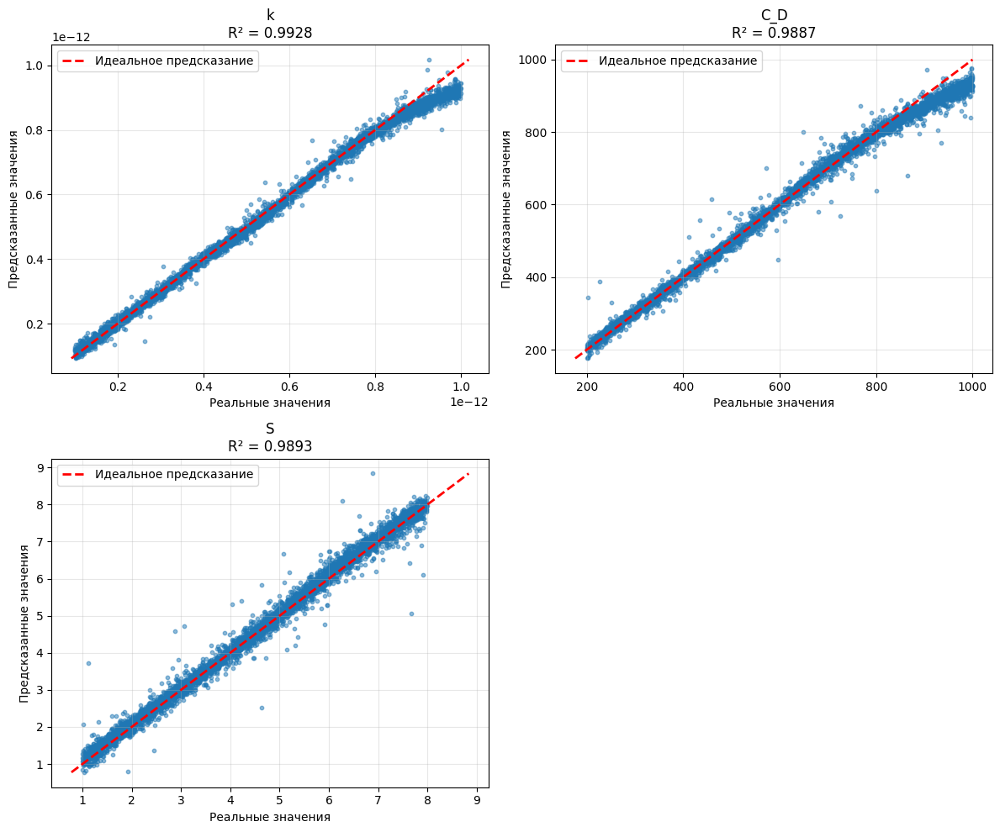

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


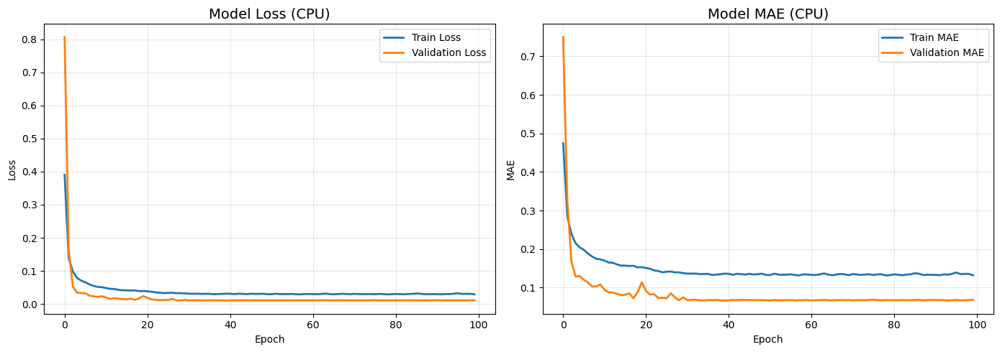

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_homogeneous_inf', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_homogeneous_inf.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_homogeneous_inf.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_homogeneous_inf_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_homogeneous_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_homogeneous_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to 1d_cnn_model_regression_homogeneous_inf_scaler_config.json


In [ ]:
# !kill 28197

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir training_checkpoints_regression/tensorboard

In [ ]:
# %tensorboard --logdir training_checkpoints_regression/tensorboard/20260506_192349

# Обучение: пласт с круговой границей

In [ ]:
!unzip /content/drive/MyDrive/homogeneous_fin.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: homogeneous_fin/params/24.csv  
  inflating: homogeneous_fin/params/46.csv  
  inflating: homogeneous_fin/params/48.csv  
  inflating: homogeneous_fin/params/85.csv  
  inflating: homogeneous_fin/params/168.csv  
  inflating: homogeneous_fin/params/183.csv  
  inflating: homogeneous_fin/params/208.csv  
  inflating: homogeneous_fin/params/209.csv  
  inflating: homogeneous_fin/params/215.csv  
  inflating: homogeneous_fin/params/226.csv  
  inflating: homogeneous_fin/params/252.csv  
  inflating: homogeneous_fin/params/268.csv  
  inflating: homogeneous_fin/params/274.csv  
  inflating: homogeneous_fin/params/283.csv  
  inflating: homogeneous_fin/params/290.csv  
  inflating: homogeneous_fin/params/311.csv  
  inflating: homogeneous_fin/params/314.csv  
  inflating: homogeneous_fin/params/319.csv  
  inflating: homogeneous_fin/params/328.csv  
  inflating: homogeneous_fin/params/347.csv  
  inflating: hom

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/homogeneous_fin',
    model_type=Model.HOMOGENEOUS_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 4).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 4).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 4).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler()
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

Transformed data:  0.2268840773191835 1.0965046983850606 0.6251536885057923
Transformed data:  0.2282084407372102 1.0927879891055232 0.6323693421038873
Transformed data:  0.22905834473892772 1.09372231943724 0.6237772188004105


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std


In [ ]:
model = WellTest1DCNN_REG(output_dim=4, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k', 'C_D', 'S', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=60,
    initial_lr=0.00005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 4)
Валидационные данные: X (2000, 128, 2), y (2000, 4)
Эпохи: 60

Epoch 1: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 1/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.7046 - mae: 0.6308 - mse: 0.7046
Epoch 1: val_loss improved from None to 1.64115, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - loss: 0.4696 - mae: 0.4998 - mse: 0.4696 - val_loss: 1.6412 - val_mae: 0.9946 - val_mse: 1.6412 - learning_rate: 5.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 2/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1995 - mae: 0.3264 - mse: 0.1995
Epoch 2: val_loss improved from 1.64115 to 0.46040, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1779 - mae: 0.3047 - mse: 0.1779 - val_loss: 0.4604 - val_mae: 0.4872 - val_mse: 0.4604 - learning_rate: 5.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 3/60
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1207 - mae: 0.2527 - mse: 0.1207
Epoch 3: val_loss improved from 0.46040 to 0.17228, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1151 - mae: 0.2456 - mse: 0.1151 - val_loss: 0.1723 - val_mae: 0.3083 - val_mse: 0.1723 - learning_rate: 5.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 4/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0978 - mae: 0.2234 - mse: 0.0978
Epoch 4: val_loss improved from 0.17228 to 0.09925, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0916 - mae: 0.2191 - mse: 0.0916 - val_loss: 0.0993 - val_mae: 0.2401 - val_mse: 0.0993 - learning_rate: 5.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 5/60
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0826 - mae: 0.2059 - mse: 0.0826
Epoch 5: val_loss improved from 0.09925 to 0.04753, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0767 - mae: 0.2022 - mse: 0.0767 - val_loss: 0.0475 - val_mae: 0.1482 - val_mse: 0.0475 - learning_rate: 5.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 6/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0704 - mae: 0.1925 - mse: 0.0704
Epoch 6: val_loss improved from 0.04753 to 0.02382, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0695 - mae: 0.1908 - mse: 0.0695 - val_loss: 0.0238 - val_mae: 0.1029 - val_mse: 0.0238 - learning_rate: 5.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 7/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0669 - mae: 0.1892 - mse: 0.0669
Epoch 7: val_loss did not improve from 0.02382
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0645 - mae: 0.1866 - mse: 0.0645 - val_loss: 0.0989 - val_mae: 0.2269 - val_mse: 0.0989 - learning_rate: 5.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 8/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0589 - mae: 0.1789 - mse: 0.0589
Epoch 8: val_loss did not improve from 0.02382
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0603 - mae: 0.1806 - mse: 0.0603 - val_loss: 0.0317 - val_mae: 0.1307 - val_mse: 0.0317 - learning_rate: 5.000


Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0567 - mae: 0.1755 - mse: 0.0567 - val_loss: 0.0213 - val_mae: 0.1010 - val_mse: 0.0213 - learning_rate: 5.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 10/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0531 - mae: 0.1714 - mse: 0.0531
Epoch 10: val_loss did not improve from 0.02131
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0533 - mae: 0.1699 - mse: 0.0533 - val_loss: 0.0506 - val_mae: 0.1782 - val_mse: 0.0506 - learning_rate: 5.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 11/60
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0544 - mae: 0.1724 - mse: 0.0544
Epoch 11: val_loss did not improve from 0.02131
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0514 - mae: 0.1673 - mse: 0.0514 - val_loss: 0.0339 - val_mae: 0.1415 - val_mse: 0.0339 - learning_rate: 


Epoch 14: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0462 - mae: 0.1598 - mse: 0.0462 - val_loss: 0.0165 - val_mae: 0.0943 - val_mse: 0.0165 - learning_rate: 5.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 15/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0439 - mae: 0.1564 - mse: 0.0439
Epoch 15: val_loss improved from 0.01650 to 0.01210, saving model to best_model_regression.h5



Epoch 15: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0443 - mae: 0.1572 - mse: 0.0443 - val_loss: 0.0121 - val_mae: 0.0814 - val_mse: 0.0121 - learning_rate: 5.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 16/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0408 - mae: 0.1510 - mse: 0.0408
Epoch 16: val_loss did not improve from 0.01210
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0432 - mae: 0.1539 - mse: 0.0432 - val_loss: 0.0626 - val_mae: 0.1954 - val_mse: 0.0626 - learning_rate: 5.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 17/60
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0435 - mae: 0.1562 - mse: 0.0435
Epoch 17: val_loss did not improve from 0.01210
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0418 - mae: 0.1528 - mse: 0.0418 - val_loss: 0.0192 - val_mae: 0.1034 - val_mse: 0.0192 - learning_rate:


Epoch 22: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0349 - mae: 0.1402 - mse: 0.0349 - val_loss: 0.0074 - val_mae: 0.0579 - val_mse: 0.0074 - learning_rate: 2.5000e-05

Epoch 23: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 23/60
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0328 - mae: 0.1348 - mse: 0.0328
Epoch 23: val_loss did not improve from 0.00743
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0340 - mae: 0.1363 - mse: 0.0340 - val_loss: 0.0079 - val_mae: 0.0623 - val_mse: 0.0079 - learning_rate: 2.5000e-05

Epoch 24: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 24/60
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0352 - mae: 0.1408 - mse: 0.0352
Epoch 24: val_loss improved from 0.00743 to 0.00682, saving model to best_model_regression.h5



Epoch 24: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0353 - mae: 0.1410 - mse: 0.0353 - val_loss: 0.0068 - val_mae: 0.0562 - val_mse: 0.0068 - learning_rate: 2.5000e-05

Epoch 25: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 25/60
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0317 - mae: 0.1332 - mse: 0.0317
Epoch 25: val_loss did not improve from 0.00682
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0324 - mae: 0.1348 - mse: 0.0324 - val_loss: 0.0111 - val_mae: 0.0766 - val_mse: 0.0111 - learning_rate: 2.5000e-05

Epoch 26: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 26/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0330 - mae: 0.1349 - mse: 0.0330
Epoch 26: val_loss did not improve from 0.00682
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0336 - mae: 0.1370 - mse: 0.0336 - val_loss: 0.0092 - val_mae: 0.0705 - val_mse: 0.0092 - learning_rate:


Epoch 30: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0316 - mae: 0.1329 - mse: 0.0316 - val_loss: 0.0057 - val_mae: 0.0497 - val_mse: 0.0057 - learning_rate: 1.2500e-05

Epoch 31: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 31/60
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0307 - mae: 0.1308 - mse: 0.0307
Epoch 31: val_loss improved from 0.00569 to 0.00541, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0306 - mae: 0.1307 - mse: 0.0306 - val_loss: 0.0054 - val_mae: 0.0489 - val_mse: 0.0054 - learning_rate: 1.2500e-06

Epoch 32: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 32/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0320 - mae: 0.1306 - mse: 0.0320
Epoch 32: val_loss improved from 0.00541 to 0.00508, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0304 - mae: 0.1300 - mse: 0.0304 - val_loss: 0.0051 - val_mae: 0.0470 - val_mse: 0.0051 - learning_rate: 1.2500e-06

Epoch 33: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 33/60
209/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0293 - mae: 0.1285 - mse: 0.0293
Epoch 33: val_loss did not improve from 0.00508
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0295 - mae: 0.1285 - mse: 0.0295 - val_loss: 0.0052 - val_mae: 0.0478 - val_mse: 0.0052 - learning_rate: 1.2500e-06

Epoch 34: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 34/60
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0318 - mae: 0.1313 - mse: 0.0318
Epoch 34: val_loss did not improve from 0.00508
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0304 - mae: 0.1302 - mse: 0.0304 - val_loss: 0.0058 - val_mae: 0.0510 - val_mse: 0.0058 - learning_rate:


Epoch 35: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0292 - mae: 0.1279 - mse: 0.0292 - val_loss: 0.0050 - val_mae: 0.0474 - val_mse: 0.0050 - learning_rate: 1.2500e-06

Epoch 36: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 36/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0298 - mae: 0.1298 - mse: 0.0298
Epoch 36: val_loss did not improve from 0.00503
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0308 - mae: 0.1311 - mse: 0.0308 - val_loss: 0.0050 - val_mae: 0.0469 - val_mse: 0.0050 - learning_rate: 1.2500e-06

Epoch 37: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 37/60
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0300 - mae: 0.1297 - mse: 0.0300
Epoch 37: val_loss improved from 0.00503 to 0.00496, saving model to best_model_regression.h5



Epoch 37: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0300 - mae: 0.1298 - mse: 0.0300 - val_loss: 0.0050 - val_mae: 0.0464 - val_mse: 0.0050 - learning_rate: 1.2500e-06

Epoch 38: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 38/60
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0296 - mae: 0.1291 - mse: 0.0296
Epoch 38: val_loss did not improve from 0.00496
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0303 - mae: 0.1297 - mse: 0.0303 - val_loss: 0.0055 - val_mae: 0.0492 - val_mse: 0.0055 - learning_rate: 1.2500e-06

Epoch 39: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 39/60
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0292 - mae: 0.1283 - mse: 0.0292
Epoch 39: val_loss did not improve from 0.00496
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0300 - mae: 0.1295 - mse: 0.0300 - val_loss: 0.0050 - val_mae: 0.0467 - val_mse: 0.0050 - learning_rate:


Epoch 40: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0301 - mae: 0.1297 - mse: 0.0301 - val_loss: 0.0049 - val_mae: 0.0463 - val_mse: 0.0049 - learning_rate: 1.2500e-06

Epoch 41: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 41/60
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0310 - mae: 0.1322 - mse: 0.0310
Epoch 41: val_loss did not improve from 0.00490
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0304 - mae: 0.1308 - mse: 0.0304 - val_loss: 0.0051 - val_mae: 0.0469 - val_mse: 0.0051 - learning_rate: 1.2500e-06

Epoch 42: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 42/60
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0281 - mae: 0.1265 - mse: 0.0281
Epoch 42: val_loss did not improve from 0.00490

Epoch 42: ReduceLROnPlateau reducing learning rate to 1e-06.
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0287 - mae: 0.1272 - mse: 0.0287 - val_los

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0058
  mae: 0.0461
  mse: 0.0058

📊 Регрессионные метрики (в исходном масштабе):

  k:
    MSE:  1.9965e-28
    MAE:  9.8244e-15
    R²:   0.9958

  C_D:
    MSE:  2.1973e+02
    MAE:  6.5654e+00
    R²:   0.9921

  S:
    MSE:  3.9434e-02
    MAE:  1.3064e-01
    R²:   0.9927

  r_D_e:
    MSE:  2.1835e+04
    MAE:  1.0970e+02
    R²:   0.9968


Количество выходов: 4
Форма y_test_orig: (4000, 4)
Results: 1.9692448084522585e-13 1.0516844556676674e-12
Results: 2.2905834473892773e-13 1.0937223194372401e-12


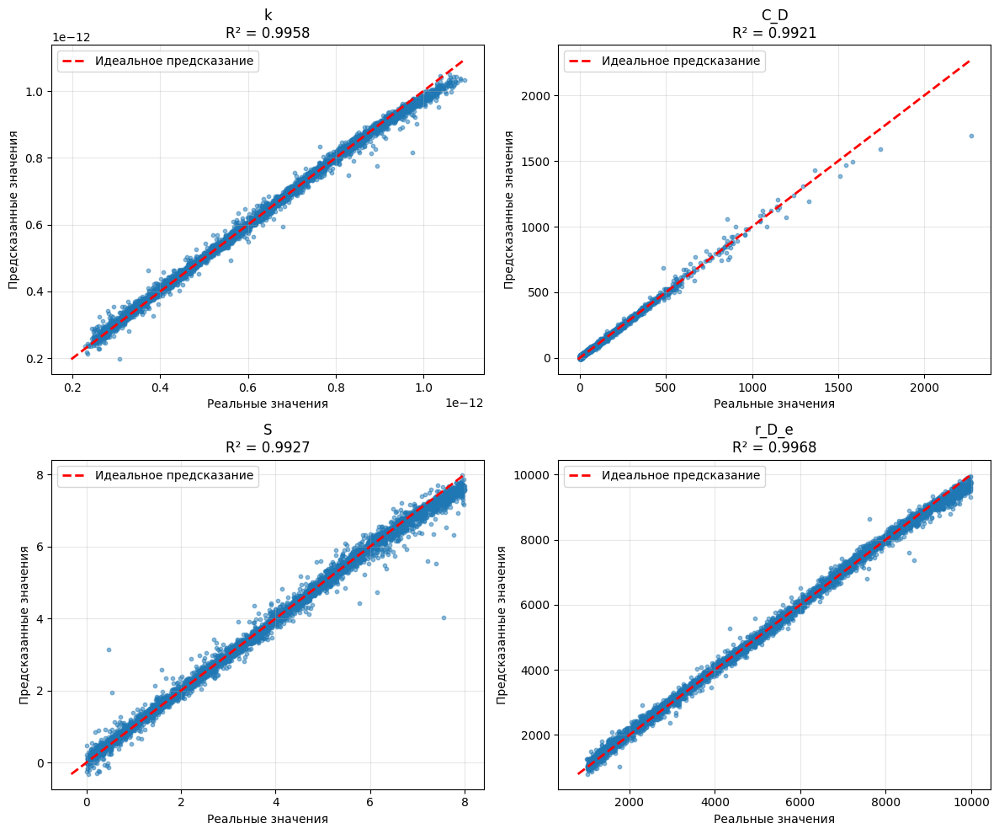

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


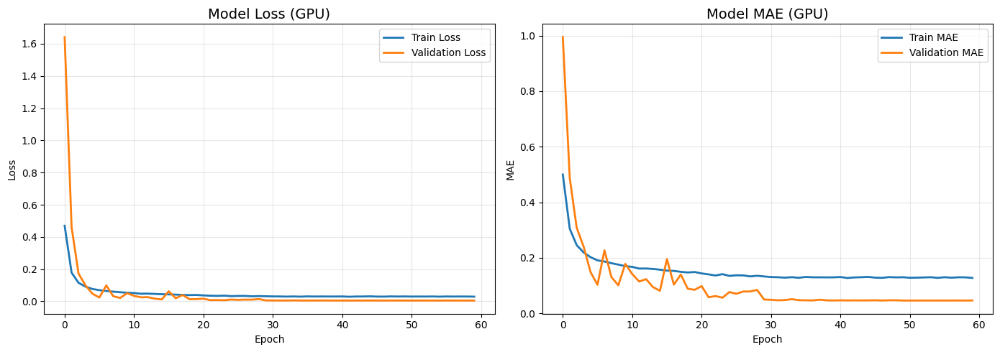

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_homogeneous_fin', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_homogeneous_fin.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_homogeneous_fin.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_homogeneous_fin_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_homogeneous_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_homogeneous_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение: пласт с круговой границей c разными val, train, test

In [ ]:
!unzip /content/drive/MyDrive/datasets/homogeneous_fin.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: homogeneous_fin/params/24.csv  
  inflating: homogeneous_fin/params/46.csv  
  inflating: homogeneous_fin/params/48.csv  
  inflating: homogeneous_fin/params/85.csv  
  inflating: homogeneous_fin/params/168.csv  
  inflating: homogeneous_fin/params/183.csv  
  inflating: homogeneous_fin/params/208.csv  
  inflating: homogeneous_fin/params/209.csv  
  inflating: homogeneous_fin/params/215.csv  
  inflating: homogeneous_fin/params/226.csv  
  inflating: homogeneous_fin/params/252.csv  
  inflating: homogeneous_fin/params/268.csv  
  inflating: homogeneous_fin/params/274.csv  
  inflating: homogeneous_fin/params/283.csv  
  inflating: homogeneous_fin/params/290.csv  
  inflating: homogeneous_fin/params/311.csv  
  inflating: homogeneous_fin/params/314.csv  
  inflating: homogeneous_fin/params/319.csv  
  inflating: homogeneous_fin/params/328.csv  
  inflating: homogeneous_fin/params/347.csv  
  inflating: hom

In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/homogeneous_fin',
    model_type=Model.HOMOGENEOUS_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k': np.float64(9.050879602375485e-14), 'C_D': np.float64(295.6409772468441), 'S': np.float64(0.7975763006314834), 'r_D_e': np.float64(8544.43796238808), 'data_type': 'train'}


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 4).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 4).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 4).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler()
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTest1DCNN_REG(output_dim=4, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k', 'C_D', 'S', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.00005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
GPU не обнаружен, используется CPU

НАЧАЛО ОБУЧЕНИЯ НА CPU (REGRESSION)
Устройство: CPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 4)
Валидационные данные: X (2000, 128, 2), y (2000, 4)
Эпохи: 100
📊 TensorBoard logs will be saved to: training_checkpoints_regression/tensorboard/20260517_175744
   Profile mode: Disabled (CPU mode)

Epoch 1: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.7298 - mae: 0.6822 - mse: 0.7298
Epoch 1: val_loss improved from None to 0.94695, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.4794 - mae: 0.5346 - mse: 0.4794 - val_loss: 0.9470 - val_mae: 0.8067 - val_mse: 0.9470 - learning_rate: 5.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 2/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2114 - mae: 0.3494 - mse: 0.2114
Epoch 2: val_loss improved from 0.94695 to 0.20548, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1923 - mae: 0.3310 - mse: 0.1923 - val_loss: 0.2055 - val_mae: 0.3453 - val_mse: 0.2055 - learning_rate: 5.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1490 - mae: 0.2905 - mse: 0.1490
Epoch 3: val_loss improved from 0.20548 to 0.07102, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.1416 - mae: 0.2821 - mse: 0.1416 - val_loss: 0.0710 - val_mae: 0.1839 - val_mse: 0.0710 - learning_rate: 5.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1249 - mae: 0.2631 - mse: 0.1249
Epoch 4: val_loss did not improve from 0.07102
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1206 - mae: 0.2579 - mse: 0.1206 - val_loss: 0.0726 - val_mae: 0.1928 - val_mse: 0.0726 - learning_rate: 5.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 5/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1090 - mae: 0.2459 - mse: 0.1090
Epoch 5: val_loss did not improve from 0.07102
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1067 - mae: 0.2429 - mse: 0.1067 - val_loss: 0.0866 - val_mae: 0.2140 - val_mse: 0.0866 - learning_rate:


Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.1009 - mae: 0.2361 - mse: 0.1009 - val_loss: 0.0500 - val_mae: 0.1478 - val_mse: 0.0500 - learning_rate: 5.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0924 - mae: 0.2244 - mse: 0.0924
Epoch 7: val_loss improved from 0.04999 to 0.04319, saving model to best_model_regression.h5



Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0906 - mae: 0.2223 - mse: 0.0906 - val_loss: 0.0432 - val_mae: 0.1357 - val_mse: 0.0432 - learning_rate: 5.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 8/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0881 - mae: 0.2178 - mse: 0.0881
Epoch 8: val_loss did not improve from 0.04319
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0867 - mae: 0.2168 - mse: 0.0867 - val_loss: 0.0572 - val_mae: 0.1613 - val_mse: 0.0572 - learning_rate: 5.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 9/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0831 - mae: 0.2127 - mse: 0.0831
Epoch 9: val_loss improved from 0.04319 to 0.04270, saving model to best_model_regression.h5



Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.0839 - mae: 0.2135 - mse: 0.0839 - val_loss: 0.0427 - val_mae: 0.1337 - val_mse: 0.0427 - learning_rate: 5.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 10/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0790 - mae: 0.2077 - mse: 0.0790
Epoch 10: val_loss did not improve from 0.04270
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.0778 - mae: 0.2051 - mse: 0.0778 - val_loss: 0.0474 - val_mae: 0.1455 - val_mse: 0.0474 - learning_rate: 5.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 11/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0758 - mae: 0.2024 - mse: 0.0758
Epoch 11: val_loss improved from 0.04270 to 0.04126, saving model to best_model_regression.h5



Epoch 11: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0763 - mae: 0.2030 - mse: 0.0763 - val_loss: 0.0413 - val_mae: 0.1307 - val_mse: 0.0413 - learning_rate: 5.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 12/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0746 - mae: 0.1999 - mse: 0.0746
Epoch 12: val_loss did not improve from 0.04126
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.0748 - mae: 0.2005 - mse: 0.0748 - val_loss: 0.0547 - val_mae: 0.1604 - val_mse: 0.0547 - learning_rate: 5.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 13/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0753 - mae: 0.2016 - mse: 0.0753
Epoch 13: val_loss improved from 0.04126 to 0.03596, saving model to best_model_regression.h5



Epoch 13: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0723 - mae: 0.1978 - mse: 0.0723 - val_loss: 0.0360 - val_mae: 0.1235 - val_mse: 0.0360 - learning_rate: 5.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 14/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0697 - mae: 0.1937 - mse: 0.0697
Epoch 14: val_loss improved from 0.03596 to 0.03385, saving model to best_model_regression.h5



Epoch 14: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0707 - mae: 0.1946 - mse: 0.0707 - val_loss: 0.0338 - val_mae: 0.1128 - val_mse: 0.0338 - learning_rate: 5.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 15/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0659 - mae: 0.1885 - mse: 0.0659
Epoch 15: val_loss did not improve from 0.03385
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.0677 - mae: 0.1904 - mse: 0.0677 - val_loss: 0.0339 - val_mae: 0.1159 - val_mse: 0.0339 - learning_rate: 5.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 16/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0661 - mae: 0.1884 - mse: 0.0661
Epoch 16: val_loss did not improve from 0.03385
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.0653 - mae: 0.1869 - mse: 0.0653 - val_loss: 0.0369 - val_mae: 0.1196 - val_mse: 0.0369 - learnin


Epoch 17: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0648 - mae: 0.1859 - mse: 0.0648 - val_loss: 0.0320 - val_mae: 0.1168 - val_mse: 0.0320 - learning_rate: 5.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 18/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0636 - mae: 0.1838 - mse: 0.0636
Epoch 18: val_loss did not improve from 0.03202
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0629 - mae: 0.1827 - mse: 0.0629 - val_loss: 0.0365 - val_mae: 0.1296 - val_mse: 0.0365 - learning_rate: 5.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 19/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0640 - mae: 0.1853 - mse: 0.0640
Epoch 19: val_loss did not improve from 0.03202
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0632 - mae: 0.1840 - mse: 0.0632 - val_loss: 0.0360 - val_mae: 0.1207 - val_mse: 0.0360 - learnin


Epoch 22: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0582 - mae: 0.1752 - mse: 0.0582 - val_loss: 0.0295 - val_mae: 0.1116 - val_mse: 0.0295 - learning_rate: 5.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 23/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0591 - mae: 0.1766 - mse: 0.0591
Epoch 23: val_loss did not improve from 0.02950
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.0584 - mae: 0.1756 - mse: 0.0584 - val_loss: 0.0295 - val_mae: 0.1095 - val_mse: 0.0295 - learning_rate: 5.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 24/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0596 - mae: 0.1788 - mse: 0.0596
Epoch 24: val_loss improved from 0.02950 to 0.02535, saving model to best_model_regression.h5



Epoch 24: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0596 - mae: 0.1776 - mse: 0.0596 - val_loss: 0.0254 - val_mae: 0.0982 - val_mse: 0.0254 - learning_rate: 5.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 25/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0570 - mae: 0.1728 - mse: 0.0570
Epoch 25: val_loss did not improve from 0.02535
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0570 - mae: 0.1738 - mse: 0.0570 - val_loss: 0.0267 - val_mae: 0.1030 - val_mse: 0.0267 - learning_rate: 5.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 26/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0558 - mae: 0.1714 - mse: 0.0558
Epoch 26: val_loss did not improve from 0.02535
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0572 - mae: 0.1733 - mse: 0.0572 - val_loss: 0.0306 - val_mae: 0.1139 - val_mse: 0.0306 - learnin


Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0501 - mae: 0.1612 - mse: 0.0501 - val_loss: 0.0252 - val_mae: 0.0935 - val_mse: 0.0252 - learning_rate: 2.5000e-06

Epoch 33: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 33/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0514 - mae: 0.1643 - mse: 0.0514
Epoch 33: val_loss did not improve from 0.02519
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0501 - mae: 0.1619 - mse: 0.0501 - val_loss: 0.0254 - val_mae: 0.0935 - val_mse: 0.0254 - learning_rate: 2.5000e-06

Epoch 34: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 34/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0488 - mae: 0.1585 - mse: 0.0488
Epoch 34: val_loss improved from 0.02519 to 0.02494, saving model to best_model_regression.h5



Epoch 34: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.0495 - mae: 0.1608 - mse: 0.0495 - val_loss: 0.0249 - val_mae: 0.0928 - val_mse: 0.0249 - learning_rate: 2.5000e-06

Epoch 35: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 35/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0489 - mae: 0.1593 - mse: 0.0489
Epoch 35: val_loss did not improve from 0.02494
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0490 - mae: 0.1594 - mse: 0.0490 - val_loss: 0.0252 - val_mae: 0.0933 - val_mse: 0.0252 - learning_rate: 2.5000e-06

Epoch 36: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 36/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0501 - mae: 0.1607 - mse: 0.0501
Epoch 36: val_loss did not improve from 0.02494
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0494 - mae: 0.1595 - mse: 0.0494 - val_loss: 0.0255 - val_mae: 0.0939 - val_mse: 0.0255 - learnin


Epoch 38: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0495 - mae: 0.1606 - mse: 0.0495 - val_loss: 0.0247 - val_mae: 0.0916 - val_mse: 0.0247 - learning_rate: 2.5000e-06

Epoch 39: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 39/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0508 - mae: 0.1622 - mse: 0.0508
Epoch 39: val_loss did not improve from 0.02466
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0499 - mae: 0.1611 - mse: 0.0499 - val_loss: 0.0252 - val_mae: 0.0932 - val_mse: 0.0252 - learning_rate: 2.5000e-06

Epoch 40: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 40/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0499 - mae: 0.1606 - mse: 0.0499
Epoch 40: val_loss did not improve from 0.02466
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0490 - mae: 0.1593 - mse: 0.0490 - val_loss: 0.0250 - val_mae: 0.0924 - val_mse: 0.0250 - learnin


Epoch 62: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.0491 - mae: 0.1600 - mse: 0.0491 - val_loss: 0.0244 - val_mae: 0.0914 - val_mse: 0.0244 - learning_rate: 1.0000e-07

Epoch 63: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 63/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0494 - mae: 0.1596 - mse: 0.0494
Epoch 63: val_loss did not improve from 0.02443
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0498 - mae: 0.1610 - mse: 0.0498 - val_loss: 0.0248 - val_mae: 0.0919 - val_mse: 0.0248 - learning_rate: 1.0000e-07

Epoch 64: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 64/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0489 - mae: 0.1602 - mse: 0.0489
Epoch 64: val_loss did not improve from 0.02443
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0494 - mae: 0.1611 - mse: 0.0494 - val_loss: 0.0247 - val_mae: 0.0921 - val_mse: 0.0247 - learn


Epoch 65: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.0496 - mae: 0.1610 - mse: 0.0496 - val_loss: 0.0243 - val_mae: 0.0913 - val_mse: 0.0243 - learning_rate: 1.0000e-07

Epoch 66: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 66/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0480 - mae: 0.1579 - mse: 0.0480
Epoch 66: val_loss did not improve from 0.02432
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0481 - mae: 0.1577 - mse: 0.0481 - val_loss: 0.0249 - val_mae: 0.0923 - val_mse: 0.0249 - learning_rate: 1.0000e-07

Epoch 67: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 67/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0494 - mae: 0.1602 - mse: 0.0494
Epoch 67: val_loss did not improve from 0.02432
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0489 - mae: 0.1595 - mse: 0.0489 - val_loss: 0.0247 - val_mae: 0.0919 - val_mse: 0.0247 - learn

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0159
  mae: 0.0764
  mse: 0.0159

📊 Регрессионные метрики (в исходном масштабе):

  k:
    MSE:  7.2955e-28
    MAE:  1.8269e-14
    R²:   0.9893

  C_D:
    MSE:  7.5711e+02
    MAE:  1.8310e+01
    R²:   0.9859

  S:
    MSE:  7.5763e-02
    MAE:  1.8770e-01
    R²:   0.9814

  r_D_e:
    MSE:  1.5198e+05
    MAE:  2.0976e+02
    R²:   0.9714


Количество выходов: 4
Форма y_test_orig: (4000, 4)
Results: 7.970702006407371e-14 1.0352865483301277e-12
Results: 1.0027474413900133e-13 9.996084298621007e-13


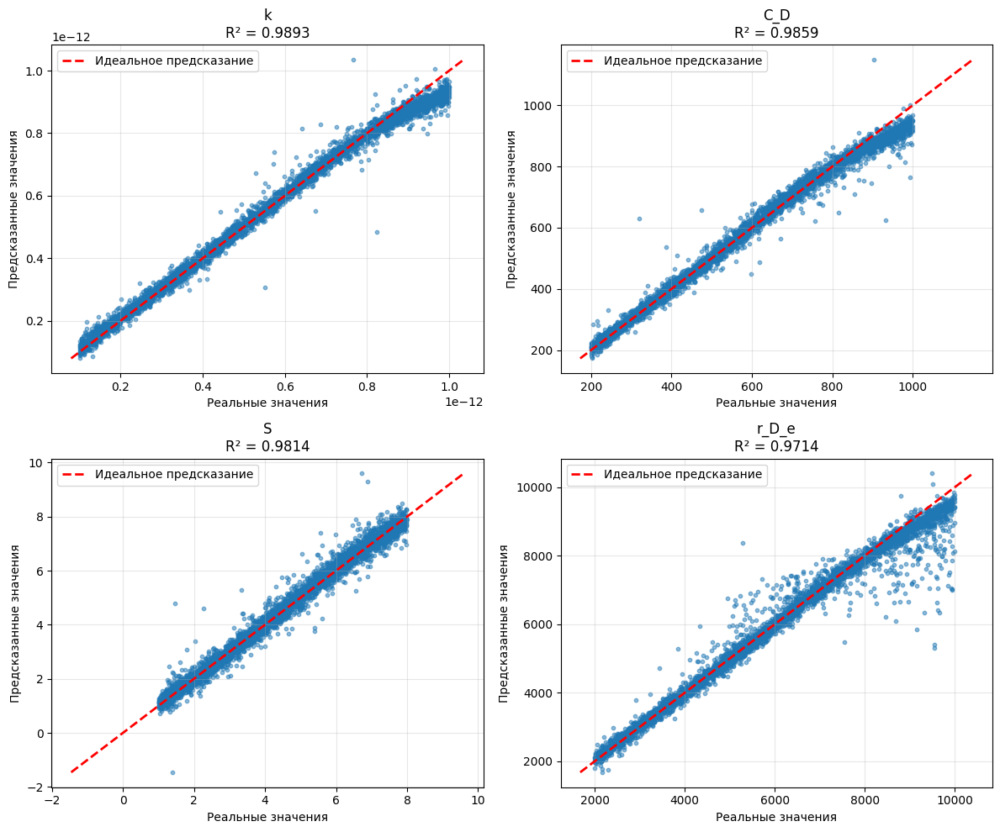

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


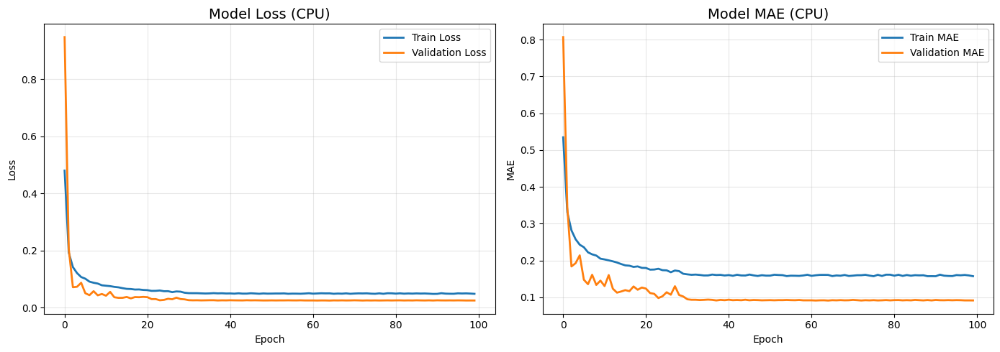

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_homogeneous_fin', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_homogeneous_fin.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_homogeneous_fin.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_homogeneous_fin_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_homogeneous_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_homogeneous_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to 1d_cnn_model_regression_homogeneous_fin_scaler_config.json


# Обучение для модели двойной пористости с бесконечной границей

In [ ]:
!unzip /content/drive/MyDrive/dual_porosity_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_porosity_inf/params/24.csv  
  inflating: dual_porosity_inf/params/46.csv  
  inflating: dual_porosity_inf/params/48.csv  
  inflating: dual_porosity_inf/params/85.csv  
  inflating: dual_porosity_inf/params/168.csv  
  inflating: dual_porosity_inf/params/183.csv  
  inflating: dual_porosity_inf/params/208.csv  
  inflating: dual_porosity_inf/params/209.csv  
  inflating: dual_porosity_inf/params/215.csv  
  inflating: dual_porosity_inf/params/226.csv  
  inflating: dual_porosity_inf/params/252.csv  
  inflating: dual_porosity_inf/params/268.csv  
  inflating: dual_porosity_inf/params/274.csv  
  inflating: dual_porosity_inf/params/283.csv  
  inflating: dual_porosity_inf/params/290.csv  
  inflating: dual_porosity_inf/params/311.csv  
  inflating: dual_porosity_inf/params/314.csv  
  inflating: dual_porosity_inf/params/319.csv  
  inflating: dual_porosity_inf/params/328.csv  
  inflating: dual_porosi

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/dual_porosity_inf',
    model_type=Model.DUAL_POROSITY_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
# убран бесполезный фильтр по lambda (lambda всегда <= 1e-5, фильтр никогда не срабатывал)


Train: 14000 -> 12363 (удалено: 1637)
Val:   2000 -> 1771 (удалено: 229)
Test:  4000 -> 3538 (удалено: 462)

Новые формы:
X_train_filtered shape: (12363, 128, 2)
y_train_filtered shape: (12363, 5, 1)


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 5).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 5).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 5).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)


Transformed data:  0.22744389494681308 1.0979859649190093 0.6279695716283913
Transformed data:  0.22735644499447819 1.0902730511007752 0.6328264699100914
Transformed data:  0.2300345798010112 1.084612521179152 0.6315361821016328


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std


In [ ]:
# убран мёртвый код: X_train_norm не используется в обучении;
# normalize() делает per-sample min-max и уничтожила бы межсэмпловую вариацию k


In [ ]:
model = WellTest1DCNN_REG(output_dim=5, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k_f', 'C_D', 'S', 'omega', 'lambda']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.00005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (12363, 128, 2), y (12363, 5)
Валидационные данные: X (1771, 128, 2), y (1771, 5)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 1/100
194/194 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.9313 - mae: 0.6533 - mse: 0.9313
Epoch 1: val_loss improved from None to 1.45802, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.7256 - mae: 0.5517 - mse: 0.7256 - val_loss: 1.4580 - val_mae: 0.8444 - val_mse: 1.4580 - learning_rate: 5.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 2/100
188/194 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4897 - mae: 0.4254 - mse: 0.4897
Epoch 2: val_loss improved from 1.45802 to 0.82109, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.4463 - mae: 0.4034 - mse: 0.4463 - val_loss: 0.8211 - val_mae: 0.5795 - val_mse: 0.8211 - learning_rate: 5.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 3/100
188/194 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3461 - mae: 0.3508 - mse: 0.3461
Epoch 3: val_loss improved from 0.82109 to 0.50249, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.3282 - mae: 0.3428 - mse: 0.3282 - val_loss: 0.5025 - val_mae: 0.4611 - val_mse: 0.5025 - learning_rate: 5.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 4/100
191/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2535 - mae: 0.3129 - mse: 0.2535
Epoch 4: val_loss improved from 0.50249 to 0.25803, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.2485 - mae: 0.3100 - mse: 0.2485 - val_loss: 0.2580 - val_mae: 0.3161 - val_mse: 0.2580 - learning_rate: 5.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 5/100
183/194 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2091 - mae: 0.2913 - mse: 0.2091
Epoch 5: val_loss improved from 0.25803 to 0.19740, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1971 - mae: 0.2848 - mse: 0.1971 - val_loss: 0.1974 - val_mae: 0.2645 - val_mse: 0.1974 - learning_rate: 5.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 6/100
183/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1674 - mae: 0.2657 - mse: 0.1674
Epoch 6: val_loss improved from 0.19740 to 0.17090, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1623 - mae: 0.2610 - mse: 0.1623 - val_loss: 0.1709 - val_mae: 0.2467 - val_mse: 0.1709 - learning_rate: 5.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 7/100
191/194 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1419 - mae: 0.2470 - mse: 0.1419
Epoch 7: val_loss improved from 0.17090 to 0.13264, saving model to best_model_regression.h5



Epoch 7: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1422 - mae: 0.2448 - mse: 0.1422 - val_loss: 0.1326 - val_mae: 0.2256 - val_mse: 0.1326 - learning_rate: 5.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 8/100
189/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1342 - mae: 0.2370 - mse: 0.1342
Epoch 8: val_loss did not improve from 0.13264
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1259 - mae: 0.2314 - mse: 0.1259 - val_loss: 0.1462 - val_mae: 0.2290 - val_mse: 0.1462 - learning_rate: 5.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 9/100
188/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1134 - mae: 0.2220 - mse: 0.1134
Epoch 9: val_loss did not improve from 0.13264
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1121 - mae: 0.2196 - mse: 0.1121 - val_loss: 0.1745 - val_mae: 0.2649 - val_mse: 0.1745 - learning_rate: 5.00


Epoch 11: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0983 - mae: 0.2075 - mse: 0.0983 - val_loss: 0.1002 - val_mae: 0.1902 - val_mse: 0.1002 - learning_rate: 5.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 12/100
192/194 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1008 - mae: 0.2065 - mse: 0.1008
Epoch 12: val_loss did not improve from 0.10021
194/194 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0954 - mae: 0.2026 - mse: 0.0954 - val_loss: 0.1436 - val_mae: 0.2452 - val_mse: 0.1436 - learning_rate: 5.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 13/100
187/194 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0907 - mae: 0.1977 - mse: 0.0907
Epoch 13: val_loss improved from 0.10021 to 0.07064, saving model to best_model_regression.h5



Epoch 13: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0895 - mae: 0.1964 - mse: 0.0895 - val_loss: 0.0706 - val_mae: 0.1504 - val_mse: 0.0706 - learning_rate: 5.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 14/100
186/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0869 - mae: 0.1974 - mse: 0.0869
Epoch 14: val_loss improved from 0.07064 to 0.07006, saving model to best_model_regression.h5



Epoch 14: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0843 - mae: 0.1934 - mse: 0.0843 - val_loss: 0.0701 - val_mae: 0.1504 - val_mse: 0.0701 - learning_rate: 5.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 15/100
190/194 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0828 - mae: 0.1897 - mse: 0.0828
Epoch 15: val_loss did not improve from 0.07006
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0817 - mae: 0.1889 - mse: 0.0817 - val_loss: 0.1263 - val_mae: 0.2487 - val_mse: 0.1263 - learning_rate: 5.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 16/100
189/194 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0760 - mae: 0.1859 - mse: 0.0760
Epoch 16: val_loss did not improve from 0.07006
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0778 - mae: 0.1855 - mse: 0.0778 - val_loss: 0.2661 - val_mae: 0.3338 - val_mse: 0.2661 - learning_rat


Epoch 17: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0779 - mae: 0.1841 - mse: 0.0779 - val_loss: 0.0563 - val_mae: 0.1266 - val_mse: 0.0563 - learning_rate: 5.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 18/100
189/194 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0717 - mae: 0.1770 - mse: 0.0717
Epoch 18: val_loss did not improve from 0.05627
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0708 - mae: 0.1771 - mse: 0.0708 - val_loss: 0.1185 - val_mae: 0.2231 - val_mse: 0.1185 - learning_rate: 5.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 19/100
191/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0695 - mae: 0.1751 - mse: 0.0695
Epoch 19: val_loss did not improve from 0.05627
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0694 - mae: 0.1735 - mse: 0.0694 - val_loss: 0.0622 - val_mae: 0.1490 - val_mse: 0.0622 - learning_rat


Epoch 23: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0606 - mae: 0.1630 - mse: 0.0606 - val_loss: 0.0554 - val_mae: 0.1203 - val_mse: 0.0554 - learning_rate: 2.5000e-05

Epoch 24: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 24/100
186/194 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0587 - mae: 0.1604 - mse: 0.0587
Epoch 24: val_loss improved from 0.05542 to 0.05124, saving model to best_model_regression.h5



Epoch 24: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0593 - mae: 0.1608 - mse: 0.0593 - val_loss: 0.0512 - val_mae: 0.1327 - val_mse: 0.0512 - learning_rate: 2.5000e-05

Epoch 25: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 25/100
194/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0595 - mae: 0.1627 - mse: 0.0595
Epoch 25: val_loss did not improve from 0.05124
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0594 - mae: 0.1625 - mse: 0.0594 - val_loss: 0.0553 - val_mae: 0.1283 - val_mse: 0.0553 - learning_rate: 2.5000e-05

Epoch 26: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 26/100
187/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0588 - mae: 0.1625 - mse: 0.0588
Epoch 26: val_loss did not improve from 0.05124
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0584 - mae: 0.1610 - mse: 0.0584 - val_loss: 0.0569 - val_mae: 0.1515 - val_mse: 0.0569 - learning_rat


Epoch 27: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0577 - mae: 0.1596 - mse: 0.0577 - val_loss: 0.0502 - val_mae: 0.1259 - val_mse: 0.0502 - learning_rate: 2.5000e-05

Epoch 28: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 28/100
183/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0558 - mae: 0.1585 - mse: 0.0558
Epoch 28: val_loss did not improve from 0.05024
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0567 - mae: 0.1589 - mse: 0.0567 - val_loss: 0.0530 - val_mae: 0.1313 - val_mse: 0.0530 - learning_rate: 2.5000e-05

Epoch 29: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 29/100
193/194 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0520 - mae: 0.1535 - mse: 0.0520
Epoch 29: val_loss improved from 0.05024 to 0.04974, saving model to best_model_regression.h5



Epoch 29: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0549 - mae: 0.1567 - mse: 0.0549 - val_loss: 0.0497 - val_mae: 0.1310 - val_mse: 0.0497 - learning_rate: 2.5000e-05

Epoch 30: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 30/100
186/194 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0552 - mae: 0.1592 - mse: 0.0552
Epoch 30: val_loss improved from 0.04974 to 0.04714, saving model to best_model_regression.h5



Epoch 30: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0558 - mae: 0.1577 - mse: 0.0558 - val_loss: 0.0471 - val_mae: 0.1161 - val_mse: 0.0471 - learning_rate: 2.5000e-05

Epoch 31: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 31/100
187/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0520 - mae: 0.1527 - mse: 0.0520
Epoch 31: val_loss improved from 0.04714 to 0.03467, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0517 - mae: 0.1517 - mse: 0.0517 - val_loss: 0.0347 - val_mae: 0.0840 - val_mse: 0.0347 - learning_rate: 2.5000e-06

Epoch 32: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 32/100
194/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0543 - mae: 0.1548 - mse: 0.0543
Epoch 32: val_loss improved from 0.03467 to 0.03453, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0522 - mae: 0.1526 - mse: 0.0522 - val_loss: 0.0345 - val_mae: 0.0837 - val_mse: 0.0345 - learning_rate: 2.5000e-06

Epoch 33: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 33/100
183/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0514 - mae: 0.1524 - mse: 0.0514
Epoch 33: val_loss improved from 0.03453 to 0.03436, saving model to best_model_regression.h5



Epoch 33: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0514 - mae: 0.1519 - mse: 0.0514 - val_loss: 0.0344 - val_mae: 0.0824 - val_mse: 0.0344 - learning_rate: 2.5000e-06

Epoch 34: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 34/100
187/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0532 - mae: 0.1536 - mse: 0.0532
Epoch 34: val_loss improved from 0.03436 to 0.03432, saving model to best_model_regression.h5



Epoch 34: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0524 - mae: 0.1543 - mse: 0.0524 - val_loss: 0.0343 - val_mae: 0.0836 - val_mse: 0.0343 - learning_rate: 2.5000e-06

Epoch 35: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 35/100
187/194 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0521 - mae: 0.1512 - mse: 0.0521
Epoch 35: val_loss did not improve from 0.03432
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0507 - mae: 0.1506 - mse: 0.0507 - val_loss: 0.0346 - val_mae: 0.0849 - val_mse: 0.0346 - learning_rate: 2.5000e-06

Epoch 36: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 36/100
191/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0522 - mae: 0.1508 - mse: 0.0522
Epoch 36: val_loss did not improve from 0.03432
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0519 - mae: 0.1514 - mse: 0.0519 - val_loss: 0.0349 - val_mae: 0.0845 - val_mse: 0.0349 - learning_rat


Epoch 38: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0519 - mae: 0.1520 - mse: 0.0519 - val_loss: 0.0342 - val_mae: 0.0825 - val_mse: 0.0342 - learning_rate: 2.5000e-06

Epoch 39: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 39/100
188/194 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0535 - mae: 0.1534 - mse: 0.0535
Epoch 39: val_loss did not improve from 0.03418
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0522 - mae: 0.1512 - mse: 0.0522 - val_loss: 0.0342 - val_mae: 0.0828 - val_mse: 0.0342 - learning_rate: 2.5000e-06

Epoch 40: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 40/100
192/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0513 - mae: 0.1514 - mse: 0.0513
Epoch 40: val_loss did not improve from 0.03418
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0514 - mae: 0.1513 - mse: 0.0514 - val_loss: 0.0346 - val_mae: 0.0842 - val_mse: 0.0346 - learning_rat


Epoch 45: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0498 - mae: 0.1494 - mse: 0.0498 - val_loss: 0.0341 - val_mae: 0.0816 - val_mse: 0.0341 - learning_rate: 1.2500e-06

Epoch 46: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 46/100
187/194 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0523 - mae: 0.1511 - mse: 0.0523
Epoch 46: val_loss did not improve from 0.03413
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0514 - mae: 0.1511 - mse: 0.0514 - val_loss: 0.0342 - val_mae: 0.0820 - val_mse: 0.0342 - learning_rate: 1.2500e-06

Epoch 47: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 47/100
190/194 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0529 - mae: 0.1530 - mse: 0.0529
Epoch 47: val_loss did not improve from 0.03413
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0522 - mae: 0.1522 - mse: 0.0522 - val_loss: 0.0343 - val_mae: 0.0827 - val_mse: 0.0343 - learning_rat


Epoch 49: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0514 - mae: 0.1505 - mse: 0.0514 - val_loss: 0.0340 - val_mae: 0.0815 - val_mse: 0.0340 - learning_rate: 1.0000e-06

Epoch 50: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 50/100
185/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0484 - mae: 0.1484 - mse: 0.0484
Epoch 50: val_loss did not improve from 0.03396
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0501 - mae: 0.1494 - mse: 0.0501 - val_loss: 0.0344 - val_mae: 0.0842 - val_mse: 0.0344 - learning_rate: 1.0000e-06

Epoch 51: LearningRateScheduler setting learning rate to 9.999999974752428e-08.
Epoch 51/100
183/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0493 - mae: 0.1492 - mse: 0.0493
Epoch 51: val_loss improved from 0.03396 to 0.03396, saving model to best_model_regression.h5



Epoch 51: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0488 - mae: 0.1484 - mse: 0.0488 - val_loss: 0.0340 - val_mae: 0.0820 - val_mse: 0.0340 - learning_rate: 1.0000e-07

Epoch 52: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 52/100
191/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0490 - mae: 0.1498 - mse: 0.0490
Epoch 52: val_loss improved from 0.03396 to 0.03393, saving model to best_model_regression.h5



Epoch 52: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0494 - mae: 0.1499 - mse: 0.0494 - val_loss: 0.0339 - val_mae: 0.0819 - val_mse: 0.0339 - learning_rate: 1.0000e-07

Epoch 53: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 53/100
192/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0494 - mae: 0.1490 - mse: 0.0494
Epoch 53: val_loss did not improve from 0.03393
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0496 - mae: 0.1491 - mse: 0.0496 - val_loss: 0.0340 - val_mae: 0.0821 - val_mse: 0.0340 - learning_rate: 1.0000e-07

Epoch 54: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 54/100
183/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0504 - mae: 0.1518 - mse: 0.0504
Epoch 54: val_loss improved from 0.03393 to 0.03387, saving model to best_model_regression.h5



Epoch 54: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0503 - mae: 0.1502 - mse: 0.0503 - val_loss: 0.0339 - val_mae: 0.0819 - val_mse: 0.0339 - learning_rate: 1.0000e-07

Epoch 55: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 55/100
188/194 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0525 - mae: 0.1524 - mse: 0.0525
Epoch 55: val_loss did not improve from 0.03387
194/194 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0505 - mae: 0.1495 - mse: 0.0505 - val_loss: 0.0339 - val_mae: 0.0816 - val_mse: 0.0339 - learning_rate: 1.0000e-07

Epoch 56: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 56/100
193/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0488 - mae: 0.1478 - mse: 0.0488
Epoch 56: val_loss improved from 0.03387 to 0.03386, saving model to best_model_regression.h5



Epoch 56: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0506 - mae: 0.1497 - mse: 0.0506 - val_loss: 0.0339 - val_mae: 0.0817 - val_mse: 0.0339 - learning_rate: 1.0000e-07

Epoch 57: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 57/100
189/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0486 - mae: 0.1465 - mse: 0.0486
Epoch 57: val_loss did not improve from 0.03386
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0491 - mae: 0.1474 - mse: 0.0491 - val_loss: 0.0340 - val_mae: 0.0821 - val_mse: 0.0340 - learning_rate: 1.0000e-07

Epoch 58: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 58/100
187/194 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0499 - mae: 0.1485 - mse: 0.0499
Epoch 58: val_loss did not improve from 0.03386
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0492 - mae: 0.1493 - mse: 0.0492 - val_loss: 0.0341 - val_mae: 0.0822 - val_mse: 0.0341 - learning_r


Epoch 69: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0511 - mae: 0.1511 - mse: 0.0511 - val_loss: 0.0339 - val_mae: 0.0817 - val_mse: 0.0339 - learning_rate: 1.0000e-07

Epoch 70: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 70/100
189/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0499 - mae: 0.1491 - mse: 0.0499
Epoch 70: val_loss did not improve from 0.03385
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0492 - mae: 0.1485 - mse: 0.0492 - val_loss: 0.0340 - val_mae: 0.0822 - val_mse: 0.0340 - learning_rate: 1.0000e-07

Epoch 71: LearningRateScheduler setting learning rate to 1.0000000116860975e-08.
Epoch 71/100
194/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0505 - mae: 0.1493 - mse: 0.0505
Epoch 71: val_loss did not improve from 0.03385
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0505 - mae: 0.1507 - mse: 0.0505 - val_loss: 0.0339 - val_mae: 0.0817 - val_mse: 0.0339 - learning_r


Epoch 75: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0504 - mae: 0.1493 - mse: 0.0504 - val_loss: 0.0338 - val_mae: 0.0817 - val_mse: 0.0338 - learning_rate: 1.0000e-08

Epoch 76: LearningRateScheduler setting learning rate to 9.99999993922529e-09.
Epoch 76/100
191/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0477 - mae: 0.1483 - mse: 0.0477
Epoch 76: val_loss did not improve from 0.03385
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0499 - mae: 0.1497 - mse: 0.0499 - val_loss: 0.0339 - val_mae: 0.0817 - val_mse: 0.0339 - learning_rate: 1.0000e-08

Epoch 77: LearningRateScheduler setting learning rate to 9.99999993922529e-09.
Epoch 77/100
188/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0492 - mae: 0.1485 - mse: 0.0492
Epoch 77: val_loss did not improve from 0.03385
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0509 - mae: 0.1511 - mse: 0.0509 - val_loss: 0.0339 - val_mae: 0.0820 - val_mse: 0.0339 - learning_rate:


Epoch 92: finished saving model to best_model_regression.h5
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0515 - mae: 0.1517 - mse: 0.0515 - val_loss: 0.0338 - val_mae: 0.0814 - val_mse: 0.0338 - learning_rate: 1.0000e-08

Epoch 93: LearningRateScheduler setting learning rate to 9.99999993922529e-09.
Epoch 93/100
190/194 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0499 - mae: 0.1499 - mse: 0.0499
Epoch 93: val_loss did not improve from 0.03382
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0501 - mae: 0.1500 - mse: 0.0501 - val_loss: 0.0339 - val_mae: 0.0816 - val_mse: 0.0339 - learning_rate: 1.0000e-08

Epoch 94: LearningRateScheduler setting learning rate to 9.99999993922529e-09.
Epoch 94/100
186/194 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0503 - mae: 0.1513 - mse: 0.0503
Epoch 94: val_loss did not improve from 0.03382
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0499 - mae: 0.1504 - mse: 0.0499 - val_loss: 0.0339 - val_mae: 0.0817 - val_mse: 0.0339 - learning_rate:

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0217
  mae: 0.0777
  mse: 0.0217

📊 Регрессионные метрики (в исходном масштабе):

  k_f:
    MSE:  3.3843e-28
    MAE:  1.3631e-14
    R²:   0.9929

  C_D:
    MSE:  2.7490e+02
    MAE:  8.8188e+00
    R²:   0.9862

  S:
    MSE:  1.1594e-01
    MAE:  2.4559e-01
    R²:   0.9860

  omega:
    MSE:  6.4967e-05
    MAE:  4.5781e-03
    R²:   0.9586

  lambda:
    MSE:  5.2599e-12
    MAE:  8.4622e-07
    R²:   0.9561


Количество выходов: 5
Форма y_test_orig: (3538, 5)
Results: 2.0905907484759095e-13 1.0601902385512507e-12
Results: 2.3003457980101115e-13 1.084612521179152e-12


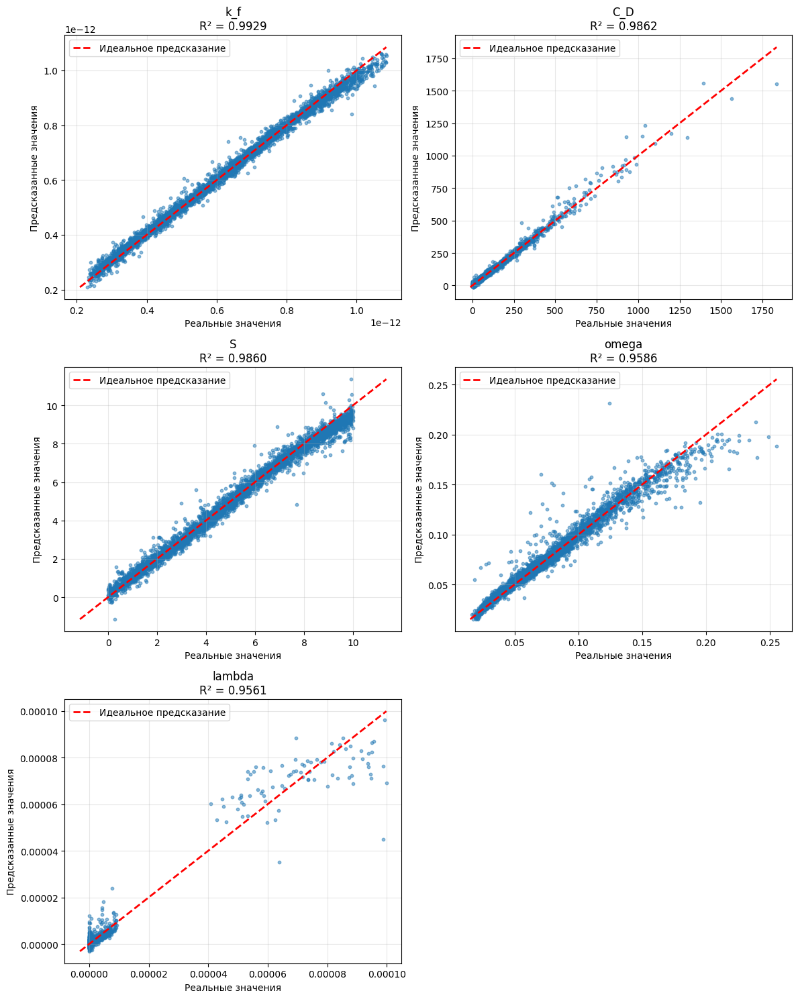

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


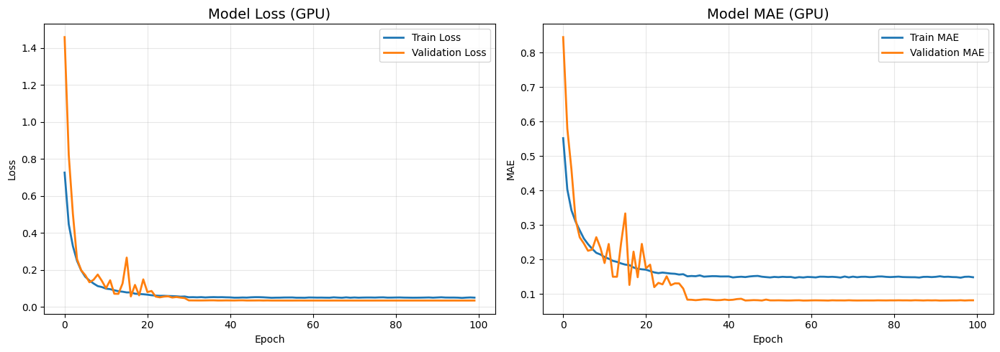

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_dual_porosity_inf', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_dual_porosity_inf.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_dual_porosity_inf.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_dual_porosity_inf_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_dual_porosity_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_dual_porosity_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение для модели двойной пористости с бесконечной границей с разными наборами для train, test, val

In [ ]:
!unzip /content/drive/MyDrive/datasets/dual_porosity_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_porosity_inf/params/24.csv  
  inflating: dual_porosity_inf/params/46.csv  
  inflating: dual_porosity_inf/params/48.csv  
  inflating: dual_porosity_inf/params/85.csv  
  inflating: dual_porosity_inf/params/168.csv  
  inflating: dual_porosity_inf/params/183.csv  
  inflating: dual_porosity_inf/params/208.csv  
  inflating: dual_porosity_inf/params/209.csv  
  inflating: dual_porosity_inf/params/215.csv  
  inflating: dual_porosity_inf/params/226.csv  
  inflating: dual_porosity_inf/params/252.csv  
  inflating: dual_porosity_inf/params/268.csv  
  inflating: dual_porosity_inf/params/274.csv  
  inflating: dual_porosity_inf/params/283.csv  
  inflating: dual_porosity_inf/params/290.csv  
  inflating: dual_porosity_inf/params/311.csv  
  inflating: dual_porosity_inf/params/314.csv  
  inflating: dual_porosity_inf/params/319.csv  
  inflating: dual_porosity_inf/params/328.csv  
  inflating: dual_porosi

In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/dual_porosity_inf',
    model_type=Model.DUAL_POROSITY_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k_f': np.float64(2.547780780055078e-13), 'C_D': np.float64(635.3497770237175), 'S': np.float64(7.838722946388924), 'omega': np.float64(0.2651076716786227), 'lambda': np.float64(7.70212583936991e-06), 'data_type': 'test'}


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 5).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 5).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 5).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std


In [ ]:
model = WellTest1DCNN_REG(output_dim=5, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k_f', 'C_D', 'S', 'omega', 'lambda']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0001
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
GPU не обнаружен, используется CPU

НАЧАЛО ОБУЧЕНИЯ НА CPU (REGRESSION)
Устройство: CPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 5)
Валидационные данные: X (2000, 128, 2), y (2000, 5)
Эпохи: 100
📊 TensorBoard logs will be saved to: training_checkpoints_regression/tensorboard/20260517_191108
   Profile mode: Disabled (CPU mode)

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.7304 - mae: 0.6669 - mse: 0.7304
Epoch 1: val_loss improved from None to 0.70267, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.4812 - mae: 0.5311 - mse: 0.4812 - val_loss: 0.7027 - val_mae: 0.6852 - val_mse: 0.7027 - learning_rate: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 2/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.2087 - mae: 0.3471 - mse: 0.2087
Epoch 2: val_loss improved from 0.70267 to 0.16776, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1915 - mae: 0.3310 - mse: 0.1915 - val_loss: 0.1678 - val_mae: 0.3125 - val_mse: 0.1678 - learning_rate: 1.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 3/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1487 - mae: 0.2922 - mse: 0.1487
Epoch 3: val_loss improved from 0.16776 to 0.10540, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1416 - mae: 0.2845 - mse: 0.1416 - val_loss: 0.1054 - val_mae: 0.2337 - val_mse: 0.1054 - learning_rate: 1.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 4/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1209 - mae: 0.2629 - mse: 0.1209
Epoch 4: val_loss improved from 0.10540 to 0.06205, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1178 - mae: 0.2593 - mse: 0.1178 - val_loss: 0.0621 - val_mae: 0.1729 - val_mse: 0.0621 - learning_rate: 1.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 5/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1038 - mae: 0.2426 - mse: 0.1038
Epoch 5: val_loss did not improve from 0.06205
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1020 - mae: 0.2406 - mse: 0.1020 - val_loss: 0.0811 - val_mae: 0.2016 - val_mse: 0.0811 - learning_rate: 1.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 6/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0950 - mae: 0.2330 - mse: 0.0950
Epoch 6: val_loss improved from 0.06205 to 0.05829, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0919 - mae: 0.2289 - mse: 0.0919 - val_loss: 0.0583 - val_mae: 0.1658 - val_mse: 0.0583 - learning_rate: 1.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0853 - mae: 0.2207 - mse: 0.0853
Epoch 7: val_loss improved from 0.05829 to 0.05138, saving model to best_model_regression.h5



Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0858 - mae: 0.2210 - mse: 0.0858 - val_loss: 0.0514 - val_mae: 0.1593 - val_mse: 0.0514 - learning_rate: 1.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 8/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0808 - mae: 0.2142 - mse: 0.0808
Epoch 8: val_loss improved from 0.05138 to 0.04618, saving model to best_model_regression.h5



Epoch 8: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0791 - mae: 0.2126 - mse: 0.0791 - val_loss: 0.0462 - val_mae: 0.1468 - val_mse: 0.0462 - learning_rate: 1.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 9/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0749 - mae: 0.2071 - mse: 0.0749
Epoch 9: val_loss improved from 0.04618 to 0.04273, saving model to best_model_regression.h5



Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0742 - mae: 0.2060 - mse: 0.0742 - val_loss: 0.0427 - val_mae: 0.1398 - val_mse: 0.0427 - learning_rate: 1.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 10/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0703 - mae: 0.2013 - mse: 0.0703
Epoch 10: val_loss improved from 0.04273 to 0.04035, saving model to best_model_regression.h5



Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0695 - mae: 0.1994 - mse: 0.0695 - val_loss: 0.0403 - val_mae: 0.1402 - val_mse: 0.0403 - learning_rate: 1.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 11/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0688 - mae: 0.1993 - mse: 0.0688
Epoch 11: val_loss improved from 0.04035 to 0.03480, saving model to best_model_regression.h5



Epoch 11: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0682 - mae: 0.1981 - mse: 0.0682 - val_loss: 0.0348 - val_mae: 0.1242 - val_mse: 0.0348 - learning_rate: 1.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 12/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0653 - mae: 0.1938 - mse: 0.0653
Epoch 12: val_loss improved from 0.03480 to 0.03338, saving model to best_model_regression.h5



Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.0661 - mae: 0.1950 - mse: 0.0661 - val_loss: 0.0334 - val_mae: 0.1222 - val_mse: 0.0334 - learning_rate: 1.0000e-04

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 13/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0633 - mae: 0.1909 - mse: 0.0633
Epoch 13: val_loss did not improve from 0.03338
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0638 - mae: 0.1914 - mse: 0.0638 - val_loss: 0.0349 - val_mae: 0.1248 - val_mse: 0.0349 - learning_rate: 1.0000e-04

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 14/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0591 - mae: 0.1844 - mse: 0.0591
Epoch 14: val_loss did not improve from 0.03338
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0603 - mae: 0.1857 - mse: 0.0603 - val_loss: 0.0408 - val_mae: 0.1473 - val_mse: 0.0408 - learnin


Epoch 15: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0586 - mae: 0.1837 - mse: 0.0586 - val_loss: 0.0308 - val_mae: 0.1254 - val_mse: 0.0308 - learning_rate: 1.0000e-04

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 16/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0560 - mae: 0.1798 - mse: 0.0560
Epoch 16: val_loss did not improve from 0.03077
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.0569 - mae: 0.1813 - mse: 0.0569 - val_loss: 0.0441 - val_mae: 0.1575 - val_mse: 0.0441 - learning_rate: 1.0000e-04

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 17/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0591 - mae: 0.1839 - mse: 0.0591
Epoch 17: val_loss improved from 0.03077 to 0.02809, saving model to best_model_regression.h5



Epoch 17: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0573 - mae: 0.1815 - mse: 0.0573 - val_loss: 0.0281 - val_mae: 0.1138 - val_mse: 0.0281 - learning_rate: 1.0000e-04

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 18/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0543 - mae: 0.1766 - mse: 0.0543
Epoch 18: val_loss did not improve from 0.02809
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0542 - mae: 0.1765 - mse: 0.0542 - val_loss: 0.0341 - val_mae: 0.1292 - val_mse: 0.0341 - learning_rate: 1.0000e-04

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 19/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0520 - mae: 0.1729 - mse: 0.0520
Epoch 19: val_loss did not improve from 0.02809
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.0529 - mae: 0.1746 - mse: 0.0529 - val_loss: 0.0298 - val_mae: 0.1189 - val_mse: 0.0298 - learnin


Epoch 20: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0523 - mae: 0.1742 - mse: 0.0523 - val_loss: 0.0272 - val_mae: 0.1123 - val_mse: 0.0272 - learning_rate: 1.0000e-04

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 21/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0506 - mae: 0.1715 - mse: 0.0506
Epoch 21: val_loss did not improve from 0.02719
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.0502 - mae: 0.1708 - mse: 0.0502 - val_loss: 0.0282 - val_mae: 0.1134 - val_mse: 0.0282 - learning_rate: 1.0000e-04

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 22/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0507 - mae: 0.1719 - mse: 0.0507
Epoch 22: val_loss did not improve from 0.02719
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - loss: 0.0494 - mae: 0.1692 - mse: 0.0494 - val_loss: 0.0426 - val_mae: 0.1427 - val_mse: 0.0426 - learnin


Epoch 24: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0478 - mae: 0.1664 - mse: 0.0478 - val_loss: 0.0266 - val_mae: 0.1131 - val_mse: 0.0266 - learning_rate: 1.0000e-04

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 25/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0468 - mae: 0.1649 - mse: 0.0468
Epoch 25: val_loss did not improve from 0.02660
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0466 - mae: 0.1644 - mse: 0.0466 - val_loss: 0.0293 - val_mae: 0.1186 - val_mse: 0.0293 - learning_rate: 1.0000e-04

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 26/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0463 - mae: 0.1644 - mse: 0.0463
Epoch 26: val_loss did not improve from 0.02660
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0457 - mae: 0.1633 - mse: 0.0457 - val_loss: 0.0316 - val_mae: 0.1248 - val_mse: 0.0316 - learnin


Epoch 27: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0457 - mae: 0.1628 - mse: 0.0457 - val_loss: 0.0264 - val_mae: 0.1113 - val_mse: 0.0264 - learning_rate: 1.0000e-04

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 28/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0447 - mae: 0.1615 - mse: 0.0447
Epoch 28: val_loss improved from 0.02641 to 0.02589, saving model to best_model_regression.h5



Epoch 28: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.0443 - mae: 0.1606 - mse: 0.0443 - val_loss: 0.0259 - val_mae: 0.1091 - val_mse: 0.0259 - learning_rate: 1.0000e-04

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 29/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0444 - mae: 0.1606 - mse: 0.0444
Epoch 29: val_loss improved from 0.02589 to 0.02230, saving model to best_model_regression.h5



Epoch 29: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0446 - mae: 0.1611 - mse: 0.0446 - val_loss: 0.0223 - val_mae: 0.1025 - val_mse: 0.0223 - learning_rate: 1.0000e-04

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 30/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0435 - mae: 0.1589 - mse: 0.0435
Epoch 30: val_loss improved from 0.02230 to 0.02047, saving model to best_model_regression.h5



Epoch 30: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0429 - mae: 0.1580 - mse: 0.0429 - val_loss: 0.0205 - val_mae: 0.0958 - val_mse: 0.0205 - learning_rate: 1.0000e-04

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0402 - mae: 0.1527 - mse: 0.0402
Epoch 31: val_loss improved from 0.02047 to 0.02039, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0386 - mae: 0.1497 - mse: 0.0386 - val_loss: 0.0204 - val_mae: 0.0929 - val_mse: 0.0204 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0380 - mae: 0.1493 - mse: 0.0380
Epoch 32: val_loss did not improve from 0.02039
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.0384 - mae: 0.1495 - mse: 0.0384 - val_loss: 0.0205 - val_mae: 0.0916 - val_mse: 0.0205 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0383 - mae: 0.1494 - mse: 0.0383
Epoch 33: val_loss improved from 0.02039 to 0.01877, saving model to best_model_regression.h5



Epoch 33: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0381 - mae: 0.1487 - mse: 0.0381 - val_loss: 0.0188 - val_mae: 0.0883 - val_mse: 0.0188 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0384 - mae: 0.1491 - mse: 0.0384
Epoch 34: val_loss did not improve from 0.01877
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0386 - mae: 0.1498 - mse: 0.0386 - val_loss: 0.0201 - val_mae: 0.0918 - val_mse: 0.0201 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0374 - mae: 0.1471 - mse: 0.0374
Epoch 35: val_loss improved from 0.01877 to 0.01865, saving model to best_model_regression.h5



Epoch 35: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0374 - mae: 0.1473 - mse: 0.0374 - val_loss: 0.0187 - val_mae: 0.0882 - val_mse: 0.0187 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0387 - mae: 0.1499 - mse: 0.0387
Epoch 36: val_loss did not improve from 0.01865
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0380 - mae: 0.1486 - mse: 0.0380 - val_loss: 0.0190 - val_mae: 0.0880 - val_mse: 0.0190 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0364 - mae: 0.1458 - mse: 0.0364
Epoch 37: val_loss did not improve from 0.01865
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.0371 - mae: 0.1469 - mse: 0.0371 - val_loss: 0.0195 - val_mae: 0.0909 - val_mse: 0.0195 - learnin


Epoch 43: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - loss: 0.0370 - mae: 0.1466 - mse: 0.0370 - val_loss: 0.0183 - val_mae: 0.0868 - val_mse: 0.0183 - learning_rate: 5.0000e-06

Epoch 44: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 44/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0380 - mae: 0.1483 - mse: 0.0380
Epoch 44: val_loss did not improve from 0.01830
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.0378 - mae: 0.1480 - mse: 0.0378 - val_loss: 0.0194 - val_mae: 0.0886 - val_mse: 0.0194 - learning_rate: 5.0000e-06

Epoch 45: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 45/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0369 - mae: 0.1468 - mse: 0.0369
Epoch 45: val_loss did not improve from 0.01830
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0370 - mae: 0.1470 - mse: 0.0370 - val_loss: 0.0189 - val_mae: 0.0879 - val_mse: 0.0189 - learni

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0362
  mae: 0.1062
  mse: 0.0362

📊 Регрессионные метрики (в исходном масштабе):

  k_f:
    MSE:  7.9556e-28
    MAE:  1.9337e-14
    R²:   0.9883

  C_D:
    MSE:  9.2811e+02
    MAE:  2.0402e+01
    R²:   0.9829

  S:
    MSE:  1.1449e-01
    MAE:  2.0965e-01
    R²:   0.9717

  omega:
    MSE:  9.4208e-04
    MAE:  1.9277e-02
    R²:   0.8666

  lambda:
    MSE:  3.1802e-12
    MAE:  1.0546e-06
    R²:   0.6102


Количество выходов: 5
Форма y_test_orig: (4000, 5)
Results: 7.118641071578169e-14 1.0068905344912116e-12
Results: 1.0014189960358188e-13 9.998062009973007e-13


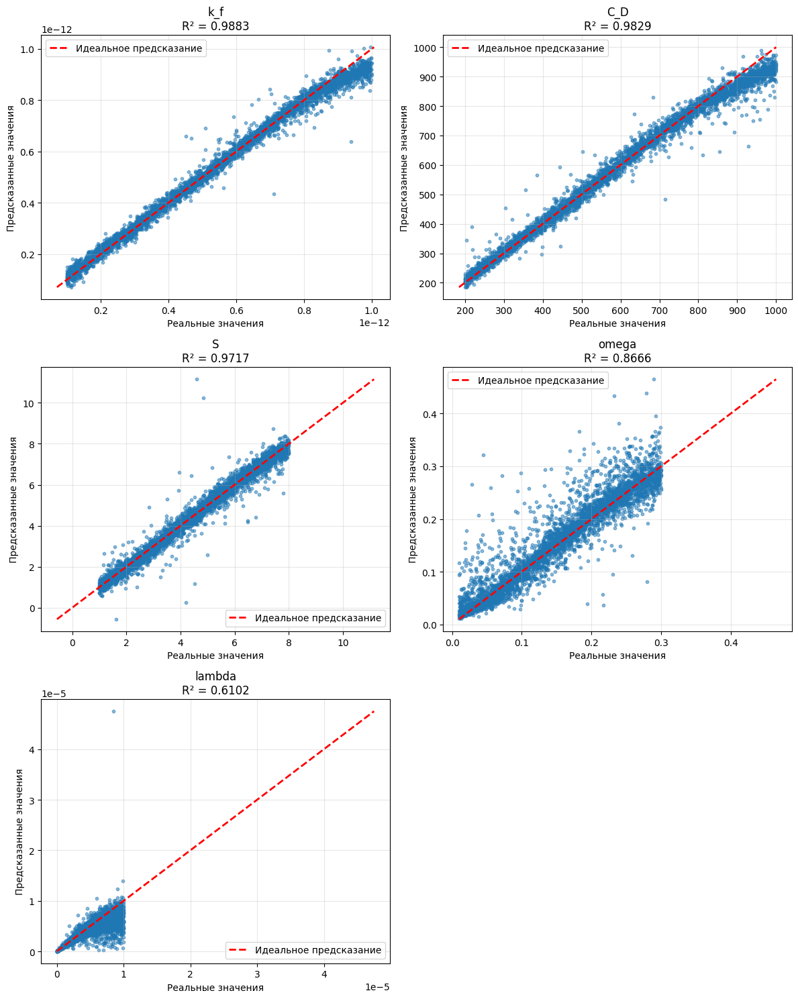

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


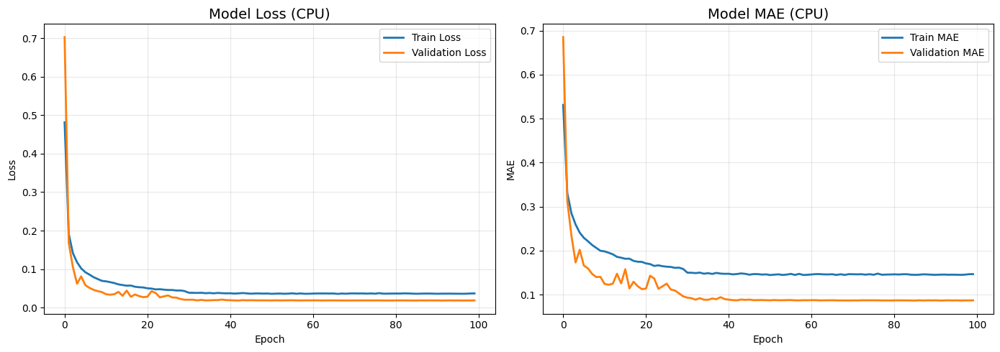

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_dual_porosity_inf', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_dual_porosity_inf.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_dual_porosity_inf.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_dual_porosity_inf_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_dual_porosity_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_dual_porosity_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to 1d_cnn_model_regression_dual_porosity_inf_scaler_config.json


# Обучение двойная пористость круговой пласт

In [ ]:
!unzip /content/drive/MyDrive/dual_porosity_fin.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_porosity_fin/params/24.csv  
  inflating: dual_porosity_fin/params/46.csv  
  inflating: dual_porosity_fin/params/48.csv  
  inflating: dual_porosity_fin/params/85.csv  
  inflating: dual_porosity_fin/params/168.csv  
  inflating: dual_porosity_fin/params/183.csv  
  inflating: dual_porosity_fin/params/208.csv  
  inflating: dual_porosity_fin/params/209.csv  
  inflating: dual_porosity_fin/params/215.csv  
  inflating: dual_porosity_fin/params/226.csv  
  inflating: dual_porosity_fin/params/252.csv  
  inflating: dual_porosity_fin/params/268.csv  
  inflating: dual_porosity_fin/params/274.csv  
  inflating: dual_porosity_fin/params/283.csv  
  inflating: dual_porosity_fin/params/290.csv  
  inflating: dual_porosity_fin/params/311.csv  
  inflating: dual_porosity_fin/params/314.csv  
  inflating: dual_porosity_fin/params/319.csv  
  inflating: dual_porosity_fin/params/328.csv  
  inflating: dual_porosi

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/dual_porosity_fin',
    model_type=Model.DUAL_POROSITY_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
# убран бесполезный фильтр по lambda (lambda всегда <= 1e-5, фильтр никогда не срабатывал)


Train: 14000 -> 12346 (удалено: 1654)
Val:   2000 -> 1751 (удалено: 249)
Test:  4000 -> 3522 (удалено: 478)

Новые формы:
X_train_filtered shape: (12346, 128, 2)
y_train_filtered shape: (12346, 6, 1)


In [ ]:
X_train = X_train_filtered
X_val = X_val_filtered
X_test = X_test_filtered

y_train = y_train_filtered
y_val = y_val_filtered
y_test = y_test_filtered

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)


Transformed data:  0.2280448808535858 1.093359002473395 0.6292614790399094
Transformed data:  0.2319268983294941 1.079160971330926 0.6289832490346423
Transformed data:  0.2275674989705207 1.0880775823262732 0.6293547152385714


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std


In [ ]:
model = WellTest1DCNN_REG(output_dim=6, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k_f', 'C_D', 'S', 'omega', 'lambda', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (12346, 128, 2), y (12346, 6)
Валидационные данные: X (1751, 128, 2), y (1751, 6)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.6245 - mae: 0.5221 - mse: 0.6245
Epoch 1: val_loss improved from None to 2.45121, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.4607 - mae: 0.4292 - mse: 0.4607 - val_loss: 2.4512 - val_mae: 1.1296 - val_mse: 2.4512 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2995 - mae: 0.3317 - mse: 0.2995
Epoch 2: val_loss improved from 2.45121 to 1.21439, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2577 - mae: 0.3170 - mse: 0.2577 - val_loss: 1.2144 - val_mae: 0.7162 - val_mse: 1.2144 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2064 - mae: 0.2857 - mse: 0.2064
Epoch 3: val_loss improved from 1.21439 to 0.97913, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.2027 - mae: 0.2831 - mse: 0.2027 - val_loss: 0.9791 - val_mae: 0.6792 - val_mse: 0.9791 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1804 - mae: 0.2661 - mse: 0.1804
Epoch 4: val_loss did not improve from 0.97913
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1765 - mae: 0.2629 - mse: 0.1765 - val_loss: 2.0139 - val_mae: 1.0281 - val_mse: 2.0139 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1596 - mae: 0.2499 - mse: 0.1596
Epoch 5: val_loss improved from 0.97913 to 0.65957, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1680 - mae: 0.2531 - mse: 0.1680 - val_loss: 0.6596 - val_mae: 0.5957 - val_mse: 0.6596 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1568 - mae: 0.2493 - mse: 0.1568
Epoch 6: val_loss did not improve from 0.65957
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1591 - mae: 0.2482 - mse: 0.1591 - val_loss: 1.0008 - val_mae: 0.6886 - val_mse: 1.0008 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1460 - mae: 0.2372 - mse: 0.1460
Epoch 7: val_loss did not improve from 0.65957
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1501 - mae: 0.2411 - mse: 0.1501 - val_loss: 2.0382 - val_mae: 1.0524 - val_mse: 2.0382 - learning_rate: 5.00


Epoch 13: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0996 - mae: 0.1986 - mse: 0.0996 - val_loss: 0.4387 - val_mae: 0.4761 - val_mse: 0.4387 - learning_rate: 2.5000e-04

Epoch 14: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 14/100
190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0952 - mae: 0.1947 - mse: 0.0952
Epoch 14: val_loss did not improve from 0.43874
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0945 - mae: 0.1938 - mse: 0.0945 - val_loss: 0.4409 - val_mae: 0.4565 - val_mse: 0.4409 - learning_rate: 2.5000e-04

Epoch 15: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 15/100
185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0954 - mae: 0.1947 - mse: 0.0954
Epoch 15: val_loss did not improve from 0.43874
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0926 - mae: 0.1917 - mse: 0.0926 - val_loss: 0.5194 - val_mae: 0.5242 - val_mse: 0.5194 - learning_rat


Epoch 16: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0913 - mae: 0.1909 - mse: 0.0913 - val_loss: 0.3841 - val_mae: 0.4464 - val_mse: 0.3841 - learning_rate: 2.5000e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 17/100
184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0876 - mae: 0.1880 - mse: 0.0876
Epoch 17: val_loss improved from 0.38414 to 0.30311, saving model to best_model_regression.h5



Epoch 17: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0906 - mae: 0.1896 - mse: 0.0906 - val_loss: 0.3031 - val_mae: 0.3673 - val_mse: 0.3031 - learning_rate: 2.5000e-04

Epoch 18: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 18/100
184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0843 - mae: 0.1843 - mse: 0.0843
Epoch 18: val_loss improved from 0.30311 to 0.12511, saving model to best_model_regression.h5



Epoch 18: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0858 - mae: 0.1840 - mse: 0.0858 - val_loss: 0.1251 - val_mae: 0.2024 - val_mse: 0.1251 - learning_rate: 2.5000e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 19/100
187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0885 - mae: 0.1854 - mse: 0.0885
Epoch 19: val_loss did not improve from 0.12511
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0846 - mae: 0.1838 - mse: 0.0846 - val_loss: 0.2233 - val_mae: 0.2841 - val_mse: 0.2233 - learning_rate: 2.5000e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 20/100
185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0777 - mae: 0.1791 - mse: 0.0777
Epoch 20: val_loss did not improve from 0.12511
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0820 - mae: 0.1811 - mse: 0.0820 - val_loss: 0.1751 - val_mae: 0.2656 - val_mse: 0.1751 - learning_rat


Epoch 24: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0682 - mae: 0.1654 - mse: 0.0682 - val_loss: 0.1105 - val_mae: 0.2053 - val_mse: 0.1105 - learning_rate: 1.2500e-04

Epoch 25: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 25/100
184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0664 - mae: 0.1662 - mse: 0.0664
Epoch 25: val_loss did not improve from 0.11047
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0683 - mae: 0.1678 - mse: 0.0683 - val_loss: 0.1226 - val_mae: 0.1635 - val_mse: 0.1226 - learning_rate: 1.2500e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 26/100
188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0687 - mae: 0.1669 - mse: 0.0687
Epoch 26: val_loss did not improve from 0.11047
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0691 - mae: 0.1689 - mse: 0.0691 - val_loss: 0.1413 - val_mae: 0.1938 - val_mse: 0.1413 - learning_rat


Epoch 27: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0636 - mae: 0.1629 - mse: 0.0636 - val_loss: 0.1059 - val_mae: 0.1933 - val_mse: 0.1059 - learning_rate: 1.2500e-04

Epoch 28: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 28/100
186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0613 - mae: 0.1612 - mse: 0.0613
Epoch 28: val_loss did not improve from 0.10590
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0635 - mae: 0.1630 - mse: 0.0635 - val_loss: 0.2138 - val_mae: 0.2993 - val_mse: 0.2138 - learning_rate: 1.2500e-04

Epoch 29: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 29/100
188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0654 - mae: 0.1646 - mse: 0.0654
Epoch 29: val_loss improved from 0.10590 to 0.10503, saving model to best_model_regression.h5



Epoch 29: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0652 - mae: 0.1644 - mse: 0.0652 - val_loss: 0.1050 - val_mae: 0.2026 - val_mse: 0.1050 - learning_rate: 1.2500e-04

Epoch 30: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 30/100
190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0679 - mae: 0.1652 - mse: 0.0679
Epoch 30: val_loss did not improve from 0.10503
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0651 - mae: 0.1642 - mse: 0.0651 - val_loss: 0.1284 - val_mae: 0.2380 - val_mse: 0.1284 - learning_rate: 1.2500e-04

Epoch 31: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 31/100
189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0602 - mae: 0.1578 - mse: 0.0602
Epoch 31: val_loss improved from 0.10503 to 0.05584, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0577 - mae: 0.1557 - mse: 0.0577 - val_loss: 0.0558 - val_mae: 0.1044 - val_mse: 0.0558 - learning_rate: 1.2500e-05

Epoch 32: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 32/100
191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0561 - mae: 0.1553 - mse: 0.0561
Epoch 32: val_loss improved from 0.05584 to 0.05265, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0579 - mae: 0.1563 - mse: 0.0579 - val_loss: 0.0527 - val_mae: 0.0984 - val_mse: 0.0527 - learning_rate: 1.2500e-05

Epoch 33: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 33/100
182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0562 - mae: 0.1563 - mse: 0.0562
Epoch 33: val_loss did not improve from 0.05265
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0564 - mae: 0.1548 - mse: 0.0564 - val_loss: 0.0529 - val_mae: 0.0991 - val_mse: 0.0529 - learning_rate: 1.2500e-05

Epoch 34: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 34/100
185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0586 - mae: 0.1573 - mse: 0.0586
Epoch 34: val_loss did not improve from 0.05265
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0567 - mae: 0.1549 - mse: 0.0567 - val_loss: 0.0530 - val_mae: 0.1041 - val_mse: 0.0530 - learning_r


Epoch 38: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0550 - mae: 0.1527 - mse: 0.0550 - val_loss: 0.0518 - val_mae: 0.0984 - val_mse: 0.0518 - learning_rate: 6.2500e-06

Epoch 39: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 39/100
191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0561 - mae: 0.1527 - mse: 0.0561
Epoch 39: val_loss improved from 0.05182 to 0.04986, saving model to best_model_regression.h5



Epoch 39: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0548 - mae: 0.1525 - mse: 0.0548 - val_loss: 0.0499 - val_mae: 0.0954 - val_mse: 0.0499 - learning_rate: 6.2500e-06

Epoch 40: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 40/100
185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0568 - mae: 0.1540 - mse: 0.0568
Epoch 40: val_loss did not improve from 0.04986
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0547 - mae: 0.1534 - mse: 0.0547 - val_loss: 0.0514 - val_mae: 0.1044 - val_mse: 0.0514 - learning_rate: 6.2500e-06

Epoch 41: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 41/100
185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0550 - mae: 0.1554 - mse: 0.0550
Epoch 41: val_loss did not improve from 0.04986
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0551 - mae: 0.1535 - mse: 0.0551 - val_loss: 0.0517 - val_mae: 0.1013 - val_mse: 0.0517 - learning_rat


Epoch 50: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0525 - mae: 0.1500 - mse: 0.0525 - val_loss: 0.0498 - val_mae: 0.0951 - val_mse: 0.0498 - learning_rate: 1.5625e-06

Epoch 51: LearningRateScheduler setting learning rate to 1.5625000742147678e-07.
Epoch 51/100
184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0538 - mae: 0.1523 - mse: 0.0538
Epoch 51: val_loss improved from 0.04979 to 0.04956, saving model to best_model_regression.h5



Epoch 51: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0531 - mae: 0.1515 - mse: 0.0531 - val_loss: 0.0496 - val_mae: 0.0949 - val_mse: 0.0496 - learning_rate: 1.5625e-07

Epoch 52: LearningRateScheduler setting learning rate to 1.562500102636477e-07.
Epoch 52/100
188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0539 - mae: 0.1508 - mse: 0.0539
Epoch 52: val_loss improved from 0.04956 to 0.04953, saving model to best_model_regression.h5



Epoch 52: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0538 - mae: 0.1508 - mse: 0.0538 - val_loss: 0.0495 - val_mae: 0.0953 - val_mse: 0.0495 - learning_rate: 1.5625e-07

Epoch 53: LearningRateScheduler setting learning rate to 1.562500102636477e-07.
Epoch 53/100
188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0532 - mae: 0.1507 - mse: 0.0532
Epoch 53: val_loss did not improve from 0.04953
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0526 - mae: 0.1506 - mse: 0.0526 - val_loss: 0.0496 - val_mae: 0.0952 - val_mse: 0.0496 - learning_rate: 1.5625e-07

Epoch 54: LearningRateScheduler setting learning rate to 1.562500102636477e-07.
Epoch 54/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0527 - mae: 0.1507 - mse: 0.0527
Epoch 54: val_loss did not improve from 0.04953
193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0537 - mae: 0.1516 - mse: 0.0537 - val_loss: 0.0497 - val_mae: 0.0955 - val_mse: 0.0497 - learning_rat


Epoch 55: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0536 - mae: 0.1518 - mse: 0.0536 - val_loss: 0.0494 - val_mae: 0.0945 - val_mse: 0.0494 - learning_rate: 1.5625e-07

Epoch 56: LearningRateScheduler setting learning rate to 1.562500102636477e-07.
Epoch 56/100
189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0528 - mae: 0.1506 - mse: 0.0528
Epoch 56: val_loss did not improve from 0.04944
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0536 - mae: 0.1510 - mse: 0.0536 - val_loss: 0.0495 - val_mae: 0.0951 - val_mse: 0.0495 - learning_rate: 1.5625e-07

Epoch 57: LearningRateScheduler setting learning rate to 1.562500102636477e-07.
Epoch 57/100
186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0557 - mae: 0.1510 - mse: 0.0557
Epoch 57: val_loss did not improve from 0.04944
193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0543 - mae: 0.1519 - mse: 0.0543 - val_loss: 0.0495 - val_mae: 0.0950 - val_mse: 0.0495 - learning_rat

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0344
  mae: 0.0909
  mse: 0.0344

📊 Регрессионные метрики (в исходном масштабе):

  k_f:
    MSE:  4.5559e-28
    MAE:  1.5913e-14
    R²:   0.9906

  C_D:
    MSE:  3.5366e+02
    MAE:  7.9664e+00
    R²:   0.9847

  S:
    MSE:  1.2140e-01
    MAE:  2.4842e-01
    R²:   0.9855

  omega:
    MSE:  1.7294e-04
    MAE:  8.4026e-03
    R²:   0.8915

  lambda:
    MSE:  7.2371e-12
    MAE:  8.0835e-07
    R²:   0.9472

  r_D_e:
    MSE:  3.3154e+04
    MAE:  1.4035e+02
    R²:   0.9949


Количество выходов: 6
Форма y_test_orig: (3522, 6)
Results: 5.686782018595252e-14 1.0538573052415456e-12
Results: 2.275674989705207e-13 1.0880775823262732e-12


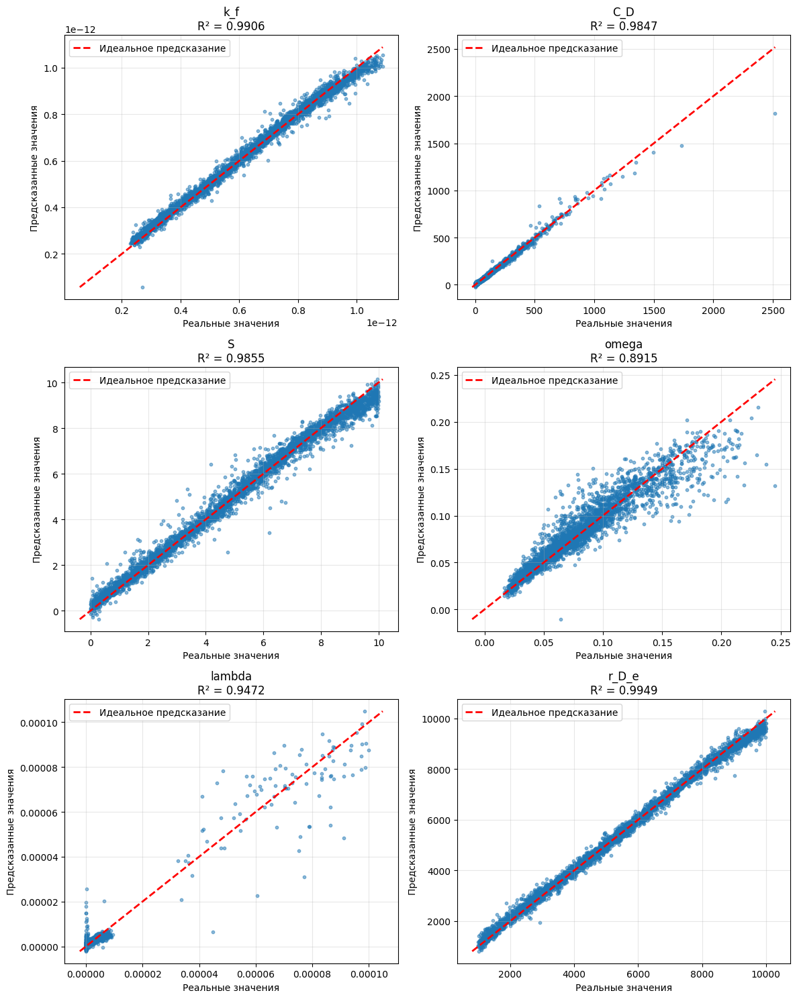

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


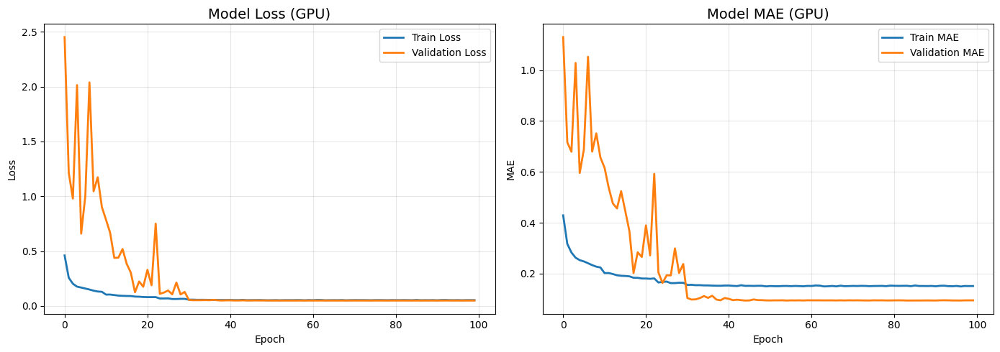

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_dual_porosity_fin', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_dual_porosity_fin.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_dual_porosity_fin.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_dual_porosity_fin_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_dual_porosity_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_dual_porosity_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение двойная пористость круговой пласт c разными train, test, val

In [ ]:
!unzip /content/drive/MyDrive/datasets/dual_porosity_fin.zip

Archive:  /content/drive/MyDrive/datasets/dual_porosity_fin.zip
replace dual_porosity_fin/curve/dual_porosity_fin_28.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/dual_porosity_fin',
    model_type=Model.DUAL_POROSITY_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

KeyboardInterrupt: 

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTest1DCNN_REG(output_dim=6, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k_f', 'C_D', 'S', 'omega', 'lambda', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_dual_porosity_fin', format='all')

In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_dual_porosity_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_dual_porosity_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение для модели двойной проницаемости для бексонечного пласта

In [ ]:
!unzip /content/drive/MyDrive/dual_permeability_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_permeability_inf/params/24.csv  
  inflating: dual_permeability_inf/params/46.csv  
  inflating: dual_permeability_inf/params/48.csv  
  inflating: dual_permeability_inf/params/85.csv  
  inflating: dual_permeability_inf/params/168.csv  
  inflating: dual_permeability_inf/params/183.csv  
  inflating: dual_permeability_inf/params/208.csv  
  inflating: dual_permeability_inf/params/209.csv  
  inflating: dual_permeability_inf/params/215.csv  
  inflating: dual_permeability_inf/params/226.csv  
  inflating: dual_permeability_inf/params/252.csv  
  inflating: dual_permeability_inf/params/268.csv  
  inflating: dual_permeability_inf/params/274.csv  
  inflating: dual_permeability_inf/params/283.csv  
  inflating: dual_permeability_inf/params/290.csv  
  inflating: dual_permeability_inf/params/311.csv  
  inflating: dual_permeability_inf/params/314.csv  
  inflating: dual_permeability_inf/params/319.csv  


In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/dual_permeability_inf',
    model_type=Model.DUAL_PERMEABILITY_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)


Transformed data:  0.009941088524876551 0.7642356130439637 0.1263442688784243
Transformed data:  0.011309575521813412 0.7118756940271016 0.13042028969295544
Transformed data:  0.01150509923280208 0.7507948162378479 0.12539270314983528


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)

# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k1
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std


In [ ]:
model = WellTest1DCNN_REG(output_dim=6, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 6)
Валидационные данные: X (2000, 128, 2), y (2000, 6)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.5947 - mae: 0.5369 - mse: 0.5947
Epoch 1: val_loss improved from None to 5.42273, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.4563 - mae: 0.4604 - mse: 0.4563 - val_loss: 5.4227 - val_mae: 1.6731 - val_mse: 5.4227 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3105 - mae: 0.3720 - mse: 0.3105
Epoch 2: val_loss improved from 5.42273 to 2.14332, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.2957 - mae: 0.3647 - mse: 0.2957 - val_loss: 2.1433 - val_mae: 0.9557 - val_mse: 2.1433 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2657 - mae: 0.3431 - mse: 0.2657
Epoch 3: val_loss improved from 2.14332 to 0.75259, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2554 - mae: 0.3337 - mse: 0.2554 - val_loss: 0.7526 - val_mae: 0.6200 - val_mse: 0.7526 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2488 - mae: 0.3260 - mse: 0.2488
Epoch 4: val_loss did not improve from 0.75259
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.2395 - mae: 0.3205 - mse: 0.2395 - val_loss: 1.2318 - val_mae: 0.8240 - val_mse: 1.2318 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2285 - mae: 0.3129 - mse: 0.2285
Epoch 5: val_loss did not improve from 0.75259
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2269 - mae: 0.3122 - mse: 0.2269 - val_loss: 2.2526 - val_mae: 1.0930 - val_mse: 2.2526 - learning_rate: 5.00


Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.2200 - mae: 0.3058 - mse: 0.2200 - val_loss: 0.5957 - val_mae: 0.5576 - val_mse: 0.5957 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2168 - mae: 0.3025 - mse: 0.2168
Epoch 7: val_loss did not improve from 0.59566
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2193 - mae: 0.3038 - mse: 0.2193 - val_loss: 0.7392 - val_mae: 0.6513 - val_mse: 0.7392 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2165 - mae: 0.3026 - mse: 0.2165
Epoch 8: val_loss improved from 0.59566 to 0.43636, saving model to best_model_regression.h5



Epoch 8: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.2141 - mae: 0.3005 - mse: 0.2141 - val_loss: 0.4364 - val_mae: 0.4839 - val_mse: 0.4364 - learning_rate: 5.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 9/100
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2071 - mae: 0.2937 - mse: 0.2071
Epoch 9: val_loss did not improve from 0.43636
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.2076 - mae: 0.2943 - mse: 0.2076 - val_loss: 3.3562 - val_mae: 1.1659 - val_mse: 3.3562 - learning_rate: 5.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 10/100
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2098 - mae: 0.2949 - mse: 0.2098
Epoch 10: val_loss did not improve from 0.43636
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.2054 - mae: 0.2920 - mse: 0.2054 - val_loss: 0.5412 - val_mae: 0.5344 - val_mse: 0.5412 - learning_rate: 5


Epoch 15: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.1837 - mae: 0.2707 - mse: 0.1837 - val_loss: 0.3201 - val_mae: 0.3552 - val_mse: 0.3201 - learning_rate: 2.5000e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 16/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1855 - mae: 0.2718 - mse: 0.1855
Epoch 16: val_loss did not improve from 0.32009
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1831 - mae: 0.2703 - mse: 0.1831 - val_loss: 0.4057 - val_mae: 0.4730 - val_mse: 0.4057 - learning_rate: 2.5000e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 17/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1790 - mae: 0.2668 - mse: 0.1790
Epoch 17: val_loss improved from 0.32009 to 0.22864, saving model to best_model_regression.h5



Epoch 17: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1796 - mae: 0.2675 - mse: 0.1796 - val_loss: 0.2286 - val_mae: 0.3051 - val_mse: 0.2286 - learning_rate: 2.5000e-04

Epoch 18: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 18/100
209/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1804 - mae: 0.2695 - mse: 0.1804
Epoch 18: val_loss did not improve from 0.22864
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1798 - mae: 0.2680 - mse: 0.1798 - val_loss: 0.3740 - val_mae: 0.4244 - val_mse: 0.3740 - learning_rate: 2.5000e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 19/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1814 - mae: 0.2692 - mse: 0.1814
Epoch 19: val_loss did not improve from 0.22864
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1785 - mae: 0.2672 - mse: 0.1785 - val_loss: 0.2517 - val_mae: 0.3148 - val_mse: 0.2517 - learning_rat


Epoch 20: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1793 - mae: 0.2683 - mse: 0.1793 - val_loss: 0.2077 - val_mae: 0.2937 - val_mse: 0.2077 - learning_rate: 2.5000e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 21/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1777 - mae: 0.2676 - mse: 0.1777
Epoch 21: val_loss did not improve from 0.20774
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1751 - mae: 0.2650 - mse: 0.1751 - val_loss: 0.7403 - val_mae: 0.5800 - val_mse: 0.7403 - learning_rate: 2.5000e-04

Epoch 22: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 22/100
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1728 - mae: 0.2616 - mse: 0.1728
Epoch 22: val_loss did not improve from 0.20774
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1699 - mae: 0.2595 - mse: 0.1699 - val_loss: 0.2770 - val_mae: 0.3274 - val_mse: 0.2770 - learning_rat


Epoch 27: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1450 - mae: 0.2397 - mse: 0.1450 - val_loss: 0.1837 - val_mae: 0.2933 - val_mse: 0.1837 - learning_rate: 1.2500e-04

Epoch 28: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 28/100
208/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1466 - mae: 0.2424 - mse: 0.1466
Epoch 28: val_loss did not improve from 0.18367
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1459 - mae: 0.2413 - mse: 0.1459 - val_loss: 0.2063 - val_mae: 0.2798 - val_mse: 0.2063 - learning_rate: 1.2500e-04

Epoch 29: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 29/100
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1407 - mae: 0.2371 - mse: 0.1407
Epoch 29: val_loss did not improve from 0.18367
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1417 - mae: 0.2375 - mse: 0.1417 - val_loss: 0.4413 - val_mae: 0.4748 - val_mse: 0.4413 - learning_rat


Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.1313 - mae: 0.2278 - mse: 0.1313 - val_loss: 0.1093 - val_mae: 0.1844 - val_mse: 0.1093 - learning_rate: 1.2500e-05

Epoch 32: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 32/100
208/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1311 - mae: 0.2287 - mse: 0.1311
Epoch 32: val_loss did not improve from 0.10935
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1303 - mae: 0.2267 - mse: 0.1303 - val_loss: 0.1177 - val_mae: 0.1901 - val_mse: 0.1177 - learning_rate: 1.2500e-05

Epoch 33: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 33/100
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1323 - mae: 0.2276 - mse: 0.1323
Epoch 33: val_loss improved from 0.10935 to 0.10522, saving model to best_model_regression.h5



Epoch 33: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1303 - mae: 0.2258 - mse: 0.1303 - val_loss: 0.1052 - val_mae: 0.1730 - val_mse: 0.1052 - learning_rate: 1.2500e-05

Epoch 34: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 34/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1292 - mae: 0.2248 - mse: 0.1292
Epoch 34: val_loss did not improve from 0.10522
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1290 - mae: 0.2252 - mse: 0.1290 - val_loss: 0.1162 - val_mae: 0.1807 - val_mse: 0.1162 - learning_rate: 1.2500e-05

Epoch 35: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 35/100
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1300 - mae: 0.2263 - mse: 0.1300
Epoch 35: val_loss did not improve from 0.10522
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1284 - mae: 0.2251 - mse: 0.1284 - val_loss: 0.1119 - val_mae: 0.1799 - val_mse: 0.1119 - learning_r


Epoch 37: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1271 - mae: 0.2230 - mse: 0.1271 - val_loss: 0.1036 - val_mae: 0.1731 - val_mse: 0.1036 - learning_rate: 1.2500e-05

Epoch 38: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 38/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1250 - mae: 0.2221 - mse: 0.1250
Epoch 38: val_loss improved from 0.10357 to 0.10289, saving model to best_model_regression.h5



Epoch 38: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1281 - mae: 0.2251 - mse: 0.1281 - val_loss: 0.1029 - val_mae: 0.1763 - val_mse: 0.1029 - learning_rate: 1.2500e-05

Epoch 39: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 39/100
209/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1293 - mae: 0.2264 - mse: 0.1293
Epoch 39: val_loss did not improve from 0.10289
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1279 - mae: 0.2246 - mse: 0.1279 - val_loss: 0.1052 - val_mae: 0.1772 - val_mse: 0.1052 - learning_rate: 1.2500e-05

Epoch 40: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 40/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1313 - mae: 0.2284 - mse: 0.1313
Epoch 40: val_loss did not improve from 0.10289
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1282 - mae: 0.2252 - mse: 0.1282 - val_loss: 0.1045 - val_mae: 0.1729 - val_mse: 0.1045 - learning_r


Epoch 42: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1274 - mae: 0.2240 - mse: 0.1274 - val_loss: 0.1014 - val_mae: 0.1793 - val_mse: 0.1014 - learning_rate: 1.2500e-05

Epoch 43: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 43/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1261 - mae: 0.2209 - mse: 0.1261
Epoch 43: val_loss improved from 0.10135 to 0.09860, saving model to best_model_regression.h5



Epoch 43: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1254 - mae: 0.2224 - mse: 0.1254 - val_loss: 0.0986 - val_mae: 0.1702 - val_mse: 0.0986 - learning_rate: 1.2500e-05

Epoch 44: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 44/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1275 - mae: 0.2241 - mse: 0.1275
Epoch 44: val_loss did not improve from 0.09860
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1261 - mae: 0.2235 - mse: 0.1261 - val_loss: 0.1019 - val_mae: 0.1701 - val_mse: 0.1019 - learning_rate: 1.2500e-05

Epoch 45: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 45/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1279 - mae: 0.2253 - mse: 0.1279
Epoch 45: val_loss did not improve from 0.09860
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1267 - mae: 0.2240 - mse: 0.1267 - val_loss: 0.1103 - val_mae: 0.1770 - val_mse: 0.1103 - learning_r


Epoch 50: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1259 - mae: 0.2227 - mse: 0.1259 - val_loss: 0.0974 - val_mae: 0.1671 - val_mse: 0.0974 - learning_rate: 6.2500e-06

Epoch 51: LearningRateScheduler setting learning rate to 6.250000296859071e-07.
Epoch 51/100
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1252 - mae: 0.2212 - mse: 0.1252
Epoch 51: val_loss did not improve from 0.09740
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1232 - mae: 0.2201 - mse: 0.1232 - val_loss: 0.0977 - val_mae: 0.1666 - val_mse: 0.0977 - learning_rate: 6.2500e-07

Epoch 52: LearningRateScheduler setting learning rate to 6.250000410545908e-07.
Epoch 52/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1236 - mae: 0.2202 - mse: 0.1236
Epoch 52: val_loss did not improve from 0.09740
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1236 - mae: 0.2208 - mse: 0.1236 - val_loss: 0.0986 - val_mae: 0.1672 - val_mse: 0.0986 - learning_rat


Epoch 54: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1248 - mae: 0.2218 - mse: 0.1248 - val_loss: 0.0974 - val_mae: 0.1658 - val_mse: 0.0974 - learning_rate: 6.2500e-07

Epoch 55: LearningRateScheduler setting learning rate to 6.250000410545908e-07.
Epoch 55/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1243 - mae: 0.2222 - mse: 0.1243
Epoch 55: val_loss did not improve from 0.09735
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1239 - mae: 0.2218 - mse: 0.1239 - val_loss: 0.0977 - val_mae: 0.1662 - val_mse: 0.0977 - learning_rate: 6.2500e-07

Epoch 56: LearningRateScheduler setting learning rate to 6.250000410545908e-07.
Epoch 56/100
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1218 - mae: 0.2194 - mse: 0.1218
Epoch 56: val_loss did not improve from 0.09735
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1218 - mae: 0.2190 - mse: 0.1218 - val_loss: 0.0978 - val_mae: 0.1658 - val_mse: 0.0978 - learning_rat


Epoch 57: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1236 - mae: 0.2208 - mse: 0.1236 - val_loss: 0.0970 - val_mae: 0.1657 - val_mse: 0.0970 - learning_rate: 6.2500e-07

Epoch 58: LearningRateScheduler setting learning rate to 6.250000410545908e-07.
Epoch 58/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1220 - mae: 0.2198 - mse: 0.1220
Epoch 58: val_loss did not improve from 0.09699
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1229 - mae: 0.2208 - mse: 0.1229 - val_loss: 0.0975 - val_mae: 0.1659 - val_mse: 0.0975 - learning_rate: 6.2500e-07

Epoch 59: LearningRateScheduler setting learning rate to 6.250000410545908e-07.
Epoch 59/100
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1202 - mae: 0.2181 - mse: 0.1202
Epoch 59: val_loss did not improve from 0.09699
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1221 - mae: 0.2191 - mse: 0.1221 - val_loss: 0.0971 - val_mae: 0.1655 - val_mse: 0.0971 - learning_rat


Epoch 66: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1235 - mae: 0.2205 - mse: 0.1235 - val_loss: 0.0964 - val_mae: 0.1652 - val_mse: 0.0964 - learning_rate: 6.2500e-07

Epoch 67: LearningRateScheduler setting learning rate to 6.250000410545908e-07.
Epoch 67/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1222 - mae: 0.2197 - mse: 0.1222
Epoch 67: val_loss did not improve from 0.09642
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1237 - mae: 0.2205 - mse: 0.1237 - val_loss: 0.0969 - val_mae: 0.1656 - val_mse: 0.0969 - learning_rate: 6.2500e-07

Epoch 68: LearningRateScheduler setting learning rate to 6.250000410545908e-07.
Epoch 68/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1247 - mae: 0.2218 - mse: 0.1247
Epoch 68: val_loss did not improve from 0.09642
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1226 - mae: 0.2193 - mse: 0.1226 - val_loss: 0.0972 - val_mae: 0.1654 - val_mse: 0.0972 - learning_rat

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.1090
  mae: 0.1738
  mse: 0.1090

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  3.9573e-29
    MAE:  4.4005e-15
    R²:   0.9948

  C_D:
    MSE:  5.5798e+01
    MAE:  4.0877e+00
    R²:   0.9938

  S1:
    MSE:  8.3015e-02
    MAE:  2.1478e-01
    R²:   0.9901

  omega:
    MSE:  3.5586e-04
    MAE:  1.2752e-02
    R²:   0.7705

  lambda:
    MSE:  1.8948e-12
    MAE:  6.0692e-07
    R²:   0.9474

  kappa:
    MSE:  1.7353e-03
    MAE:  3.1567e-02
    R²:   0.6738


Количество выходов: 6
Форма y_test_orig: (4000, 6)
Results: -6.222392121956605e-15 6.393290844647348e-13
Results: 1.1505099232802073e-14 7.50794816237848e-13


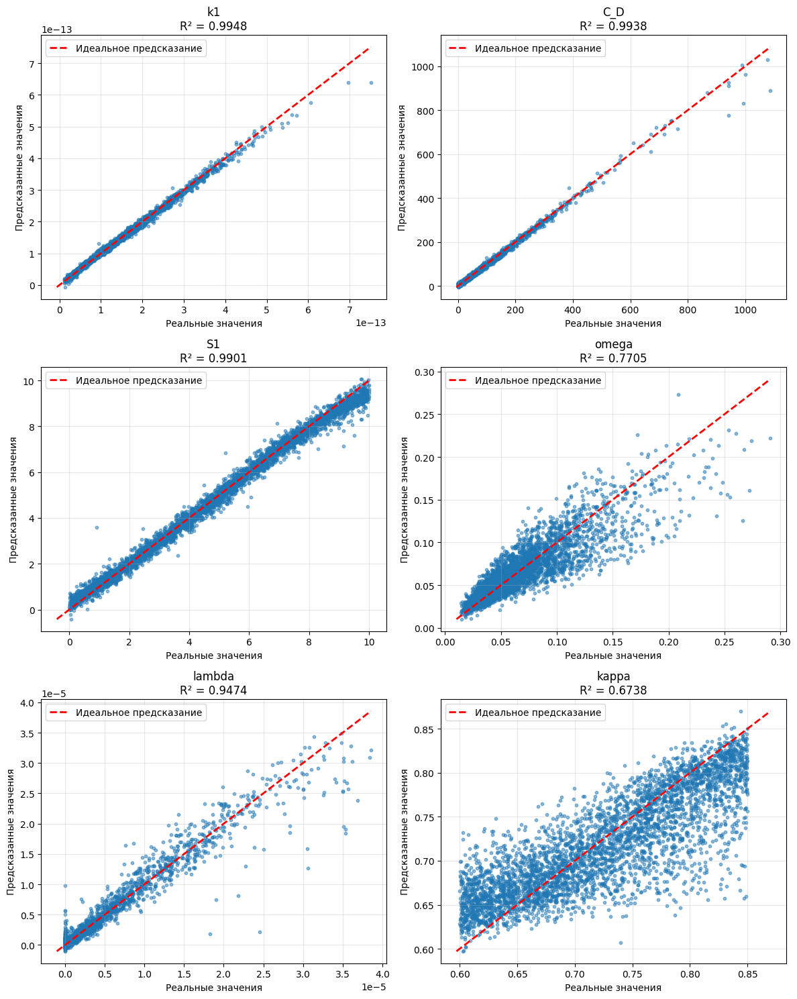

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


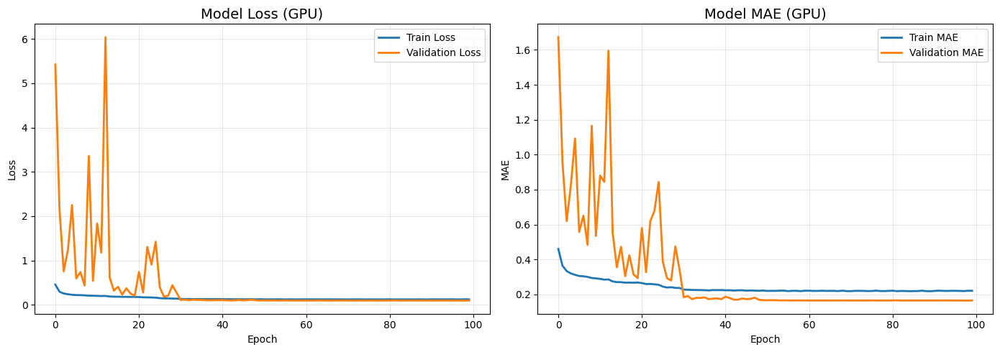

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_dual_permeability_inf', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_dual_permeability_inf.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_dual_permeability_inf.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_dual_permeability_inf_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_dual_permeability_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_dual_permeability_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение для модели двойной проницаемости для бексонечного пласта с разными train, val, test


In [14]:
!unzip /content/drive/MyDrive/datasets/dual_permeability_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_permeability_inf/params/24.csv  
  inflating: dual_permeability_inf/params/46.csv  
  inflating: dual_permeability_inf/params/48.csv  
  inflating: dual_permeability_inf/params/85.csv  
  inflating: dual_permeability_inf/params/168.csv  
  inflating: dual_permeability_inf/params/183.csv  
  inflating: dual_permeability_inf/params/208.csv  
  inflating: dual_permeability_inf/params/209.csv  
  inflating: dual_permeability_inf/params/215.csv  
  inflating: dual_permeability_inf/params/226.csv  
  inflating: dual_permeability_inf/params/252.csv  
  inflating: dual_permeability_inf/params/268.csv  
  inflating: dual_permeability_inf/params/274.csv  
  inflating: dual_permeability_inf/params/283.csv  
  inflating: dual_permeability_inf/params/290.csv  
  inflating: dual_permeability_inf/params/311.csv  
  inflating: dual_permeability_inf/params/314.csv  
  inflating: dual_permeability_inf/params/319.csv  


In [15]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/dual_permeability_inf',
    model_type=Model.DUAL_PERMEABILITY_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k1': np.float64(1.1129903673644019e-13), 'C_D': np.float64(898.0031198704105), 'S1': np.float64(2.2991458026619918), 'omega': np.float64(0.1415509903784308), 'lambda': np.float64(6.994505645412268e-06), 'kappa': np.float64(0.8478199238018019), 'data_type': 'test'}


In [16]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [17]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [18]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)


In [19]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [20]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)

# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k1
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std


In [21]:
model = WellTest1DCNN_REG(output_dim=6, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
GPU не обнаружен, используется CPU

НАЧАЛО ОБУЧЕНИЯ НА CPU (REGRESSION)
Устройство: CPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 6)
Валидационные данные: X (2000, 128, 2), y (2000, 6)
Эпохи: 100
📊 TensorBoard logs will be saved to: training_checkpoints_regression/tensorboard/20260518_092715
   Profile mode: Disabled (CPU mode)

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.7044 - mae: 0.6557 - mse: 0.7044
Epoch 1: val_loss improved from None to 1.42538, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - loss: 0.5618 - mae: 0.5712 - mse: 0.5618 - val_loss: 1.4254 - val_mae: 0.9700 - val_mse: 1.4254 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4100 - mae: 0.4745 - mse: 0.4100
Epoch 2: val_loss improved from 1.42538 to 1.02314, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3932 - mae: 0.4631 - mse: 0.3932 - val_loss: 1.0231 - val_mae: 0.7734 - val_mse: 1.0231 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3608 - mae: 0.4366 - mse: 0.3608
Epoch 3: val_loss improved from 1.02314 to 0.39513, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3468 - mae: 0.4270 - mse: 0.3468 - val_loss: 0.3951 - val_mae: 0.4414 - val_mse: 0.3951 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3186 - mae: 0.4081 - mse: 0.3186
Epoch 4: val_loss did not improve from 0.39513
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.3197 - mae: 0.4076 - mse: 0.3197 - val_loss: 0.8591 - val_mae: 0.6162 - val_mse: 0.8591 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3066 - mae: 0.3977 - mse: 0.3066
Epoch 5: val_loss improved from 0.39513 to 0.37552, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3033 - mae: 0.3946 - mse: 0.3033 - val_loss: 0.3755 - val_mae: 0.4880 - val_mse: 0.3755 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.2971 - mae: 0.3915 - mse: 0.2971
Epoch 6: val_loss did not improve from 0.37552
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2962 - mae: 0.3897 - mse: 0.2962 - val_loss: 0.4425 - val_mae: 0.4361 - val_mse: 0.4425 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2901 - mae: 0.3854 - mse: 0.2901
Epoch 7: val_loss did not improve from 0.37552
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2849 - mae: 0.3805 - mse: 0.2849 - val_loss: 0.4292 - val_mae: 0.4616 - val_mse: 0.4292 - learning_rate:


Epoch 11: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2443 - mae: 0.3453 - mse: 0.2443 - val_loss: 0.2959 - val_mae: 0.3578 - val_mse: 0.2959 - learning_rate: 2.5000e-04

Epoch 12: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 12/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2398 - mae: 0.3413 - mse: 0.2398
Epoch 12: val_loss improved from 0.29593 to 0.26112, saving model to best_model_regression.h5



Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2397 - mae: 0.3404 - mse: 0.2397 - val_loss: 0.2611 - val_mae: 0.3284 - val_mse: 0.2611 - learning_rate: 2.5000e-04

Epoch 13: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 13/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.2397 - mae: 0.3403 - mse: 0.2397
Epoch 13: val_loss did not improve from 0.26112
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2412 - mae: 0.3427 - mse: 0.2412 - val_loss: 1.1782 - val_mae: 0.7375 - val_mse: 1.1782 - learning_rate: 2.5000e-04

Epoch 14: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 14/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2365 - mae: 0.3378 - mse: 0.2365
Epoch 14: val_loss did not improve from 0.26112
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2343 - mae: 0.3355 - mse: 0.2343 - val_loss: 0.3029 - val_mae: 0.3494 - val_mse: 0.3029 - learnin


Epoch 18: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2168 - mae: 0.3216 - mse: 0.2168 - val_loss: 0.2387 - val_mae: 0.3010 - val_mse: 0.2387 - learning_rate: 1.2500e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 19/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2130 - mae: 0.3180 - mse: 0.2130
Epoch 19: val_loss improved from 0.23872 to 0.22939, saving model to best_model_regression.h5



Epoch 19: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2148 - mae: 0.3199 - mse: 0.2148 - val_loss: 0.2294 - val_mae: 0.3065 - val_mse: 0.2294 - learning_rate: 1.2500e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 20/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.2108 - mae: 0.3175 - mse: 0.2108
Epoch 20: val_loss improved from 0.22939 to 0.22001, saving model to best_model_regression.h5



Epoch 20: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2113 - mae: 0.3166 - mse: 0.2113 - val_loss: 0.2200 - val_mae: 0.2959 - val_mse: 0.2200 - learning_rate: 1.2500e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 21/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2136 - mae: 0.3200 - mse: 0.2136
Epoch 21: val_loss did not improve from 0.22001
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2112 - mae: 0.3172 - mse: 0.2112 - val_loss: 0.2747 - val_mae: 0.3556 - val_mse: 0.2747 - learning_rate: 1.2500e-04

Epoch 22: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 22/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2081 - mae: 0.3159 - mse: 0.2081
Epoch 22: val_loss did not improve from 0.22001
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2091 - mae: 0.3164 - mse: 0.2091 - val_loss: 0.2244 - val_mae: 0.2969 - val_mse: 0.2244 - learnin


Epoch 23: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2081 - mae: 0.3159 - mse: 0.2081 - val_loss: 0.2166 - val_mae: 0.2866 - val_mse: 0.2166 - learning_rate: 1.2500e-04

Epoch 24: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 24/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2011 - mae: 0.3101 - mse: 0.2011
Epoch 24: val_loss did not improve from 0.21660
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2038 - mae: 0.3115 - mse: 0.2038 - val_loss: 0.2895 - val_mae: 0.3446 - val_mse: 0.2895 - learning_rate: 1.2500e-04

Epoch 25: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 25/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.2048 - mae: 0.3133 - mse: 0.2048
Epoch 25: val_loss did not improve from 0.21660
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2012 - mae: 0.3096 - mse: 0.2012 - val_loss: 0.5147 - val_mae: 0.4720 - val_mse: 0.5147 - learnin


Epoch 26: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1981 - mae: 0.3065 - mse: 0.1981 - val_loss: 0.1980 - val_mae: 0.2798 - val_mse: 0.1980 - learning_rate: 1.2500e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 27/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1977 - mae: 0.3071 - mse: 0.1977
Epoch 27: val_loss did not improve from 0.19804
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.1992 - mae: 0.3075 - mse: 0.1992 - val_loss: 0.2798 - val_mae: 0.3481 - val_mse: 0.2798 - learning_rate: 1.2500e-04

Epoch 28: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 28/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1992 - mae: 0.3081 - mse: 0.1992
Epoch 28: val_loss did not improve from 0.19804
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1971 - mae: 0.3068 - mse: 0.1971 - val_loss: 0.2011 - val_mae: 0.2979 - val_mse: 0.2011 - learnin


Epoch 30: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1935 - mae: 0.3038 - mse: 0.1935 - val_loss: 0.1879 - val_mae: 0.2816 - val_mse: 0.1879 - learning_rate: 1.2500e-04

Epoch 31: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 31/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1837 - mae: 0.2955 - mse: 0.1837
Epoch 31: val_loss improved from 0.18791 to 0.18777, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1807 - mae: 0.2930 - mse: 0.1807 - val_loss: 0.1878 - val_mae: 0.2661 - val_mse: 0.1878 - learning_rate: 1.2500e-05

Epoch 32: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 32/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1751 - mae: 0.2888 - mse: 0.1751
Epoch 32: val_loss improved from 0.18777 to 0.18466, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1774 - mae: 0.2907 - mse: 0.1774 - val_loss: 0.1847 - val_mae: 0.2604 - val_mse: 0.1847 - learning_rate: 1.2500e-05

Epoch 33: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 33/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1731 - mae: 0.2859 - mse: 0.1731
Epoch 33: val_loss improved from 0.18466 to 0.17279, saving model to best_model_regression.h5



Epoch 33: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1754 - mae: 0.2882 - mse: 0.1754 - val_loss: 0.1728 - val_mae: 0.2513 - val_mse: 0.1728 - learning_rate: 1.2500e-05

Epoch 34: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 34/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1753 - mae: 0.2878 - mse: 0.1753
Epoch 34: val_loss did not improve from 0.17279
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.1767 - mae: 0.2900 - mse: 0.1767 - val_loss: 0.1739 - val_mae: 0.2548 - val_mse: 0.1739 - learning_rate: 1.2500e-05

Epoch 35: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 35/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1734 - mae: 0.2879 - mse: 0.1734
Epoch 35: val_loss did not improve from 0.17279
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1745 - mae: 0.2886 - mse: 0.1745 - val_loss: 0.1732 - val_mae: 0.2526 - val_mse: 0.1732 - learn


Epoch 37: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1743 - mae: 0.2876 - mse: 0.1743 - val_loss: 0.1695 - val_mae: 0.2514 - val_mse: 0.1695 - learning_rate: 1.2500e-05

Epoch 38: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 38/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1722 - mae: 0.2871 - mse: 0.1722
Epoch 38: val_loss did not improve from 0.16947
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1725 - mae: 0.2866 - mse: 0.1725 - val_loss: 0.1698 - val_mae: 0.2520 - val_mse: 0.1698 - learning_rate: 1.2500e-05

Epoch 39: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 39/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1721 - mae: 0.2857 - mse: 0.1721
Epoch 39: val_loss did not improve from 0.16947
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1724 - mae: 0.2862 - mse: 0.1724 - val_loss: 0.1743 - val_mae: 0.2528 - val_mse: 0.1743 - lear


Epoch 46: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1696 - mae: 0.2844 - mse: 0.1696 - val_loss: 0.1666 - val_mae: 0.2469 - val_mse: 0.1666 - learning_rate: 6.2500e-06

Epoch 47: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 47/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1689 - mae: 0.2833 - mse: 0.1689
Epoch 47: val_loss did not improve from 0.16656
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1711 - mae: 0.2860 - mse: 0.1711 - val_loss: 0.1684 - val_mae: 0.2487 - val_mse: 0.1684 - learning_rate: 6.2500e-06

Epoch 48: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 48/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1700 - mae: 0.2854 - mse: 0.1700
Epoch 48: val_loss did not improve from 0.16656
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1696 - mae: 0.2845 - mse: 0.1696 - val_loss: 0.1719 - val_mae: 0.2515 - val_mse: 0.1719 - learnin


Epoch 50: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1695 - mae: 0.2836 - mse: 0.1695 - val_loss: 0.1652 - val_mae: 0.2471 - val_mse: 0.1652 - learning_rate: 6.2500e-06

Epoch 51: LearningRateScheduler setting learning rate to 6.250000296859071e-07.
Epoch 51/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1689 - mae: 0.2842 - mse: 0.1689
Epoch 51: val_loss did not improve from 0.16516
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1684 - mae: 0.2834 - mse: 0.1684 - val_loss: 0.1741 - val_mae: 0.2530 - val_mse: 0.1741 - learning_rate: 6.2500e-07

Epoch 52: LearningRateScheduler setting learning rate to 6.250000410545908e-07.
Epoch 52/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1666 - mae: 0.2812 - mse: 0.1666
Epoch 52: val_loss did not improve from 0.16516
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1684 - mae: 0.2827 - mse: 0.1684 - val_loss: 0.1694 - val_mae: 0.2485 - val_mse: 0.1694 - learnin

✅ Информация об обучении сохранена в training_metrics_regression.json


In [22]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0821
  mae: 0.1819
  mse: 0.0821

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  9.3619e-28
    MAE:  2.3102e-14
    R²:   0.9861

  C_D:
    MSE:  7.5281e+02
    MAE:  2.0624e+01
    R²:   0.9858

  S1:
    MSE:  1.5379e-01
    MAE:  2.8916e-01
    R²:   0.9712

  omega:
    MSE:  2.1621e-03
    MAE:  3.5210e-02
    R²:   0.2838

  lambda:
    MSE:  2.3812e-12
    MAE:  1.0439e-06
    R²:   0.6934

  kappa:
    MSE:  3.4792e-03
    MAE:  4.5079e-02
    R²:   0.5091


Количество выходов: 6
Форма y_test_orig: (4000, 6)
Results: 4.389409774779689e-14 9.867115804973459e-13
Results: 1.0011720680526148e-13 9.999841537892105e-13


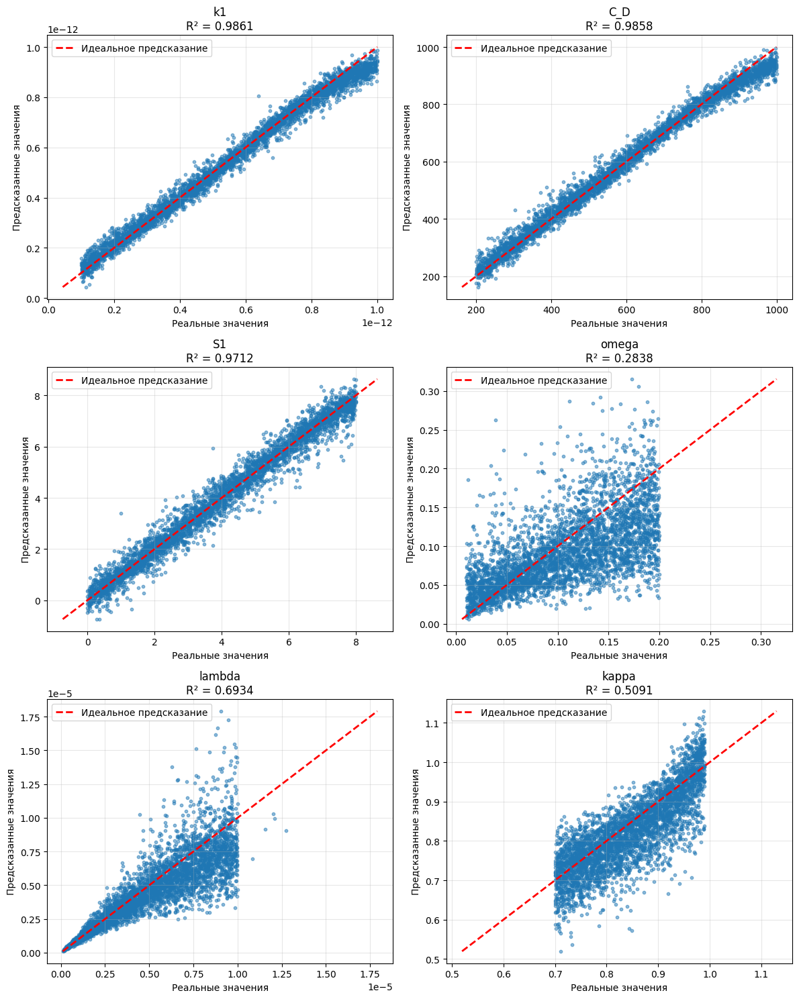

In [23]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


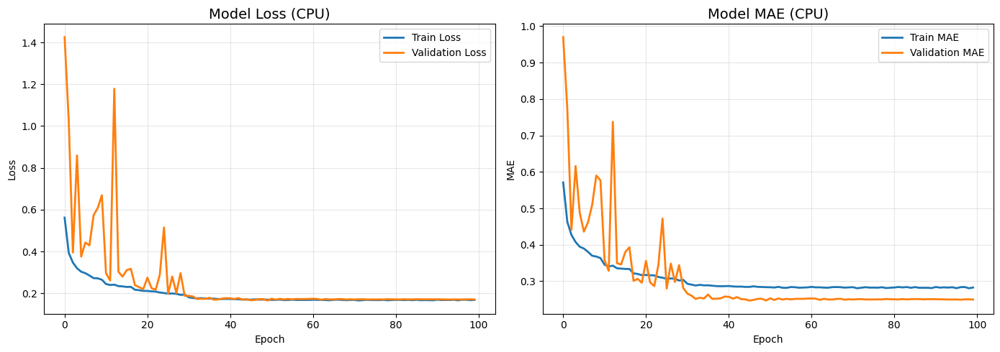

In [24]:
trainer_k.plot_training_history(save_path='training_history.png')

In [25]:
trainer_k.save_model('1d_cnn_model_regression_dual_permeability_inf', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_dual_permeability_inf.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_dual_permeability_inf.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_dual_permeability_inf_config.json


In [26]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_dual_permeability_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_dual_permeability_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to 1d_cnn_model_regression_dual_permeability_inf_scaler_config.json


# Обучение для модели двойной проницаемости для кругогого пласта

In [ ]:
!unzip /content/drive/MyDrive/dual_permeability_fin.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_permeability_fin/params/24.csv  
  inflating: dual_permeability_fin/params/46.csv  
  inflating: dual_permeability_fin/params/48.csv  
  inflating: dual_permeability_fin/params/85.csv  
  inflating: dual_permeability_fin/params/168.csv  
  inflating: dual_permeability_fin/params/183.csv  
  inflating: dual_permeability_fin/params/208.csv  
  inflating: dual_permeability_fin/params/209.csv  
  inflating: dual_permeability_fin/params/215.csv  
  inflating: dual_permeability_fin/params/226.csv  
  inflating: dual_permeability_fin/params/252.csv  
  inflating: dual_permeability_fin/params/268.csv  
  inflating: dual_permeability_fin/params/274.csv  
  inflating: dual_permeability_fin/params/283.csv  
  inflating: dual_permeability_fin/params/290.csv  
  inflating: dual_permeability_fin/params/311.csv  
  inflating: dual_permeability_fin/params/314.csv  
  inflating: dual_permeability_fin/params/319.csv  


In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/dual_permeability_fin',
    model_type=Model.DUAL_PERMEABILITY_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 7).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 7).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 7).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)


Transformed data:  0.008394538529310637 0.7450443070014772 0.12602011050334896
Transformed data:  0.010119040353992786 0.712389612850715 0.12801633661519826
Transformed data:  0.010141075497473334 0.8556031187809154 0.12601662649679135


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)

# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k1
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std


In [ ]:
model = WellTest1DCNN_REG(output_dim=7, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 7)
Валидационные данные: X (2000, 128, 2), y (2000, 7)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.5986 - mae: 0.5503 - mse: 0.5986
Epoch 1: val_loss improved from None to 2.58512, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.4677 - mae: 0.4746 - mse: 0.4677 - val_loss: 2.5851 - val_mae: 1.2928 - val_mse: 2.5851 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3368 - mae: 0.3931 - mse: 0.3368
Epoch 2: val_loss improved from 2.58512 to 0.74246, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.3278 - mae: 0.3863 - mse: 0.3278 - val_loss: 0.7425 - val_mae: 0.6386 - val_mse: 0.7425 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2886 - mae: 0.3629 - mse: 0.2886
Epoch 3: val_loss did not improve from 0.74246
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2825 - mae: 0.3593 - mse: 0.2825 - val_loss: 0.7431 - val_mae: 0.6661 - val_mse: 0.7431 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2566 - mae: 0.3409 - mse: 0.2566
Epoch 4: val_loss did not improve from 0.74246
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.2539 - mae: 0.3386 - mse: 0.2539 - val_loss: 1.3648 - val_mae: 0.7611 - val_mse: 1.3648 - learning_rate: 5.00


Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2416 - mae: 0.3273 - mse: 0.2416 - val_loss: 0.6632 - val_mae: 0.5345 - val_mse: 0.6632 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2228 - mae: 0.3162 - mse: 0.2228
Epoch 6: val_loss improved from 0.66324 to 0.35701, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2279 - mae: 0.3195 - mse: 0.2279 - val_loss: 0.3570 - val_mae: 0.4189 - val_mse: 0.3570 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2237 - mae: 0.3127 - mse: 0.2237
Epoch 7: val_loss did not improve from 0.35701
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.2234 - mae: 0.3127 - mse: 0.2234 - val_loss: 0.3675 - val_mae: 0.4075 - val_mse: 0.3675 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2214 - mae: 0.3123 - mse: 0.2214
Epoch 8: val_loss did not improve from 0.35701
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.2214 - mae: 0.3133 - mse: 0.2214 - val_loss: 0.7651 - val_mae: 0.5561 - val_mse: 0.7651 - learning_rate: 5.00


Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2057 - mae: 0.2990 - mse: 0.2057 - val_loss: 0.3421 - val_mae: 0.3504 - val_mse: 0.3421 - learning_rate: 5.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 10/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2057 - mae: 0.3006 - mse: 0.2057
Epoch 10: val_loss did not improve from 0.34206
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2027 - mae: 0.2978 - mse: 0.2027 - val_loss: 0.7812 - val_mae: 0.6172 - val_mse: 0.7812 - learning_rate: 5.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 11/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2056 - mae: 0.2975 - mse: 0.2056
Epoch 11: val_loss improved from 0.34206 to 0.26169, saving model to best_model_regression.h5



Epoch 11: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2006 - mae: 0.2942 - mse: 0.2006 - val_loss: 0.2617 - val_mae: 0.3191 - val_mse: 0.2617 - learning_rate: 5.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 12/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1940 - mae: 0.2909 - mse: 0.1940
Epoch 12: val_loss did not improve from 0.26169
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1954 - mae: 0.2912 - mse: 0.1954 - val_loss: 0.4301 - val_mae: 0.4421 - val_mse: 0.4301 - learning_rate: 5.0000e-04

Epoch 13: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 13/100
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1921 - mae: 0.2872 - mse: 0.1921
Epoch 13: val_loss did not improve from 0.26169
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.1922 - mae: 0.2885 - mse: 0.1922 - val_loss: 0.9951 - val_mae: 0.7320 - val_mse: 0.9951 - learning_ra


Epoch 19: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1671 - mae: 0.2643 - mse: 0.1671 - val_loss: 0.1825 - val_mae: 0.2717 - val_mse: 0.1825 - learning_rate: 2.5000e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 20/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1628 - mae: 0.2610 - mse: 0.1628
Epoch 20: val_loss did not improve from 0.18250
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1628 - mae: 0.2605 - mse: 0.1628 - val_loss: 0.2938 - val_mae: 0.3140 - val_mse: 0.2938 - learning_rate: 2.5000e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 21/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1628 - mae: 0.2602 - mse: 0.1628
Epoch 21: val_loss did not improve from 0.18250
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1651 - mae: 0.2619 - mse: 0.1651 - val_loss: 0.4081 - val_mae: 0.4532 - val_mse: 0.4081 - learning_rat


Epoch 25: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1535 - mae: 0.2506 - mse: 0.1535 - val_loss: 0.1448 - val_mae: 0.2324 - val_mse: 0.1448 - learning_rate: 1.2500e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 26/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1479 - mae: 0.2460 - mse: 0.1479
Epoch 26: val_loss did not improve from 0.14480
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1511 - mae: 0.2487 - mse: 0.1511 - val_loss: 0.2177 - val_mae: 0.3230 - val_mse: 0.2177 - learning_rate: 1.2500e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 27/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1507 - mae: 0.2479 - mse: 0.1507
Epoch 27: val_loss did not improve from 0.14480
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1508 - mae: 0.2487 - mse: 0.1508 - val_loss: 0.2239 - val_mae: 0.3024 - val_mse: 0.2239 - learning_rat


Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1421 - mae: 0.2400 - mse: 0.1421 - val_loss: 0.1220 - val_mae: 0.1961 - val_mse: 0.1220 - learning_rate: 6.2500e-06

Epoch 32: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 32/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1398 - mae: 0.2381 - mse: 0.1398
Epoch 32: val_loss improved from 0.12204 to 0.12003, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1406 - mae: 0.2380 - mse: 0.1406 - val_loss: 0.1200 - val_mae: 0.1926 - val_mse: 0.1200 - learning_rate: 6.2500e-06

Epoch 33: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 33/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1390 - mae: 0.2387 - mse: 0.1390
Epoch 33: val_loss improved from 0.12003 to 0.11938, saving model to best_model_regression.h5



Epoch 33: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1409 - mae: 0.2394 - mse: 0.1409 - val_loss: 0.1194 - val_mae: 0.1905 - val_mse: 0.1194 - learning_rate: 6.2500e-06

Epoch 34: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 34/100
208/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1387 - mae: 0.2357 - mse: 0.1387
Epoch 34: val_loss did not improve from 0.11938
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1393 - mae: 0.2371 - mse: 0.1393 - val_loss: 0.1198 - val_mae: 0.1914 - val_mse: 0.1198 - learning_rate: 6.2500e-06

Epoch 35: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 35/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1411 - mae: 0.2383 - mse: 0.1411
Epoch 35: val_loss did not improve from 0.11938
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1403 - mae: 0.2383 - mse: 0.1403 - val_loss: 0.1199 - val_mae: 0.1902 - val_mse: 0.1199 - learning_rat


Epoch 37: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1406 - mae: 0.2391 - mse: 0.1406 - val_loss: 0.1192 - val_mae: 0.1898 - val_mse: 0.1192 - learning_rate: 6.2500e-06

Epoch 38: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 38/100
209/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1419 - mae: 0.2401 - mse: 0.1419
Epoch 38: val_loss did not improve from 0.11922
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1428 - mae: 0.2411 - mse: 0.1428 - val_loss: 0.1204 - val_mae: 0.1930 - val_mse: 0.1204 - learning_rate: 6.2500e-06

Epoch 39: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 39/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1386 - mae: 0.2374 - mse: 0.1386
Epoch 39: val_loss did not improve from 0.11922
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1394 - mae: 0.2381 - mse: 0.1394 - val_loss: 0.1194 - val_mae: 0.1919 - val_mse: 0.1194 - learning_rat


Epoch 41: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1401 - mae: 0.2385 - mse: 0.1401 - val_loss: 0.1190 - val_mae: 0.1893 - val_mse: 0.1190 - learning_rate: 6.2500e-06

Epoch 42: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 42/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1376 - mae: 0.2364 - mse: 0.1376
Epoch 42: val_loss did not improve from 0.11903
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1388 - mae: 0.2368 - mse: 0.1388 - val_loss: 0.1193 - val_mae: 0.1906 - val_mse: 0.1193 - learning_rate: 6.2500e-06

Epoch 43: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 43/100
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1392 - mae: 0.2371 - mse: 0.1392
Epoch 43: val_loss did not improve from 0.11903
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1388 - mae: 0.2377 - mse: 0.1388 - val_loss: 0.1197 - val_mae: 0.1906 - val_mse: 0.1197 - learning_rat


Epoch 45: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.1376 - mae: 0.2363 - mse: 0.1376 - val_loss: 0.1188 - val_mae: 0.1899 - val_mse: 0.1188 - learning_rate: 6.2500e-06

Epoch 46: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 46/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1369 - mae: 0.2356 - mse: 0.1369
Epoch 46: val_loss did not improve from 0.11879
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1384 - mae: 0.2369 - mse: 0.1384 - val_loss: 0.1194 - val_mae: 0.1905 - val_mse: 0.1194 - learning_rate: 6.2500e-06

Epoch 47: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 47/100
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1384 - mae: 0.2370 - mse: 0.1384
Epoch 47: val_loss did not improve from 0.11879
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1375 - mae: 0.2359 - mse: 0.1375 - val_loss: 0.1199 - val_mae: 0.1902 - val_mse: 0.1199 - learning_ra


Epoch 51: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1381 - mae: 0.2368 - mse: 0.1381 - val_loss: 0.1186 - val_mae: 0.1888 - val_mse: 0.1186 - learning_rate: 3.1250e-07

Epoch 52: LearningRateScheduler setting learning rate to 3.125000205272954e-07.
Epoch 52/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1427 - mae: 0.2396 - mse: 0.1427
Epoch 52: val_loss improved from 0.11862 to 0.11862, saving model to best_model_regression.h5



Epoch 52: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1390 - mae: 0.2374 - mse: 0.1390 - val_loss: 0.1186 - val_mae: 0.1890 - val_mse: 0.1186 - learning_rate: 3.1250e-07

Epoch 53: LearningRateScheduler setting learning rate to 3.125000205272954e-07.
Epoch 53/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1372 - mae: 0.2365 - mse: 0.1372
Epoch 53: val_loss improved from 0.11862 to 0.11858, saving model to best_model_regression.h5



Epoch 53: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1376 - mae: 0.2359 - mse: 0.1376 - val_loss: 0.1186 - val_mae: 0.1889 - val_mse: 0.1186 - learning_rate: 3.1250e-07

Epoch 54: LearningRateScheduler setting learning rate to 3.125000205272954e-07.
Epoch 54/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1389 - mae: 0.2378 - mse: 0.1389
Epoch 54: val_loss improved from 0.11858 to 0.11857, saving model to best_model_regression.h5



Epoch 54: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1382 - mae: 0.2367 - mse: 0.1382 - val_loss: 0.1186 - val_mae: 0.1887 - val_mse: 0.1186 - learning_rate: 3.1250e-07

Epoch 55: LearningRateScheduler setting learning rate to 3.125000205272954e-07.
Epoch 55/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1397 - mae: 0.2361 - mse: 0.1397
Epoch 55: val_loss improved from 0.11857 to 0.11849, saving model to best_model_regression.h5



Epoch 55: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1381 - mae: 0.2359 - mse: 0.1381 - val_loss: 0.1185 - val_mae: 0.1886 - val_mse: 0.1185 - learning_rate: 3.1250e-07

Epoch 56: LearningRateScheduler setting learning rate to 3.125000205272954e-07.
Epoch 56/100
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1362 - mae: 0.2352 - mse: 0.1362
Epoch 56: val_loss improved from 0.11849 to 0.11840, saving model to best_model_regression.h5



Epoch 56: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1366 - mae: 0.2354 - mse: 0.1366 - val_loss: 0.1184 - val_mae: 0.1885 - val_mse: 0.1184 - learning_rate: 3.1250e-07

Epoch 57: LearningRateScheduler setting learning rate to 3.125000205272954e-07.
Epoch 57/100
209/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1386 - mae: 0.2367 - mse: 0.1386
Epoch 57: val_loss did not improve from 0.11840
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1380 - mae: 0.2362 - mse: 0.1380 - val_loss: 0.1185 - val_mae: 0.1887 - val_mse: 0.1185 - learning_rate: 3.1250e-07

Epoch 58: LearningRateScheduler setting learning rate to 3.125000205272954e-07.
Epoch 58/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1377 - mae: 0.2357 - mse: 0.1377
Epoch 58: val_loss did not improve from 0.11840
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1374 - mae: 0.2359 - mse: 0.1374 - val_loss: 0.1185 - val_mae: 0.1888 - val_mse: 0.1185 - learning_rat


Epoch 65: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1382 - mae: 0.2369 - mse: 0.1382 - val_loss: 0.1183 - val_mae: 0.1885 - val_mse: 0.1183 - learning_rate: 3.1250e-07

Epoch 66: LearningRateScheduler setting learning rate to 3.125000205272954e-07.
Epoch 66/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1372 - mae: 0.2357 - mse: 0.1372
Epoch 66: val_loss did not improve from 0.11835
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1380 - mae: 0.2358 - mse: 0.1380 - val_loss: 0.1185 - val_mae: 0.1886 - val_mse: 0.1185 - learning_rate: 3.1250e-07

Epoch 67: LearningRateScheduler setting learning rate to 3.125000205272954e-07.
Epoch 67/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1351 - mae: 0.2332 - mse: 0.1351
Epoch 67: val_loss did not improve from 0.11835
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1364 - mae: 0.2347 - mse: 0.1364 - val_loss: 0.1185 - val_mae: 0.1887 - val_mse: 0.1185 - learning_rat


Epoch 83: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.1370 - mae: 0.2358 - mse: 0.1370 - val_loss: 0.1183 - val_mae: 0.1884 - val_mse: 0.1183 - learning_rate: 3.1250e-08

Epoch 84: LearningRateScheduler setting learning rate to 3.1250003473815013e-08.
Epoch 84/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1374 - mae: 0.2349 - mse: 0.1374
Epoch 84: val_loss did not improve from 0.11835
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1372 - mae: 0.2353 - mse: 0.1372 - val_loss: 0.1184 - val_mae: 0.1884 - val_mse: 0.1184 - learning_rate: 3.1250e-08

Epoch 85: LearningRateScheduler setting learning rate to 3.1250003473815013e-08.
Epoch 85/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1395 - mae: 0.2374 - mse: 0.1395
Epoch 85: val_loss did not improve from 0.11835
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1379 - mae: 0.2362 - mse: 0.1379 - val_loss: 0.1185 - val_mae: 0.1887 - val_mse: 0.1185 - learning_

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.1169
  mae: 0.1877
  mse: 0.1169

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  5.3674e-29
    MAE:  4.6766e-15
    R²:   0.9935

  C_D:
    MSE:  6.0941e+01
    MAE:  4.6168e+00
    R²:   0.9925

  S1:
    MSE:  9.9185e-02
    MAE:  2.2692e-01
    R²:   0.9880

  omega:
    MSE:  3.4358e-04
    MAE:  1.3118e-02
    R²:   0.7747

  lambda:
    MSE:  2.3262e-12
    MAE:  7.2659e-07
    R²:   0.9291

  kappa:
    MSE:  2.4232e-03
    MAE:  3.9822e-02
    R²:   0.5340

  r_D_e:
    MSE:  2.4177e+05
    MAE:  3.2580e+02
    R²:   0.9676


Количество выходов: 7
Форма y_test_orig: (4000, 7)
Results: -3.524728769014403e-15 6.919430848607855e-13
Results: 1.014107549747334e-14 8.556031187809155e-13


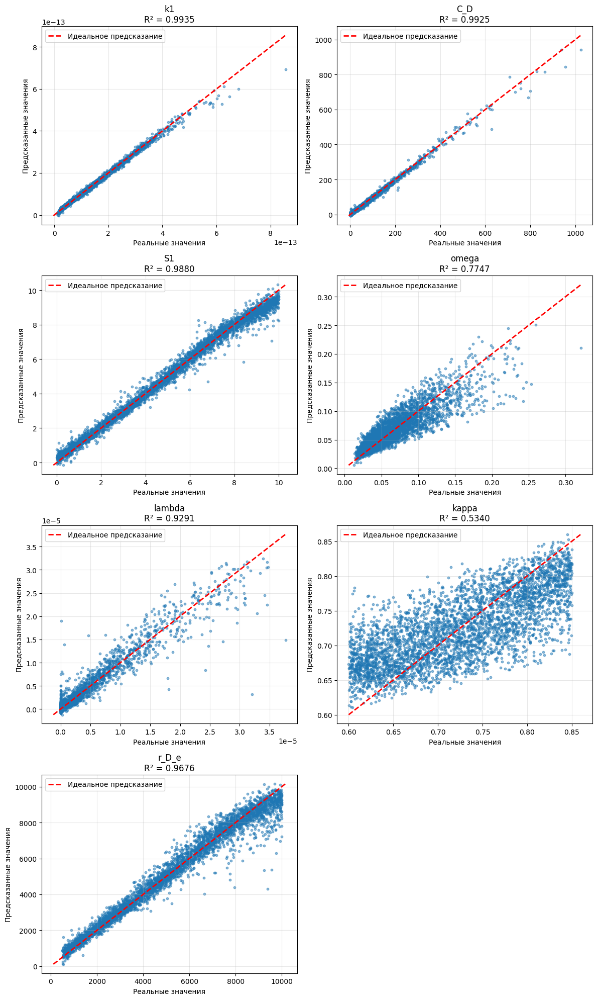

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


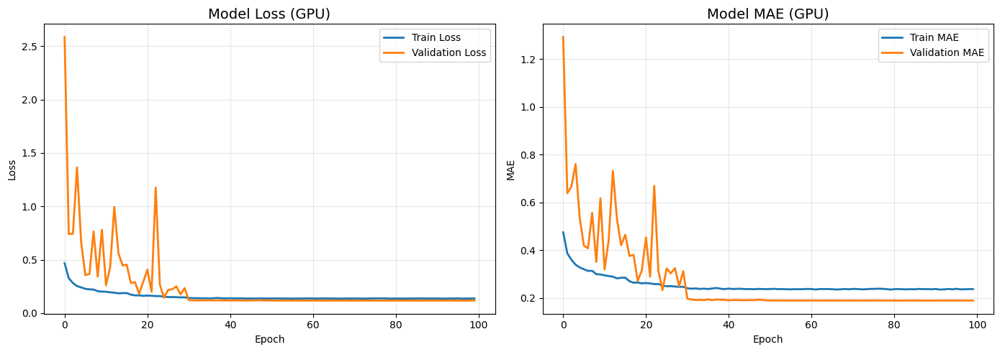

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_dual_permeability_fin', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_dual_permeability_fin.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_dual_permeability_fin.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_dual_permeability_fin_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_dual_permeability_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_dual_permeability_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение для модели двойной проницаемости для кругогого пласта разные train, val, test

In [15]:
!unzip /content/drive/MyDrive/datasets/dual_permeability_fin.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_permeability_fin/params/24.csv  
  inflating: dual_permeability_fin/params/46.csv  
  inflating: dual_permeability_fin/params/48.csv  
  inflating: dual_permeability_fin/params/85.csv  
  inflating: dual_permeability_fin/params/168.csv  
  inflating: dual_permeability_fin/params/183.csv  
  inflating: dual_permeability_fin/params/208.csv  
  inflating: dual_permeability_fin/params/209.csv  
  inflating: dual_permeability_fin/params/215.csv  
  inflating: dual_permeability_fin/params/226.csv  
  inflating: dual_permeability_fin/params/252.csv  
  inflating: dual_permeability_fin/params/268.csv  
  inflating: dual_permeability_fin/params/274.csv  
  inflating: dual_permeability_fin/params/283.csv  
  inflating: dual_permeability_fin/params/290.csv  
  inflating: dual_permeability_fin/params/311.csv  
  inflating: dual_permeability_fin/params/314.csv  
  inflating: dual_permeability_fin/params/319.csv  


In [16]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/dual_permeability_fin',
    model_type=Model.DUAL_PERMEABILITY_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k1': np.float64(1.4226049936122885e-14), 'C_D': np.float64(627.346313850232), 'S1': np.float64(2.018753905555582), 'omega': np.float64(0.2110915489488426), 'lambda': np.float64(2.330407844024518e-06), 'kappa': np.float64(0.7040779752549975), 'R_eD': np.float64(8879.414371374216), 'data_type': 'train'}


In [17]:
y_train_reg_reshaped = y_train.reshape(-1, 7).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 7).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 7).astype(np.float64)

In [18]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [19]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)


In [20]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [21]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)

# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k1
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [22]:
model = WellTest1DCNN_REG(output_dim=7, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
GPU не обнаружен, используется CPU

НАЧАЛО ОБУЧЕНИЯ НА CPU (REGRESSION)
Устройство: CPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 7)
Валидационные данные: X (2000, 128, 2), y (2000, 7)
Эпохи: 100
📊 TensorBoard logs will be saved to: training_checkpoints_regression/tensorboard/20260518_091342
   Profile mode: Disabled (CPU mode)

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.7005 - mae: 0.6535 - mse: 0.7005
Epoch 1: val_loss improved from None to 1.12909, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.5756 - mae: 0.5778 - mse: 0.5756 - val_loss: 1.1291 - val_mae: 0.8705 - val_mse: 1.1291 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.4619 - mae: 0.5038 - mse: 0.4619
Epoch 2: val_loss improved from 1.12909 to 1.02945, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.4526 - mae: 0.4954 - mse: 0.4526 - val_loss: 1.0294 - val_mae: 0.7750 - val_mse: 1.0294 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.4250 - mae: 0.4770 - mse: 0.4250
Epoch 3: val_loss improved from 1.02945 to 0.39963, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.4106 - mae: 0.4682 - mse: 0.4106 - val_loss: 0.3996 - val_mae: 0.4844 - val_mse: 0.3996 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3800 - mae: 0.4489 - mse: 0.3800
Epoch 4: val_loss improved from 0.39963 to 0.34951, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.3767 - mae: 0.4469 - mse: 0.3767 - val_loss: 0.3495 - val_mae: 0.4346 - val_mse: 0.3495 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3565 - mae: 0.4327 - mse: 0.3565
Epoch 5: val_loss did not improve from 0.34951
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3449 - mae: 0.4248 - mse: 0.3449 - val_loss: 0.3762 - val_mae: 0.4690 - val_mse: 0.3762 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3262 - mae: 0.4113 - mse: 0.3262
Epoch 6: val_loss improved from 0.34951 to 0.33822, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3247 - mae: 0.4089 - mse: 0.3247 - val_loss: 0.3382 - val_mae: 0.4265 - val_mse: 0.3382 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3154 - mae: 0.4007 - mse: 0.3154
Epoch 7: val_loss did not improve from 0.33822
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.3086 - mae: 0.3968 - mse: 0.3086 - val_loss: 0.3430 - val_mae: 0.3907 - val_mse: 0.3430 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3009 - mae: 0.3902 - mse: 0.3009
Epoch 8: val_loss did not improve from 0.33822
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2971 - mae: 0.3882 - mse: 0.2971 - val_loss: 0.3740 - val_mae: 0.4359 - val_mse: 0.3740 - learning_rate:


Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2888 - mae: 0.3831 - mse: 0.2888 - val_loss: 0.3086 - val_mae: 0.3811 - val_mse: 0.3086 - learning_rate: 5.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 10/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2800 - mae: 0.3761 - mse: 0.2800
Epoch 10: val_loss improved from 0.30864 to 0.27098, saving model to best_model_regression.h5



Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2817 - mae: 0.3767 - mse: 0.2817 - val_loss: 0.2710 - val_mae: 0.3526 - val_mse: 0.2710 - learning_rate: 5.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 11/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2801 - mae: 0.3739 - mse: 0.2801
Epoch 11: val_loss did not improve from 0.27098
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2766 - mae: 0.3727 - mse: 0.2766 - val_loss: 0.5244 - val_mae: 0.5176 - val_mse: 0.5244 - learning_rate: 5.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 12/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2744 - mae: 0.3720 - mse: 0.2744
Epoch 12: val_loss did not improve from 0.27098
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2721 - mae: 0.3688 - mse: 0.2721 - val_loss: 0.2835 - val_mae: 0.3772 - val_mse: 0.2835 - learnin


Epoch 13: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2661 - mae: 0.3651 - mse: 0.2661 - val_loss: 0.2462 - val_mae: 0.3348 - val_mse: 0.2462 - learning_rate: 5.0000e-04

Epoch 14: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 14/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2641 - mae: 0.3624 - mse: 0.2641
Epoch 14: val_loss did not improve from 0.24623
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2624 - mae: 0.3610 - mse: 0.2624 - val_loss: 0.2879 - val_mae: 0.4167 - val_mse: 0.2879 - learning_rate: 5.0000e-04

Epoch 15: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 15/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.2619 - mae: 0.3623 - mse: 0.2619
Epoch 15: val_loss did not improve from 0.24623
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2584 - mae: 0.3581 - mse: 0.2584 - val_loss: 0.3354 - val_mae: 0.3826 - val_mse: 0.3354 - learnin


Epoch 16: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2510 - mae: 0.3518 - mse: 0.2510 - val_loss: 0.2402 - val_mae: 0.3572 - val_mse: 0.2402 - learning_rate: 5.0000e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 17/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2537 - mae: 0.3534 - mse: 0.2537
Epoch 17: val_loss improved from 0.24024 to 0.22467, saving model to best_model_regression.h5



Epoch 17: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2504 - mae: 0.3518 - mse: 0.2504 - val_loss: 0.2247 - val_mae: 0.3322 - val_mse: 0.2247 - learning_rate: 5.0000e-04

Epoch 18: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 18/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2526 - mae: 0.3526 - mse: 0.2526
Epoch 18: val_loss improved from 0.22467 to 0.22230, saving model to best_model_regression.h5



Epoch 18: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2475 - mae: 0.3486 - mse: 0.2475 - val_loss: 0.2223 - val_mae: 0.3463 - val_mse: 0.2223 - learning_rate: 5.0000e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 19/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2467 - mae: 0.3480 - mse: 0.2467
Epoch 19: val_loss did not improve from 0.22230
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2455 - mae: 0.3478 - mse: 0.2455 - val_loss: 0.2756 - val_mae: 0.3698 - val_mse: 0.2756 - learning_rate: 5.0000e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 20/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2416 - mae: 0.3459 - mse: 0.2416
Epoch 20: val_loss improved from 0.22230 to 0.22086, saving model to best_model_regression.h5



Epoch 20: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2427 - mae: 0.3459 - mse: 0.2427 - val_loss: 0.2209 - val_mae: 0.3170 - val_mse: 0.2209 - learning_rate: 5.0000e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 21/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2349 - mae: 0.3398 - mse: 0.2349
Epoch 21: val_loss did not improve from 0.22086
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2374 - mae: 0.3425 - mse: 0.2374 - val_loss: 0.3744 - val_mae: 0.4178 - val_mse: 0.3744 - learning_rate: 5.0000e-04

Epoch 22: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 22/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.2355 - mae: 0.3410 - mse: 0.2355
Epoch 22: val_loss did not improve from 0.22086
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.2349 - mae: 0.3401 - mse: 0.2349 - val_loss: 0.5486 - val_mae: 0.5318 - val_mse: 0.5486 - learnin


Epoch 26: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2104 - mae: 0.3187 - mse: 0.2104 - val_loss: 0.1898 - val_mae: 0.2846 - val_mse: 0.1898 - learning_rate: 2.5000e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 27/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2087 - mae: 0.3174 - mse: 0.2087
Epoch 27: val_loss improved from 0.18983 to 0.18492, saving model to best_model_regression.h5



Epoch 27: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2072 - mae: 0.3158 - mse: 0.2072 - val_loss: 0.1849 - val_mae: 0.2983 - val_mse: 0.1849 - learning_rate: 2.5000e-04

Epoch 28: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 28/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2089 - mae: 0.3183 - mse: 0.2089
Epoch 28: val_loss improved from 0.18492 to 0.17980, saving model to best_model_regression.h5



Epoch 28: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2067 - mae: 0.3164 - mse: 0.2067 - val_loss: 0.1798 - val_mae: 0.2880 - val_mse: 0.1798 - learning_rate: 2.5000e-04

Epoch 29: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 29/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2035 - mae: 0.3142 - mse: 0.2035
Epoch 29: val_loss did not improve from 0.17980
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2004 - mae: 0.3115 - mse: 0.2004 - val_loss: 0.1866 - val_mae: 0.2795 - val_mse: 0.1866 - learning_rate: 2.5000e-04

Epoch 30: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 30/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1960 - mae: 0.3082 - mse: 0.1960
Epoch 30: val_loss did not improve from 0.17980
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.1996 - mae: 0.3094 - mse: 0.1996 - val_loss: 0.1833 - val_mae: 0.2752 - val_mse: 0.1833 - learnin


Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1830 - mae: 0.2967 - mse: 0.1830 - val_loss: 0.1520 - val_mae: 0.2432 - val_mse: 0.1520 - learning_rate: 2.5000e-05

Epoch 32: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 32/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1788 - mae: 0.2924 - mse: 0.1788
Epoch 32: val_loss did not improve from 0.15201
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1785 - mae: 0.2928 - mse: 0.1785 - val_loss: 0.1565 - val_mae: 0.2475 - val_mse: 0.1565 - learning_rate: 2.5000e-05

Epoch 33: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 33/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1779 - mae: 0.2933 - mse: 0.1779
Epoch 33: val_loss did not improve from 0.15201
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1782 - mae: 0.2929 - mse: 0.1782 - val_loss: 0.1572 - val_mae: 0.2477 - val_mse: 0.1572 - learn


Epoch 38: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1753 - mae: 0.2898 - mse: 0.1753 - val_loss: 0.1520 - val_mae: 0.2423 - val_mse: 0.1520 - learning_rate: 1.2500e-05

Epoch 39: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 39/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1740 - mae: 0.2883 - mse: 0.1740
Epoch 39: val_loss did not improve from 0.15198
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.1748 - mae: 0.2897 - mse: 0.1748 - val_loss: 0.1530 - val_mae: 0.2437 - val_mse: 0.1530 - learning_rate: 1.2500e-05

Epoch 40: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 40/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1726 - mae: 0.2888 - mse: 0.1726
Epoch 40: val_loss did not improve from 0.15198
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1760 - mae: 0.2908 - mse: 0.1760 - val_loss: 0.1599 - val_mae: 0.2481 - val_mse: 0.1599 - learn


Epoch 41: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1745 - mae: 0.2885 - mse: 0.1745 - val_loss: 0.1489 - val_mae: 0.2399 - val_mse: 0.1489 - learning_rate: 1.2500e-05

Epoch 42: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 42/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1759 - mae: 0.2900 - mse: 0.1759
Epoch 42: val_loss did not improve from 0.14890
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.1740 - mae: 0.2889 - mse: 0.1740 - val_loss: 0.1545 - val_mae: 0.2442 - val_mse: 0.1545 - learning_rate: 1.2500e-05

Epoch 43: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 43/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1758 - mae: 0.2893 - mse: 0.1758
Epoch 43: val_loss did not improve from 0.14890
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1750 - mae: 0.2893 - mse: 0.1750 - val_loss: 0.1587 - val_mae: 0.2473 - val_mse: 0.1587 - learn

✅ Информация об обучении сохранена в training_metrics_regression.json


In [23]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.1081
  mae: 0.2142
  mse: 0.1081

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  1.5612e-27
    MAE:  2.9755e-14
    R²:   0.9768

  C_D:
    MSE:  7.3381e+02
    MAE:  2.0454e+01
    R²:   0.9863

  S1:
    MSE:  7.5013e-01
    MAE:  5.9045e-01
    R²:   0.8561

  omega:
    MSE:  2.3043e-03
    MAE:  3.6615e-02
    R²:   0.2426

  lambda:
    MSE:  2.6987e-12
    MAE:  1.1386e-06
    R²:   0.6512

  kappa:
    MSE:  3.6389e-03
    MAE:  4.6802e-02
    R²:   0.4782

  r_D_e:
    MSE:  5.5661e+05
    MAE:  4.7127e+02
    R²:   0.8158


Количество выходов: 7
Форма y_test_orig: (4000, 7)
Results: 5.880900286062488e-14 9.710013825978137e-13
Results: 1.000404560786794e-13 9.999100709997228e-13


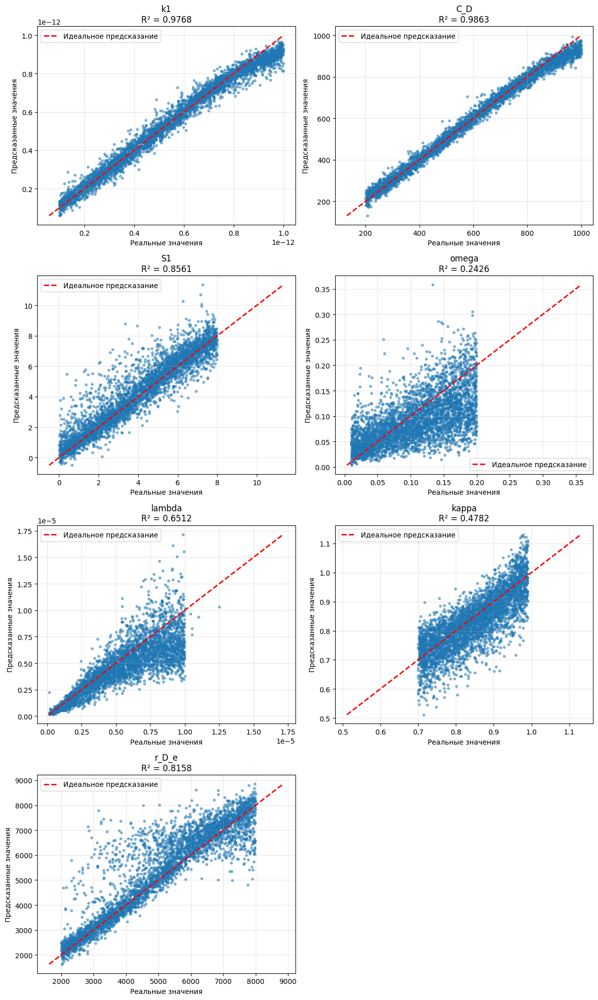

In [24]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


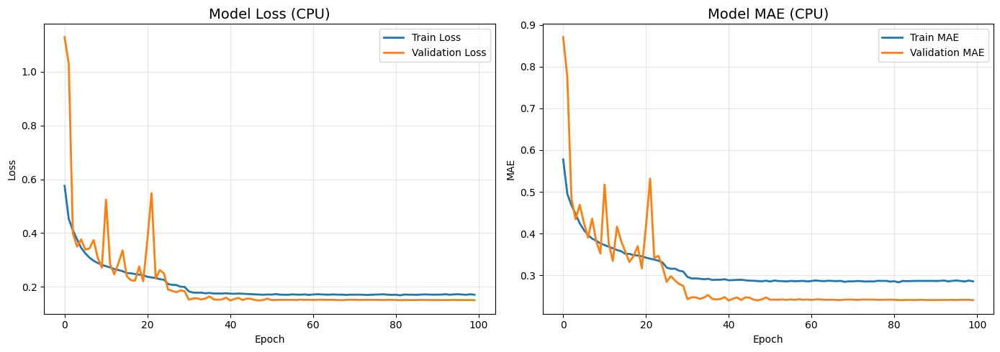

In [25]:
trainer_k.plot_training_history(save_path='training_history.png')

In [26]:
trainer_k.save_model('1d_cnn_model_regression_dual_permeability_fin', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_dual_permeability_fin.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_dual_permeability_fin.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_dual_permeability_fin_config.json


In [27]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_dual_permeability_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_dual_permeability_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to 1d_cnn_model_regression_dual_permeability_fin_scaler_config.json


# Обучение для модели радиально композитной модели

In [ ]:
!unzip /content/drive/MyDrive/radial_composite_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: radial_composite_inf/params/24.csv  
  inflating: radial_composite_inf/params/46.csv  
  inflating: radial_composite_inf/params/48.csv  
  inflating: radial_composite_inf/params/85.csv  
  inflating: radial_composite_inf/params/168.csv  
  inflating: radial_composite_inf/params/183.csv  
  inflating: radial_composite_inf/params/208.csv  
  inflating: radial_composite_inf/params/209.csv  
  inflating: radial_composite_inf/params/215.csv  
  inflating: radial_composite_inf/params/226.csv  
  inflating: radial_composite_inf/params/252.csv  
  inflating: radial_composite_inf/params/268.csv  
  inflating: radial_composite_inf/params/274.csv  
  inflating: radial_composite_inf/params/283.csv  
  inflating: radial_composite_inf/params/290.csv  
  inflating: radial_composite_inf/params/311.csv  
  inflating: radial_composite_inf/params/314.csv  
  inflating: radial_composite_inf/params/319.csv  
  inflating: radia

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/radial_composite_inf',
    model_type=Model.RADIAL_COMPOSITE_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

Transformed data:  26365178.293480657 9946384740.8392 2322823509.4012012
Transformed data:  29455492.27288106 9674755533.146101 2304857927.3863063
Transformed data:  30719512.717318684 9685434647.6262 2338439408.4242496


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std


In [ ]:
model = WellTest1DCNN_REG(output_dim=6, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S', 'M12', 'omega12', 'r_fD']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 6)
Валидационные данные: X (2000, 128, 2), y (2000, 6)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.7664 - mae: 0.4928 - mse: 0.7664
Epoch 1: val_loss improved from None to 4.25213, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.5979 - mae: 0.4109 - mse: 0.5979 - val_loss: 4.2521 - val_mae: 1.4128 - val_mse: 4.2521 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4361 - mae: 0.3140 - mse: 0.4361
Epoch 2: val_loss improved from 4.25213 to 1.08431, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.3997 - mae: 0.2974 - mse: 0.3997 - val_loss: 1.0843 - val_mae: 0.6402 - val_mse: 1.0843 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
216/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3524 - mae: 0.2662 - mse: 0.3524
Epoch 3: val_loss improved from 1.08431 to 0.57979, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.3558 - mae: 0.2620 - mse: 0.3558 - val_loss: 0.5798 - val_mae: 0.3427 - val_mse: 0.5798 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3357 - mae: 0.2534 - mse: 0.3357
Epoch 4: val_loss did not improve from 0.57979
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.3369 - mae: 0.2465 - mse: 0.3369 - val_loss: 0.7148 - val_mae: 0.5045 - val_mse: 0.7148 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3018 - mae: 0.2344 - mse: 0.3018
Epoch 5: val_loss did not improve from 0.57979
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.3238 - mae: 0.2365 - mse: 0.3238 - val_loss: 0.6455 - val_mae: 0.3816 - val_mse: 0.6455 - learning_rate: 5.00


Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2886 - mae: 0.2024 - mse: 0.2886 - val_loss: 0.3513 - val_mae: 0.1995 - val_mse: 0.3513 - learning_rate: 2.5000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 10/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2971 - mae: 0.2059 - mse: 0.2971
Epoch 10: val_loss improved from 0.35126 to 0.34446, saving model to best_model_regression.h5



Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2855 - mae: 0.2020 - mse: 0.2855 - val_loss: 0.3445 - val_mae: 0.1726 - val_mse: 0.3445 - learning_rate: 2.5000e-04

Epoch 11: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 11/100
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3028 - mae: 0.2021 - mse: 0.3028
Epoch 11: val_loss improved from 0.34446 to 0.33512, saving model to best_model_regression.h5



Epoch 11: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2792 - mae: 0.1985 - mse: 0.2792 - val_loss: 0.3351 - val_mae: 0.1670 - val_mse: 0.3351 - learning_rate: 2.5000e-04

Epoch 12: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 12/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2651 - mae: 0.1963 - mse: 0.2651
Epoch 12: val_loss did not improve from 0.33512
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.2766 - mae: 0.1950 - mse: 0.2766 - val_loss: 0.3670 - val_mae: 0.2174 - val_mse: 0.3670 - learning_rate: 2.5000e-04

Epoch 13: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 13/100
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2676 - mae: 0.1943 - mse: 0.2676
Epoch 13: val_loss did not improve from 0.33512
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2730 - mae: 0.1949 - mse: 0.2730 - val_loss: 0.3422 - val_mae: 0.1788 - val_mse: 0.3422 - learning_rat


Epoch 19: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2451 - mae: 0.1829 - mse: 0.2451 - val_loss: 0.3248 - val_mae: 0.1803 - val_mse: 0.3248 - learning_rate: 1.2500e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 20/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2488 - mae: 0.1880 - mse: 0.2488
Epoch 20: val_loss improved from 0.32480 to 0.28753, saving model to best_model_regression.h5



Epoch 20: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2441 - mae: 0.1875 - mse: 0.2441 - val_loss: 0.2875 - val_mae: 0.1363 - val_mse: 0.2875 - learning_rate: 1.2500e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 21/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2294 - mae: 0.1849 - mse: 0.2294
Epoch 21: val_loss did not improve from 0.28753
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2387 - mae: 0.1868 - mse: 0.2387 - val_loss: 0.3807 - val_mae: 0.2945 - val_mse: 0.3807 - learning_rate: 1.2500e-04

Epoch 22: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 22/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2399 - mae: 0.1861 - mse: 0.2399
Epoch 22: val_loss did not improve from 0.28753
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.2245 - mae: 0.1829 - mse: 0.2245 - val_loss: 0.3249 - val_mae: 0.2133 - val_mse: 0.3249 - learning_ra


Epoch 25: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2123 - mae: 0.1804 - mse: 0.2123 - val_loss: 0.2808 - val_mae: 0.1816 - val_mse: 0.2808 - learning_rate: 1.2500e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 26/100
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2014 - mae: 0.1802 - mse: 0.2014
Epoch 26: val_loss did not improve from 0.28081
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2064 - mae: 0.1784 - mse: 0.2064 - val_loss: 0.2891 - val_mae: 0.2237 - val_mse: 0.2891 - learning_rate: 1.2500e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 27/100
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2010 - mae: 0.1792 - mse: 0.2010
Epoch 27: val_loss did not improve from 0.28081
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1957 - mae: 0.1767 - mse: 0.1957 - val_loss: 0.3299 - val_mae: 0.3042 - val_mse: 0.3299 - learning_rat


Epoch 29: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1820 - mae: 0.1742 - mse: 0.1820 - val_loss: 0.2183 - val_mae: 0.1374 - val_mse: 0.2183 - learning_rate: 1.2500e-04

Epoch 30: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 30/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1907 - mae: 0.1738 - mse: 0.1907
Epoch 30: val_loss did not improve from 0.21835
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1894 - mae: 0.1726 - mse: 0.1894 - val_loss: 0.2915 - val_mae: 0.2221 - val_mse: 0.2915 - learning_rate: 1.2500e-04

Epoch 31: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 31/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1815 - mae: 0.1682 - mse: 0.1815
Epoch 31: val_loss improved from 0.21835 to 0.20755, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.1727 - mae: 0.1639 - mse: 0.1727 - val_loss: 0.2076 - val_mae: 0.1318 - val_mse: 0.2076 - learning_rate: 1.2500e-05

Epoch 32: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 32/100
209/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1695 - mae: 0.1638 - mse: 0.1695
Epoch 32: val_loss improved from 0.20755 to 0.20065, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1680 - mae: 0.1643 - mse: 0.1680 - val_loss: 0.2007 - val_mae: 0.1184 - val_mse: 0.2007 - learning_rate: 1.2500e-05

Epoch 33: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 33/100
215/219 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1690 - mae: 0.1638 - mse: 0.1690
Epoch 33: val_loss did not improve from 0.20065
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1646 - mae: 0.1616 - mse: 0.1646 - val_loss: 0.2025 - val_mae: 0.1174 - val_mse: 0.2025 - learning_rate: 1.2500e-05

Epoch 34: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 34/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1692 - mae: 0.1633 - mse: 0.1692
Epoch 34: val_loss did not improve from 0.20065
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1660 - mae: 0.1624 - mse: 0.1660 - val_loss: 0.2020 - val_mae: 0.1192 - val_mse: 0.2020 - learning_r


Epoch 38: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1598 - mae: 0.1603 - mse: 0.1598 - val_loss: 0.1969 - val_mae: 0.1160 - val_mse: 0.1969 - learning_rate: 6.2500e-06

Epoch 39: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 39/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1628 - mae: 0.1601 - mse: 0.1628
Epoch 39: val_loss did not improve from 0.19692
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.1632 - mae: 0.1610 - mse: 0.1632 - val_loss: 0.1975 - val_mae: 0.1143 - val_mse: 0.1975 - learning_rate: 6.2500e-06

Epoch 40: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 40/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1772 - mae: 0.1609 - mse: 0.1772
Epoch 40: val_loss improved from 0.19692 to 0.19658, saving model to best_model_regression.h5



Epoch 40: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1615 - mae: 0.1610 - mse: 0.1615 - val_loss: 0.1966 - val_mae: 0.1121 - val_mse: 0.1966 - learning_rate: 6.2500e-06

Epoch 41: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 41/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1593 - mae: 0.1581 - mse: 0.1593
Epoch 41: val_loss improved from 0.19658 to 0.19622, saving model to best_model_regression.h5



Epoch 41: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1603 - mae: 0.1603 - mse: 0.1603 - val_loss: 0.1962 - val_mae: 0.1184 - val_mse: 0.1962 - learning_rate: 6.2500e-06

Epoch 42: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 42/100
214/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1466 - mae: 0.1564 - mse: 0.1466
Epoch 42: val_loss improved from 0.19622 to 0.19568, saving model to best_model_regression.h5



Epoch 42: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1571 - mae: 0.1586 - mse: 0.1571 - val_loss: 0.1957 - val_mae: 0.1165 - val_mse: 0.1957 - learning_rate: 6.2500e-06

Epoch 43: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 43/100
209/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1714 - mae: 0.1586 - mse: 0.1714
Epoch 43: val_loss did not improve from 0.19568
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1592 - mae: 0.1594 - mse: 0.1592 - val_loss: 0.1980 - val_mae: 0.1105 - val_mse: 0.1980 - learning_rate: 6.2500e-06

Epoch 44: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 44/100
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1688 - mae: 0.1618 - mse: 0.1688
Epoch 44: val_loss did not improve from 0.19568
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.1618 - mae: 0.1609 - mse: 0.1618 - val_loss: 0.1967 - val_mae: 0.1132 - val_mse: 0.1967 - learning_rat


Epoch 45: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1584 - mae: 0.1587 - mse: 0.1584 - val_loss: 0.1954 - val_mae: 0.1160 - val_mse: 0.1954 - learning_rate: 6.2500e-06

Epoch 46: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 46/100
209/219 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1473 - mae: 0.1577 - mse: 0.1473
Epoch 46: val_loss improved from 0.19538 to 0.19424, saving model to best_model_regression.h5



Epoch 46: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1601 - mae: 0.1598 - mse: 0.1601 - val_loss: 0.1942 - val_mae: 0.1125 - val_mse: 0.1942 - learning_rate: 6.2500e-06

Epoch 47: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 47/100
212/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1708 - mae: 0.1616 - mse: 0.1708
Epoch 47: val_loss did not improve from 0.19424
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1605 - mae: 0.1606 - mse: 0.1605 - val_loss: 0.1951 - val_mae: 0.1123 - val_mse: 0.1951 - learning_rate: 6.2500e-06

Epoch 48: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 48/100
213/219 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1494 - mae: 0.1587 - mse: 0.1494
Epoch 48: val_loss did not improve from 0.19424
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1648 - mae: 0.1606 - mse: 0.1648 - val_loss: 0.1971 - val_mae: 0.1109 - val_mse: 0.1971 - learning_rat

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.1836
  mae: 0.1088
  mse: 0.1836

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  2.5002e-08
    MAE:  1.0348e-04
    R²:   0.9920

  C_D:
    MSE:  1.8822e-01
    MAE:  3.0700e-01
    R²:   0.9773

  S1:
    MSE:  4.9371e+03
    MAE:  3.0481e+01
    R²:   0.9849

  M12:
    MSE:  1.9562e-02
    MAE:  1.0010e-01
    R²:   0.9855

  omega12:
    MSE:  1.2916e+01
    MAE:  9.9936e-01
    R²:   0.6322

  r_fD:
    MSE:  1.0597e+01
    MAE:  7.5548e-01
    R²:   0.5255


Количество выходов: 6
Форма y_test_orig: (4000, 6)
Results: -0.00013701777788810432 0.008758237585425377
Results: 3.0719512717318534e-05 0.009685434647626199


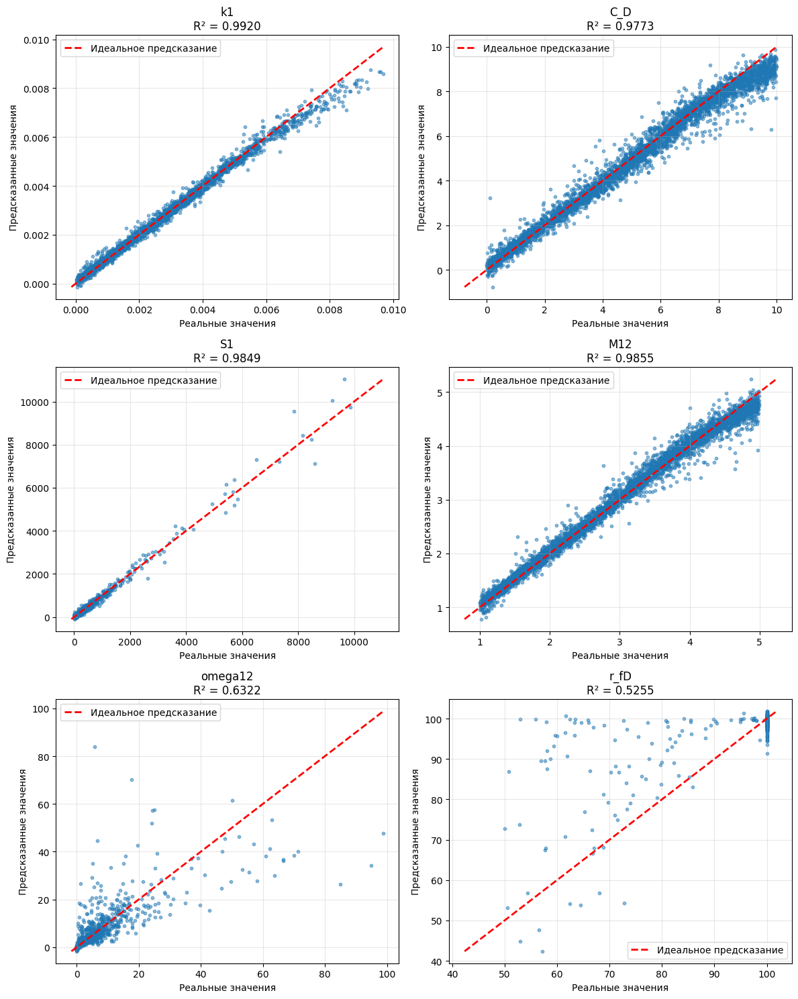

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


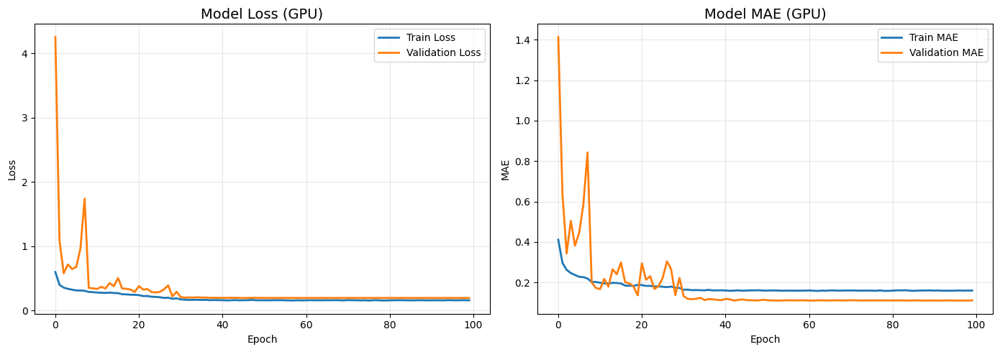

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_radial_composite', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_radial_composite.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_radial_composite.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_radial_composite_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_radial_composite',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_radial_composite_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение для модели радиально композитной модели с разными train, test, val

In [ ]:
!unzip /content/drive/MyDrive/datasets/radial_composite_inf.zip

In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/radial_composite_inf',
    model_type=Model.RADIAL_COMPOSITE_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k1': np.float64(8.335004619601344e-14), 'C_D': np.float64(205.5203378576152), 'S': np.float64(0.3286727028677143), 'omega12': np.float64(0.9061348605804262), 'M12': np.float64(9.024096757658173), 'r_fD': np.float64(189.2027136042627), 'data_type': 'train'}


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std


In [ ]:
model = WellTest1DCNN_REG(output_dim=6, input_shape=(128, 2))

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S', 'M12', 'omega12', 'r_fD']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0001
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
GPU не обнаружен, используется CPU

НАЧАЛО ОБУЧЕНИЯ НА CPU (REGRESSION)
Устройство: CPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 6)
Валидационные данные: X (2000, 128, 2), y (2000, 6)
Эпохи: 100
📊 TensorBoard logs will be saved to: training_checkpoints_regression/tensorboard/20260517_121454
   Profile mode: Disabled (CPU mode)

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 1/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.7793 - mae: 0.7027 - mse: 0.7793
Epoch 1: val_loss improved from None to 0.67101, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - loss: 0.6109 - mae: 0.6110 - mse: 0.6109 - val_loss: 0.6710 - val_mae: 0.6752 - val_mse: 0.6710 - learning_rate: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 2/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.4236 - mae: 0.4951 - mse: 0.4236
Epoch 2: val_loss improved from 0.67101 to 0.39492, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.4094 - mae: 0.4854 - mse: 0.4094 - val_loss: 0.3949 - val_mae: 0.4808 - val_mse: 0.3949 - learning_rate: 1.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3625 - mae: 0.4546 - mse: 0.3625
Epoch 3: val_loss improved from 0.39492 to 0.28744, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3512 - mae: 0.4462 - mse: 0.3512 - val_loss: 0.2874 - val_mae: 0.3962 - val_mse: 0.2874 - learning_rate: 1.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 4/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3167 - mae: 0.4218 - mse: 0.3167
Epoch 4: val_loss improved from 0.28744 to 0.25511, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.3111 - mae: 0.4163 - mse: 0.3111 - val_loss: 0.2551 - val_mae: 0.3599 - val_mse: 0.2551 - learning_rate: 1.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.2841 - mae: 0.3963 - mse: 0.2841
Epoch 5: val_loss improved from 0.25511 to 0.22395, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2810 - mae: 0.3930 - mse: 0.2810 - val_loss: 0.2239 - val_mae: 0.3359 - val_mse: 0.2239 - learning_rate: 1.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 6/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.2627 - mae: 0.3798 - mse: 0.2627
Epoch 6: val_loss did not improve from 0.22395
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.2606 - mae: 0.3781 - mse: 0.2606 - val_loss: 0.2289 - val_mae: 0.3224 - val_mse: 0.2289 - learning_rate: 1.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 7/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2405 - mae: 0.3607 - mse: 0.2405
Epoch 7: val_loss improved from 0.22395 to 0.19996, saving model to best_model_regression.h5



Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2413 - mae: 0.3618 - mse: 0.2413 - val_loss: 0.2000 - val_mae: 0.2975 - val_mse: 0.2000 - learning_rate: 1.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 8/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.2251 - mae: 0.3477 - mse: 0.2251
Epoch 8: val_loss did not improve from 0.19996
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2252 - mae: 0.3476 - mse: 0.2252 - val_loss: 0.2058 - val_mae: 0.3059 - val_mse: 0.2058 - learning_rate: 1.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 9/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2170 - mae: 0.3424 - mse: 0.2170
Epoch 9: val_loss improved from 0.19996 to 0.19614, saving model to best_model_regression.h5



Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2150 - mae: 0.3396 - mse: 0.2150 - val_loss: 0.1961 - val_mae: 0.2995 - val_mse: 0.1961 - learning_rate: 1.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 10/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2035 - mae: 0.3304 - mse: 0.2035
Epoch 10: val_loss improved from 0.19614 to 0.19430, saving model to best_model_regression.h5



Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.2042 - mae: 0.3308 - mse: 0.2042 - val_loss: 0.1943 - val_mae: 0.2954 - val_mse: 0.1943 - learning_rate: 1.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 11/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1954 - mae: 0.3219 - mse: 0.1954
Epoch 11: val_loss did not improve from 0.19430
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1948 - mae: 0.3213 - mse: 0.1948 - val_loss: 0.2191 - val_mae: 0.3234 - val_mse: 0.2191 - learning_rate: 1.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 12/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1914 - mae: 0.3179 - mse: 0.1914
Epoch 12: val_loss improved from 0.19430 to 0.18301, saving model to best_model_regression.h5



Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.1881 - mae: 0.3153 - mse: 0.1881 - val_loss: 0.1830 - val_mae: 0.2796 - val_mse: 0.1830 - learning_rate: 1.0000e-04

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 13/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1789 - mae: 0.3087 - mse: 0.1789
Epoch 13: val_loss improved from 0.18301 to 0.16913, saving model to best_model_regression.h5



Epoch 13: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1825 - mae: 0.3110 - mse: 0.1825 - val_loss: 0.1691 - val_mae: 0.2667 - val_mse: 0.1691 - learning_rate: 1.0000e-04

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 14/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1801 - mae: 0.3098 - mse: 0.1801
Epoch 14: val_loss did not improve from 0.16913
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1758 - mae: 0.3052 - mse: 0.1758 - val_loss: 0.1704 - val_mae: 0.2647 - val_mse: 0.1704 - learning_rate: 1.0000e-04

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 15/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1724 - mae: 0.3016 - mse: 0.1724
Epoch 15: val_loss did not improve from 0.16913
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1719 - mae: 0.3012 - mse: 0.1719 - val_loss: 0.1775 - val_mae: 0.2773 - val_mse: 0.1775 - learnin


Epoch 16: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1654 - mae: 0.2945 - mse: 0.1654 - val_loss: 0.1582 - val_mae: 0.2566 - val_mse: 0.1582 - learning_rate: 1.0000e-04

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 17/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1661 - mae: 0.2957 - mse: 0.1661
Epoch 17: val_loss did not improve from 0.15819
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.1625 - mae: 0.2924 - mse: 0.1625 - val_loss: 0.1665 - val_mae: 0.2532 - val_mse: 0.1665 - learning_rate: 1.0000e-04

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 18/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1555 - mae: 0.2854 - mse: 0.1555
Epoch 18: val_loss did not improve from 0.15819
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1572 - mae: 0.2871 - mse: 0.1572 - val_loss: 0.1615 - val_mae: 0.2551 - val_mse: 0.1615 - learnin


Epoch 19: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1555 - mae: 0.2857 - mse: 0.1555 - val_loss: 0.1464 - val_mae: 0.2388 - val_mse: 0.1464 - learning_rate: 1.0000e-04

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 20/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1507 - mae: 0.2803 - mse: 0.1507
Epoch 20: val_loss did not improve from 0.14635
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1514 - mae: 0.2817 - mse: 0.1514 - val_loss: 0.1642 - val_mae: 0.2488 - val_mse: 0.1642 - learning_rate: 1.0000e-04

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 21/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1501 - mae: 0.2802 - mse: 0.1501
Epoch 21: val_loss did not improve from 0.14635
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1500 - mae: 0.2799 - mse: 0.1500 - val_loss: 0.1736 - val_mae: 0.2635 - val_mse: 0.1736 - learnin


Epoch 26: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1297 - mae: 0.2585 - mse: 0.1297 - val_loss: 0.1390 - val_mae: 0.2190 - val_mse: 0.1390 - learning_rate: 5.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 27/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1267 - mae: 0.2555 - mse: 0.1267
Epoch 27: val_loss did not improve from 0.13901
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.1289 - mae: 0.2574 - mse: 0.1289 - val_loss: 0.1589 - val_mae: 0.2372 - val_mse: 0.1589 - learning_rate: 5.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 28/100
217/219 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1299 - mae: 0.2576 - mse: 0.1299
Epoch 28: val_loss did not improve from 0.13901
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1287 - mae: 0.2573 - mse: 0.1287 - val_loss: 0.1572 - val_mae: 0.2265 - val_mse: 0.1572 - learnin

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0808
  mae: 0.1735
  mse: 0.0808

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  4.4364e-27
    MAE:  4.5357e-14
    R²:   0.9329

  C_D:
    MSE:  1.0085e+03
    MAE:  2.1160e+01
    R²:   0.9811

  S:
    MSE:  8.8716e-01
    MAE:  6.2889e-01
    R²:   0.8323

  M12:
    MSE:  2.9924e+00
    MAE:  7.5280e-01
    R²:   0.7184

  omega12:
    MSE:  8.0054e-01
    MAE:  6.2353e-01
    R²:   0.9000

  r_fD:
    MSE:  1.0229e+04
    MAE:  5.9842e+01
    R²:   0.8494


Количество выходов: 6
Форма y_test_orig: (4000, 6)
Results: 3.380704326509318e-14 9.62022995987244e-13
Results: 1.0020839204759425e-13 9.999285650004926e-13


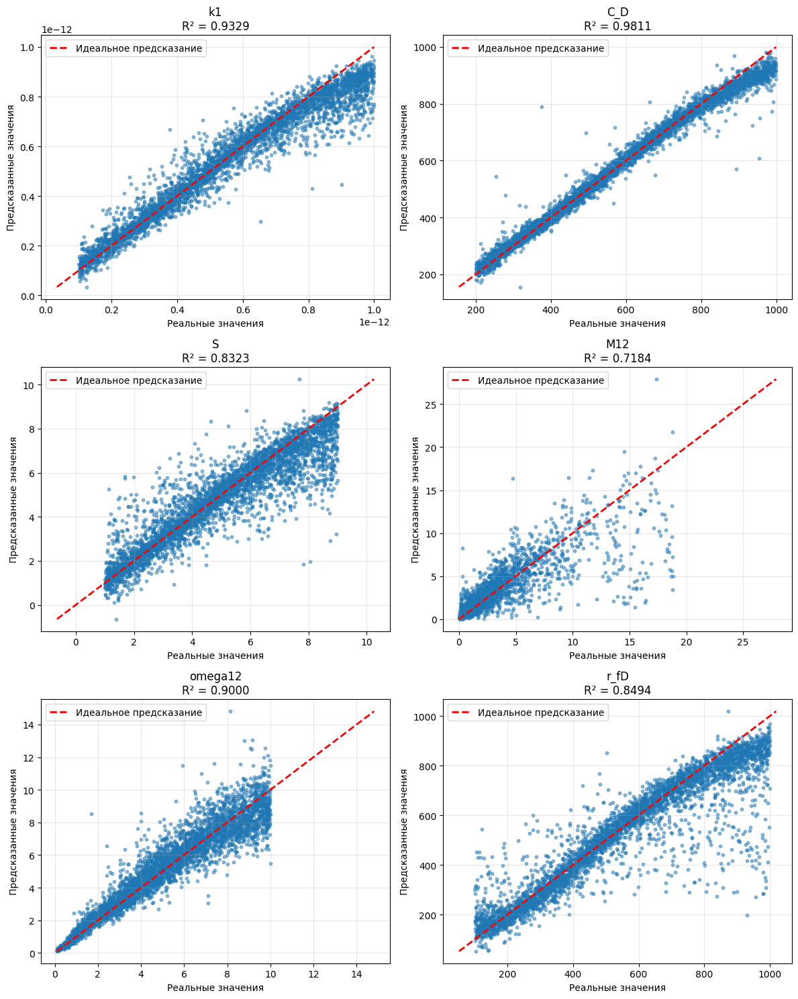

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


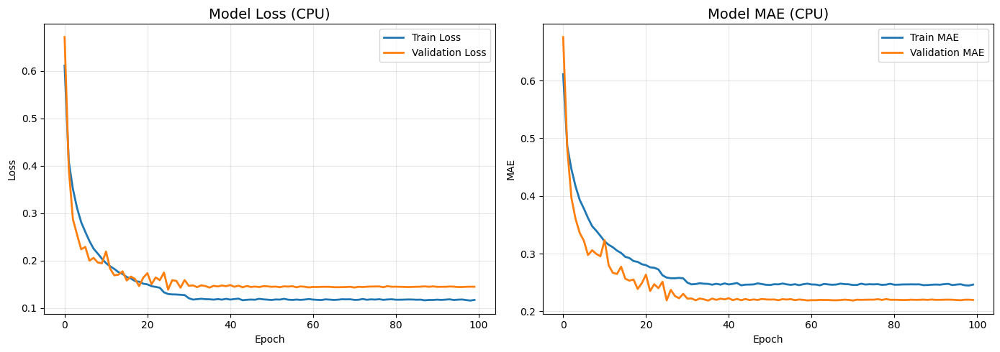

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('1d_cnn_model_regression_radial_composite', format='all')

✅ Веса модели сохранены: 1d_cnn_model_regression_radial_composite.weights.h5
✅ Модель сохранена в Keras format: 1d_cnn_model_regression_radial_composite.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: 1d_cnn_model_regression_radial_composite_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': '1d_cnn_model_regression_radial_composite',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = '1d_cnn_model_regression_radial_composite_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Зависимость качества обучения от шума

In [ ]:
!unzip /content/drive/MyDrive/dataset.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dataset/dataset01/params/45.csv  
  inflating: dataset/dataset01/params/54.csv  
  inflating: dataset/dataset01/params/58.csv  
  inflating: dataset/dataset01/params/121.csv  
  inflating: dataset/dataset01/params/186.csv  
  inflating: dataset/dataset01/params/263.csv  
  inflating: dataset/dataset01/params/294.csv  
  inflating: dataset/dataset01/params/307.csv  
  inflating: dataset/dataset01/params/308.csv  
  inflating: dataset/dataset01/params/341.csv  
  inflating: dataset/dataset01/params/365.csv  
  inflating: dataset/dataset01/params/391.csv  
  inflating: dataset/dataset01/params/424.csv  
  inflating: dataset/dataset01/params/429.csv  
  inflating: dataset/dataset01/params/437.csv  
  inflating: dataset/dataset01/params/459.csv  
  inflating: dataset/dataset01/params/494.csv  
  inflating: dataset/dataset01/params/511.csv  
  inflating: dataset/dataset01/params/549.csv  
  inflating: dataset/da

In [ ]:
def train_with_noize_variance():
    dataset_dirs = [
        '/content/dataset/dataset01',
        '/content/dataset/dataset02',
        '/content/dataset/dataset03',
        '/content/dataset/dataset04',
        '/content/dataset/dataset05',
        '/content/dataset/dataset06',
        '/content/dataset/dataset07'
    ]

    loss = []
    accuracy = []
    noize = [5e-1, 5e-2, 5e-3, 5e-4, 5e-5, 5e-6, 5e-7]

    for i, dir in enumerate(dataset_dirs):
        dataset_num = dir.split('/')[3] if len(dir.split('/')) > 3 else dir.split('/')[-2]
        if 'dataset' in dataset_num:
            noize_range = dataset_num[-2:]
        else:
            noize_range = dataset_num

        print(f"\n{'='*60}")
        print(f"ОБУЧЕНИЕ НА ДАННЫХ: {dir}")
        print(f"УРОВЕНЬ ШУМА: {noize[i]}")
        print(f"{'='*60}")

        data_preprocess = PressureDataClassificationPreprocessor1D(data_dir=dir)
        X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()
        class_names = data_preprocess.get_class_names()
        num_classes = len(class_names)

        X_train = data_preprocess.normalize(X_train)
        X_val = data_preprocess.normalize(X_val)
        X_test = data_preprocess.normalize(X_test)

        model = WellTest1DCNN(num_classes=num_classes, input_shape=(128, 2))

        trainer = WellTestTrainer(
            model.model,
            task_type='classification',
            class_names=class_names
        )

        history = trainer.train(
            X_train, y_train,
            X_val, y_val,
            batch_size=32,
            epochs=50,
            initial_lr=0.00001
        )

        metrics = trainer.evaluate(X_test, y_test)

        if 'test_metrics' in metrics:
            test_loss = metrics['test_metrics'].get('loss', 0)
            test_accuracy = metrics['test_metrics'].get('accuracy', 0)
        else:
            test_loss = metrics.get('loss', 0)
            test_accuracy = metrics.get('accuracy', 0)

        print(f"\nСтруктура metrics: {metrics.keys()}")
        if 'test_metrics' in metrics:
            print(f"test_metrics keys: {metrics['test_metrics'].keys()}")

        trainer.plot_training_history(save_path=f'training_results_noise_{noize[i]:.1e}.png')
        cm = trainer.plot_confusion_matrix(
            X_test, y_test,
            normalize=True,
            save_path=f'confusion_matrix_noise_{noize[i]:.1e}.png'
        )

        loss.append(test_loss)
        accuracy.append(test_accuracy)

        print(f"\nРезультаты для шума {noize[i]}:")
        print(f"  Loss: {test_loss:.4f}")
        print(f"  Accuracy: {test_accuracy:.4f}")
        print(f"{'='*60}\n")

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    ax1.semilogx(noize, loss, 'r-o', linewidth=2, markersize=8)
    ax1.set_title('Зависимость ошибки от уровня шума', fontsize=14)
    ax1.set_xlabel('Уровень шума', fontsize=12)
    ax1.set_ylabel('Loss', fontsize=12)
    ax1.grid(True, alpha=0.3)

    ax2.semilogx(noize, accuracy, 'g-s', linewidth=2, markersize=8)
    ax2.set_title('Зависимость точности от уровня шума', fontsize=14)
    ax2.set_xlabel('Уровень шума', fontsize=12)
    ax2.set_ylabel('Accuracy', fontsize=12)
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('noise_variance_analysis.png', dpi=150, bbox_inches='tight')
    plt.show()

    # Сохраняем результаты в файл
    import pandas as pd
    results_df = pd.DataFrame({
        'noise_level': noize,
        'loss': loss,
        'accuracy': accuracy
    })
    results_df.to_csv('noise_variance_results.csv', index=False)
    print("\n✅ Результаты сохранены в 'noise_variance_results.csv'")
    print(results_df)

    return results_df


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset01
УРОВЕНЬ ШУМА: 0.5
Найденные метки: ['dual_porosity_inf', 'homogeneous_fin', 'dual_permeability_fin', 'radial_composite_inf', 'dual_permeability_inf', 'dual_porosity_fin', 'homogeneous_inf']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.1503 - loss: 2.4817
Epoch 1: val_accuracy improved from None to 0.35964, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - accuracy: 0.1806 - loss: 2.2603 - val_accuracy: 0.3596 - val_loss: 1.6633 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2497 - loss: 1.8933
Epoch 2: val_accuracy improved from 0.35964 to 0.41464, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.2649 - loss: 1.8477 - val_accuracy: 0.4146 - val_loss: 1.5106 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3090 - loss: 1.7130
Epoch 3: val_accuracy improved from 0.41464 to 0.44214, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.3186 - loss: 1.6852 - val_accuracy: 0.4421 - val_loss: 1.4167 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3548 - loss: 1.5884
Epoch 4: val_accuracy improved from 0.44214 to 0.46679, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.3653 - loss: 1.5635 - val_accuracy: 0.4668 - val_loss: 1.3302 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
601/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3756 - loss: 1.5094
Epoch 5: val_accuracy improved from 0.46679 to 0.48929, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.3855 - loss: 1.4832 - val_accuracy: 0.4893 - val_loss: 1.2587 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4078 - loss: 1.4288
Epoch 6: val_accuracy improved from 0.48929 to 0.49250, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.4122 - loss: 1.4107 - val_accuracy: 0.4925 - val_loss: 1.2019 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
600/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4295 - loss: 1.3510
Epoch 7: val_accuracy improved from 0.49250 to 0.51000, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4326 - loss: 1.3409 - val_accuracy: 0.5100 - val_loss: 1.1548 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
600/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4424 - loss: 1.3071
Epoch 8: val_accuracy improved from 0.51000 to 0.52107, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4464 - loss: 1.2894 - val_accuracy: 0.5211 - val_loss: 1.1163 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4490 - loss: 1.2677
Epoch 9: val_accuracy did not improve from 0.52107
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4535 - loss: 1.2528 - val_accuracy: 0.5150 - val_loss: 1.0866 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4602 - loss: 1.2317
Epoch 10: val_accuracy improved from 0.52107 to 0.54500, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.4639 - loss: 1.2265 - val_accuracy: 0.5450 - val_loss: 1.0610 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4668 - loss: 1.2071
Epoch 11: val_accuracy improved from 0.54500 to 0.55214, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.4701 - loss: 1.1953 - val_accuracy: 0.5521 - val_loss: 1.0374 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4853 - loss: 1.1640
Epoch 12: val_accuracy improved from 0.55214 to 0.56107, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4836 - loss: 1.1629 - val_accuracy: 0.5611 - val_loss: 1.0136 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4919 - loss: 1.1335
Epoch 13: val_accuracy improved from 0.56107 to 0.56643, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4896 - loss: 1.1374 - val_accuracy: 0.5664 - val_loss: 0.9879 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5045 - loss: 1.1185
Epoch 14: val_accuracy improved from 0.56643 to 0.56821, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5005 - loss: 1.1168 - val_accuracy: 0.5682 - val_loss: 0.9703 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5048 - loss: 1.1016
Epoch 15: val_accuracy improved from 0.56821 to 0.58143, saving model to best_model_classification.h5



Epoch 15: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5077 - loss: 1.0976 - val_accuracy: 0.5814 - val_loss: 0.9518 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5113 - loss: 1.0881
Epoch 16: val_accuracy improved from 0.58143 to 0.59000, saving model to best_model_classification.h5



Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5130 - loss: 1.0741 - val_accuracy: 0.5900 - val_loss: 0.9289 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5320 - loss: 1.0442
Epoch 17: val_accuracy improved from 0.59000 to 0.60429, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5285 - loss: 1.0482 - val_accuracy: 0.6043 - val_loss: 0.9067 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5262 - loss: 1.0384
Epoch 18: val_accuracy improved from 0.60429 to 0.60964, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5322 - loss: 1.0306 - val_accuracy: 0.6096 - val_loss: 0.8868 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5356 - loss: 1.0171
Epoch 19: val_accuracy improved from 0.60964 to 0.61286, saving model to best_model_classification.h5



Epoch 19: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5338 - loss: 1.0205 - val_accuracy: 0.6129 - val_loss: 0.8701 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5427 - loss: 1.0076
Epoch 20: val_accuracy did not improve from 0.61286
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.5443 - loss: 1.0022 - val_accuracy: 0.6093 - val_loss: 0.8530 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5591 - loss: 0.9796
Epoch 21: val_accuracy improved from 0.61286 to 0.61857, saving model to best_model_classification.h5



Epoch 21: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5581 - loss: 0.9747 - val_accuracy: 0.6186 - val_loss: 0.8326 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5601 - loss: 0.9554
Epoch 22: val_accuracy improved from 0.61857 to 0.62750, saving model to best_model_classification.h5



Epoch 22: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5583 - loss: 0.9582 - val_accuracy: 0.6275 - val_loss: 0.8165 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5828 - loss: 0.9345
Epoch 23: val_accuracy improved from 0.62750 to 0.63143, saving model to best_model_classification.h5



Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5818 - loss: 0.9293 - val_accuracy: 0.6314 - val_loss: 0.7972 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5676 - loss: 0.9350
Epoch 24: val_accuracy improved from 0.63143 to 0.64036, saving model to best_model_classification.h5



Epoch 24: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.5726 - loss: 0.9238 - val_accuracy: 0.6404 - val_loss: 0.7790 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5750 - loss: 0.9079
Epoch 25: val_accuracy improved from 0.64036 to 0.64929, saving model to best_model_classification.h5



Epoch 25: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5824 - loss: 0.8973 - val_accuracy: 0.6493 - val_loss: 0.7594 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5911 - loss: 0.8945
Epoch 26: val_accuracy did not improve from 0.64929
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5903 - loss: 0.8891 - val_accuracy: 0.6457 - val_loss: 0.7440 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5896 - loss: 0.8736
Epoch 27: val_accuracy improved from 0.64929 to 0.66464, saving model to best_model_classification.h5



Epoch 27: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5901 - loss: 0.8704 - val_accuracy: 0.6646 - val_loss: 0.7258 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6004 - loss: 0.8553
Epoch 28: val_accuracy improved from 0.66464 to 0.66679, saving model to best_model_classification.h5



Epoch 28: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.6013 - loss: 0.8536 - val_accuracy: 0.6668 - val_loss: 0.7178 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6014 - loss: 0.8441
Epoch 29: val_accuracy improved from 0.66679 to 0.66929, saving model to best_model_classification.h5



Epoch 29: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6053 - loss: 0.8355 - val_accuracy: 0.6693 - val_loss: 0.6968 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6093 - loss: 0.8204
Epoch 30: val_accuracy improved from 0.66929 to 0.67500, saving model to best_model_classification.h5



Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6132 - loss: 0.8161 - val_accuracy: 0.6750 - val_loss: 0.6838 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6124 - loss: 0.8094
Epoch 31: val_accuracy did not improve from 0.67500
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6167 - loss: 0.8029 - val_accuracy: 0.6718 - val_loss: 0.6761 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6222 - loss: 0.7918
Epoch 32: val_accuracy improved from 0.67500 to 0.68036, saving model to best_model_classification.h5



Epoch 32: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6203 - loss: 0.7947 - val_accuracy: 0.6804 - val_loss: 0.6629 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6326 - loss: 0.7851
Epoch 33: val_accuracy improved from 0.68036 to 0.68214, saving model to best_model_classification.h5



Epoch 33: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6306 - loss: 0.7816 - val_accuracy: 0.6821 - val_loss: 0.6533 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6351 - loss: 0.7679
Epoch 34: val_accuracy improved from 0.68214 to 0.69286, saving model to best_model_classification.h5



Epoch 34: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.6381 - loss: 0.7647 - val_accuracy: 0.6929 - val_loss: 0.6426 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6420 - loss: 0.7684
Epoch 35: val_accuracy improved from 0.69286 to 0.70179, saving model to best_model_classification.h5



Epoch 35: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6381 - loss: 0.7631 - val_accuracy: 0.7018 - val_loss: 0.6337 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
600/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6387 - loss: 0.7462
Epoch 36: val_accuracy improved from 0.70179 to 0.70214, saving model to best_model_classification.h5



Epoch 36: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6410 - loss: 0.7416 - val_accuracy: 0.7021 - val_loss: 0.6243 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/50
600/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6477 - loss: 0.7361
Epoch 37: val_accuracy did not improve from 0.70214
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6445 - loss: 0.7369 - val_accuracy: 0.6954 - val_loss: 0.6221 - learning_rate: 1.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 38/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6489 - loss: 0.7275
Epoch 38: val_accuracy improved from 0.70214 to 0.70964, saving model to best_model_classification.h5



Epoch 38: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.6448 - loss: 0.7264 - val_accuracy: 0.7096 - val_loss: 0.6083 - learning_rate: 1.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 39/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6464 - loss: 0.7198
Epoch 39: val_accuracy improved from 0.70964 to 0.71036, saving model to best_model_classification.h5



Epoch 39: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6501 - loss: 0.7150 - val_accuracy: 0.7104 - val_loss: 0.6057 - learning_rate: 1.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 40/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6504 - loss: 0.7123
Epoch 40: val_accuracy did not improve from 0.71036
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6537 - loss: 0.7059 - val_accuracy: 0.7057 - val_loss: 0.5991 - learning_rate: 1.0000e-05

Epoch 41: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 41/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6599 - loss: 0.6992
Epoch 41: val_accuracy did not improve from 0.71036
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6576 - loss: 0.7018 - val_accuracy: 0.7100 - val_loss: 0.5977 - learning_rate: 1.0000e-05

Epoch 42: LearningRateScheduler setting learning rate to 9.


Epoch 47: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6678 - loss: 0.6690 - val_accuracy: 0.7139 - val_loss: 0.5772 - learning_rate: 5.0000e-06

Epoch 48: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 48/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6713 - loss: 0.6658
Epoch 48: val_accuracy improved from 0.71393 to 0.71464, saving model to best_model_classification.h5



Epoch 48: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6736 - loss: 0.6663 - val_accuracy: 0.7146 - val_loss: 0.5745 - learning_rate: 5.0000e-06

Epoch 49: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 49/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6730 - loss: 0.6656
Epoch 49: val_accuracy did not improve from 0.71464
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6692 - loss: 0.6665 - val_accuracy: 0.7132 - val_loss: 0.5737 - learning_rate: 5.0000e-06

Epoch 50: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 50/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6720 - loss: 0.6650
Epoch 50: val_accuracy improved from 0.71464 to 0.71786, saving model to best_model_classification.h5



Epoch 50: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6719 - loss: 0.6607 - val_accuracy: 0.7179 - val_loss: 0.5705 - learning_rate: 5.0000e-06

✅ Обучение завершено за 190.37 секунд
✅ Лучшая модель сохранена в: best_model_classification.h5


✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.7184
  loss: 0.5681

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

    dual_porosity_inf     0.8243    0.6863    0.7490       800
      homogeneous_fin     0.7659    0.8875    0.8222       800
dual_permeability_fin     0.5790    0.4213    0.4877       800
 radial_composite_inf     0.6400    0.6000    0.6194       800
dual_permeability_inf     0.5833    0.7175    0.6435       800
    dual_porosity_fin     0.6431    0.7163    0.6777       800
      homogeneous_inf     1.0000    1.0000    1.0000       800

             accuracy                         0.7184      5600
            macro avg     0.7194    0.7184    0.7142      5600
         weighted avg     0.7194    0.7184    0.7142      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

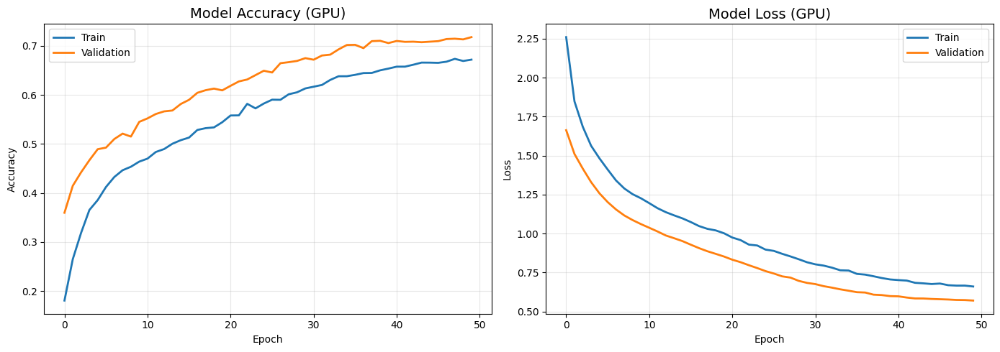


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-01.png


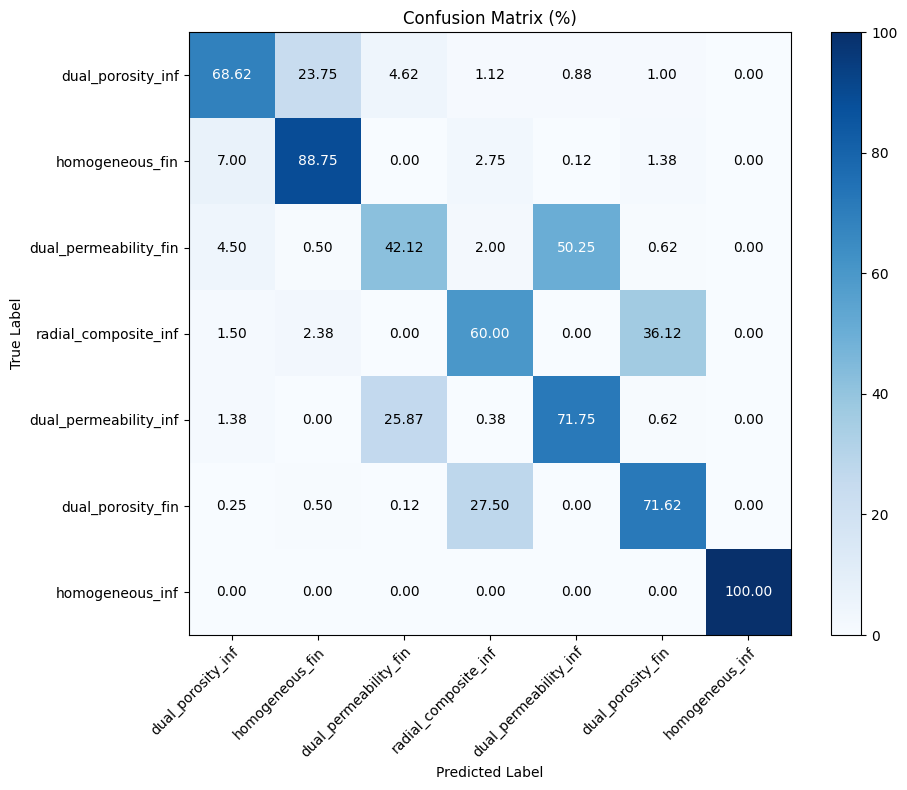


Результаты для шума 0.5:
  Loss: 0.5681
  Accuracy: 0.7184


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset02
УРОВЕНЬ ШУМА: 0.05
Найденные метки: ['dual_porosity_inf', 'homogeneous_fin', 'dual_permeability_fin', 'radial_composite_inf', 'dual_permeability_inf', 'dual_porosity_fin', 'homogeneous_inf']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.2176 - loss: 2.2287
Epoch 1: val_accuracy improved from None to 0.52857, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 18s 14ms/step - accuracy: 0.2839 - loss: 1.9206 - val_accuracy: 0.5286 - val_loss: 1.4083 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4209 - loss: 1.4618
Epoch 2: val_accuracy improved from 0.52857 to 0.58821, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.4379 - loss: 1.4054 - val_accuracy: 0.5882 - val_loss: 1.0672 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4881 - loss: 1.2718
Epoch 3: val_accuracy improved from 0.58821 to 0.60321, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4961 - loss: 1.2330 - val_accuracy: 0.6032 - val_loss: 0.9633 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5253 - loss: 1.1448
Epoch 4: val_accuracy improved from 0.60321 to 0.62321, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5276 - loss: 1.1301 - val_accuracy: 0.6232 - val_loss: 0.8896 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5488 - loss: 1.0865
Epoch 5: val_accuracy improved from 0.62321 to 0.64821, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5612 - loss: 1.0554 - val_accuracy: 0.6482 - val_loss: 0.8261 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5706 - loss: 1.0123
Epoch 6: val_accuracy improved from 0.64821 to 0.66250, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5788 - loss: 0.9951 - val_accuracy: 0.6625 - val_loss: 0.7805 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5948 - loss: 0.9581
Epoch 7: val_accuracy improved from 0.66250 to 0.67179, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6001 - loss: 0.9368 - val_accuracy: 0.6718 - val_loss: 0.7350 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6158 - loss: 0.8902
Epoch 8: val_accuracy improved from 0.67179 to 0.68321, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6189 - loss: 0.8869 - val_accuracy: 0.6832 - val_loss: 0.6978 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6233 - loss: 0.8678
Epoch 9: val_accuracy improved from 0.68321 to 0.69786, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6283 - loss: 0.8542 - val_accuracy: 0.6979 - val_loss: 0.6644 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6363 - loss: 0.8226
Epoch 10: val_accuracy improved from 0.69786 to 0.71429, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6433 - loss: 0.8117 - val_accuracy: 0.7143 - val_loss: 0.6370 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6523 - loss: 0.7864
Epoch 11: val_accuracy improved from 0.71429 to 0.73821, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6592 - loss: 0.7817 - val_accuracy: 0.7382 - val_loss: 0.6057 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6715 - loss: 0.7481
Epoch 12: val_accuracy improved from 0.73821 to 0.74107, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6725 - loss: 0.7451 - val_accuracy: 0.7411 - val_loss: 0.5794 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6784 - loss: 0.7277
Epoch 13: val_accuracy improved from 0.74107 to 0.74964, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6846 - loss: 0.7208 - val_accuracy: 0.7496 - val_loss: 0.5593 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6918 - loss: 0.7037
Epoch 14: val_accuracy improved from 0.74964 to 0.76393, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6951 - loss: 0.6987 - val_accuracy: 0.7639 - val_loss: 0.5368 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7000 - loss: 0.6777
Epoch 15: val_accuracy did not improve from 0.76393
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7034 - loss: 0.6705 - val_accuracy: 0.7639 - val_loss: 0.5208 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7118 - loss: 0.6426
Epoch 16: val_accuracy improved from 0.76393 to 0.78607, saving model to best_model_classification.h5



Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7136 - loss: 0.6446 - val_accuracy: 0.7861 - val_loss: 0.4995 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7194 - loss: 0.6268
Epoch 17: val_accuracy improved from 0.78607 to 0.79643, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7232 - loss: 0.6203 - val_accuracy: 0.7964 - val_loss: 0.4824 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7241 - loss: 0.6170
Epoch 18: val_accuracy improved from 0.79643 to 0.80286, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7267 - loss: 0.6087 - val_accuracy: 0.8029 - val_loss: 0.4667 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7372 - loss: 0.5927
Epoch 19: val_accuracy did not improve from 0.80286
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7419 - loss: 0.5835 - val_accuracy: 0.8011 - val_loss: 0.4502 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7464 - loss: 0.5634
Epoch 20: val_accuracy improved from 0.80286 to 0.80929, saving model to best_model_classification.h5



Epoch 20: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7449 - loss: 0.5637 - val_accuracy: 0.8093 - val_loss: 0.4418 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7556 - loss: 0.5507
Epoch 21: val_accuracy improved from 0.80929 to 0.81607, saving model to best_model_classification.h5



Epoch 21: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7526 - loss: 0.5508 - val_accuracy: 0.8161 - val_loss: 0.4326 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7536 - loss: 0.5419
Epoch 22: val_accuracy improved from 0.81607 to 0.82250, saving model to best_model_classification.h5



Epoch 22: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7581 - loss: 0.5367 - val_accuracy: 0.8225 - val_loss: 0.4167 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7716 - loss: 0.5213
Epoch 23: val_accuracy improved from 0.82250 to 0.82643, saving model to best_model_classification.h5



Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7677 - loss: 0.5201 - val_accuracy: 0.8264 - val_loss: 0.4071 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
600/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7592 - loss: 0.5248
Epoch 24: val_accuracy improved from 0.82643 to 0.82857, saving model to best_model_classification.h5



Epoch 24: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7684 - loss: 0.5121 - val_accuracy: 0.8286 - val_loss: 0.3964 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7594 - loss: 0.5213
Epoch 25: val_accuracy improved from 0.82857 to 0.83571, saving model to best_model_classification.h5



Epoch 25: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7685 - loss: 0.5081 - val_accuracy: 0.8357 - val_loss: 0.3882 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7851 - loss: 0.4805
Epoch 26: val_accuracy improved from 0.83571 to 0.84107, saving model to best_model_classification.h5



Epoch 26: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7818 - loss: 0.4849 - val_accuracy: 0.8411 - val_loss: 0.3745 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7835 - loss: 0.4803
Epoch 27: val_accuracy improved from 0.84107 to 0.84964, saving model to best_model_classification.h5



Epoch 27: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.7857 - loss: 0.4772 - val_accuracy: 0.8496 - val_loss: 0.3720 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7890 - loss: 0.4677
Epoch 28: val_accuracy improved from 0.84964 to 0.85107, saving model to best_model_classification.h5



Epoch 28: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7908 - loss: 0.4685 - val_accuracy: 0.8511 - val_loss: 0.3638 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7957 - loss: 0.4596
Epoch 29: val_accuracy did not improve from 0.85107
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7946 - loss: 0.4563 - val_accuracy: 0.8496 - val_loss: 0.3529 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8017 - loss: 0.4478
Epoch 30: val_accuracy improved from 0.85107 to 0.85821, saving model to best_model_classification.h5



Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8026 - loss: 0.4454 - val_accuracy: 0.8582 - val_loss: 0.3518 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7999 - loss: 0.4535
Epoch 31: val_accuracy improved from 0.85821 to 0.86286, saving model to best_model_classification.h5



Epoch 31: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8058 - loss: 0.4409 - val_accuracy: 0.8629 - val_loss: 0.3459 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8087 - loss: 0.4335
Epoch 32: val_accuracy did not improve from 0.86286
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8084 - loss: 0.4314 - val_accuracy: 0.8611 - val_loss: 0.3410 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8137 - loss: 0.4237
Epoch 33: val_accuracy improved from 0.86286 to 0.86714, saving model to best_model_classification.h5



Epoch 33: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8139 - loss: 0.4247 - val_accuracy: 0.8671 - val_loss: 0.3310 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8246 - loss: 0.4101
Epoch 34: val_accuracy did not improve from 0.86714
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8179 - loss: 0.4152 - val_accuracy: 0.8664 - val_loss: 0.3275 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8223 - loss: 0.4082
Epoch 35: val_accuracy improved from 0.86714 to 0.87143, saving model to best_model_classification.h5



Epoch 35: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8204 - loss: 0.4112 - val_accuracy: 0.8714 - val_loss: 0.3211 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8239 - loss: 0.3950
Epoch 36: val_accuracy did not improve from 0.87143
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8207 - loss: 0.4028 - val_accuracy: 0.8636 - val_loss: 0.3259 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/50
601/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8213 - loss: 0.4016
Epoch 37: val_accuracy improved from 0.87143 to 0.87607, saving model to best_model_classification.h5



Epoch 37: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8232 - loss: 0.3976 - val_accuracy: 0.8761 - val_loss: 0.3100 - learning_rate: 1.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 38/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8271 - loss: 0.3929
Epoch 38: val_accuracy did not improve from 0.87607
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8269 - loss: 0.3961 - val_accuracy: 0.8736 - val_loss: 0.3088 - learning_rate: 1.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 39/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8353 - loss: 0.3832
Epoch 39: val_accuracy improved from 0.87607 to 0.88107, saving model to best_model_classification.h5



Epoch 39: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.8341 - loss: 0.3836 - val_accuracy: 0.8811 - val_loss: 0.3013 - learning_rate: 1.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 40/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8340 - loss: 0.3797
Epoch 40: val_accuracy improved from 0.88107 to 0.88179, saving model to best_model_classification.h5



Epoch 40: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8349 - loss: 0.3797 - val_accuracy: 0.8818 - val_loss: 0.2982 - learning_rate: 1.0000e-05

Epoch 41: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 41/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8392 - loss: 0.3677
Epoch 41: val_accuracy improved from 0.88179 to 0.88607, saving model to best_model_classification.h5



Epoch 41: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8390 - loss: 0.3712 - val_accuracy: 0.8861 - val_loss: 0.2916 - learning_rate: 1.0000e-05

Epoch 42: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 42/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8423 - loss: 0.3674
Epoch 42: val_accuracy did not improve from 0.88607
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8425 - loss: 0.3651 - val_accuracy: 0.8854 - val_loss: 0.2892 - learning_rate: 1.0000e-05

Epoch 43: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 43/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8378 - loss: 0.3715
Epoch 43: val_accuracy improved from 0.88607 to 0.88679, saving model to best_model_classification.h5



Epoch 43: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8430 - loss: 0.3645 - val_accuracy: 0.8868 - val_loss: 0.2898 - learning_rate: 1.0000e-05

Epoch 44: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 44/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8450 - loss: 0.3659
Epoch 44: val_accuracy improved from 0.88679 to 0.88821, saving model to best_model_classification.h5



Epoch 44: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8429 - loss: 0.3605 - val_accuracy: 0.8882 - val_loss: 0.2797 - learning_rate: 1.0000e-05

Epoch 45: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 45/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8493 - loss: 0.3478
Epoch 45: val_accuracy did not improve from 0.88821
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8454 - loss: 0.3548 - val_accuracy: 0.8854 - val_loss: 0.2825 - learning_rate: 1.0000e-05

Epoch 46: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 46/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8481 - loss: 0.3474
Epoch 46: val_accuracy did not improve from 0.88821
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8490 - loss: 0.3470 - val_accuracy: 0.8868 - val_loss: 0.2776 - learning_rate: 1.0000e-05

Epoch 47: LearningRateScheduler setting learning rate to 9.


Epoch 47: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8545 - loss: 0.3437 - val_accuracy: 0.8929 - val_loss: 0.2753 - learning_rate: 1.0000e-05

Epoch 48: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 48/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8505 - loss: 0.3442
Epoch 48: val_accuracy did not improve from 0.89286
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8544 - loss: 0.3385 - val_accuracy: 0.8918 - val_loss: 0.2702 - learning_rate: 1.0000e-05

Epoch 49: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 49/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8535 - loss: 0.3407
Epoch 49: val_accuracy improved from 0.89286 to 0.89357, saving model to best_model_classification.h5



Epoch 49: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8568 - loss: 0.3367 - val_accuracy: 0.8936 - val_loss: 0.2753 - learning_rate: 1.0000e-05

Epoch 50: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 50/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8567 - loss: 0.3393
Epoch 50: val_accuracy did not improve from 0.89357
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8550 - loss: 0.3366 - val_accuracy: 0.8904 - val_loss: 0.2692 - learning_rate: 1.0000e-05

✅ Обучение завершено за 193.86 секунд
✅ Лучшая модель сохранена в: best_model_classification.h5


✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.8880
  loss: 0.2679

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

    dual_porosity_inf     0.9273    0.8775    0.9017       800
      homogeneous_fin     0.9220    0.9900    0.9548       800
dual_permeability_fin     0.8745    0.5400    0.6677       800
 radial_composite_inf     0.9687    0.8900    0.9277       800
dual_permeability_inf     0.6922    0.9387    0.7968       800
    dual_porosity_fin     0.9011    0.9800    0.9389       800
      homogeneous_inf     1.0000    1.0000    1.0000       800

             accuracy                         0.8880      5600
            macro avg     0.8980    0.8880    0.8839      5600
         weighted avg     0.8980    0.8880    0.8839      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

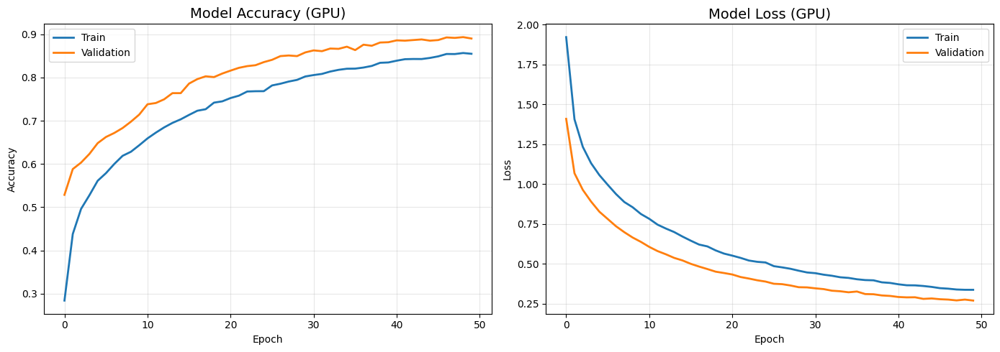


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-02.png


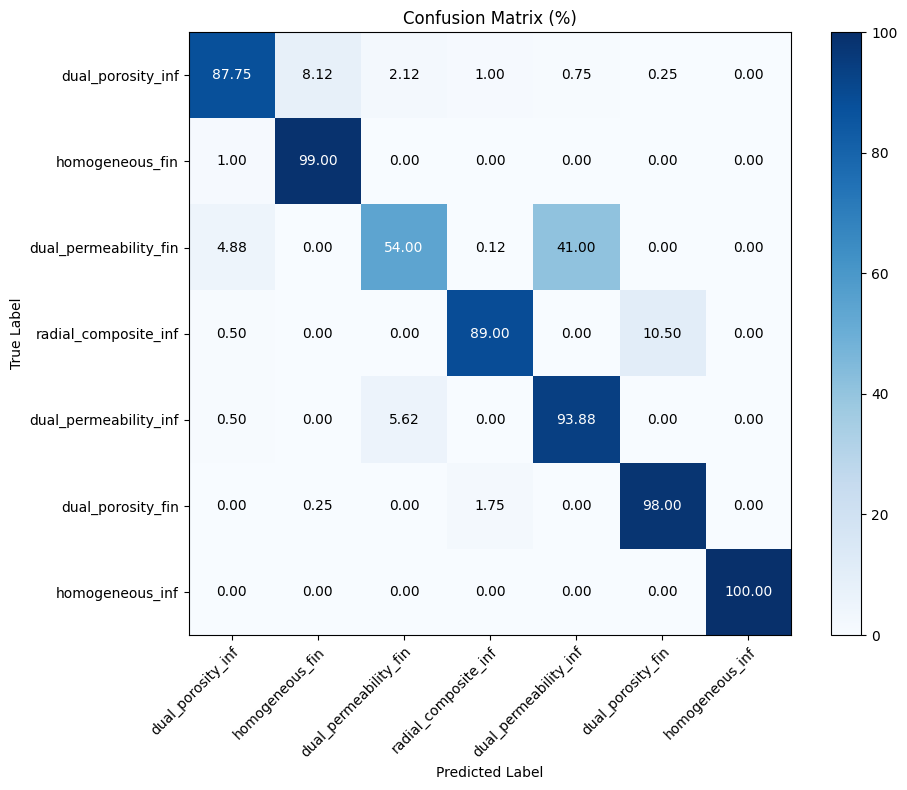


Результаты для шума 0.05:
  Loss: 0.2679
  Accuracy: 0.8880


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset03
УРОВЕНЬ ШУМА: 0.005
Найденные метки: ['dual_porosity_inf', 'homogeneous_fin', 'dual_permeability_fin', 'radial_composite_inf', 'dual_permeability_inf', 'dual_porosity_fin', 'homogeneous_inf']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2084 - loss: 2.3931
Epoch 1: val_accuracy improved from None to 0.53750, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 18s 15ms/step - accuracy: 0.2692 - loss: 2.0592 - val_accuracy: 0.5375 - val_loss: 1.3182 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4079 - loss: 1.5164
Epoch 2: val_accuracy improved from 0.53750 to 0.60250, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.4293 - loss: 1.4508 - val_accuracy: 0.6025 - val_loss: 1.0321 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4825 - loss: 1.2826
Epoch 3: val_accuracy improved from 0.60250 to 0.64000, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5009 - loss: 1.2358 - val_accuracy: 0.6400 - val_loss: 0.9227 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5260 - loss: 1.1523
Epoch 4: val_accuracy improved from 0.64000 to 0.66786, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5348 - loss: 1.1300 - val_accuracy: 0.6679 - val_loss: 0.8469 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5566 - loss: 1.0626
Epoch 5: val_accuracy improved from 0.66786 to 0.69036, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5712 - loss: 1.0414 - val_accuracy: 0.6904 - val_loss: 0.7793 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5875 - loss: 0.9950
Epoch 6: val_accuracy improved from 0.69036 to 0.70679, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.5968 - loss: 0.9744 - val_accuracy: 0.7068 - val_loss: 0.7188 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6212 - loss: 0.9136
Epoch 7: val_accuracy improved from 0.70679 to 0.72571, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6235 - loss: 0.8984 - val_accuracy: 0.7257 - val_loss: 0.6615 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6447 - loss: 0.8595
Epoch 8: val_accuracy improved from 0.72571 to 0.74071, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6485 - loss: 0.8446 - val_accuracy: 0.7407 - val_loss: 0.6116 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
601/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6674 - loss: 0.8047
Epoch 9: val_accuracy improved from 0.74071 to 0.75107, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6680 - loss: 0.7937 - val_accuracy: 0.7511 - val_loss: 0.5664 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6862 - loss: 0.7466
Epoch 10: val_accuracy improved from 0.75107 to 0.77071, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6890 - loss: 0.7442 - val_accuracy: 0.7707 - val_loss: 0.5225 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6975 - loss: 0.7128
Epoch 11: val_accuracy improved from 0.77071 to 0.78071, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7063 - loss: 0.6965 - val_accuracy: 0.7807 - val_loss: 0.4867 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7208 - loss: 0.6624
Epoch 12: val_accuracy improved from 0.78071 to 0.79214, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7238 - loss: 0.6516 - val_accuracy: 0.7921 - val_loss: 0.4569 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7302 - loss: 0.6332
Epoch 13: val_accuracy improved from 0.79214 to 0.80179, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7353 - loss: 0.6212 - val_accuracy: 0.8018 - val_loss: 0.4285 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7438 - loss: 0.5992
Epoch 14: val_accuracy improved from 0.80179 to 0.82107, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7456 - loss: 0.5901 - val_accuracy: 0.8211 - val_loss: 0.4045 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7612 - loss: 0.5633
Epoch 15: val_accuracy did not improve from 0.82107
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.7623 - loss: 0.5528 - val_accuracy: 0.8211 - val_loss: 0.3878 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7644 - loss: 0.5399
Epoch 16: val_accuracy improved from 0.82107 to 0.83143, saving model to best_model_classification.h5



Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7671 - loss: 0.5320 - val_accuracy: 0.8314 - val_loss: 0.3610 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7777 - loss: 0.5144
Epoch 17: val_accuracy improved from 0.83143 to 0.84500, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7813 - loss: 0.5048 - val_accuracy: 0.8450 - val_loss: 0.3448 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7871 - loss: 0.4925
Epoch 18: val_accuracy improved from 0.84500 to 0.85286, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7890 - loss: 0.4854 - val_accuracy: 0.8529 - val_loss: 0.3312 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7913 - loss: 0.4697
Epoch 19: val_accuracy did not improve from 0.85286
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7962 - loss: 0.4620 - val_accuracy: 0.8529 - val_loss: 0.3271 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8062 - loss: 0.4501
Epoch 20: val_accuracy improved from 0.85286 to 0.87214, saving model to best_model_classification.h5



Epoch 20: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8005 - loss: 0.4544 - val_accuracy: 0.8721 - val_loss: 0.3131 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8055 - loss: 0.4448
Epoch 21: val_accuracy did not improve from 0.87214
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8093 - loss: 0.4332 - val_accuracy: 0.8682 - val_loss: 0.3030 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8116 - loss: 0.4232
Epoch 22: val_accuracy did not improve from 0.87214
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8121 - loss: 0.4226 - val_accuracy: 0.8696 - val_loss: 0.2929 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.


Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8201 - loss: 0.4073 - val_accuracy: 0.8771 - val_loss: 0.2832 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8248 - loss: 0.3938
Epoch 24: val_accuracy improved from 0.87714 to 0.88679, saving model to best_model_classification.h5



Epoch 24: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8265 - loss: 0.3900 - val_accuracy: 0.8868 - val_loss: 0.2723 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8357 - loss: 0.3778
Epoch 25: val_accuracy improved from 0.88679 to 0.88893, saving model to best_model_classification.h5



Epoch 25: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8334 - loss: 0.3799 - val_accuracy: 0.8889 - val_loss: 0.2724 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8287 - loss: 0.3836
Epoch 26: val_accuracy did not improve from 0.88893
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8345 - loss: 0.3719 - val_accuracy: 0.8875 - val_loss: 0.2613 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8409 - loss: 0.3685
Epoch 27: val_accuracy did not improve from 0.88893
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8407 - loss: 0.3621 - val_accuracy: 0.8857 - val_loss: 0.2614 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.


Epoch 29: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8484 - loss: 0.3455 - val_accuracy: 0.8946 - val_loss: 0.2514 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8559 - loss: 0.3250
Epoch 30: val_accuracy improved from 0.89464 to 0.89893, saving model to best_model_classification.h5



Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8544 - loss: 0.3334 - val_accuracy: 0.8989 - val_loss: 0.2391 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8487 - loss: 0.3404
Epoch 31: val_accuracy improved from 0.89893 to 0.90429, saving model to best_model_classification.h5



Epoch 31: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.8538 - loss: 0.3322 - val_accuracy: 0.9043 - val_loss: 0.2378 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8581 - loss: 0.3248
Epoch 32: val_accuracy did not improve from 0.90429
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8588 - loss: 0.3237 - val_accuracy: 0.8982 - val_loss: 0.2348 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8608 - loss: 0.3213
Epoch 33: val_accuracy improved from 0.90429 to 0.90571, saving model to best_model_classification.h5



Epoch 33: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8630 - loss: 0.3143 - val_accuracy: 0.9057 - val_loss: 0.2311 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8666 - loss: 0.3139
Epoch 34: val_accuracy did not improve from 0.90571
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8668 - loss: 0.3122 - val_accuracy: 0.9018 - val_loss: 0.2239 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8754 - loss: 0.2953
Epoch 35: val_accuracy improved from 0.90571 to 0.91143, saving model to best_model_classification.h5



Epoch 35: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8701 - loss: 0.3043 - val_accuracy: 0.9114 - val_loss: 0.2223 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8720 - loss: 0.3011
Epoch 36: val_accuracy improved from 0.91143 to 0.91500, saving model to best_model_classification.h5



Epoch 36: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8738 - loss: 0.2980 - val_accuracy: 0.9150 - val_loss: 0.2100 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8722 - loss: 0.2964
Epoch 37: val_accuracy did not improve from 0.91500
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8735 - loss: 0.2965 - val_accuracy: 0.9057 - val_loss: 0.2184 - learning_rate: 1.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 38/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8729 - loss: 0.2944
Epoch 38: val_accuracy did not improve from 0.91500
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8782 - loss: 0.2866 - val_accuracy: 0.9125 - val_loss: 0.2140 - learning_rate: 1.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 9.


Epoch 39: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8776 - loss: 0.2849 - val_accuracy: 0.9154 - val_loss: 0.2083 - learning_rate: 1.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 40/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8824 - loss: 0.2742
Epoch 40: val_accuracy did not improve from 0.91536
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8809 - loss: 0.2774 - val_accuracy: 0.9139 - val_loss: 0.2016 - learning_rate: 1.0000e-05

Epoch 41: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 41/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8774 - loss: 0.2823
Epoch 41: val_accuracy did not improve from 0.91536
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8808 - loss: 0.2808 - val_accuracy: 0.9139 - val_loss: 0.2162 - learning_rate: 1.0000e-05

Epoch 42: LearningRateScheduler setting learning rate to 9.


Epoch 42: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8863 - loss: 0.2697 - val_accuracy: 0.9193 - val_loss: 0.1978 - learning_rate: 1.0000e-05

Epoch 43: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 43/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8840 - loss: 0.2689
Epoch 43: val_accuracy improved from 0.91929 to 0.92357, saving model to best_model_classification.h5



Epoch 43: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8864 - loss: 0.2669 - val_accuracy: 0.9236 - val_loss: 0.1976 - learning_rate: 1.0000e-05

Epoch 44: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 44/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8872 - loss: 0.2642
Epoch 44: val_accuracy improved from 0.92357 to 0.92607, saving model to best_model_classification.h5



Epoch 44: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8876 - loss: 0.2636 - val_accuracy: 0.9261 - val_loss: 0.1893 - learning_rate: 1.0000e-05

Epoch 45: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 45/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8855 - loss: 0.2662
Epoch 45: val_accuracy did not improve from 0.92607
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8870 - loss: 0.2651 - val_accuracy: 0.9211 - val_loss: 0.1976 - learning_rate: 1.0000e-05

Epoch 46: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 46/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8944 - loss: 0.2599
Epoch 46: val_accuracy did not improve from 0.92607
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8937 - loss: 0.2570 - val_accuracy: 0.9207 - val_loss: 0.1940 - learning_rate: 1.0000e-05

Epoch 47: LearningRateScheduler setting learning rate to 9.


Epoch 48: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8952 - loss: 0.2529 - val_accuracy: 0.9289 - val_loss: 0.1803 - learning_rate: 1.0000e-05

Epoch 49: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 49/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8985 - loss: 0.2455
Epoch 49: val_accuracy improved from 0.92893 to 0.92929, saving model to best_model_classification.h5



Epoch 49: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8995 - loss: 0.2431 - val_accuracy: 0.9293 - val_loss: 0.1848 - learning_rate: 1.0000e-05

Epoch 50: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 50/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9002 - loss: 0.2372
Epoch 50: val_accuracy did not improve from 0.92929
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9009 - loss: 0.2368 - val_accuracy: 0.9261 - val_loss: 0.1812 - learning_rate: 1.0000e-05

✅ Обучение завершено за 199.87 секунд
✅ Лучшая модель сохранена в: best_model_classification.h5


✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9212
  loss: 0.1819

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

    dual_porosity_inf     0.9750    0.9250    0.9493       800
      homogeneous_fin     0.9576    0.9875    0.9723       800
dual_permeability_fin     0.9044    0.6150    0.7321       800
 radial_composite_inf     0.9961    0.9613    0.9784       800
dual_permeability_inf     0.7221    0.9613    0.8247       800
    dual_porosity_fin     0.9569    0.9988    0.9774       800
      homogeneous_inf     1.0000    1.0000    1.0000       800

             accuracy                         0.9213      5600
            macro avg     0.9303    0.9213    0.9192      5600
         weighted avg     0.9303    0.9213    0.9192      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

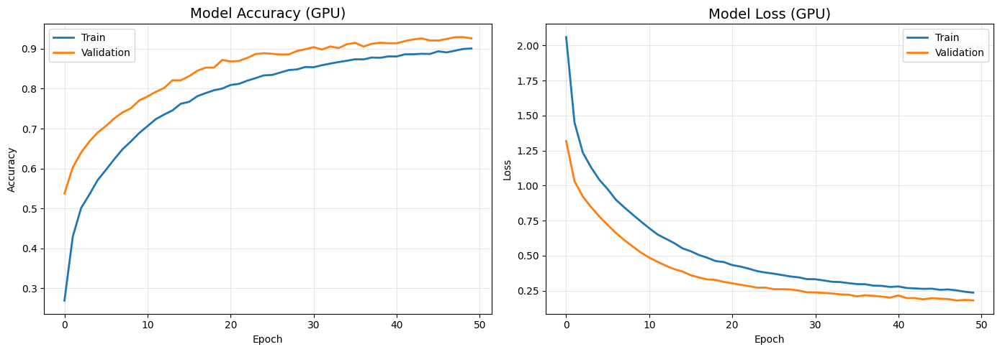


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-03.png


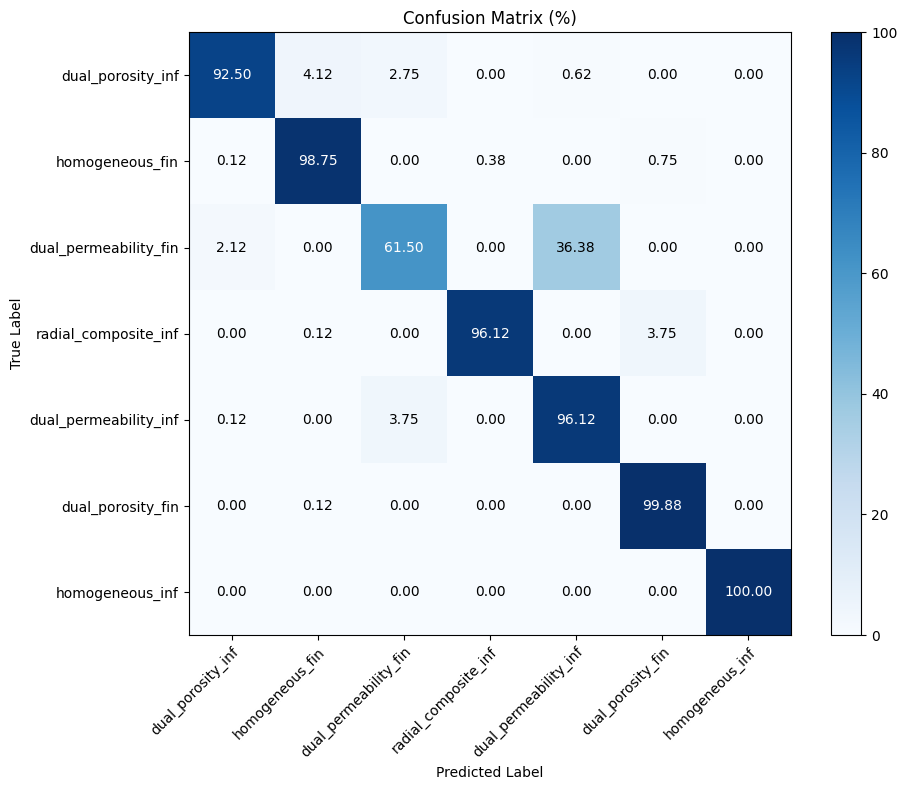


Результаты для шума 0.005:
  Loss: 0.1819
  Accuracy: 0.9212


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset04
УРОВЕНЬ ШУМА: 0.0005
Найденные метки: ['dual_porosity_inf', 'homogeneous_fin', 'dual_permeability_fin', 'radial_composite_inf', 'dual_permeability_inf', 'dual_porosity_fin', 'homogeneous_inf']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2516 - loss: 2.1198
Epoch 1: val_accuracy improved from None to 0.53750, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 18s 15ms/step - accuracy: 0.3214 - loss: 1.8171 - val_accuracy: 0.5375 - val_loss: 1.2850 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4524 - loss: 1.3665
Epoch 2: val_accuracy improved from 0.53750 to 0.62893, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.4721 - loss: 1.3181 - val_accuracy: 0.6289 - val_loss: 0.9758 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5082 - loss: 1.1911
Epoch 3: val_accuracy improved from 0.62893 to 0.67893, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5242 - loss: 1.1522 - val_accuracy: 0.6789 - val_loss: 0.8704 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5587 - loss: 1.0739
Epoch 4: val_accuracy improved from 0.67893 to 0.71643, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5684 - loss: 1.0504 - val_accuracy: 0.7164 - val_loss: 0.7823 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5934 - loss: 0.9836
Epoch 5: val_accuracy improved from 0.71643 to 0.73679, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6053 - loss: 0.9542 - val_accuracy: 0.7368 - val_loss: 0.6995 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6327 - loss: 0.8867
Epoch 6: val_accuracy improved from 0.73679 to 0.77250, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6432 - loss: 0.8669 - val_accuracy: 0.7725 - val_loss: 0.6151 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6652 - loss: 0.8095
Epoch 7: val_accuracy improved from 0.77250 to 0.79071, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6732 - loss: 0.7875 - val_accuracy: 0.7907 - val_loss: 0.5479 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6950 - loss: 0.7392
Epoch 8: val_accuracy improved from 0.79071 to 0.81036, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7021 - loss: 0.7181 - val_accuracy: 0.8104 - val_loss: 0.4869 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7229 - loss: 0.6667
Epoch 9: val_accuracy improved from 0.81036 to 0.83214, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7235 - loss: 0.6584 - val_accuracy: 0.8321 - val_loss: 0.4411 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7359 - loss: 0.6219
Epoch 10: val_accuracy improved from 0.83214 to 0.83250, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.7416 - loss: 0.6114 - val_accuracy: 0.8325 - val_loss: 0.4155 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7467 - loss: 0.5802
Epoch 11: val_accuracy improved from 0.83250 to 0.84821, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7591 - loss: 0.5683 - val_accuracy: 0.8482 - val_loss: 0.3771 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7725 - loss: 0.5364
Epoch 12: val_accuracy improved from 0.84821 to 0.86143, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7739 - loss: 0.5299 - val_accuracy: 0.8614 - val_loss: 0.3517 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7908 - loss: 0.4994
Epoch 13: val_accuracy did not improve from 0.86143
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7855 - loss: 0.5006 - val_accuracy: 0.8550 - val_loss: 0.3379 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7926 - loss: 0.4853
Epoch 14: val_accuracy did not improve from 0.86143
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7979 - loss: 0.4769 - val_accuracy: 0.8557 - val_loss: 0.3314 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.


Epoch 15: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8061 - loss: 0.4545 - val_accuracy: 0.8768 - val_loss: 0.3080 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8101 - loss: 0.4420
Epoch 16: val_accuracy improved from 0.87679 to 0.87714, saving model to best_model_classification.h5



Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8137 - loss: 0.4360 - val_accuracy: 0.8771 - val_loss: 0.2941 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8202 - loss: 0.4191
Epoch 17: val_accuracy improved from 0.87714 to 0.88571, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8191 - loss: 0.4182 - val_accuracy: 0.8857 - val_loss: 0.2819 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8258 - loss: 0.4061
Epoch 18: val_accuracy did not improve from 0.88571
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8270 - loss: 0.3997 - val_accuracy: 0.8832 - val_loss: 0.2765 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8285 - loss: 0.3935
Epoch 19: val_accuracy improved from 0.88571 to 0.89000, saving model to best_model_classification.h5



Epoch 19: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8343 - loss: 0.3838 - val_accuracy: 0.8900 - val_loss: 0.2639 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8353 - loss: 0.3790
Epoch 20: val_accuracy improved from 0.89000 to 0.89500, saving model to best_model_classification.h5



Epoch 20: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8382 - loss: 0.3737 - val_accuracy: 0.8950 - val_loss: 0.2573 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8419 - loss: 0.3605
Epoch 21: val_accuracy did not improve from 0.89500
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8444 - loss: 0.3588 - val_accuracy: 0.8850 - val_loss: 0.2531 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8478 - loss: 0.3523
Epoch 22: val_accuracy improved from 0.89500 to 0.89786, saving model to best_model_classification.h5



Epoch 22: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8482 - loss: 0.3497 - val_accuracy: 0.8979 - val_loss: 0.2462 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8456 - loss: 0.3462
Epoch 23: val_accuracy did not improve from 0.89786
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.8512 - loss: 0.3412 - val_accuracy: 0.8961 - val_loss: 0.2461 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8547 - loss: 0.3378
Epoch 24: val_accuracy improved from 0.89786 to 0.90214, saving model to best_model_classification.h5



Epoch 24: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8579 - loss: 0.3332 - val_accuracy: 0.9021 - val_loss: 0.2364 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8537 - loss: 0.3309
Epoch 25: val_accuracy improved from 0.90214 to 0.90571, saving model to best_model_classification.h5



Epoch 25: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8615 - loss: 0.3216 - val_accuracy: 0.9057 - val_loss: 0.2320 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8653 - loss: 0.3140
Epoch 26: val_accuracy did not improve from 0.90571
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8686 - loss: 0.3079 - val_accuracy: 0.9036 - val_loss: 0.2253 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8739 - loss: 0.3032
Epoch 27: val_accuracy did not improve from 0.90571
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8730 - loss: 0.3016 - val_accuracy: 0.9011 - val_loss: 0.2271 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.


Epoch 28: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8741 - loss: 0.3011 - val_accuracy: 0.9136 - val_loss: 0.2162 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8768 - loss: 0.2911
Epoch 29: val_accuracy did not improve from 0.91357
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8781 - loss: 0.2894 - val_accuracy: 0.9100 - val_loss: 0.2161 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8747 - loss: 0.2909
Epoch 30: val_accuracy improved from 0.91357 to 0.91857, saving model to best_model_classification.h5



Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8777 - loss: 0.2875 - val_accuracy: 0.9186 - val_loss: 0.2109 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8842 - loss: 0.2803
Epoch 31: val_accuracy did not improve from 0.91857
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8834 - loss: 0.2776 - val_accuracy: 0.9129 - val_loss: 0.2122 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8835 - loss: 0.2728
Epoch 32: val_accuracy did not improve from 0.91857
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8815 - loss: 0.2754 - val_accuracy: 0.9186 - val_loss: 0.1998 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.


Epoch 38: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8919 - loss: 0.2563 - val_accuracy: 0.9243 - val_loss: 0.1919 - learning_rate: 5.0000e-06

Epoch 39: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 39/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8959 - loss: 0.2603
Epoch 39: val_accuracy did not improve from 0.92429
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8960 - loss: 0.2567 - val_accuracy: 0.9218 - val_loss: 0.1913 - learning_rate: 5.0000e-06

Epoch 40: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 40/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8964 - loss: 0.2461
Epoch 40: val_accuracy improved from 0.92429 to 0.92536, saving model to best_model_classification.h5



Epoch 40: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8944 - loss: 0.2519 - val_accuracy: 0.9254 - val_loss: 0.1901 - learning_rate: 5.0000e-06

Epoch 41: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 41/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8968 - loss: 0.2436
Epoch 41: val_accuracy did not improve from 0.92536
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8973 - loss: 0.2465 - val_accuracy: 0.9211 - val_loss: 0.1903 - learning_rate: 5.0000e-06

Epoch 42: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 42/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8994 - loss: 0.2425
Epoch 42: val_accuracy improved from 0.92536 to 0.92571, saving model to best_model_classification.h5



Epoch 42: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8988 - loss: 0.2442 - val_accuracy: 0.9257 - val_loss: 0.1886 - learning_rate: 5.0000e-06

Epoch 43: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 43/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9016 - loss: 0.2401
Epoch 43: val_accuracy improved from 0.92571 to 0.92750, saving model to best_model_classification.h5



Epoch 43: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.8993 - loss: 0.2437 - val_accuracy: 0.9275 - val_loss: 0.1908 - learning_rate: 5.0000e-06

Epoch 44: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 44/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9002 - loss: 0.2391
Epoch 44: val_accuracy did not improve from 0.92750
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8979 - loss: 0.2425 - val_accuracy: 0.9243 - val_loss: 0.1866 - learning_rate: 5.0000e-06

Epoch 45: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 45/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9011 - loss: 0.2346
Epoch 45: val_accuracy improved from 0.92750 to 0.92821, saving model to best_model_classification.h5



Epoch 45: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8995 - loss: 0.2395 - val_accuracy: 0.9282 - val_loss: 0.1868 - learning_rate: 5.0000e-06

Epoch 46: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 46/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9027 - loss: 0.2381
Epoch 46: val_accuracy did not improve from 0.92821
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9010 - loss: 0.2436 - val_accuracy: 0.9218 - val_loss: 0.1885 - learning_rate: 5.0000e-06

Epoch 47: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 47/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8990 - loss: 0.2430
Epoch 47: val_accuracy did not improve from 0.92821
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9010 - loss: 0.2407 - val_accuracy: 0.9225 - val_loss: 0.1912 - learning_rate: 5.0000e-06

Epoch 48: LearningRateScheduler setting learning rate to 4.


Epoch 50: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9000 - loss: 0.2341 - val_accuracy: 0.9307 - val_loss: 0.1830 - learning_rate: 5.0000e-06

✅ Обучение завершено за 203.17 секунд
✅ Лучшая модель сохранена в: best_model_classification.h5


✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9270
  loss: 0.1879

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

    dual_porosity_inf     0.9748    0.9175    0.9453       800
      homogeneous_fin     0.9450    0.9888    0.9664       800
dual_permeability_fin     0.9070    0.6825    0.7789       800
 radial_composite_inf     1.0000    0.9450    0.9717       800
dual_permeability_inf     0.7620    0.9563    0.8481       800
    dual_porosity_fin     0.9422    0.9988    0.9697       800
      homogeneous_inf     1.0000    1.0000    1.0000       800

             accuracy                         0.9270      5600
            macro avg     0.9330    0.9270    0.9257      5600
         weighted avg     0.9330    0.9270    0.9257      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

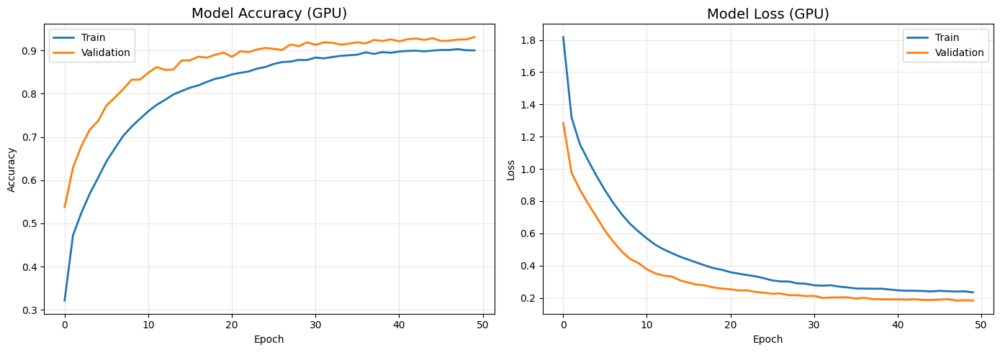


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-04.png


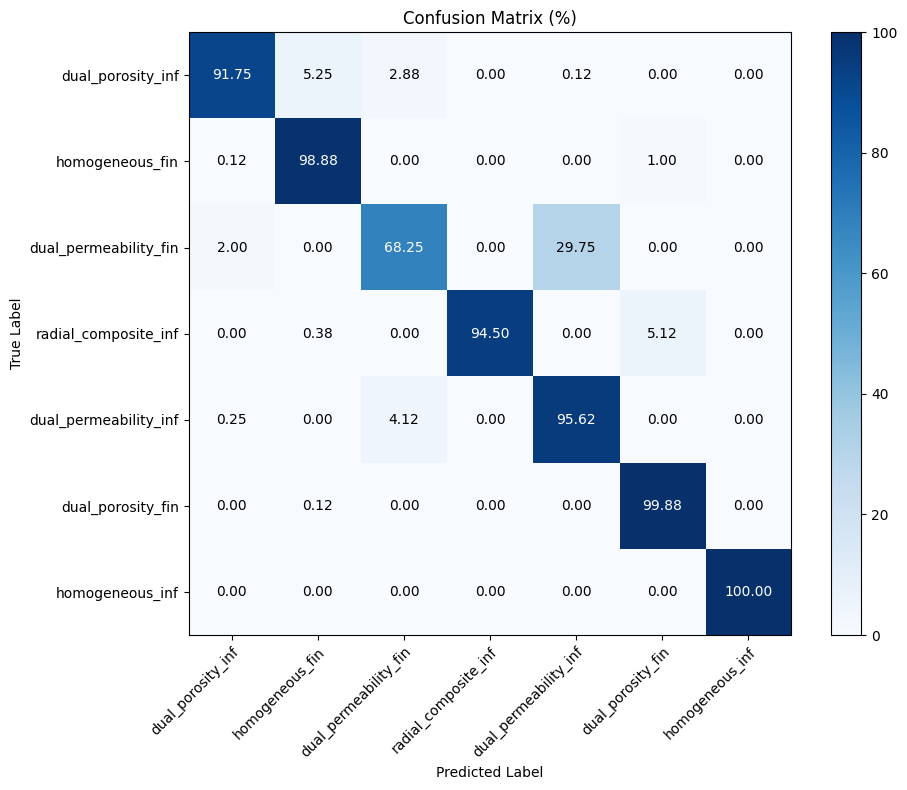


Результаты для шума 0.0005:
  Loss: 0.1879
  Accuracy: 0.9270


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset05
УРОВЕНЬ ШУМА: 5e-05
Найденные метки: ['dual_porosity_inf', 'homogeneous_fin', 'dual_permeability_fin', 'radial_composite_inf', 'dual_permeability_inf', 'dual_porosity_fin', 'homogeneous_inf']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.2426 - loss: 2.1219
Epoch 1: val_accuracy improved from None to 0.53143, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 19s 18ms/step - accuracy: 0.3095 - loss: 1.8513 - val_accuracy: 0.5314 - val_loss: 1.2580 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4392 - loss: 1.3919
Epoch 2: val_accuracy improved from 0.53143 to 0.62393, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.4569 - loss: 1.3357 - val_accuracy: 0.6239 - val_loss: 0.9768 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5075 - loss: 1.1868
Epoch 3: val_accuracy improved from 0.62393 to 0.64536, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5198 - loss: 1.1542 - val_accuracy: 0.6454 - val_loss: 0.8698 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5595 - loss: 1.0560
Epoch 4: val_accuracy improved from 0.64536 to 0.69429, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.5657 - loss: 1.0343 - val_accuracy: 0.6943 - val_loss: 0.7821 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6004 - loss: 0.9620
Epoch 5: val_accuracy improved from 0.69429 to 0.74000, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6043 - loss: 0.9480 - val_accuracy: 0.7400 - val_loss: 0.6966 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6269 - loss: 0.8858
Epoch 6: val_accuracy improved from 0.74000 to 0.76464, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6362 - loss: 0.8641 - val_accuracy: 0.7646 - val_loss: 0.6148 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6634 - loss: 0.7961
Epoch 7: val_accuracy improved from 0.76464 to 0.79393, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6701 - loss: 0.7740 - val_accuracy: 0.7939 - val_loss: 0.5388 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6931 - loss: 0.7155
Epoch 8: val_accuracy improved from 0.79393 to 0.80036, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7054 - loss: 0.6914 - val_accuracy: 0.8004 - val_loss: 0.4845 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7167 - loss: 0.6500
Epoch 9: val_accuracy improved from 0.80036 to 0.83143, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7244 - loss: 0.6388 - val_accuracy: 0.8314 - val_loss: 0.4278 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7379 - loss: 0.5984
Epoch 10: val_accuracy improved from 0.83143 to 0.85607, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.7394 - loss: 0.5919 - val_accuracy: 0.8561 - val_loss: 0.3955 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7580 - loss: 0.5569
Epoch 11: val_accuracy did not improve from 0.85607
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7609 - loss: 0.5472 - val_accuracy: 0.8554 - val_loss: 0.3723 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7750 - loss: 0.5144
Epoch 12: val_accuracy improved from 0.85607 to 0.86714, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7739 - loss: 0.5108 - val_accuracy: 0.8671 - val_loss: 0.3444 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7763 - loss: 0.4926
Epoch 13: val_accuracy improved from 0.86714 to 0.86964, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7797 - loss: 0.4878 - val_accuracy: 0.8696 - val_loss: 0.3296 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7904 - loss: 0.4696
Epoch 14: val_accuracy improved from 0.86964 to 0.88179, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7920 - loss: 0.4623 - val_accuracy: 0.8818 - val_loss: 0.3201 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8043 - loss: 0.4399
Epoch 15: val_accuracy improved from 0.88179 to 0.88429, saving model to best_model_classification.h5



Epoch 15: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8062 - loss: 0.4354 - val_accuracy: 0.8843 - val_loss: 0.3000 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8003 - loss: 0.4408
Epoch 16: val_accuracy did not improve from 0.88429
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8051 - loss: 0.4335 - val_accuracy: 0.8829 - val_loss: 0.3002 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8121 - loss: 0.4227
Epoch 17: val_accuracy improved from 0.88429 to 0.88571, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8180 - loss: 0.4084 - val_accuracy: 0.8857 - val_loss: 0.2848 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8206 - loss: 0.3950
Epoch 18: val_accuracy improved from 0.88571 to 0.89286, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8282 - loss: 0.3878 - val_accuracy: 0.8929 - val_loss: 0.2737 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8350 - loss: 0.3732
Epoch 19: val_accuracy improved from 0.89286 to 0.89857, saving model to best_model_classification.h5



Epoch 19: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8330 - loss: 0.3755 - val_accuracy: 0.8986 - val_loss: 0.2664 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8373 - loss: 0.3683
Epoch 20: val_accuracy did not improve from 0.89857
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8372 - loss: 0.3666 - val_accuracy: 0.8979 - val_loss: 0.2639 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8427 - loss: 0.3567
Epoch 21: val_accuracy improved from 0.89857 to 0.90143, saving model to best_model_classification.h5



Epoch 21: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8407 - loss: 0.3593 - val_accuracy: 0.9014 - val_loss: 0.2509 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8428 - loss: 0.3484
Epoch 22: val_accuracy did not improve from 0.90143
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8474 - loss: 0.3450 - val_accuracy: 0.8964 - val_loss: 0.2469 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8493 - loss: 0.3347
Epoch 23: val_accuracy improved from 0.90143 to 0.90429, saving model to best_model_classification.h5



Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8501 - loss: 0.3364 - val_accuracy: 0.9043 - val_loss: 0.2504 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8544 - loss: 0.3339
Epoch 24: val_accuracy did not improve from 0.90429
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8554 - loss: 0.3317 - val_accuracy: 0.8946 - val_loss: 0.2393 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8585 - loss: 0.3259
Epoch 25: val_accuracy did not improve from 0.90429
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8635 - loss: 0.3183 - val_accuracy: 0.9036 - val_loss: 0.2452 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.


Epoch 26: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8664 - loss: 0.3140 - val_accuracy: 0.9061 - val_loss: 0.2371 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8610 - loss: 0.3138
Epoch 27: val_accuracy did not improve from 0.90607
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8642 - loss: 0.3102 - val_accuracy: 0.9032 - val_loss: 0.2321 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8692 - loss: 0.2992
Epoch 28: val_accuracy did not improve from 0.90607
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8680 - loss: 0.3041 - val_accuracy: 0.9011 - val_loss: 0.2243 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.


Epoch 29: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8747 - loss: 0.2939 - val_accuracy: 0.9089 - val_loss: 0.2259 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8774 - loss: 0.2903
Epoch 30: val_accuracy did not improve from 0.90893
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8736 - loss: 0.2979 - val_accuracy: 0.9086 - val_loss: 0.2194 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8753 - loss: 0.2855
Epoch 31: val_accuracy improved from 0.90893 to 0.91464, saving model to best_model_classification.h5



Epoch 31: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8752 - loss: 0.2898 - val_accuracy: 0.9146 - val_loss: 0.2116 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8814 - loss: 0.2805
Epoch 32: val_accuracy did not improve from 0.91464
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8796 - loss: 0.2798 - val_accuracy: 0.9114 - val_loss: 0.2143 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8867 - loss: 0.2716
Epoch 33: val_accuracy did not improve from 0.91464
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8826 - loss: 0.2774 - val_accuracy: 0.9107 - val_loss: 0.2097 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.


Epoch 34: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8871 - loss: 0.2720 - val_accuracy: 0.9182 - val_loss: 0.2062 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8897 - loss: 0.2673
Epoch 35: val_accuracy did not improve from 0.91821
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8877 - loss: 0.2695 - val_accuracy: 0.9154 - val_loss: 0.2132 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8878 - loss: 0.2647
Epoch 36: val_accuracy improved from 0.91821 to 0.91857, saving model to best_model_classification.h5



Epoch 36: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8865 - loss: 0.2668 - val_accuracy: 0.9186 - val_loss: 0.2099 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8928 - loss: 0.2592
Epoch 37: val_accuracy did not improve from 0.91857
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8906 - loss: 0.2605 - val_accuracy: 0.9175 - val_loss: 0.2045 - learning_rate: 1.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 38/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8939 - loss: 0.2505
Epoch 38: val_accuracy improved from 0.91857 to 0.92000, saving model to best_model_classification.h5



Epoch 38: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.8926 - loss: 0.2543 - val_accuracy: 0.9200 - val_loss: 0.2014 - learning_rate: 1.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 39/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8912 - loss: 0.2566
Epoch 39: val_accuracy improved from 0.92000 to 0.92071, saving model to best_model_classification.h5



Epoch 39: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8931 - loss: 0.2559 - val_accuracy: 0.9207 - val_loss: 0.1963 - learning_rate: 1.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 40/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8964 - loss: 0.2478
Epoch 40: val_accuracy did not improve from 0.92071
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8937 - loss: 0.2540 - val_accuracy: 0.9161 - val_loss: 0.2011 - learning_rate: 1.0000e-05

Epoch 41: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 41/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8951 - loss: 0.2514
Epoch 41: val_accuracy improved from 0.92071 to 0.92250, saving model to best_model_classification.h5



Epoch 41: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8987 - loss: 0.2480 - val_accuracy: 0.9225 - val_loss: 0.1927 - learning_rate: 1.0000e-05

Epoch 42: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 42/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8950 - loss: 0.2399
Epoch 42: val_accuracy did not improve from 0.92250
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.8966 - loss: 0.2416 - val_accuracy: 0.9107 - val_loss: 0.2024 - learning_rate: 1.0000e-05

Epoch 43: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 43/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8974 - loss: 0.2437
Epoch 43: val_accuracy improved from 0.92250 to 0.92750, saving model to best_model_classification.h5



Epoch 43: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8991 - loss: 0.2393 - val_accuracy: 0.9275 - val_loss: 0.1828 - learning_rate: 1.0000e-05

Epoch 44: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 44/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9035 - loss: 0.2392
Epoch 44: val_accuracy improved from 0.92750 to 0.92821, saving model to best_model_classification.h5



Epoch 44: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9010 - loss: 0.2386 - val_accuracy: 0.9282 - val_loss: 0.1883 - learning_rate: 1.0000e-05

Epoch 45: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 45/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8994 - loss: 0.2343
Epoch 45: val_accuracy did not improve from 0.92821
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9029 - loss: 0.2339 - val_accuracy: 0.9264 - val_loss: 0.1827 - learning_rate: 1.0000e-05

Epoch 46: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 46/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9050 - loss: 0.2337
Epoch 46: val_accuracy improved from 0.92821 to 0.92964, saving model to best_model_classification.h5



Epoch 46: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9024 - loss: 0.2349 - val_accuracy: 0.9296 - val_loss: 0.1773 - learning_rate: 1.0000e-05

Epoch 47: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 47/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8986 - loss: 0.2404
Epoch 47: val_accuracy improved from 0.92964 to 0.93036, saving model to best_model_classification.h5



Epoch 47: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9029 - loss: 0.2300 - val_accuracy: 0.9304 - val_loss: 0.1842 - learning_rate: 1.0000e-05

Epoch 48: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 48/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9112 - loss: 0.2196
Epoch 48: val_accuracy did not improve from 0.93036
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9070 - loss: 0.2267 - val_accuracy: 0.9239 - val_loss: 0.1773 - learning_rate: 1.0000e-05

Epoch 49: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 49/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9108 - loss: 0.2237
Epoch 49: val_accuracy did not improve from 0.93036
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9067 - loss: 0.2268 - val_accuracy: 0.9257 - val_loss: 0.1816 - learning_rate: 1.0000e-05

Epoch 50: LearningRateScheduler setting learning rate to 9.


Epoch 50: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9098 - loss: 0.2179 - val_accuracy: 0.9346 - val_loss: 0.1729 - learning_rate: 1.0000e-05

✅ Обучение завершено за 213.30 секунд
✅ Лучшая модель сохранена в: best_model_classification.h5


✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9345
  loss: 0.1690

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

    dual_porosity_inf     0.9827    0.9250    0.9530       800
      homogeneous_fin     0.9659    0.9925    0.9790       800
dual_permeability_fin     0.8621    0.7500    0.8021       800
 radial_composite_inf     0.9922    0.9587    0.9752       800
dual_permeability_inf     0.7933    0.9163    0.8503       800
    dual_porosity_fin     0.9603    0.9988    0.9792       800
      homogeneous_inf     1.0000    1.0000    1.0000       800

             accuracy                         0.9345      5600
            macro avg     0.9367    0.9345    0.9341      5600
         weighted avg     0.9367    0.9345    0.9341      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

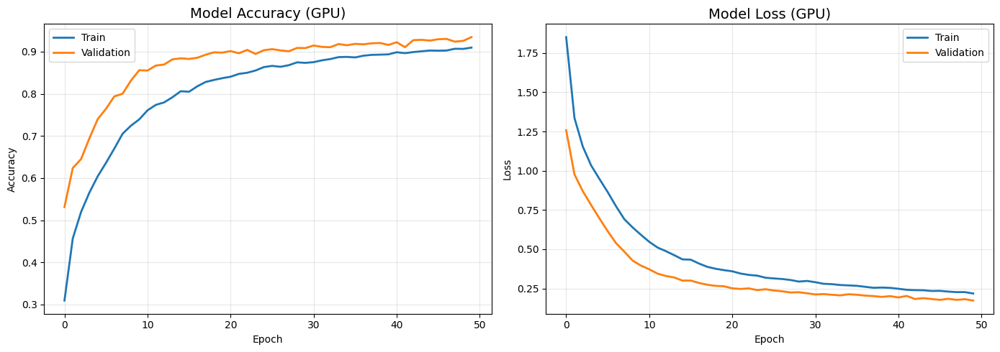


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-05.png


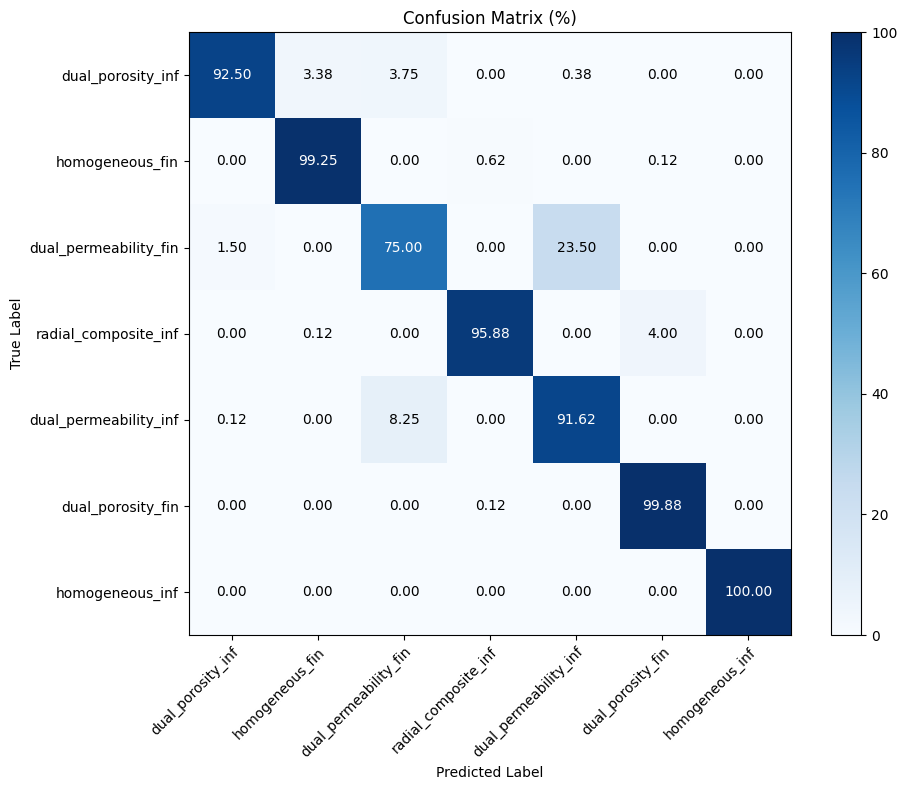


Результаты для шума 5e-05:
  Loss: 0.1690
  Accuracy: 0.9345


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset06
УРОВЕНЬ ШУМА: 5e-06
Найденные метки: ['dual_porosity_inf', 'homogeneous_fin', 'dual_permeability_fin', 'radial_composite_inf', 'dual_permeability_inf', 'dual_porosity_fin', 'homogeneous_inf']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.2129 - loss: 2.4225
Epoch 1: val_accuracy improved from None to 0.53429, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 18s 17ms/step - accuracy: 0.2864 - loss: 2.0068 - val_accuracy: 0.5343 - val_loss: 1.2899 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4336 - loss: 1.4395
Epoch 2: val_accuracy improved from 0.53429 to 0.62000, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4519 - loss: 1.3720 - val_accuracy: 0.6200 - val_loss: 1.0001 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4989 - loss: 1.2217
Epoch 3: val_accuracy improved from 0.62000 to 0.66679, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.5115 - loss: 1.1842 - val_accuracy: 0.6668 - val_loss: 0.8975 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5360 - loss: 1.1002
Epoch 4: val_accuracy improved from 0.66679 to 0.67893, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5536 - loss: 1.0676 - val_accuracy: 0.6789 - val_loss: 0.8145 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5870 - loss: 0.9968
Epoch 5: val_accuracy improved from 0.67893 to 0.70643, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5961 - loss: 0.9769 - val_accuracy: 0.7064 - val_loss: 0.7415 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6136 - loss: 0.9285
Epoch 6: val_accuracy improved from 0.70643 to 0.73000, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6278 - loss: 0.8998 - val_accuracy: 0.7300 - val_loss: 0.6740 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6548 - loss: 0.8450
Epoch 7: val_accuracy improved from 0.73000 to 0.76464, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6604 - loss: 0.8279 - val_accuracy: 0.7646 - val_loss: 0.6087 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6794 - loss: 0.7750
Epoch 8: val_accuracy improved from 0.76464 to 0.78143, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6825 - loss: 0.7642 - val_accuracy: 0.7814 - val_loss: 0.5518 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7005 - loss: 0.7219
Epoch 9: val_accuracy improved from 0.78143 to 0.78393, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7024 - loss: 0.7111 - val_accuracy: 0.7839 - val_loss: 0.5087 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7206 - loss: 0.6678
Epoch 10: val_accuracy improved from 0.78393 to 0.80107, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7263 - loss: 0.6505 - val_accuracy: 0.8011 - val_loss: 0.4657 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7424 - loss: 0.6153
Epoch 11: val_accuracy improved from 0.80107 to 0.81571, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7432 - loss: 0.6077 - val_accuracy: 0.8157 - val_loss: 0.4273 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7482 - loss: 0.5910
Epoch 12: val_accuracy improved from 0.81571 to 0.84250, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7568 - loss: 0.5721 - val_accuracy: 0.8425 - val_loss: 0.3949 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7715 - loss: 0.5332
Epoch 13: val_accuracy improved from 0.84250 to 0.84857, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7710 - loss: 0.5305 - val_accuracy: 0.8486 - val_loss: 0.3731 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7798 - loss: 0.5131
Epoch 14: val_accuracy improved from 0.84857 to 0.85464, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7851 - loss: 0.5023 - val_accuracy: 0.8546 - val_loss: 0.3534 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7932 - loss: 0.4825
Epoch 15: val_accuracy did not improve from 0.85464
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7943 - loss: 0.4755 - val_accuracy: 0.8543 - val_loss: 0.3437 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8053 - loss: 0.4560
Epoch 16: val_accuracy improved from 0.85464 to 0.86643, saving model to best_model_classification.h5



Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8049 - loss: 0.4575 - val_accuracy: 0.8664 - val_loss: 0.3204 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8103 - loss: 0.4362
Epoch 17: val_accuracy improved from 0.86643 to 0.87107, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8115 - loss: 0.4349 - val_accuracy: 0.8711 - val_loss: 0.3110 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8255 - loss: 0.4123
Epoch 18: val_accuracy did not improve from 0.87107
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8215 - loss: 0.4168 - val_accuracy: 0.8700 - val_loss: 0.2999 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8259 - loss: 0.3975
Epoch 19: val_accuracy improved from 0.87107 to 0.87679, saving model to best_model_classification.h5



Epoch 19: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8272 - loss: 0.3972 - val_accuracy: 0.8768 - val_loss: 0.2896 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8322 - loss: 0.3877
Epoch 20: val_accuracy improved from 0.87679 to 0.87714, saving model to best_model_classification.h5



Epoch 20: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8333 - loss: 0.3834 - val_accuracy: 0.8771 - val_loss: 0.2842 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8379 - loss: 0.3758
Epoch 21: val_accuracy improved from 0.87714 to 0.87821, saving model to best_model_classification.h5



Epoch 21: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8393 - loss: 0.3729 - val_accuracy: 0.8782 - val_loss: 0.2821 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8462 - loss: 0.3638
Epoch 22: val_accuracy improved from 0.87821 to 0.88500, saving model to best_model_classification.h5



Epoch 22: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8468 - loss: 0.3603 - val_accuracy: 0.8850 - val_loss: 0.2592 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8435 - loss: 0.3671
Epoch 23: val_accuracy improved from 0.88500 to 0.89214, saving model to best_model_classification.h5



Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8470 - loss: 0.3548 - val_accuracy: 0.8921 - val_loss: 0.2558 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8548 - loss: 0.3397
Epoch 24: val_accuracy did not improve from 0.89214
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8538 - loss: 0.3415 - val_accuracy: 0.8907 - val_loss: 0.2479 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8583 - loss: 0.3305
Epoch 25: val_accuracy improved from 0.89214 to 0.89429, saving model to best_model_classification.h5



Epoch 25: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8586 - loss: 0.3294 - val_accuracy: 0.8943 - val_loss: 0.2453 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8640 - loss: 0.3295
Epoch 26: val_accuracy improved from 0.89429 to 0.89607, saving model to best_model_classification.h5



Epoch 26: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.8645 - loss: 0.3220 - val_accuracy: 0.8961 - val_loss: 0.2458 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8664 - loss: 0.3080
Epoch 27: val_accuracy did not improve from 0.89607
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8655 - loss: 0.3081 - val_accuracy: 0.8943 - val_loss: 0.2384 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8730 - loss: 0.3081
Epoch 28: val_accuracy improved from 0.89607 to 0.90179, saving model to best_model_classification.h5



Epoch 28: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8735 - loss: 0.3054 - val_accuracy: 0.9018 - val_loss: 0.2282 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8755 - loss: 0.2960
Epoch 29: val_accuracy did not improve from 0.90179
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8747 - loss: 0.3006 - val_accuracy: 0.9018 - val_loss: 0.2307 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8788 - loss: 0.2892
Epoch 30: val_accuracy improved from 0.90179 to 0.90750, saving model to best_model_classification.h5



Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8774 - loss: 0.2905 - val_accuracy: 0.9075 - val_loss: 0.2230 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8758 - loss: 0.2893
Epoch 31: val_accuracy did not improve from 0.90750
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8780 - loss: 0.2878 - val_accuracy: 0.9018 - val_loss: 0.2199 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8844 - loss: 0.2701
Epoch 32: val_accuracy improved from 0.90750 to 0.90821, saving model to best_model_classification.h5



Epoch 32: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8813 - loss: 0.2819 - val_accuracy: 0.9082 - val_loss: 0.2147 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8844 - loss: 0.2751
Epoch 33: val_accuracy improved from 0.90821 to 0.91071, saving model to best_model_classification.h5



Epoch 33: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.8855 - loss: 0.2735 - val_accuracy: 0.9107 - val_loss: 0.2151 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8888 - loss: 0.2734
Epoch 34: val_accuracy improved from 0.91071 to 0.91214, saving model to best_model_classification.h5



Epoch 34: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8865 - loss: 0.2708 - val_accuracy: 0.9121 - val_loss: 0.2079 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8899 - loss: 0.2636
Epoch 35: val_accuracy improved from 0.91214 to 0.91321, saving model to best_model_classification.h5



Epoch 35: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8879 - loss: 0.2665 - val_accuracy: 0.9132 - val_loss: 0.2103 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8887 - loss: 0.2656
Epoch 36: val_accuracy improved from 0.91321 to 0.91357, saving model to best_model_classification.h5



Epoch 36: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8891 - loss: 0.2668 - val_accuracy: 0.9136 - val_loss: 0.2048 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8907 - loss: 0.2601
Epoch 37: val_accuracy improved from 0.91357 to 0.92036, saving model to best_model_classification.h5



Epoch 37: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8894 - loss: 0.2599 - val_accuracy: 0.9204 - val_loss: 0.2015 - learning_rate: 1.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 38/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8967 - loss: 0.2461
Epoch 38: val_accuracy did not improve from 0.92036
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8955 - loss: 0.2495 - val_accuracy: 0.9182 - val_loss: 0.2004 - learning_rate: 1.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 39/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8997 - loss: 0.2424
Epoch 39: val_accuracy did not improve from 0.92036
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8985 - loss: 0.2428 - val_accuracy: 0.9175 - val_loss: 0.1940 - learning_rate: 1.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 9.


Epoch 41: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9013 - loss: 0.2394 - val_accuracy: 0.9257 - val_loss: 0.1886 - learning_rate: 1.0000e-05

Epoch 42: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 42/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9044 - loss: 0.2320
Epoch 42: val_accuracy improved from 0.92571 to 0.92714, saving model to best_model_classification.h5



Epoch 42: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9035 - loss: 0.2336 - val_accuracy: 0.9271 - val_loss: 0.1916 - learning_rate: 1.0000e-05

Epoch 43: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 43/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9042 - loss: 0.2368
Epoch 43: val_accuracy improved from 0.92714 to 0.93464, saving model to best_model_classification.h5



Epoch 43: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9041 - loss: 0.2374 - val_accuracy: 0.9346 - val_loss: 0.1936 - learning_rate: 1.0000e-05

Epoch 44: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 44/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8993 - loss: 0.2346
Epoch 44: val_accuracy did not improve from 0.93464
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9021 - loss: 0.2328 - val_accuracy: 0.9329 - val_loss: 0.1792 - learning_rate: 1.0000e-05

Epoch 45: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 45/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9098 - loss: 0.2248
Epoch 45: val_accuracy improved from 0.93464 to 0.93643, saving model to best_model_classification.h5



Epoch 45: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9115 - loss: 0.2222 - val_accuracy: 0.9364 - val_loss: 0.1793 - learning_rate: 1.0000e-05

Epoch 46: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 46/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9067 - loss: 0.2202
Epoch 46: val_accuracy did not improve from 0.93643
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9059 - loss: 0.2249 - val_accuracy: 0.9154 - val_loss: 0.1862 - learning_rate: 1.0000e-05

Epoch 47: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 47/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9135 - loss: 0.2167
Epoch 47: val_accuracy improved from 0.93643 to 0.93786, saving model to best_model_classification.h5



Epoch 47: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9132 - loss: 0.2189 - val_accuracy: 0.9379 - val_loss: 0.1702 - learning_rate: 1.0000e-05

Epoch 48: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 48/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9082 - loss: 0.2167
Epoch 48: val_accuracy did not improve from 0.93786
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9098 - loss: 0.2178 - val_accuracy: 0.9379 - val_loss: 0.1759 - learning_rate: 1.0000e-05

Epoch 49: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 49/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9101 - loss: 0.2199
Epoch 49: val_accuracy did not improve from 0.93786
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9123 - loss: 0.2159 - val_accuracy: 0.9350 - val_loss: 0.1739 - learning_rate: 1.0000e-05

Epoch 50: LearningRateScheduler setting learning rate to 9.

✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9339
  loss: 0.1655

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

    dual_porosity_inf     0.9689    0.9337    0.9510       800
      homogeneous_fin     0.9519    0.9900    0.9706       800
dual_permeability_fin     0.9438    0.6925    0.7988       800
 radial_composite_inf     0.9987    0.9575    0.9777       800
dual_permeability_inf     0.7687    0.9637    0.8552       800
    dual_porosity_fin     0.9535    1.0000    0.9762       800
      homogeneous_inf     0.9988    1.0000    0.9994       800

             accuracy                         0.9339      5600
            macro avg     0.9406    0.9339    0.9327      5600
         weighted avg     0.9406    0.9339    0.9327      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

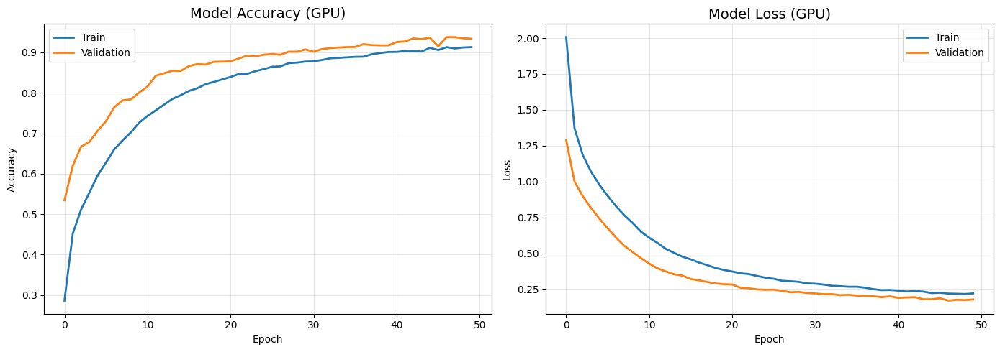


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-06.png


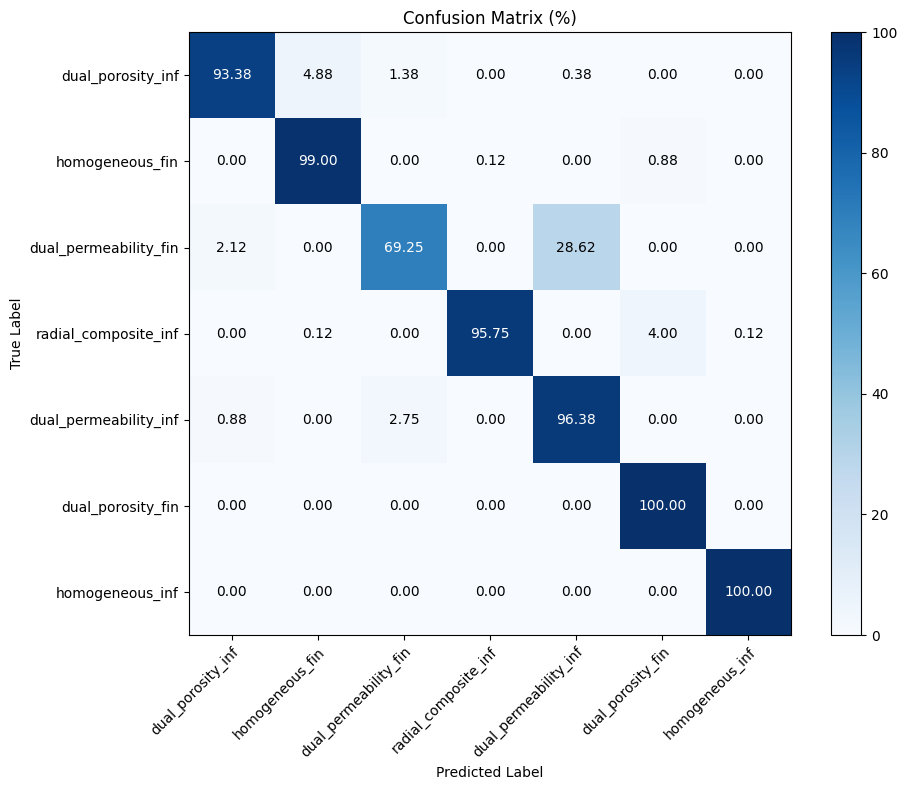


Результаты для шума 5e-06:
  Loss: 0.1655
  Accuracy: 0.9339


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset07
УРОВЕНЬ ШУМА: 5e-07
Найденные метки: ['dual_porosity_inf', 'homogeneous_fin', 'dual_permeability_fin', 'radial_composite_inf', 'dual_permeability_inf', 'dual_porosity_fin', 'homogeneous_inf']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2157 - loss: 2.3542
Epoch 1: val_accuracy improved from None to 0.55393, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 18s 15ms/step - accuracy: 0.2756 - loss: 2.0346 - val_accuracy: 0.5539 - val_loss: 1.3407 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4115 - loss: 1.5137
Epoch 2: val_accuracy improved from 0.55393 to 0.62571, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.4407 - loss: 1.4287 - val_accuracy: 0.6257 - val_loss: 1.0149 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4964 - loss: 1.2570
Epoch 3: val_accuracy improved from 0.62571 to 0.65250, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5085 - loss: 1.2230 - val_accuracy: 0.6525 - val_loss: 0.9020 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5348 - loss: 1.1396
Epoch 4: val_accuracy improved from 0.65250 to 0.67714, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.5505 - loss: 1.1090 - val_accuracy: 0.6771 - val_loss: 0.8202 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5758 - loss: 1.0330
Epoch 5: val_accuracy improved from 0.67714 to 0.72071, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5847 - loss: 1.0156 - val_accuracy: 0.7207 - val_loss: 0.7479 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6122 - loss: 0.9452
Epoch 6: val_accuracy improved from 0.72071 to 0.74929, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.6152 - loss: 0.9307 - val_accuracy: 0.7493 - val_loss: 0.6749 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6375 - loss: 0.8762
Epoch 7: val_accuracy improved from 0.74929 to 0.77786, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6493 - loss: 0.8519 - val_accuracy: 0.7779 - val_loss: 0.6025 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6671 - loss: 0.8011
Epoch 8: val_accuracy improved from 0.77786 to 0.79536, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6766 - loss: 0.7830 - val_accuracy: 0.7954 - val_loss: 0.5428 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6961 - loss: 0.7373
Epoch 9: val_accuracy improved from 0.79536 to 0.81286, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7016 - loss: 0.7190 - val_accuracy: 0.8129 - val_loss: 0.4906 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7158 - loss: 0.6800
Epoch 10: val_accuracy improved from 0.81286 to 0.82000, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7203 - loss: 0.6732 - val_accuracy: 0.8200 - val_loss: 0.4541 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7314 - loss: 0.6354
Epoch 11: val_accuracy improved from 0.82000 to 0.84179, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7394 - loss: 0.6201 - val_accuracy: 0.8418 - val_loss: 0.4138 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7519 - loss: 0.5846
Epoch 12: val_accuracy improved from 0.84179 to 0.85429, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7532 - loss: 0.5837 - val_accuracy: 0.8543 - val_loss: 0.3843 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7631 - loss: 0.5469
Epoch 13: val_accuracy improved from 0.85429 to 0.85893, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7688 - loss: 0.5399 - val_accuracy: 0.8589 - val_loss: 0.3597 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7725 - loss: 0.5316
Epoch 14: val_accuracy improved from 0.85893 to 0.86571, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7838 - loss: 0.5076 - val_accuracy: 0.8657 - val_loss: 0.3356 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7920 - loss: 0.4843
Epoch 15: val_accuracy improved from 0.86571 to 0.87679, saving model to best_model_classification.h5



Epoch 15: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7937 - loss: 0.4857 - val_accuracy: 0.8768 - val_loss: 0.3101 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8031 - loss: 0.4648
Epoch 16: val_accuracy did not improve from 0.87679
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8043 - loss: 0.4581 - val_accuracy: 0.8754 - val_loss: 0.2967 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8148 - loss: 0.4412
Epoch 17: val_accuracy improved from 0.87679 to 0.88500, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8165 - loss: 0.4387 - val_accuracy: 0.8850 - val_loss: 0.2831 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8216 - loss: 0.4177
Epoch 18: val_accuracy improved from 0.88500 to 0.88643, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8244 - loss: 0.4159 - val_accuracy: 0.8864 - val_loss: 0.2781 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8348 - loss: 0.3885
Epoch 19: val_accuracy improved from 0.88643 to 0.89679, saving model to best_model_classification.h5



Epoch 19: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8309 - loss: 0.3981 - val_accuracy: 0.8968 - val_loss: 0.2561 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8359 - loss: 0.3932
Epoch 20: val_accuracy did not improve from 0.89679
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8361 - loss: 0.3887 - val_accuracy: 0.8939 - val_loss: 0.2525 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8472 - loss: 0.3651
Epoch 21: val_accuracy improved from 0.89679 to 0.90214, saving model to best_model_classification.h5



Epoch 21: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8438 - loss: 0.3717 - val_accuracy: 0.9021 - val_loss: 0.2394 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8465 - loss: 0.3605
Epoch 22: val_accuracy did not improve from 0.90214
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8478 - loss: 0.3579 - val_accuracy: 0.9007 - val_loss: 0.2353 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8565 - loss: 0.3446
Epoch 23: val_accuracy improved from 0.90214 to 0.90857, saving model to best_model_classification.h5



Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8556 - loss: 0.3459 - val_accuracy: 0.9086 - val_loss: 0.2264 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8571 - loss: 0.3354
Epoch 24: val_accuracy did not improve from 0.90857
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8588 - loss: 0.3344 - val_accuracy: 0.9061 - val_loss: 0.2272 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8659 - loss: 0.3249
Epoch 25: val_accuracy improved from 0.90857 to 0.91107, saving model to best_model_classification.h5



Epoch 25: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8651 - loss: 0.3253 - val_accuracy: 0.9111 - val_loss: 0.2133 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8760 - loss: 0.3088
Epoch 26: val_accuracy did not improve from 0.91107
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8713 - loss: 0.3156 - val_accuracy: 0.9100 - val_loss: 0.2173 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8650 - loss: 0.3181
Epoch 27: val_accuracy improved from 0.91107 to 0.91500, saving model to best_model_classification.h5



Epoch 27: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8669 - loss: 0.3130 - val_accuracy: 0.9150 - val_loss: 0.2149 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8779 - loss: 0.2919
Epoch 28: val_accuracy improved from 0.91500 to 0.92036, saving model to best_model_classification.h5



Epoch 28: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8764 - loss: 0.2982 - val_accuracy: 0.9204 - val_loss: 0.2046 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8769 - loss: 0.3027
Epoch 29: val_accuracy improved from 0.92036 to 0.92143, saving model to best_model_classification.h5



Epoch 29: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8749 - loss: 0.3034 - val_accuracy: 0.9214 - val_loss: 0.1989 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8889 - loss: 0.2850
Epoch 30: val_accuracy did not improve from 0.92143
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8841 - loss: 0.2897 - val_accuracy: 0.9182 - val_loss: 0.2035 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8785 - loss: 0.2876
Epoch 31: val_accuracy did not improve from 0.92143
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8791 - loss: 0.2859 - val_accuracy: 0.9186 - val_loss: 0.1977 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.


Epoch 32: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8853 - loss: 0.2798 - val_accuracy: 0.9218 - val_loss: 0.1940 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8881 - loss: 0.2759
Epoch 33: val_accuracy improved from 0.92179 to 0.92571, saving model to best_model_classification.h5



Epoch 33: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8883 - loss: 0.2755 - val_accuracy: 0.9257 - val_loss: 0.1948 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8905 - loss: 0.2665
Epoch 34: val_accuracy did not improve from 0.92571
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8888 - loss: 0.2690 - val_accuracy: 0.9243 - val_loss: 0.1864 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8924 - loss: 0.2636
Epoch 35: val_accuracy improved from 0.92571 to 0.92893, saving model to best_model_classification.h5



Epoch 35: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8951 - loss: 0.2612 - val_accuracy: 0.9289 - val_loss: 0.1837 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8940 - loss: 0.2627
Epoch 36: val_accuracy did not improve from 0.92893
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8951 - loss: 0.2611 - val_accuracy: 0.9254 - val_loss: 0.1835 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8955 - loss: 0.2565
Epoch 37: val_accuracy improved from 0.92893 to 0.93179, saving model to best_model_classification.h5



Epoch 37: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8978 - loss: 0.2549 - val_accuracy: 0.9318 - val_loss: 0.1800 - learning_rate: 1.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 38/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8954 - loss: 0.2603
Epoch 38: val_accuracy did not improve from 0.93179
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8973 - loss: 0.2543 - val_accuracy: 0.9314 - val_loss: 0.1775 - learning_rate: 1.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 39/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8983 - loss: 0.2507
Epoch 39: val_accuracy improved from 0.93179 to 0.93643, saving model to best_model_classification.h5



Epoch 39: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8994 - loss: 0.2468 - val_accuracy: 0.9364 - val_loss: 0.1732 - learning_rate: 1.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 40/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9032 - loss: 0.2365
Epoch 40: val_accuracy did not improve from 0.93643
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9020 - loss: 0.2416 - val_accuracy: 0.9264 - val_loss: 0.1809 - learning_rate: 1.0000e-05

Epoch 41: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 41/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9088 - loss: 0.2366
Epoch 41: val_accuracy did not improve from 0.93643
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9059 - loss: 0.2379 - val_accuracy: 0.9332 - val_loss: 0.1725 - learning_rate: 1.0000e-05

Epoch 42: LearningRateScheduler setting learning rate to 9.


Epoch 42: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9056 - loss: 0.2360 - val_accuracy: 0.9389 - val_loss: 0.1679 - learning_rate: 1.0000e-05

Epoch 43: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 43/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9029 - loss: 0.2391
Epoch 43: val_accuracy did not improve from 0.93893
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9081 - loss: 0.2344 - val_accuracy: 0.9343 - val_loss: 0.1715 - learning_rate: 1.0000e-05

Epoch 44: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 44/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9073 - loss: 0.2282
Epoch 44: val_accuracy did not improve from 0.93893
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9058 - loss: 0.2312 - val_accuracy: 0.9371 - val_loss: 0.1681 - learning_rate: 1.0000e-05

Epoch 45: LearningRateScheduler setting learning rate to 9.


Epoch 45: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9105 - loss: 0.2275 - val_accuracy: 0.9396 - val_loss: 0.1704 - learning_rate: 1.0000e-05

Epoch 46: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 46/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9100 - loss: 0.2238
Epoch 46: val_accuracy did not improve from 0.93964
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9080 - loss: 0.2280 - val_accuracy: 0.9332 - val_loss: 0.1675 - learning_rate: 1.0000e-05

Epoch 47: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 47/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9109 - loss: 0.2255
Epoch 47: val_accuracy did not improve from 0.93964
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9094 - loss: 0.2287 - val_accuracy: 0.9296 - val_loss: 0.1656 - learning_rate: 1.0000e-05

Epoch 48: LearningRateScheduler setting learning rate to 9.

✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9368
  loss: 0.1660

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

    dual_porosity_inf     0.9813    0.9200    0.9497       800
      homogeneous_fin     0.9599    0.9875    0.9735       800
dual_permeability_fin     0.8464    0.8125    0.8291       800
 radial_composite_inf     0.9974    0.9600    0.9783       800
dual_permeability_inf     0.8259    0.8775    0.8509       800
    dual_porosity_fin     0.9535    1.0000    0.9762       800
      homogeneous_inf     1.0000    1.0000    1.0000       800

             accuracy                         0.9368      5600
            macro avg     0.9378    0.9368    0.9368      5600
         weighted avg     0.9378    0.9368    0.9368      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

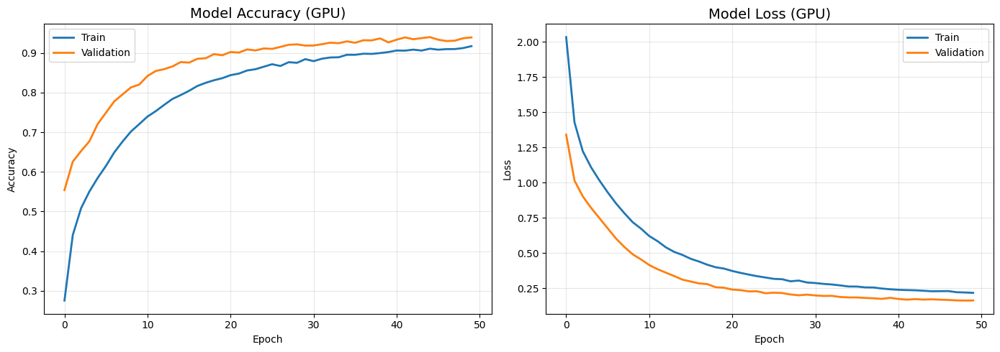


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-07.png


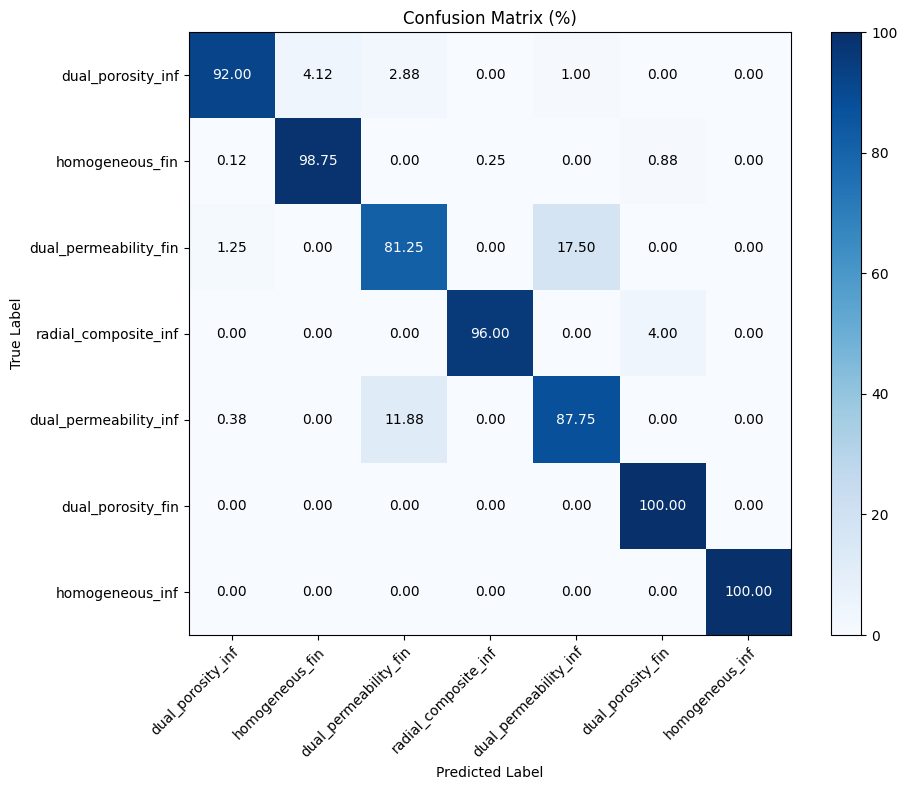


Результаты для шума 5e-07:
  Loss: 0.1660
  Accuracy: 0.9368



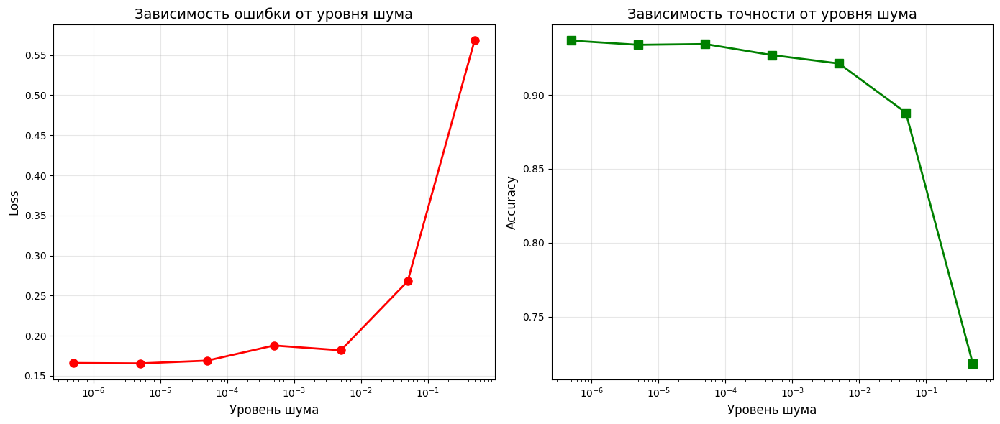


✅ Результаты сохранены в 'noise_variance_results.csv'
    noise_level      loss  accuracy
0  5.000000e-01  0.568092  0.718393
1  5.000000e-02  0.267922  0.888036
2  5.000000e-03  0.181881  0.921250
3  5.000000e-04  0.187878  0.926964
4  5.000000e-05  0.168967  0.934464
5  5.000000e-06  0.165532  0.933929
6  5.000000e-07  0.166036  0.936786


,noise_level,loss,accuracy
0,5.000000e-01,0.568092,0.718393
1,5.000000e-02,0.267922,0.888036
2,5.000000e-03,0.181881,0.921250
3,5.000000e-04,0.187878,0.926964
4,5.000000e-05,0.168967,0.934464
5,5.000000e-06,0.165532,0.933929
6,5.000000e-07,0.166036,0.936786


In [ ]:
train_with_noize_variance()


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset01
УРОВЕНЬ ШУМА: 0.5
Найденные метки: ['dual_permeability_fin', 'dual_permeability_inf', 'homogeneous_inf', 'homogeneous_fin', 'dual_porosity_inf', 'radial_composite_inf', 'dual_porosity_fin']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.1905 - loss: 2.4152
Epoch 1: val_accuracy improved from None to 0.38643, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 20s 17ms/step - accuracy: 0.2228 - loss: 2.1905 - val_accuracy: 0.3864 - val_loss: 1.6022 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2979 - loss: 1.8013
Epoch 2: val_accuracy improved from 0.38643 to 0.45393, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.3128 - loss: 1.7417 - val_accuracy: 0.4539 - val_loss: 1.3768 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3619 - loss: 1.6015
Epoch 3: val_accuracy improved from 0.45393 to 0.48179, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.3728 - loss: 1.5658 - val_accuracy: 0.4818 - val_loss: 1.2628 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3989 - loss: 1.4764
Epoch 4: val_accuracy improved from 0.48179 to 0.50821, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.4074 - loss: 1.4484 - val_accuracy: 0.5082 - val_loss: 1.1831 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4231 - loss: 1.3741
Epoch 5: val_accuracy improved from 0.50821 to 0.52750, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4320 - loss: 1.3553 - val_accuracy: 0.5275 - val_loss: 1.1253 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4541 - loss: 1.3039
Epoch 6: val_accuracy improved from 0.52750 to 0.54429, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4557 - loss: 1.2936 - val_accuracy: 0.5443 - val_loss: 1.0837 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4759 - loss: 1.2421
Epoch 7: val_accuracy improved from 0.54429 to 0.55786, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4734 - loss: 1.2419 - val_accuracy: 0.5579 - val_loss: 1.0501 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4869 - loss: 1.2090
Epoch 8: val_accuracy improved from 0.55786 to 0.56607, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.4841 - loss: 1.2048 - val_accuracy: 0.5661 - val_loss: 1.0190 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
600/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4983 - loss: 1.1584
Epoch 9: val_accuracy improved from 0.56607 to 0.57964, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.4983 - loss: 1.1564 - val_accuracy: 0.5796 - val_loss: 0.9881 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5095 - loss: 1.1401
Epoch 10: val_accuracy improved from 0.57964 to 0.58679, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.5120 - loss: 1.1274 - val_accuracy: 0.5868 - val_loss: 0.9592 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5217 - loss: 1.0941
Epoch 11: val_accuracy improved from 0.58679 to 0.59857, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5180 - loss: 1.0997 - val_accuracy: 0.5986 - val_loss: 0.9297 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5261 - loss: 1.0710
Epoch 12: val_accuracy improved from 0.59857 to 0.60821, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5286 - loss: 1.0692 - val_accuracy: 0.6082 - val_loss: 0.9024 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5373 - loss: 1.0536
Epoch 13: val_accuracy improved from 0.60821 to 0.62214, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.5395 - loss: 1.0484 - val_accuracy: 0.6221 - val_loss: 0.8745 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5492 - loss: 1.0213
Epoch 14: val_accuracy improved from 0.62214 to 0.63393, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5507 - loss: 1.0090 - val_accuracy: 0.6339 - val_loss: 0.8427 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5558 - loss: 0.9921
Epoch 15: val_accuracy improved from 0.63393 to 0.64143, saving model to best_model_classification.h5



Epoch 15: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5620 - loss: 0.9763 - val_accuracy: 0.6414 - val_loss: 0.8148 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5753 - loss: 0.9487
Epoch 16: val_accuracy improved from 0.64143 to 0.65107, saving model to best_model_classification.h5



Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5746 - loss: 0.9448 - val_accuracy: 0.6511 - val_loss: 0.7854 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5876 - loss: 0.9120
Epoch 17: val_accuracy improved from 0.65107 to 0.66429, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5843 - loss: 0.9198 - val_accuracy: 0.6643 - val_loss: 0.7605 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5883 - loss: 0.9040
Epoch 18: val_accuracy improved from 0.66429 to 0.67214, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5936 - loss: 0.9002 - val_accuracy: 0.6721 - val_loss: 0.7377 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5933 - loss: 0.8868
Epoch 19: val_accuracy improved from 0.67214 to 0.67929, saving model to best_model_classification.h5



Epoch 19: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5985 - loss: 0.8758 - val_accuracy: 0.6793 - val_loss: 0.7134 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6066 - loss: 0.8536
Epoch 20: val_accuracy improved from 0.67929 to 0.68929, saving model to best_model_classification.h5



Epoch 20: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6098 - loss: 0.8508 - val_accuracy: 0.6893 - val_loss: 0.6931 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6151 - loss: 0.8301
Epoch 21: val_accuracy did not improve from 0.68929
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6177 - loss: 0.8280 - val_accuracy: 0.6882 - val_loss: 0.6796 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6261 - loss: 0.8160
Epoch 22: val_accuracy improved from 0.68929 to 0.69214, saving model to best_model_classification.h5



Epoch 22: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6265 - loss: 0.8103 - val_accuracy: 0.6921 - val_loss: 0.6657 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6221 - loss: 0.7957
Epoch 23: val_accuracy improved from 0.69214 to 0.70036, saving model to best_model_classification.h5



Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6269 - loss: 0.7922 - val_accuracy: 0.7004 - val_loss: 0.6478 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6233 - loss: 0.7826
Epoch 24: val_accuracy improved from 0.70036 to 0.70286, saving model to best_model_classification.h5



Epoch 24: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6343 - loss: 0.7723 - val_accuracy: 0.7029 - val_loss: 0.6382 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6461 - loss: 0.7516
Epoch 25: val_accuracy did not improve from 0.70286
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6457 - loss: 0.7540 - val_accuracy: 0.7029 - val_loss: 0.6257 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6358 - loss: 0.7597
Epoch 26: val_accuracy did not improve from 0.70286
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6413 - loss: 0.7488 - val_accuracy: 0.7025 - val_loss: 0.6148 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.


Epoch 27: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6472 - loss: 0.7326 - val_accuracy: 0.7046 - val_loss: 0.6080 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6485 - loss: 0.7199
Epoch 28: val_accuracy improved from 0.70464 to 0.70714, saving model to best_model_classification.h5



Epoch 28: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6509 - loss: 0.7192 - val_accuracy: 0.7071 - val_loss: 0.5995 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6580 - loss: 0.7028
Epoch 29: val_accuracy did not improve from 0.70714
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6602 - loss: 0.7039 - val_accuracy: 0.7068 - val_loss: 0.5937 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
601/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6590 - loss: 0.7012
Epoch 30: val_accuracy improved from 0.70714 to 0.71393, saving model to best_model_classification.h5



Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.6588 - loss: 0.6973 - val_accuracy: 0.7139 - val_loss: 0.5852 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6636 - loss: 0.6911
Epoch 31: val_accuracy did not improve from 0.71393
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6699 - loss: 0.6846 - val_accuracy: 0.7129 - val_loss: 0.5778 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6652 - loss: 0.6746
Epoch 32: val_accuracy did not improve from 0.71393
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6692 - loss: 0.6723 - val_accuracy: 0.7132 - val_loss: 0.5705 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.


Epoch 33: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6719 - loss: 0.6697 - val_accuracy: 0.7179 - val_loss: 0.5688 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6752 - loss: 0.6533
Epoch 34: val_accuracy improved from 0.71786 to 0.72071, saving model to best_model_classification.h5



Epoch 34: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6763 - loss: 0.6578 - val_accuracy: 0.7207 - val_loss: 0.5658 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6797 - loss: 0.6493
Epoch 35: val_accuracy improved from 0.72071 to 0.72214, saving model to best_model_classification.h5



Epoch 35: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6819 - loss: 0.6491 - val_accuracy: 0.7221 - val_loss: 0.5595 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6738 - loss: 0.6517
Epoch 36: val_accuracy did not improve from 0.72214
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6808 - loss: 0.6450 - val_accuracy: 0.7221 - val_loss: 0.5528 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6926 - loss: 0.6298
Epoch 37: val_accuracy improved from 0.72214 to 0.72536, saving model to best_model_classification.h5



Epoch 37: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6899 - loss: 0.6346 - val_accuracy: 0.7254 - val_loss: 0.5493 - learning_rate: 1.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 38/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6836 - loss: 0.6336
Epoch 38: val_accuracy improved from 0.72536 to 0.72679, saving model to best_model_classification.h5



Epoch 38: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6853 - loss: 0.6295 - val_accuracy: 0.7268 - val_loss: 0.5455 - learning_rate: 1.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 39/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6940 - loss: 0.6158
Epoch 39: val_accuracy improved from 0.72679 to 0.72821, saving model to best_model_classification.h5



Epoch 39: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6884 - loss: 0.6242 - val_accuracy: 0.7282 - val_loss: 0.5445 - learning_rate: 1.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 40/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6887 - loss: 0.6241
Epoch 40: val_accuracy improved from 0.72821 to 0.72929, saving model to best_model_classification.h5



Epoch 40: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6932 - loss: 0.6169 - val_accuracy: 0.7293 - val_loss: 0.5346 - learning_rate: 1.0000e-05

Epoch 41: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 41/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6967 - loss: 0.6182
Epoch 41: val_accuracy improved from 0.72929 to 0.73429, saving model to best_model_classification.h5



Epoch 41: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6963 - loss: 0.6136 - val_accuracy: 0.7343 - val_loss: 0.5327 - learning_rate: 1.0000e-05

Epoch 42: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 42/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7030 - loss: 0.6055
Epoch 42: val_accuracy improved from 0.73429 to 0.73786, saving model to best_model_classification.h5



Epoch 42: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7024 - loss: 0.6018 - val_accuracy: 0.7379 - val_loss: 0.5251 - learning_rate: 1.0000e-05

Epoch 43: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 43/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7005 - loss: 0.5939
Epoch 43: val_accuracy improved from 0.73786 to 0.74071, saving model to best_model_classification.h5



Epoch 43: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7017 - loss: 0.5976 - val_accuracy: 0.7407 - val_loss: 0.5221 - learning_rate: 1.0000e-05

Epoch 44: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 44/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6959 - loss: 0.5963
Epoch 44: val_accuracy did not improve from 0.74071
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6996 - loss: 0.5931 - val_accuracy: 0.7371 - val_loss: 0.5171 - learning_rate: 1.0000e-05

Epoch 45: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 45/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7078 - loss: 0.5857
Epoch 45: val_accuracy improved from 0.74071 to 0.74393, saving model to best_model_classification.h5



Epoch 45: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7096 - loss: 0.5822 - val_accuracy: 0.7439 - val_loss: 0.5185 - learning_rate: 1.0000e-05

Epoch 46: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 46/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7046 - loss: 0.5845
Epoch 46: val_accuracy did not improve from 0.74393
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7081 - loss: 0.5811 - val_accuracy: 0.7396 - val_loss: 0.5115 - learning_rate: 1.0000e-05

Epoch 47: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 47/50
601/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7106 - loss: 0.5820
Epoch 47: val_accuracy improved from 0.74393 to 0.74429, saving model to best_model_classification.h5



Epoch 47: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7121 - loss: 0.5751 - val_accuracy: 0.7443 - val_loss: 0.5109 - learning_rate: 1.0000e-05

Epoch 48: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 48/50
600/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7147 - loss: 0.5742
Epoch 48: val_accuracy improved from 0.74429 to 0.74464, saving model to best_model_classification.h5



Epoch 48: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7179 - loss: 0.5724 - val_accuracy: 0.7446 - val_loss: 0.5045 - learning_rate: 1.0000e-05

Epoch 49: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 49/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7191 - loss: 0.5612
Epoch 49: val_accuracy improved from 0.74464 to 0.74750, saving model to best_model_classification.h5



Epoch 49: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.7216 - loss: 0.5641 - val_accuracy: 0.7475 - val_loss: 0.5010 - learning_rate: 1.0000e-05

Epoch 50: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 50/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7110 - loss: 0.5674
Epoch 50: val_accuracy improved from 0.74750 to 0.75179, saving model to best_model_classification.h5



Epoch 50: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7195 - loss: 0.5624 - val_accuracy: 0.7518 - val_loss: 0.5043 - learning_rate: 1.0000e-05

✅ Обучение завершено за 191.85 секунд
✅ Лучшая модель сохранена в: best_model_classification.h5


✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.7652
  loss: 0.4910

📈 ROC AUC Score (macro): 0.9704

📊 Classification Report:
                       precision    recall  f1-score   support

dual_permeability_fin     0.9055    0.7550    0.8234       800
dual_permeability_inf     0.8387    0.9487    0.8903       800
      homogeneous_inf     0.6562    0.2362    0.3474       800
      homogeneous_fin     0.7627    0.6950    0.7273       800
    dual_porosity_inf     0.5568    0.9062    0.6898       800
 radial_composite_inf     0.7173    0.8150    0.7630       800
    dual_porosity_fin     1.0000    1.0000    1.0000       800

             accuracy                         0.7652      5600
            macro avg     0.7768    0.7652    0.7488      5600
         weighted avg     0.7768    0.7652    0.7488      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluatio

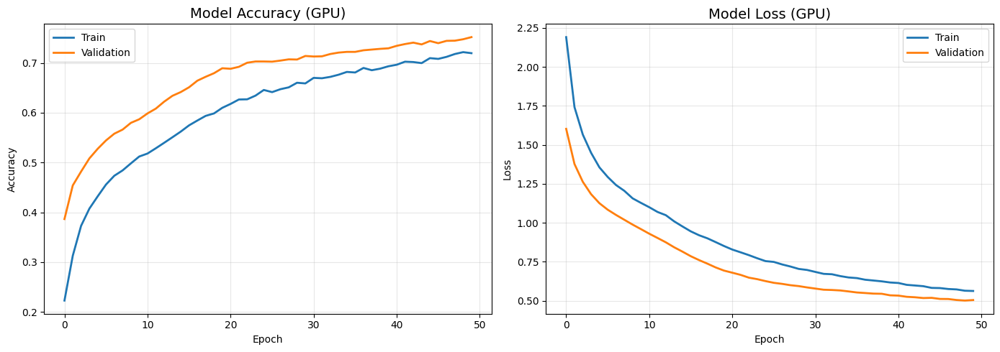


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-01.png


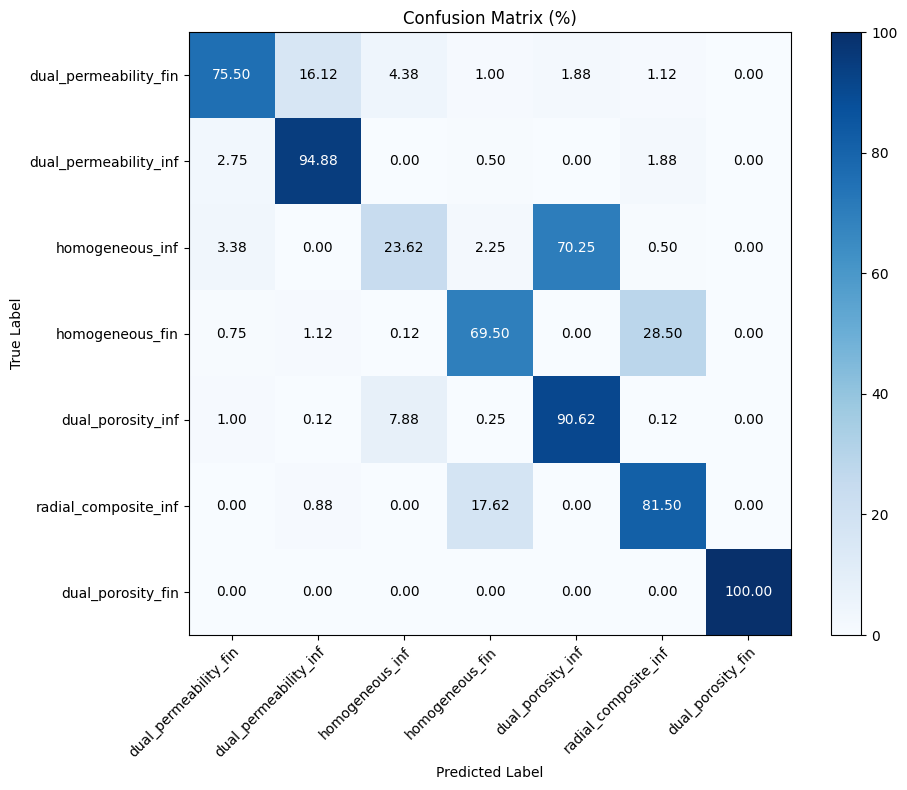


Результаты для шума 0.5:
  Loss: 0.4910
  Accuracy: 0.7652


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset02
УРОВЕНЬ ШУМА: 0.05
Найденные метки: ['dual_permeability_fin', 'dual_permeability_inf', 'homogeneous_inf', 'homogeneous_fin', 'dual_porosity_inf', 'radial_composite_inf', 'dual_porosity_fin']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.2251 - loss: 2.2113
Epoch 1: val_accuracy improved from None to 0.49107, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 21s 18ms/step - accuracy: 0.2945 - loss: 1.9055 - val_accuracy: 0.4911 - val_loss: 1.3200 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4222 - loss: 1.4417
Epoch 2: val_accuracy improved from 0.49107 to 0.59286, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4517 - loss: 1.3701 - val_accuracy: 0.5929 - val_loss: 1.0001 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4946 - loss: 1.2360
Epoch 3: val_accuracy improved from 0.59286 to 0.63071, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.5135 - loss: 1.1892 - val_accuracy: 0.6307 - val_loss: 0.8889 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5499 - loss: 1.0864
Epoch 4: val_accuracy improved from 0.63071 to 0.66321, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5586 - loss: 1.0631 - val_accuracy: 0.6632 - val_loss: 0.7988 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5806 - loss: 0.9943
Epoch 5: val_accuracy improved from 0.66321 to 0.69500, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5919 - loss: 0.9766 - val_accuracy: 0.6950 - val_loss: 0.7261 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6186 - loss: 0.9160
Epoch 6: val_accuracy improved from 0.69500 to 0.72036, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6249 - loss: 0.8981 - val_accuracy: 0.7204 - val_loss: 0.6607 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6349 - loss: 0.8595
Epoch 7: val_accuracy improved from 0.72036 to 0.74071, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.6414 - loss: 0.8398 - val_accuracy: 0.7407 - val_loss: 0.6049 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6683 - loss: 0.7816
Epoch 8: val_accuracy improved from 0.74071 to 0.75643, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6672 - loss: 0.7758 - val_accuracy: 0.7564 - val_loss: 0.5568 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6863 - loss: 0.7315
Epoch 9: val_accuracy improved from 0.75643 to 0.77321, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6891 - loss: 0.7223 - val_accuracy: 0.7732 - val_loss: 0.5130 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7047 - loss: 0.6938
Epoch 10: val_accuracy improved from 0.77321 to 0.79571, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7072 - loss: 0.6795 - val_accuracy: 0.7957 - val_loss: 0.4756 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7198 - loss: 0.6440
Epoch 11: val_accuracy improved from 0.79571 to 0.81071, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7193 - loss: 0.6393 - val_accuracy: 0.8107 - val_loss: 0.4451 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7321 - loss: 0.6141
Epoch 12: val_accuracy improved from 0.81071 to 0.82429, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7385 - loss: 0.6019 - val_accuracy: 0.8243 - val_loss: 0.4202 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7467 - loss: 0.5756
Epoch 13: val_accuracy improved from 0.82429 to 0.83464, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7493 - loss: 0.5658 - val_accuracy: 0.8346 - val_loss: 0.3935 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7613 - loss: 0.5508
Epoch 14: val_accuracy improved from 0.83464 to 0.84107, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7566 - loss: 0.5483 - val_accuracy: 0.8411 - val_loss: 0.3818 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7714 - loss: 0.5194
Epoch 15: val_accuracy did not improve from 0.84107
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7682 - loss: 0.5223 - val_accuracy: 0.8400 - val_loss: 0.3639 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7717 - loss: 0.5076
Epoch 16: val_accuracy improved from 0.84107 to 0.85143, saving model to best_model_classification.h5



Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7748 - loss: 0.5019 - val_accuracy: 0.8514 - val_loss: 0.3476 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7843 - loss: 0.4831
Epoch 17: val_accuracy improved from 0.85143 to 0.85250, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7819 - loss: 0.4832 - val_accuracy: 0.8525 - val_loss: 0.3386 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7923 - loss: 0.4659
Epoch 18: val_accuracy improved from 0.85250 to 0.85643, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7907 - loss: 0.4651 - val_accuracy: 0.8564 - val_loss: 0.3284 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7994 - loss: 0.4497
Epoch 19: val_accuracy did not improve from 0.85643
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7942 - loss: 0.4524 - val_accuracy: 0.8550 - val_loss: 0.3237 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8065 - loss: 0.4370
Epoch 20: val_accuracy improved from 0.85643 to 0.85929, saving model to best_model_classification.h5



Epoch 20: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8036 - loss: 0.4396 - val_accuracy: 0.8593 - val_loss: 0.3133 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8053 - loss: 0.4256
Epoch 21: val_accuracy improved from 0.85929 to 0.86429, saving model to best_model_classification.h5



Epoch 21: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8037 - loss: 0.4284 - val_accuracy: 0.8643 - val_loss: 0.3028 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8129 - loss: 0.4131
Epoch 22: val_accuracy improved from 0.86429 to 0.86893, saving model to best_model_classification.h5



Epoch 22: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8169 - loss: 0.4065 - val_accuracy: 0.8689 - val_loss: 0.2912 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8182 - loss: 0.3998
Epoch 23: val_accuracy did not improve from 0.86893
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8202 - loss: 0.3957 - val_accuracy: 0.8639 - val_loss: 0.2896 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8188 - loss: 0.3903
Epoch 24: val_accuracy improved from 0.86893 to 0.87643, saving model to best_model_classification.h5



Epoch 24: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8219 - loss: 0.3881 - val_accuracy: 0.8764 - val_loss: 0.2775 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8280 - loss: 0.3793
Epoch 25: val_accuracy did not improve from 0.87643
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8290 - loss: 0.3810 - val_accuracy: 0.8736 - val_loss: 0.2763 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8332 - loss: 0.3737
Epoch 26: val_accuracy did not improve from 0.87643
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8355 - loss: 0.3668 - val_accuracy: 0.8739 - val_loss: 0.2676 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.


Epoch 27: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8387 - loss: 0.3603 - val_accuracy: 0.8800 - val_loss: 0.2611 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8452 - loss: 0.3488
Epoch 28: val_accuracy improved from 0.88000 to 0.88107, saving model to best_model_classification.h5



Epoch 28: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8450 - loss: 0.3472 - val_accuracy: 0.8811 - val_loss: 0.2613 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8457 - loss: 0.3439
Epoch 29: val_accuracy improved from 0.88107 to 0.88500, saving model to best_model_classification.h5



Epoch 29: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8458 - loss: 0.3421 - val_accuracy: 0.8850 - val_loss: 0.2501 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8456 - loss: 0.3429
Epoch 30: val_accuracy improved from 0.88500 to 0.89357, saving model to best_model_classification.h5



Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8489 - loss: 0.3356 - val_accuracy: 0.8936 - val_loss: 0.2442 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8472 - loss: 0.3274
Epoch 31: val_accuracy did not improve from 0.89357
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8483 - loss: 0.3285 - val_accuracy: 0.8882 - val_loss: 0.2451 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8591 - loss: 0.3151
Epoch 32: val_accuracy did not improve from 0.89357
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8542 - loss: 0.3244 - val_accuracy: 0.8936 - val_loss: 0.2374 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.


Epoch 34: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8587 - loss: 0.3177 - val_accuracy: 0.8961 - val_loss: 0.2300 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8619 - loss: 0.3148
Epoch 35: val_accuracy improved from 0.89607 to 0.90179, saving model to best_model_classification.h5



Epoch 35: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8608 - loss: 0.3116 - val_accuracy: 0.9018 - val_loss: 0.2287 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8688 - loss: 0.2990
Epoch 36: val_accuracy improved from 0.90179 to 0.90500, saving model to best_model_classification.h5



Epoch 36: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8652 - loss: 0.3036 - val_accuracy: 0.9050 - val_loss: 0.2253 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8687 - loss: 0.3003
Epoch 37: val_accuracy did not improve from 0.90500
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8686 - loss: 0.2984 - val_accuracy: 0.8989 - val_loss: 0.2248 - learning_rate: 1.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 38/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8712 - loss: 0.2877
Epoch 38: val_accuracy did not improve from 0.90500
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8678 - loss: 0.2945 - val_accuracy: 0.9043 - val_loss: 0.2171 - learning_rate: 1.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 9.


Epoch 39: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8718 - loss: 0.2918 - val_accuracy: 0.9068 - val_loss: 0.2138 - learning_rate: 1.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 40/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8743 - loss: 0.2887
Epoch 40: val_accuracy did not improve from 0.90679
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.8740 - loss: 0.2869 - val_accuracy: 0.9046 - val_loss: 0.2134 - learning_rate: 1.0000e-05

Epoch 41: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 41/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8813 - loss: 0.2741
Epoch 41: val_accuracy improved from 0.90679 to 0.91357, saving model to best_model_classification.h5



Epoch 41: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8766 - loss: 0.2796 - val_accuracy: 0.9136 - val_loss: 0.2096 - learning_rate: 1.0000e-05

Epoch 42: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 42/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8836 - loss: 0.2730
Epoch 42: val_accuracy improved from 0.91357 to 0.91429, saving model to best_model_classification.h5



Epoch 42: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8780 - loss: 0.2791 - val_accuracy: 0.9143 - val_loss: 0.2053 - learning_rate: 1.0000e-05

Epoch 43: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 43/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8819 - loss: 0.2709
Epoch 43: val_accuracy did not improve from 0.91429
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8809 - loss: 0.2741 - val_accuracy: 0.9057 - val_loss: 0.2064 - learning_rate: 1.0000e-05

Epoch 44: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 44/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8772 - loss: 0.2720
Epoch 44: val_accuracy did not improve from 0.91429
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8796 - loss: 0.2713 - val_accuracy: 0.9054 - val_loss: 0.2082 - learning_rate: 1.0000e-05

Epoch 45: LearningRateScheduler setting learning rate to 9.


Epoch 47: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.8862 - loss: 0.2599 - val_accuracy: 0.9157 - val_loss: 0.1986 - learning_rate: 1.0000e-05

Epoch 48: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 48/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8904 - loss: 0.2550
Epoch 48: val_accuracy improved from 0.91571 to 0.91643, saving model to best_model_classification.h5



Epoch 48: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8883 - loss: 0.2567 - val_accuracy: 0.9164 - val_loss: 0.1942 - learning_rate: 1.0000e-05

Epoch 49: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 49/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8867 - loss: 0.2613
Epoch 49: val_accuracy improved from 0.91643 to 0.91750, saving model to best_model_classification.h5



Epoch 49: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8873 - loss: 0.2571 - val_accuracy: 0.9175 - val_loss: 0.1957 - learning_rate: 1.0000e-05

Epoch 50: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 50/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8856 - loss: 0.2546
Epoch 50: val_accuracy did not improve from 0.91750
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8876 - loss: 0.2514 - val_accuracy: 0.9136 - val_loss: 0.1948 - learning_rate: 1.0000e-05

✅ Обучение завершено за 203.52 секунд
✅ Лучшая модель сохранена в: best_model_classification.h5


✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9114
  loss: 0.2007

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

dual_permeability_fin     0.9720    0.9537    0.9628       800
dual_permeability_inf     0.9863    0.9912    0.9888       800
      homogeneous_inf     0.9030    0.5700    0.6989       800
      homogeneous_fin     0.9880    0.9300    0.9581       800
    dual_porosity_inf     0.6872    0.9475    0.7966       800
 radial_composite_inf     0.9305    0.9875    0.9582       800
    dual_porosity_fin     0.9988    1.0000    0.9994       800

             accuracy                         0.9114      5600
            macro avg     0.9237    0.9114    0.9090      5600
         weighted avg     0.9237    0.9114    0.9090      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

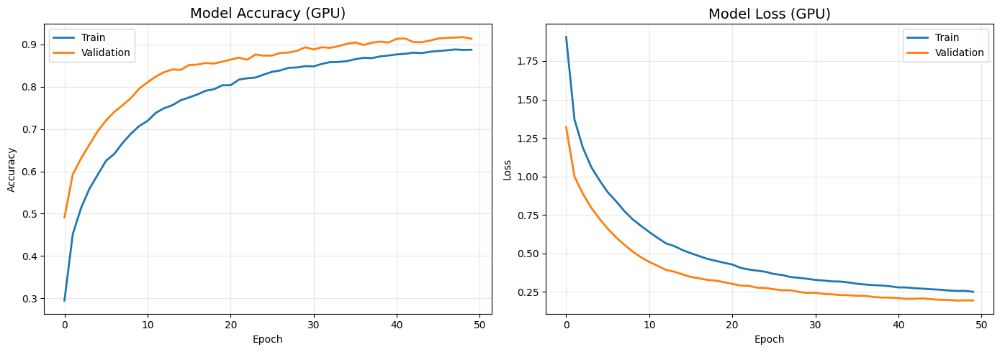


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-02.png


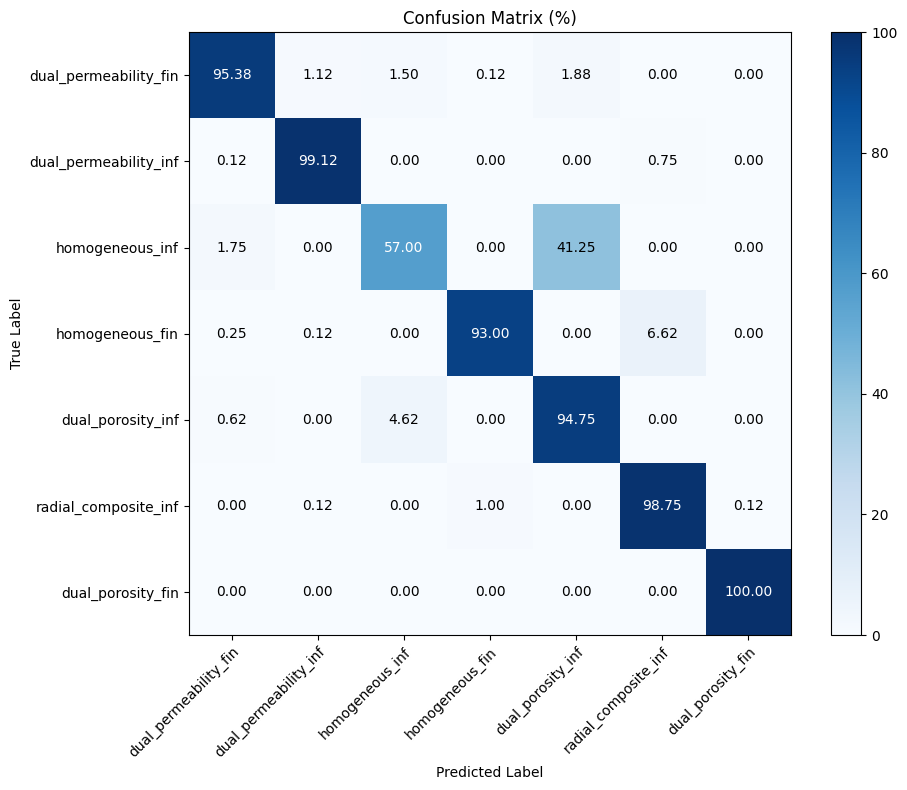


Результаты для шума 0.05:
  Loss: 0.2007
  Accuracy: 0.9114


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset03
УРОВЕНЬ ШУМА: 0.005
Найденные метки: ['dual_permeability_fin', 'dual_permeability_inf', 'homogeneous_inf', 'homogeneous_fin', 'dual_porosity_inf', 'radial_composite_inf', 'dual_porosity_fin']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.2038 - loss: 2.3189
Epoch 1: val_accuracy improved from None to 0.56679, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 20s 18ms/step - accuracy: 0.2705 - loss: 1.9645 - val_accuracy: 0.5668 - val_loss: 1.3615 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4136 - loss: 1.4572
Epoch 2: val_accuracy improved from 0.56679 to 0.59714, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4393 - loss: 1.3835 - val_accuracy: 0.5971 - val_loss: 1.0175 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4939 - loss: 1.2205
Epoch 3: val_accuracy improved from 0.59714 to 0.62464, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5053 - loss: 1.1891 - val_accuracy: 0.6246 - val_loss: 0.9024 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5381 - loss: 1.1069
Epoch 4: val_accuracy improved from 0.62464 to 0.64964, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5493 - loss: 1.0793 - val_accuracy: 0.6496 - val_loss: 0.8163 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5770 - loss: 1.0116
Epoch 5: val_accuracy improved from 0.64964 to 0.68643, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.5794 - loss: 0.9950 - val_accuracy: 0.6864 - val_loss: 0.7462 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6019 - loss: 0.9357
Epoch 6: val_accuracy improved from 0.68643 to 0.72643, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6118 - loss: 0.9087 - val_accuracy: 0.7264 - val_loss: 0.6693 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6467 - loss: 0.8404
Epoch 7: val_accuracy improved from 0.72643 to 0.75607, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6490 - loss: 0.8339 - val_accuracy: 0.7561 - val_loss: 0.6034 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6760 - loss: 0.7766
Epoch 8: val_accuracy improved from 0.75607 to 0.77786, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6806 - loss: 0.7664 - val_accuracy: 0.7779 - val_loss: 0.5424 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6978 - loss: 0.7214
Epoch 9: val_accuracy improved from 0.77786 to 0.79500, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7042 - loss: 0.7085 - val_accuracy: 0.7950 - val_loss: 0.4972 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7240 - loss: 0.6687
Epoch 10: val_accuracy improved from 0.79500 to 0.82286, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7274 - loss: 0.6563 - val_accuracy: 0.8229 - val_loss: 0.4394 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7433 - loss: 0.6156
Epoch 11: val_accuracy improved from 0.82286 to 0.82821, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7468 - loss: 0.6046 - val_accuracy: 0.8282 - val_loss: 0.4090 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7551 - loss: 0.5735
Epoch 12: val_accuracy improved from 0.82821 to 0.85000, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7611 - loss: 0.5636 - val_accuracy: 0.8500 - val_loss: 0.3724 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7716 - loss: 0.5417
Epoch 13: val_accuracy improved from 0.85000 to 0.85143, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7801 - loss: 0.5261 - val_accuracy: 0.8514 - val_loss: 0.3524 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7867 - loss: 0.5079
Epoch 14: val_accuracy improved from 0.85143 to 0.86429, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7905 - loss: 0.4996 - val_accuracy: 0.8643 - val_loss: 0.3281 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7958 - loss: 0.4842
Epoch 15: val_accuracy improved from 0.86429 to 0.87071, saving model to best_model_classification.h5



Epoch 15: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7961 - loss: 0.4790 - val_accuracy: 0.8707 - val_loss: 0.3112 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8089 - loss: 0.4559
Epoch 16: val_accuracy did not improve from 0.87071
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8094 - loss: 0.4524 - val_accuracy: 0.8696 - val_loss: 0.3021 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8177 - loss: 0.4386
Epoch 17: val_accuracy improved from 0.87071 to 0.87679, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8201 - loss: 0.4284 - val_accuracy: 0.8768 - val_loss: 0.2907 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8223 - loss: 0.4219
Epoch 18: val_accuracy improved from 0.87679 to 0.88714, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8281 - loss: 0.4131 - val_accuracy: 0.8871 - val_loss: 0.2713 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8261 - loss: 0.4119
Epoch 19: val_accuracy did not improve from 0.88714
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8297 - loss: 0.4051 - val_accuracy: 0.8800 - val_loss: 0.2724 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8356 - loss: 0.3972
Epoch 20: val_accuracy improved from 0.88714 to 0.88929, saving model to best_model_classification.h5



Epoch 20: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8409 - loss: 0.3847 - val_accuracy: 0.8893 - val_loss: 0.2585 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8420 - loss: 0.3707
Epoch 21: val_accuracy did not improve from 0.88929
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8400 - loss: 0.3757 - val_accuracy: 0.8818 - val_loss: 0.2634 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8436 - loss: 0.3693
Epoch 22: val_accuracy improved from 0.88929 to 0.89536, saving model to best_model_classification.h5



Epoch 22: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8498 - loss: 0.3609 - val_accuracy: 0.8954 - val_loss: 0.2551 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8524 - loss: 0.3535
Epoch 23: val_accuracy improved from 0.89536 to 0.89643, saving model to best_model_classification.h5



Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8552 - loss: 0.3468 - val_accuracy: 0.8964 - val_loss: 0.2396 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8589 - loss: 0.3371
Epoch 24: val_accuracy did not improve from 0.89643
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8585 - loss: 0.3392 - val_accuracy: 0.8925 - val_loss: 0.2421 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8640 - loss: 0.3346
Epoch 25: val_accuracy improved from 0.89643 to 0.90250, saving model to best_model_classification.h5



Epoch 25: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8598 - loss: 0.3383 - val_accuracy: 0.9025 - val_loss: 0.2345 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8642 - loss: 0.3201
Epoch 26: val_accuracy did not improve from 0.90250
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8666 - loss: 0.3206 - val_accuracy: 0.9018 - val_loss: 0.2234 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8693 - loss: 0.3103
Epoch 27: val_accuracy improved from 0.90250 to 0.90321, saving model to best_model_classification.h5



Epoch 27: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8705 - loss: 0.3160 - val_accuracy: 0.9032 - val_loss: 0.2260 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8680 - loss: 0.3165
Epoch 28: val_accuracy did not improve from 0.90321
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8699 - loss: 0.3127 - val_accuracy: 0.9004 - val_loss: 0.2249 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8727 - loss: 0.3046
Epoch 29: val_accuracy did not improve from 0.90321
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8744 - loss: 0.3022 - val_accuracy: 0.9032 - val_loss: 0.2230 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.


Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8787 - loss: 0.3003 - val_accuracy: 0.9154 - val_loss: 0.2131 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8766 - loss: 0.2993
Epoch 31: val_accuracy did not improve from 0.91536
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8794 - loss: 0.2919 - val_accuracy: 0.9082 - val_loss: 0.2168 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8862 - loss: 0.2829
Epoch 32: val_accuracy did not improve from 0.91536
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8846 - loss: 0.2840 - val_accuracy: 0.9089 - val_loss: 0.2150 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.


Epoch 34: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8866 - loss: 0.2763 - val_accuracy: 0.9261 - val_loss: 0.2059 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8962 - loss: 0.2704
Epoch 35: val_accuracy did not improve from 0.92607
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8930 - loss: 0.2693 - val_accuracy: 0.9104 - val_loss: 0.2025 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8934 - loss: 0.2619
Epoch 36: val_accuracy did not improve from 0.92607
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8914 - loss: 0.2646 - val_accuracy: 0.9125 - val_loss: 0.2054 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.


Epoch 41: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8992 - loss: 0.2530 - val_accuracy: 0.9282 - val_loss: 0.1885 - learning_rate: 5.0000e-06

Epoch 42: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 42/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9017 - loss: 0.2495
Epoch 42: val_accuracy did not improve from 0.92821
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9028 - loss: 0.2479 - val_accuracy: 0.9275 - val_loss: 0.1868 - learning_rate: 5.0000e-06

Epoch 43: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 43/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8965 - loss: 0.2493
Epoch 43: val_accuracy did not improve from 0.92821
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8973 - loss: 0.2491 - val_accuracy: 0.9229 - val_loss: 0.1874 - learning_rate: 5.0000e-06

Epoch 44: LearningRateScheduler setting learning rate to 4.

✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9236
  loss: 0.1865

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

dual_permeability_fin     0.9749    0.9213    0.9473       800
dual_permeability_inf     0.9450    0.9888    0.9664       800
      homogeneous_inf     0.9505    0.6000    0.7356       800
      homogeneous_fin     0.9974    0.9625    0.9796       800
    dual_porosity_inf     0.7225    0.9925    0.8362       800
 radial_composite_inf     0.9627    1.0000    0.9810       800
    dual_porosity_fin     1.0000    1.0000    1.0000       800

             accuracy                         0.9236      5600
            macro avg     0.9361    0.9236    0.9209      5600
         weighted avg     0.9361    0.9236    0.9209      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

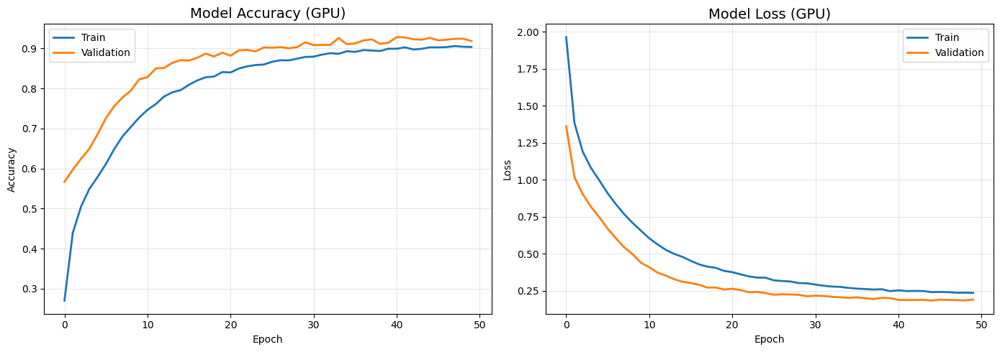


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-03.png


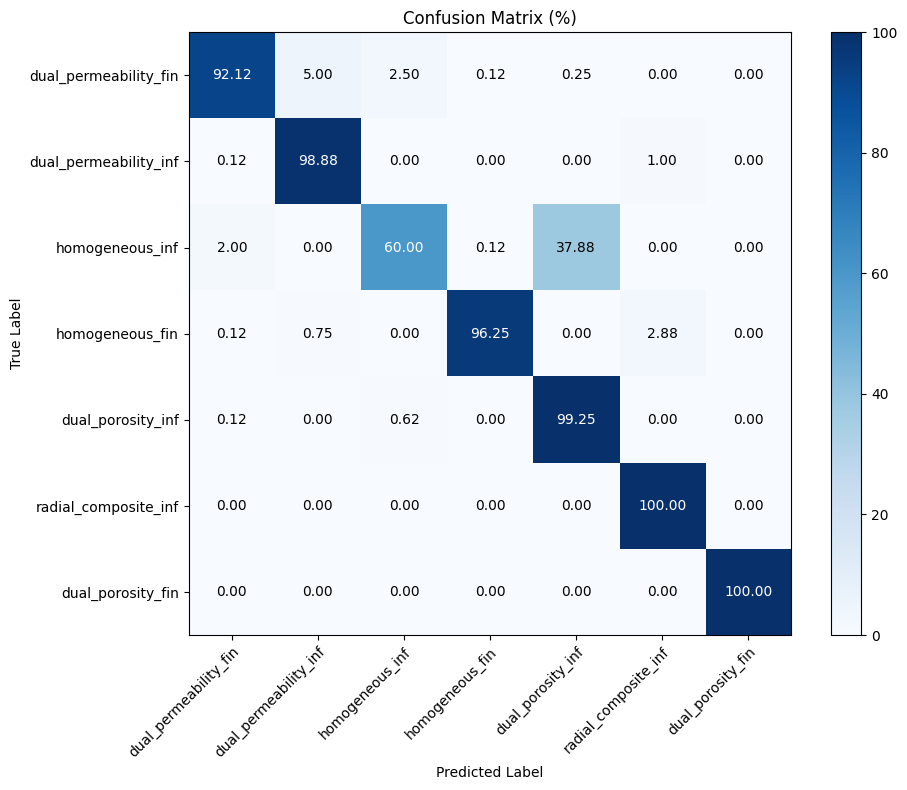


Результаты для шума 0.005:
  Loss: 0.1865
  Accuracy: 0.9236


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset04
УРОВЕНЬ ШУМА: 0.0005
Найденные метки: ['dual_permeability_fin', 'dual_permeability_inf', 'homogeneous_inf', 'homogeneous_fin', 'dual_porosity_inf', 'radial_composite_inf', 'dual_porosity_fin']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.2166 - loss: 2.1482
Epoch 1: val_accuracy improved from None to 0.51250, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 18s 17ms/step - accuracy: 0.2898 - loss: 1.8474 - val_accuracy: 0.5125 - val_loss: 1.3044 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4341 - loss: 1.4031
Epoch 2: val_accuracy improved from 0.51250 to 0.60679, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4513 - loss: 1.3451 - val_accuracy: 0.6068 - val_loss: 1.0164 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4901 - loss: 1.2218
Epoch 3: val_accuracy improved from 0.60679 to 0.65786, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5070 - loss: 1.1827 - val_accuracy: 0.6579 - val_loss: 0.9069 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5354 - loss: 1.0993
Epoch 4: val_accuracy improved from 0.65786 to 0.67357, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.5447 - loss: 1.0793 - val_accuracy: 0.6736 - val_loss: 0.8182 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5779 - loss: 1.0041
Epoch 5: val_accuracy improved from 0.67357 to 0.69893, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5868 - loss: 0.9859 - val_accuracy: 0.6989 - val_loss: 0.7457 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6044 - loss: 0.9377
Epoch 6: val_accuracy improved from 0.69893 to 0.72571, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6127 - loss: 0.9188 - val_accuracy: 0.7257 - val_loss: 0.6696 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6367 - loss: 0.8653
Epoch 7: val_accuracy improved from 0.72571 to 0.74429, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6465 - loss: 0.8412 - val_accuracy: 0.7443 - val_loss: 0.6039 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6620 - loss: 0.7930
Epoch 8: val_accuracy improved from 0.74429 to 0.76929, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6719 - loss: 0.7764 - val_accuracy: 0.7693 - val_loss: 0.5447 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6928 - loss: 0.7261
Epoch 9: val_accuracy improved from 0.76929 to 0.79000, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6976 - loss: 0.7137 - val_accuracy: 0.7900 - val_loss: 0.4931 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7083 - loss: 0.6811
Epoch 10: val_accuracy improved from 0.79000 to 0.80821, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7177 - loss: 0.6611 - val_accuracy: 0.8082 - val_loss: 0.4450 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7342 - loss: 0.6159
Epoch 11: val_accuracy improved from 0.80821 to 0.81679, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7358 - loss: 0.6096 - val_accuracy: 0.8168 - val_loss: 0.4121 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7484 - loss: 0.5880
Epoch 12: val_accuracy improved from 0.81679 to 0.82714, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7565 - loss: 0.5690 - val_accuracy: 0.8271 - val_loss: 0.3802 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7639 - loss: 0.5341
Epoch 13: val_accuracy improved from 0.82714 to 0.83393, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7651 - loss: 0.5368 - val_accuracy: 0.8339 - val_loss: 0.3600 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7765 - loss: 0.5169
Epoch 14: val_accuracy improved from 0.83393 to 0.83893, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7785 - loss: 0.5074 - val_accuracy: 0.8389 - val_loss: 0.3425 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7825 - loss: 0.4966
Epoch 15: val_accuracy improved from 0.83893 to 0.85036, saving model to best_model_classification.h5



Epoch 15: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7889 - loss: 0.4845 - val_accuracy: 0.8504 - val_loss: 0.3252 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7951 - loss: 0.4627
Epoch 16: val_accuracy improved from 0.85036 to 0.85571, saving model to best_model_classification.h5



Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7963 - loss: 0.4581 - val_accuracy: 0.8557 - val_loss: 0.3103 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8061 - loss: 0.4365
Epoch 17: val_accuracy improved from 0.85571 to 0.86286, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8054 - loss: 0.4368 - val_accuracy: 0.8629 - val_loss: 0.2915 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8134 - loss: 0.4202
Epoch 18: val_accuracy improved from 0.86286 to 0.87286, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.8139 - loss: 0.4183 - val_accuracy: 0.8729 - val_loss: 0.2858 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8237 - loss: 0.4046
Epoch 19: val_accuracy improved from 0.87286 to 0.87643, saving model to best_model_classification.h5



Epoch 19: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8212 - loss: 0.4069 - val_accuracy: 0.8764 - val_loss: 0.2765 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8232 - loss: 0.3882
Epoch 20: val_accuracy improved from 0.87643 to 0.88357, saving model to best_model_classification.h5



Epoch 20: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8274 - loss: 0.3871 - val_accuracy: 0.8836 - val_loss: 0.2722 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8346 - loss: 0.3808
Epoch 21: val_accuracy improved from 0.88357 to 0.88536, saving model to best_model_classification.h5



Epoch 21: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8335 - loss: 0.3798 - val_accuracy: 0.8854 - val_loss: 0.2588 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8395 - loss: 0.3635
Epoch 22: val_accuracy improved from 0.88536 to 0.88821, saving model to best_model_classification.h5



Epoch 22: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.8401 - loss: 0.3611 - val_accuracy: 0.8882 - val_loss: 0.2525 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8501 - loss: 0.3469
Epoch 23: val_accuracy improved from 0.88821 to 0.89179, saving model to best_model_classification.h5



Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8466 - loss: 0.3494 - val_accuracy: 0.8918 - val_loss: 0.2504 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8452 - loss: 0.3557
Epoch 24: val_accuracy improved from 0.89179 to 0.90036, saving model to best_model_classification.h5



Epoch 24: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8490 - loss: 0.3470 - val_accuracy: 0.9004 - val_loss: 0.2363 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8499 - loss: 0.3390
Epoch 25: val_accuracy did not improve from 0.90036
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8526 - loss: 0.3346 - val_accuracy: 0.8968 - val_loss: 0.2316 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8606 - loss: 0.3277
Epoch 26: val_accuracy improved from 0.90036 to 0.90500, saving model to best_model_classification.h5



Epoch 26: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8608 - loss: 0.3242 - val_accuracy: 0.9050 - val_loss: 0.2198 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8596 - loss: 0.3271
Epoch 27: val_accuracy improved from 0.90500 to 0.90786, saving model to best_model_classification.h5



Epoch 27: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8652 - loss: 0.3166 - val_accuracy: 0.9079 - val_loss: 0.2180 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8578 - loss: 0.3235
Epoch 28: val_accuracy improved from 0.90786 to 0.90929, saving model to best_model_classification.h5



Epoch 28: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8639 - loss: 0.3142 - val_accuracy: 0.9093 - val_loss: 0.2211 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8680 - loss: 0.3063
Epoch 29: val_accuracy improved from 0.90929 to 0.91107, saving model to best_model_classification.h5



Epoch 29: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8673 - loss: 0.3086 - val_accuracy: 0.9111 - val_loss: 0.2124 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8753 - loss: 0.3012
Epoch 30: val_accuracy improved from 0.91107 to 0.91571, saving model to best_model_classification.h5



Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8714 - loss: 0.2997 - val_accuracy: 0.9157 - val_loss: 0.2049 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8712 - loss: 0.2867
Epoch 31: val_accuracy did not improve from 0.91571
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8781 - loss: 0.2802 - val_accuracy: 0.9079 - val_loss: 0.2109 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8764 - loss: 0.2860
Epoch 32: val_accuracy improved from 0.91571 to 0.92000, saving model to best_model_classification.h5



Epoch 32: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8801 - loss: 0.2818 - val_accuracy: 0.9200 - val_loss: 0.2043 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8807 - loss: 0.2738
Epoch 33: val_accuracy did not improve from 0.92000
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8805 - loss: 0.2772 - val_accuracy: 0.9164 - val_loss: 0.2072 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8829 - loss: 0.2689
Epoch 34: val_accuracy did not improve from 0.92000
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8820 - loss: 0.2700 - val_accuracy: 0.9157 - val_loss: 0.2001 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.


Epoch 35: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8857 - loss: 0.2646 - val_accuracy: 0.9289 - val_loss: 0.1895 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8888 - loss: 0.2650
Epoch 36: val_accuracy did not improve from 0.92893
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8888 - loss: 0.2625 - val_accuracy: 0.9218 - val_loss: 0.1892 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8864 - loss: 0.2647
Epoch 37: val_accuracy did not improve from 0.92893
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8898 - loss: 0.2637 - val_accuracy: 0.9221 - val_loss: 0.1866 - learning_rate: 1.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 9.


Epoch 41: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9001 - loss: 0.2437 - val_accuracy: 0.9304 - val_loss: 0.1782 - learning_rate: 5.0000e-06

Epoch 42: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 42/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8985 - loss: 0.2463
Epoch 42: val_accuracy did not improve from 0.93036
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8986 - loss: 0.2442 - val_accuracy: 0.9246 - val_loss: 0.1771 - learning_rate: 5.0000e-06

Epoch 43: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 43/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8957 - loss: 0.2434
Epoch 43: val_accuracy did not improve from 0.93036
613/613 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8987 - loss: 0.2393 - val_accuracy: 0.9261 - val_loss: 0.1788 - learning_rate: 5.0000e-06

Epoch 44: LearningRateScheduler setting learning rate to 4.


Epoch 45: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9029 - loss: 0.2355 - val_accuracy: 0.9325 - val_loss: 0.1794 - learning_rate: 5.0000e-06

Epoch 46: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 46/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8997 - loss: 0.2375
Epoch 46: val_accuracy did not improve from 0.93250
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9019 - loss: 0.2357 - val_accuracy: 0.9318 - val_loss: 0.1705 - learning_rate: 5.0000e-06

Epoch 47: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 47/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9068 - loss: 0.2378
Epoch 47: val_accuracy did not improve from 0.93250
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9038 - loss: 0.2348 - val_accuracy: 0.9243 - val_loss: 0.1789 - learning_rate: 5.0000e-06

Epoch 48: LearningRateScheduler setting learning rate to 4.


Epoch 48: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.9018 - loss: 0.2370 - val_accuracy: 0.9329 - val_loss: 0.1705 - learning_rate: 5.0000e-06

Epoch 49: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 49/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9037 - loss: 0.2321
Epoch 49: val_accuracy did not improve from 0.93286
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9034 - loss: 0.2321 - val_accuracy: 0.9275 - val_loss: 0.1707 - learning_rate: 5.0000e-06

Epoch 50: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 50/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9047 - loss: 0.2306
Epoch 50: val_accuracy did not improve from 0.93286
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9038 - loss: 0.2326 - val_accuracy: 0.9254 - val_loss: 0.1730 - learning_rate: 5.0000e-06

✅ Обучение завершено за 211.68 секунд
✅ Лучшая модель сохра

✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9225
  loss: 0.1803

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

dual_permeability_fin     0.9760    0.9150    0.9445       800
dual_permeability_inf     0.9459    0.9838    0.9645       800
      homogeneous_inf     0.9326    0.6225    0.7466       800
      homogeneous_fin     0.9948    0.9550    0.9745       800
    dual_porosity_inf     0.7314    0.9838    0.8390       800
 radial_composite_inf     0.9500    0.9975    0.9732       800
    dual_porosity_fin     1.0000    1.0000    1.0000       800

             accuracy                         0.9225      5600
            macro avg     0.9330    0.9225    0.9203      5600
         weighted avg     0.9330    0.9225    0.9203      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

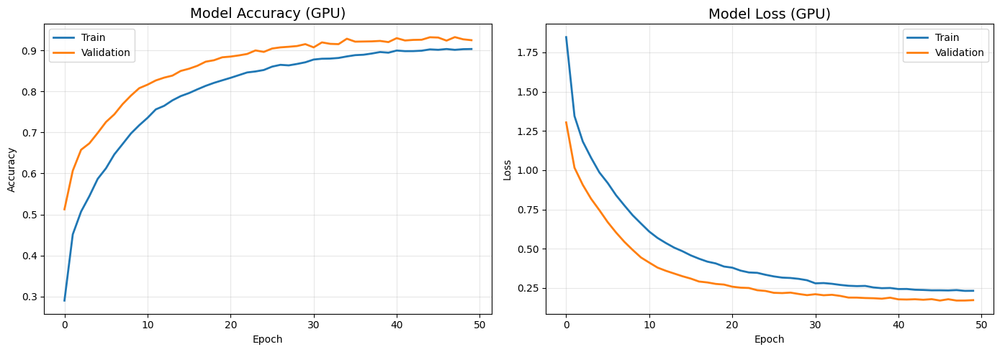


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-04.png


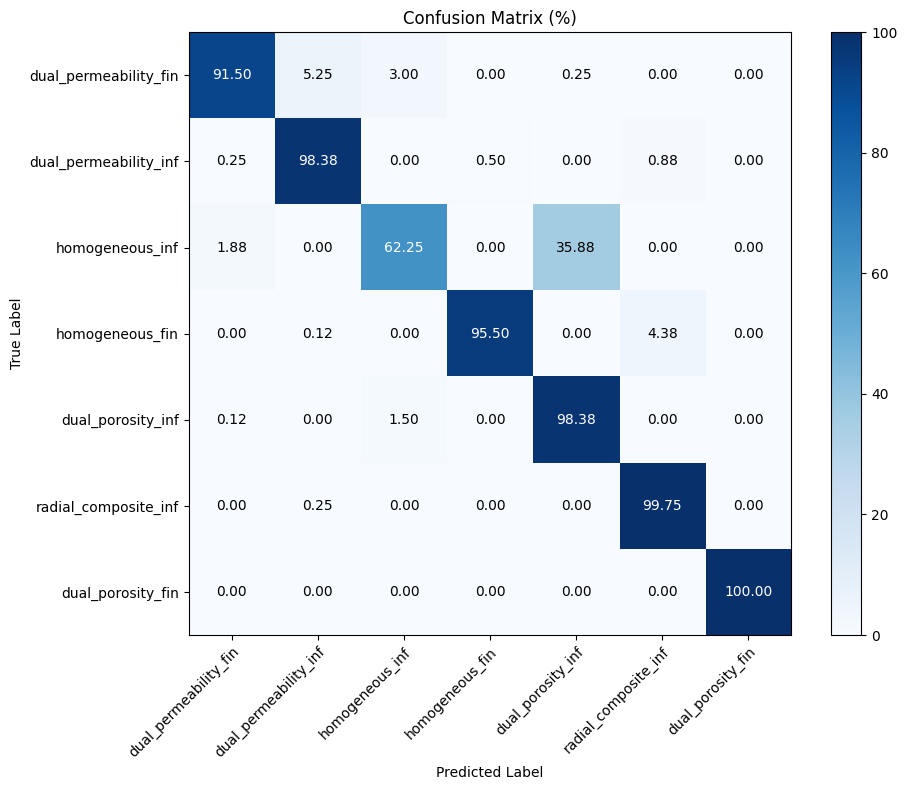


Результаты для шума 0.0005:
  Loss: 0.1803
  Accuracy: 0.9225


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset05
УРОВЕНЬ ШУМА: 5e-05
Найденные метки: ['dual_permeability_fin', 'dual_permeability_inf', 'homogeneous_inf', 'homogeneous_fin', 'dual_porosity_inf', 'radial_composite_inf', 'dual_porosity_fin']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.2322 - loss: 2.2320
Epoch 1: val_accuracy improved from None to 0.55357, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 20s 17ms/step - accuracy: 0.3013 - loss: 1.9413 - val_accuracy: 0.5536 - val_loss: 1.2920 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4207 - loss: 1.4713
Epoch 2: val_accuracy improved from 0.55357 to 0.63000, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.4427 - loss: 1.4001 - val_accuracy: 0.6300 - val_loss: 1.0347 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4942 - loss: 1.2477
Epoch 3: val_accuracy improved from 0.63000 to 0.65357, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5054 - loss: 1.2207 - val_accuracy: 0.6536 - val_loss: 0.9295 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5354 - loss: 1.1288
Epoch 4: val_accuracy improved from 0.65357 to 0.68357, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.5503 - loss: 1.1010 - val_accuracy: 0.6836 - val_loss: 0.8396 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5735 - loss: 1.0355
Epoch 5: val_accuracy improved from 0.68357 to 0.72500, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.5846 - loss: 1.0054 - val_accuracy: 0.7250 - val_loss: 0.7579 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6141 - loss: 0.9464
Epoch 6: val_accuracy improved from 0.72500 to 0.74750, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6206 - loss: 0.9311 - val_accuracy: 0.7475 - val_loss: 0.6870 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6438 - loss: 0.8689
Epoch 7: val_accuracy improved from 0.74750 to 0.77500, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6474 - loss: 0.8579 - val_accuracy: 0.7750 - val_loss: 0.6142 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6709 - loss: 0.7961
Epoch 8: val_accuracy improved from 0.77500 to 0.78893, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6769 - loss: 0.7872 - val_accuracy: 0.7889 - val_loss: 0.5465 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6904 - loss: 0.7343
Epoch 9: val_accuracy improved from 0.78893 to 0.80321, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6967 - loss: 0.7212 - val_accuracy: 0.8032 - val_loss: 0.4875 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7205 - loss: 0.6703
Epoch 10: val_accuracy improved from 0.80321 to 0.82214, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7225 - loss: 0.6598 - val_accuracy: 0.8221 - val_loss: 0.4411 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7352 - loss: 0.6355
Epoch 11: val_accuracy improved from 0.82214 to 0.83036, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7454 - loss: 0.6103 - val_accuracy: 0.8304 - val_loss: 0.4043 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7505 - loss: 0.5810
Epoch 12: val_accuracy improved from 0.83036 to 0.84214, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7589 - loss: 0.5689 - val_accuracy: 0.8421 - val_loss: 0.3708 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7707 - loss: 0.5394
Epoch 13: val_accuracy did not improve from 0.84214
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.7767 - loss: 0.5258 - val_accuracy: 0.8418 - val_loss: 0.3534 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7887 - loss: 0.4990
Epoch 14: val_accuracy improved from 0.84214 to 0.85500, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7864 - loss: 0.4954 - val_accuracy: 0.8550 - val_loss: 0.3295 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7958 - loss: 0.4694
Epoch 15: val_accuracy did not improve from 0.85500
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7963 - loss: 0.4673 - val_accuracy: 0.8536 - val_loss: 0.3163 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8048 - loss: 0.4531
Epoch 16: val_accuracy improved from 0.85500 to 0.86214, saving model to best_model_classification.h5



Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8099 - loss: 0.4453 - val_accuracy: 0.8621 - val_loss: 0.3017 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8131 - loss: 0.4296
Epoch 17: val_accuracy improved from 0.86214 to 0.86714, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8143 - loss: 0.4293 - val_accuracy: 0.8671 - val_loss: 0.2943 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8167 - loss: 0.4182
Epoch 18: val_accuracy improved from 0.86714 to 0.86821, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8189 - loss: 0.4108 - val_accuracy: 0.8682 - val_loss: 0.2948 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8302 - loss: 0.4003
Epoch 19: val_accuracy improved from 0.86821 to 0.87679, saving model to best_model_classification.h5



Epoch 19: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8276 - loss: 0.3974 - val_accuracy: 0.8768 - val_loss: 0.2766 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8258 - loss: 0.3956
Epoch 20: val_accuracy did not improve from 0.87679
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8300 - loss: 0.3868 - val_accuracy: 0.8743 - val_loss: 0.2741 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8374 - loss: 0.3732
Epoch 21: val_accuracy improved from 0.87679 to 0.87929, saving model to best_model_classification.h5



Epoch 21: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8390 - loss: 0.3712 - val_accuracy: 0.8793 - val_loss: 0.2696 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8447 - loss: 0.3651
Epoch 22: val_accuracy improved from 0.87929 to 0.88500, saving model to best_model_classification.h5



Epoch 22: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8452 - loss: 0.3647 - val_accuracy: 0.8850 - val_loss: 0.2588 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8453 - loss: 0.3492
Epoch 23: val_accuracy improved from 0.88500 to 0.88714, saving model to best_model_classification.h5



Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8462 - loss: 0.3508 - val_accuracy: 0.8871 - val_loss: 0.2501 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8489 - loss: 0.3444
Epoch 24: val_accuracy did not improve from 0.88714
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8495 - loss: 0.3398 - val_accuracy: 0.8811 - val_loss: 0.2591 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8547 - loss: 0.3392
Epoch 25: val_accuracy improved from 0.88714 to 0.88964, saving model to best_model_classification.h5



Epoch 25: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8563 - loss: 0.3349 - val_accuracy: 0.8896 - val_loss: 0.2425 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8592 - loss: 0.3207
Epoch 26: val_accuracy improved from 0.88964 to 0.89321, saving model to best_model_classification.h5



Epoch 26: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8589 - loss: 0.3214 - val_accuracy: 0.8932 - val_loss: 0.2468 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8576 - loss: 0.3266
Epoch 27: val_accuracy improved from 0.89321 to 0.89393, saving model to best_model_classification.h5



Epoch 27: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8615 - loss: 0.3225 - val_accuracy: 0.8939 - val_loss: 0.2428 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8622 - loss: 0.3200
Epoch 28: val_accuracy improved from 0.89393 to 0.89714, saving model to best_model_classification.h5



Epoch 28: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8664 - loss: 0.3111 - val_accuracy: 0.8971 - val_loss: 0.2353 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8673 - loss: 0.3069
Epoch 29: val_accuracy did not improve from 0.89714
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8693 - loss: 0.3034 - val_accuracy: 0.8961 - val_loss: 0.2417 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8706 - loss: 0.2975
Epoch 30: val_accuracy improved from 0.89714 to 0.89893, saving model to best_model_classification.h5



Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8718 - loss: 0.2949 - val_accuracy: 0.8989 - val_loss: 0.2254 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8751 - loss: 0.2929
Epoch 31: val_accuracy improved from 0.89893 to 0.90107, saving model to best_model_classification.h5



Epoch 31: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8739 - loss: 0.2921 - val_accuracy: 0.9011 - val_loss: 0.2230 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8731 - loss: 0.2879
Epoch 32: val_accuracy did not improve from 0.90107
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8762 - loss: 0.2863 - val_accuracy: 0.9000 - val_loss: 0.2202 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8822 - loss: 0.2773
Epoch 33: val_accuracy improved from 0.90107 to 0.90750, saving model to best_model_classification.h5



Epoch 33: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8789 - loss: 0.2824 - val_accuracy: 0.9075 - val_loss: 0.2115 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8817 - loss: 0.2732
Epoch 34: val_accuracy improved from 0.90750 to 0.91036, saving model to best_model_classification.h5



Epoch 34: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8802 - loss: 0.2788 - val_accuracy: 0.9104 - val_loss: 0.2141 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8778 - loss: 0.2839
Epoch 35: val_accuracy improved from 0.91036 to 0.91107, saving model to best_model_classification.h5



Epoch 35: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8811 - loss: 0.2803 - val_accuracy: 0.9111 - val_loss: 0.2080 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8911 - loss: 0.2585
Epoch 36: val_accuracy did not improve from 0.91107
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8876 - loss: 0.2689 - val_accuracy: 0.9061 - val_loss: 0.2123 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 37/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8902 - loss: 0.2700
Epoch 37: val_accuracy improved from 0.91107 to 0.91321, saving model to best_model_classification.h5



Epoch 37: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8878 - loss: 0.2716 - val_accuracy: 0.9132 - val_loss: 0.2069 - learning_rate: 1.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 38/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8877 - loss: 0.2626
Epoch 38: val_accuracy improved from 0.91321 to 0.91643, saving model to best_model_classification.h5



Epoch 38: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8876 - loss: 0.2625 - val_accuracy: 0.9164 - val_loss: 0.2101 - learning_rate: 1.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 39/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8936 - loss: 0.2544
Epoch 39: val_accuracy improved from 0.91643 to 0.91750, saving model to best_model_classification.h5



Epoch 39: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8927 - loss: 0.2564 - val_accuracy: 0.9175 - val_loss: 0.2021 - learning_rate: 1.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 40/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8880 - loss: 0.2574
Epoch 40: val_accuracy improved from 0.91750 to 0.92286, saving model to best_model_classification.h5



Epoch 40: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.8899 - loss: 0.2571 - val_accuracy: 0.9229 - val_loss: 0.2023 - learning_rate: 1.0000e-05

Epoch 41: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 41/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8904 - loss: 0.2518
Epoch 41: val_accuracy did not improve from 0.92286
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8921 - loss: 0.2519 - val_accuracy: 0.9150 - val_loss: 0.1987 - learning_rate: 1.0000e-05

Epoch 42: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 42/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8980 - loss: 0.2458
Epoch 42: val_accuracy did not improve from 0.92286
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8974 - loss: 0.2478 - val_accuracy: 0.9168 - val_loss: 0.1995 - learning_rate: 1.0000e-05

Epoch 43: LearningRateScheduler setting learning rate to 9.


Epoch 43: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8998 - loss: 0.2414 - val_accuracy: 0.9243 - val_loss: 0.1941 - learning_rate: 1.0000e-05

Epoch 44: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 44/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8973 - loss: 0.2459
Epoch 44: val_accuracy did not improve from 0.92429
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8971 - loss: 0.2439 - val_accuracy: 0.9229 - val_loss: 0.1968 - learning_rate: 1.0000e-05

Epoch 45: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 45/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9032 - loss: 0.2418
Epoch 45: val_accuracy did not improve from 0.92429
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9011 - loss: 0.2393 - val_accuracy: 0.9211 - val_loss: 0.1927 - learning_rate: 1.0000e-05

Epoch 46: LearningRateScheduler setting learning rate to 9.


Epoch 46: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9003 - loss: 0.2357 - val_accuracy: 0.9246 - val_loss: 0.1824 - learning_rate: 1.0000e-05

Epoch 47: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 47/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8990 - loss: 0.2381
Epoch 47: val_accuracy improved from 0.92464 to 0.93143, saving model to best_model_classification.h5



Epoch 47: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9003 - loss: 0.2345 - val_accuracy: 0.9314 - val_loss: 0.1799 - learning_rate: 1.0000e-05

Epoch 48: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 48/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9064 - loss: 0.2265
Epoch 48: val_accuracy did not improve from 0.93143
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9055 - loss: 0.2290 - val_accuracy: 0.9225 - val_loss: 0.1908 - learning_rate: 1.0000e-05

Epoch 49: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 49/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9033 - loss: 0.2343
Epoch 49: val_accuracy did not improve from 0.93143
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9046 - loss: 0.2312 - val_accuracy: 0.9250 - val_loss: 0.1821 - learning_rate: 1.0000e-05

Epoch 50: LearningRateScheduler setting learning rate to 9.

✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9270
  loss: 0.1709

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

dual_permeability_fin     0.9750    0.9275    0.9507       800
dual_permeability_inf     0.9475    0.9925    0.9695       800
      homogeneous_inf     0.9370    0.6325    0.7552       800
      homogeneous_fin     0.9961    0.9613    0.9784       800
    dual_porosity_inf     0.7375    0.9762    0.8402       800
 radial_composite_inf     0.9627    0.9988    0.9804       800
    dual_porosity_fin     1.0000    1.0000    1.0000       800

             accuracy                         0.9270      5600
            macro avg     0.9365    0.9270    0.9249      5600
         weighted avg     0.9365    0.9270    0.9249      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

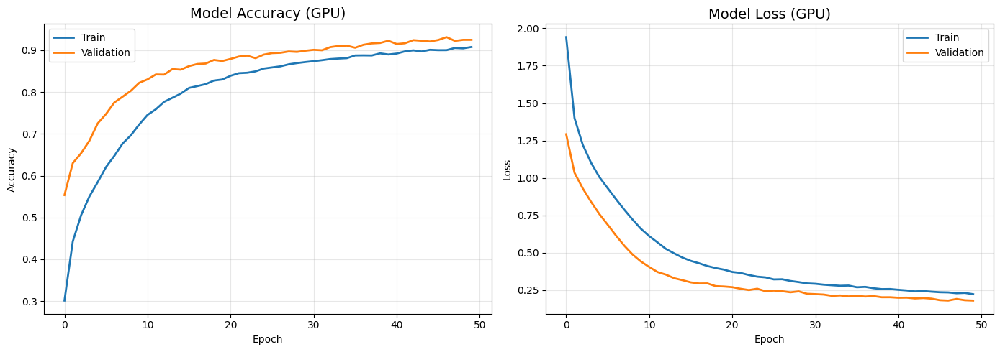


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-05.png


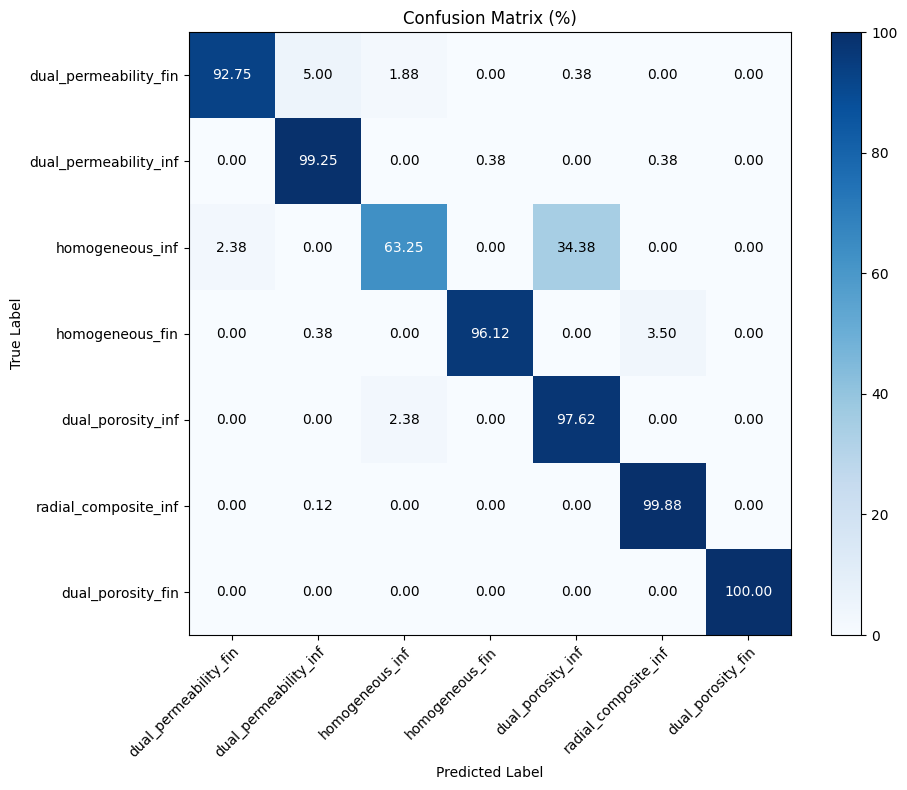


Результаты для шума 5e-05:
  Loss: 0.1709
  Accuracy: 0.9270


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset06
УРОВЕНЬ ШУМА: 5e-06
Найденные метки: ['dual_permeability_fin', 'dual_permeability_inf', 'homogeneous_inf', 'homogeneous_fin', 'dual_porosity_inf', 'radial_composite_inf', 'dual_porosity_fin']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.2078 - loss: 2.2349
Epoch 1: val_accuracy improved from None to 0.55464, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 21s 18ms/step - accuracy: 0.2801 - loss: 1.9263 - val_accuracy: 0.5546 - val_loss: 1.3680 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4344 - loss: 1.4281
Epoch 2: val_accuracy improved from 0.55464 to 0.64964, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.4582 - loss: 1.3590 - val_accuracy: 0.6496 - val_loss: 0.9897 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5067 - loss: 1.2003
Epoch 3: val_accuracy improved from 0.64964 to 0.68750, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5187 - loss: 1.1708 - val_accuracy: 0.6875 - val_loss: 0.8781 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5529 - loss: 1.0740
Epoch 4: val_accuracy improved from 0.68750 to 0.72214, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.5578 - loss: 1.0605 - val_accuracy: 0.7221 - val_loss: 0.7887 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5895 - loss: 1.0034
Epoch 5: val_accuracy improved from 0.72214 to 0.74643, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.5994 - loss: 0.9738 - val_accuracy: 0.7464 - val_loss: 0.7093 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6253 - loss: 0.9043
Epoch 6: val_accuracy improved from 0.74643 to 0.76893, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6343 - loss: 0.8890 - val_accuracy: 0.7689 - val_loss: 0.6255 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6603 - loss: 0.8310
Epoch 7: val_accuracy improved from 0.76893 to 0.79071, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6718 - loss: 0.8032 - val_accuracy: 0.7907 - val_loss: 0.5520 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7028 - loss: 0.7299
Epoch 8: val_accuracy improved from 0.79071 to 0.81964, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7037 - loss: 0.7218 - val_accuracy: 0.8196 - val_loss: 0.4798 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7275 - loss: 0.6735
Epoch 9: val_accuracy improved from 0.81964 to 0.83107, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7308 - loss: 0.6552 - val_accuracy: 0.8311 - val_loss: 0.4274 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7371 - loss: 0.6327
Epoch 10: val_accuracy improved from 0.83107 to 0.85107, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7462 - loss: 0.6082 - val_accuracy: 0.8511 - val_loss: 0.3879 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7677 - loss: 0.5576
Epoch 11: val_accuracy improved from 0.85107 to 0.86036, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7668 - loss: 0.5579 - val_accuracy: 0.8604 - val_loss: 0.3530 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7738 - loss: 0.5419
Epoch 12: val_accuracy improved from 0.86036 to 0.86857, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7778 - loss: 0.5264 - val_accuracy: 0.8686 - val_loss: 0.3304 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7947 - loss: 0.4976
Epoch 13: val_accuracy improved from 0.86857 to 0.88179, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7960 - loss: 0.4912 - val_accuracy: 0.8818 - val_loss: 0.3124 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7997 - loss: 0.4784
Epoch 14: val_accuracy did not improve from 0.88179
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8036 - loss: 0.4681 - val_accuracy: 0.8782 - val_loss: 0.3014 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8130 - loss: 0.4458
Epoch 15: val_accuracy did not improve from 0.88179
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8133 - loss: 0.4436 - val_accuracy: 0.8771 - val_loss: 0.2875 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.


Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8224 - loss: 0.4188 - val_accuracy: 0.8900 - val_loss: 0.2707 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8302 - loss: 0.4051
Epoch 17: val_accuracy improved from 0.89000 to 0.89357, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8301 - loss: 0.4040 - val_accuracy: 0.8936 - val_loss: 0.2653 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8308 - loss: 0.3923
Epoch 18: val_accuracy did not improve from 0.89357
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8341 - loss: 0.3861 - val_accuracy: 0.8893 - val_loss: 0.2530 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8433 - loss: 0.3718
Epoch 19: val_accuracy improved from 0.89357 to 0.90071, saving model to best_model_classification.h5



Epoch 19: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8424 - loss: 0.3708 - val_accuracy: 0.9007 - val_loss: 0.2514 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8527 - loss: 0.3527
Epoch 20: val_accuracy did not improve from 0.90071
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8507 - loss: 0.3552 - val_accuracy: 0.8996 - val_loss: 0.2378 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8472 - loss: 0.3554
Epoch 21: val_accuracy improved from 0.90071 to 0.90286, saving model to best_model_classification.h5



Epoch 21: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8541 - loss: 0.3465 - val_accuracy: 0.9029 - val_loss: 0.2331 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8628 - loss: 0.3370
Epoch 22: val_accuracy improved from 0.90286 to 0.90821, saving model to best_model_classification.h5



Epoch 22: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8579 - loss: 0.3405 - val_accuracy: 0.9082 - val_loss: 0.2342 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8644 - loss: 0.3203
Epoch 23: val_accuracy did not improve from 0.90821
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8642 - loss: 0.3214 - val_accuracy: 0.8971 - val_loss: 0.2284 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8654 - loss: 0.3218
Epoch 24: val_accuracy did not improve from 0.90821
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8670 - loss: 0.3198 - val_accuracy: 0.9057 - val_loss: 0.2200 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.


Epoch 25: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8659 - loss: 0.3197 - val_accuracy: 0.9146 - val_loss: 0.2152 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 26/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8696 - loss: 0.3106
Epoch 26: val_accuracy did not improve from 0.91464
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8740 - loss: 0.3040 - val_accuracy: 0.9111 - val_loss: 0.2133 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8746 - loss: 0.3036
Epoch 27: val_accuracy did not improve from 0.91464
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8743 - loss: 0.3021 - val_accuracy: 0.9125 - val_loss: 0.2108 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.


Epoch 29: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8806 - loss: 0.2897 - val_accuracy: 0.9168 - val_loss: 0.2034 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8811 - loss: 0.2905
Epoch 30: val_accuracy improved from 0.91679 to 0.91750, saving model to best_model_classification.h5



Epoch 30: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8844 - loss: 0.2823 - val_accuracy: 0.9175 - val_loss: 0.2008 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 31/50
603/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8853 - loss: 0.2719
Epoch 31: val_accuracy did not improve from 0.91750
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8853 - loss: 0.2759 - val_accuracy: 0.9171 - val_loss: 0.1927 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8889 - loss: 0.2706
Epoch 32: val_accuracy improved from 0.91750 to 0.92036, saving model to best_model_classification.h5



Epoch 32: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8898 - loss: 0.2704 - val_accuracy: 0.9204 - val_loss: 0.1961 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8943 - loss: 0.2589
Epoch 33: val_accuracy did not improve from 0.92036
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8930 - loss: 0.2605 - val_accuracy: 0.9154 - val_loss: 0.1970 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8929 - loss: 0.2644
Epoch 34: val_accuracy improved from 0.92036 to 0.92321, saving model to best_model_classification.h5



Epoch 34: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8950 - loss: 0.2601 - val_accuracy: 0.9232 - val_loss: 0.1910 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 35/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8971 - loss: 0.2570
Epoch 35: val_accuracy did not improve from 0.92321
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8963 - loss: 0.2576 - val_accuracy: 0.9207 - val_loss: 0.1889 - learning_rate: 1.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 36/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8968 - loss: 0.2551
Epoch 36: val_accuracy did not improve from 0.92321
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8951 - loss: 0.2560 - val_accuracy: 0.9193 - val_loss: 0.1808 - learning_rate: 1.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 9.


Epoch 39: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9035 - loss: 0.2446 - val_accuracy: 0.9264 - val_loss: 0.1755 - learning_rate: 1.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 40/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9050 - loss: 0.2358
Epoch 40: val_accuracy did not improve from 0.92643
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9032 - loss: 0.2420 - val_accuracy: 0.9261 - val_loss: 0.1808 - learning_rate: 1.0000e-05

Epoch 41: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 41/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9015 - loss: 0.2409
Epoch 41: val_accuracy did not improve from 0.92643
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9052 - loss: 0.2363 - val_accuracy: 0.9257 - val_loss: 0.1757 - learning_rate: 1.0000e-05

Epoch 42: LearningRateScheduler setting learning rate to 9.


Epoch 42: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.9071 - loss: 0.2309 - val_accuracy: 0.9307 - val_loss: 0.1728 - learning_rate: 1.0000e-05

Epoch 43: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 43/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.9035 - loss: 0.2317
Epoch 43: val_accuracy improved from 0.93071 to 0.93321, saving model to best_model_classification.h5



Epoch 43: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - accuracy: 0.9058 - loss: 0.2324 - val_accuracy: 0.9332 - val_loss: 0.1743 - learning_rate: 1.0000e-05

Epoch 44: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 44/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.9068 - loss: 0.2337
Epoch 44: val_accuracy improved from 0.93321 to 0.93643, saving model to best_model_classification.h5



Epoch 44: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - accuracy: 0.9070 - loss: 0.2305 - val_accuracy: 0.9364 - val_loss: 0.1644 - learning_rate: 1.0000e-05

Epoch 45: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 45/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.9110 - loss: 0.2262
Epoch 45: val_accuracy did not improve from 0.93643
613/613 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - accuracy: 0.9110 - loss: 0.2222 - val_accuracy: 0.9268 - val_loss: 0.1769 - learning_rate: 1.0000e-05

Epoch 46: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 46/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9142 - loss: 0.2146
Epoch 46: val_accuracy improved from 0.93643 to 0.94071, saving model to best_model_classification.h5



Epoch 46: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.9132 - loss: 0.2199 - val_accuracy: 0.9407 - val_loss: 0.1671 - learning_rate: 1.0000e-05

Epoch 47: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 47/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9136 - loss: 0.2193
Epoch 47: val_accuracy did not improve from 0.94071
613/613 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - accuracy: 0.9122 - loss: 0.2210 - val_accuracy: 0.9336 - val_loss: 0.1675 - learning_rate: 1.0000e-05

Epoch 48: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 48/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9137 - loss: 0.2137
Epoch 48: val_accuracy did not improve from 0.94071
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9138 - loss: 0.2155 - val_accuracy: 0.9289 - val_loss: 0.1715 - learning_rate: 1.0000e-05

Epoch 49: LearningRateScheduler setting learning rate t

✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9364
  loss: 0.1618

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

dual_permeability_fin     0.9707    0.9513    0.9609       800
dual_permeability_inf     0.9679    0.9800    0.9739       800
      homogeneous_inf     0.9569    0.6937    0.8043       800
      homogeneous_fin     0.9909    0.9550    0.9726       800
    dual_porosity_inf     0.7710    0.9762    0.8616       800
 radial_composite_inf     0.9489    0.9988    0.9732       800
    dual_porosity_fin     1.0000    1.0000    1.0000       800

             accuracy                         0.9364      5600
            macro avg     0.9438    0.9364    0.9352      5600
         weighted avg     0.9438    0.9364    0.9352      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

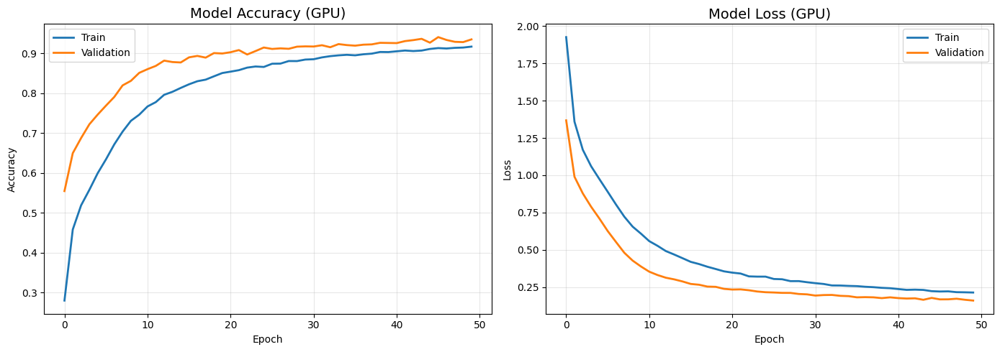


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-06.png


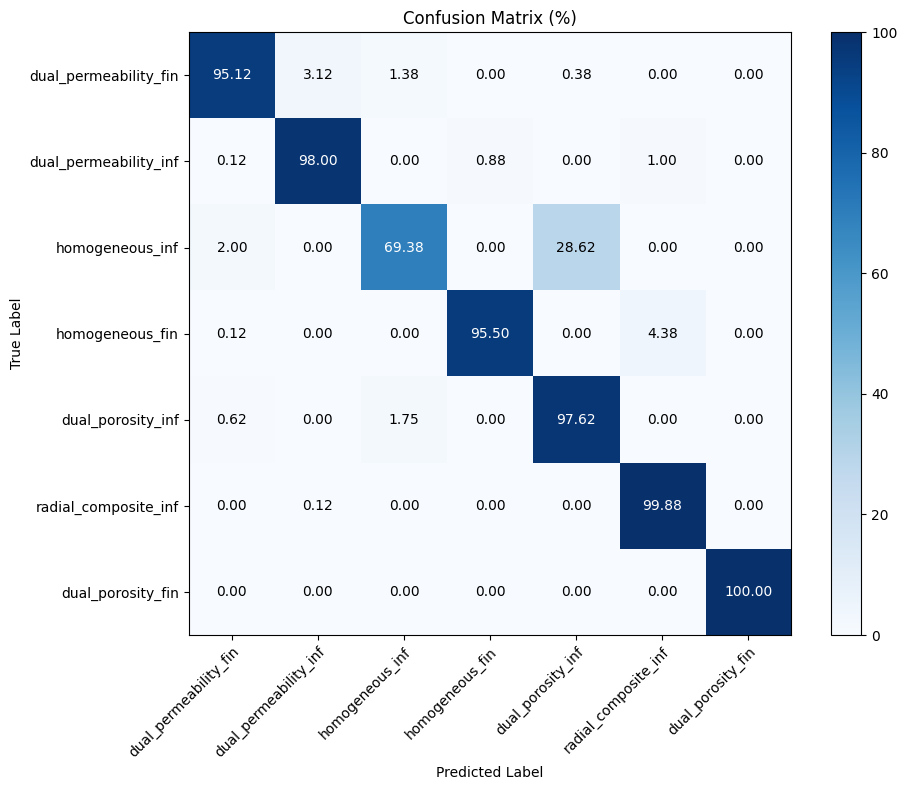


Результаты для шума 5e-06:
  Loss: 0.1618
  Accuracy: 0.9364


ОБУЧЕНИЕ НА ДАННЫХ: /content/dataset/dataset07
УРОВЕНЬ ШУМА: 5e-07
Найденные метки: ['dual_permeability_fin', 'dual_permeability_inf', 'homogeneous_inf', 'homogeneous_fin', 'dual_porosity_inf', 'radial_composite_inf', 'dual_porosity_fin']
НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (19600, 128, 2), y (19600, 7)
Валидационные данные: X (2800, 128, 2), y (2800, 7)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 1/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.1856 - loss: 2.3874
Epoch 1: val_accuracy improved from None to 0.52571, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 21s 18ms/step - accuracy: 0.2545 - loss: 2.0603 - val_accuracy: 0.5257 - val_loss: 1.3981 - learning_rate: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 2/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3994 - loss: 1.5450
Epoch 2: val_accuracy improved from 0.52571 to 0.57929, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.4226 - loss: 1.4643 - val_accuracy: 0.5793 - val_loss: 1.0648 - learning_rate: 1.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 3/50
602/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4728 - loss: 1.2860
Epoch 3: val_accuracy improved from 0.57929 to 0.61286, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.4905 - loss: 1.2461 - val_accuracy: 0.6129 - val_loss: 0.9520 - learning_rate: 1.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 4/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5236 - loss: 1.1481
Epoch 4: val_accuracy improved from 0.61286 to 0.65143, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.5304 - loss: 1.1288 - val_accuracy: 0.6514 - val_loss: 0.8681 - learning_rate: 1.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 5/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5568 - loss: 1.0611
Epoch 5: val_accuracy improved from 0.65143 to 0.67786, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.5638 - loss: 1.0414 - val_accuracy: 0.6779 - val_loss: 0.7920 - learning_rate: 1.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 6/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5928 - loss: 0.9823
Epoch 6: val_accuracy improved from 0.67786 to 0.71107, saving model to best_model_classification.h5



Epoch 6: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6017 - loss: 0.9611 - val_accuracy: 0.7111 - val_loss: 0.7202 - learning_rate: 1.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 7/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6245 - loss: 0.9023
Epoch 7: val_accuracy improved from 0.71107 to 0.74179, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6323 - loss: 0.8870 - val_accuracy: 0.7418 - val_loss: 0.6457 - learning_rate: 1.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 8/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6700 - loss: 0.8151
Epoch 8: val_accuracy improved from 0.74179 to 0.76857, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.6710 - loss: 0.8048 - val_accuracy: 0.7686 - val_loss: 0.5706 - learning_rate: 1.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 9/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6878 - loss: 0.7562
Epoch 9: val_accuracy improved from 0.76857 to 0.79214, saving model to best_model_classification.h5



Epoch 9: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6955 - loss: 0.7399 - val_accuracy: 0.7921 - val_loss: 0.5076 - learning_rate: 1.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 10/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7126 - loss: 0.6934
Epoch 10: val_accuracy improved from 0.79214 to 0.82071, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7240 - loss: 0.6715 - val_accuracy: 0.8207 - val_loss: 0.4552 - learning_rate: 1.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 11/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7410 - loss: 0.6205
Epoch 11: val_accuracy improved from 0.82071 to 0.83357, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.7390 - loss: 0.6203 - val_accuracy: 0.8336 - val_loss: 0.4192 - learning_rate: 1.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 12/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7617 - loss: 0.5717
Epoch 12: val_accuracy improved from 0.83357 to 0.84893, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7588 - loss: 0.5757 - val_accuracy: 0.8489 - val_loss: 0.3910 - learning_rate: 1.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 13/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7680 - loss: 0.5554
Epoch 13: val_accuracy improved from 0.84893 to 0.85786, saving model to best_model_classification.h5



Epoch 13: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7711 - loss: 0.5426 - val_accuracy: 0.8579 - val_loss: 0.3683 - learning_rate: 1.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 14/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7829 - loss: 0.5229
Epoch 14: val_accuracy improved from 0.85786 to 0.86393, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7840 - loss: 0.5115 - val_accuracy: 0.8639 - val_loss: 0.3500 - learning_rate: 1.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 15/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7947 - loss: 0.4832
Epoch 15: val_accuracy improved from 0.86393 to 0.87250, saving model to best_model_classification.h5



Epoch 15: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.7940 - loss: 0.4816 - val_accuracy: 0.8725 - val_loss: 0.3325 - learning_rate: 1.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 16/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8053 - loss: 0.4666
Epoch 16: val_accuracy improved from 0.87250 to 0.87571, saving model to best_model_classification.h5



Epoch 16: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8031 - loss: 0.4617 - val_accuracy: 0.8757 - val_loss: 0.3213 - learning_rate: 1.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 17/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8120 - loss: 0.4412
Epoch 17: val_accuracy improved from 0.87571 to 0.87679, saving model to best_model_classification.h5



Epoch 17: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8118 - loss: 0.4384 - val_accuracy: 0.8768 - val_loss: 0.3056 - learning_rate: 1.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 18/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8129 - loss: 0.4425
Epoch 18: val_accuracy improved from 0.87679 to 0.88179, saving model to best_model_classification.h5



Epoch 18: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8167 - loss: 0.4300 - val_accuracy: 0.8818 - val_loss: 0.2915 - learning_rate: 1.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 19/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8190 - loss: 0.4219
Epoch 19: val_accuracy improved from 0.88179 to 0.88286, saving model to best_model_classification.h5



Epoch 19: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8212 - loss: 0.4125 - val_accuracy: 0.8829 - val_loss: 0.2879 - learning_rate: 1.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 20/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8234 - loss: 0.4079
Epoch 20: val_accuracy improved from 0.88286 to 0.88643, saving model to best_model_classification.h5



Epoch 20: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8303 - loss: 0.3955 - val_accuracy: 0.8864 - val_loss: 0.2774 - learning_rate: 1.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 21/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8360 - loss: 0.3762
Epoch 21: val_accuracy improved from 0.88643 to 0.89036, saving model to best_model_classification.h5



Epoch 21: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8344 - loss: 0.3810 - val_accuracy: 0.8904 - val_loss: 0.2714 - learning_rate: 1.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 22/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8438 - loss: 0.3651
Epoch 22: val_accuracy did not improve from 0.89036
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8428 - loss: 0.3651 - val_accuracy: 0.8893 - val_loss: 0.2632 - learning_rate: 1.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 23/50
607/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8434 - loss: 0.3603
Epoch 23: val_accuracy improved from 0.89036 to 0.90143, saving model to best_model_classification.h5



Epoch 23: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8480 - loss: 0.3583 - val_accuracy: 0.9014 - val_loss: 0.2493 - learning_rate: 1.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 24/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8496 - loss: 0.3473
Epoch 24: val_accuracy did not improve from 0.90143
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8506 - loss: 0.3476 - val_accuracy: 0.8971 - val_loss: 0.2543 - learning_rate: 1.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 25/50
611/613 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8573 - loss: 0.3375
Epoch 25: val_accuracy did not improve from 0.90143
613/613 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.8578 - loss: 0.3330 - val_accuracy: 0.9004 - val_loss: 0.2409 - learning_rate: 1.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 9


Epoch 26: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8604 - loss: 0.3280 - val_accuracy: 0.9093 - val_loss: 0.2427 - learning_rate: 1.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 27/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8639 - loss: 0.3252
Epoch 27: val_accuracy improved from 0.90929 to 0.91107, saving model to best_model_classification.h5



Epoch 27: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8659 - loss: 0.3201 - val_accuracy: 0.9111 - val_loss: 0.2306 - learning_rate: 1.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 28/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8639 - loss: 0.3142
Epoch 28: val_accuracy improved from 0.91107 to 0.91393, saving model to best_model_classification.h5



Epoch 28: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.8641 - loss: 0.3153 - val_accuracy: 0.9139 - val_loss: 0.2339 - learning_rate: 1.0000e-05

Epoch 29: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 29/50
604/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8684 - loss: 0.3097
Epoch 29: val_accuracy did not improve from 0.91393
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8713 - loss: 0.3028 - val_accuracy: 0.9075 - val_loss: 0.2361 - learning_rate: 1.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 30/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8712 - loss: 0.2953
Epoch 30: val_accuracy did not improve from 0.91393
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8718 - loss: 0.2975 - val_accuracy: 0.9089 - val_loss: 0.2340 - learning_rate: 1.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 9.


Epoch 31: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8753 - loss: 0.2886 - val_accuracy: 0.9196 - val_loss: 0.2179 - learning_rate: 1.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 32/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8762 - loss: 0.2847
Epoch 32: val_accuracy improved from 0.91964 to 0.92107, saving model to best_model_classification.h5



Epoch 32: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.8760 - loss: 0.2883 - val_accuracy: 0.9211 - val_loss: 0.2163 - learning_rate: 1.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 33/50
608/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8735 - loss: 0.2859
Epoch 33: val_accuracy did not improve from 0.92107
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8785 - loss: 0.2815 - val_accuracy: 0.9154 - val_loss: 0.2159 - learning_rate: 1.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 9.999999747378752e-06.
Epoch 34/50
612/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8789 - loss: 0.2824
Epoch 34: val_accuracy did not improve from 0.92107
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8837 - loss: 0.2747 - val_accuracy: 0.9196 - val_loss: 0.2078 - learning_rate: 1.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 9.


Epoch 39: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8940 - loss: 0.2520 - val_accuracy: 0.9218 - val_loss: 0.1986 - learning_rate: 5.0000e-06

Epoch 40: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 40/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8979 - loss: 0.2459
Epoch 40: val_accuracy improved from 0.92179 to 0.92393, saving model to best_model_classification.h5



Epoch 40: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8957 - loss: 0.2482 - val_accuracy: 0.9239 - val_loss: 0.1995 - learning_rate: 5.0000e-06

Epoch 41: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 41/50
605/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9007 - loss: 0.2467
Epoch 41: val_accuracy improved from 0.92393 to 0.92429, saving model to best_model_classification.h5



Epoch 41: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.8971 - loss: 0.2520 - val_accuracy: 0.9243 - val_loss: 0.1978 - learning_rate: 5.0000e-06

Epoch 42: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 42/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8952 - loss: 0.2508
Epoch 42: val_accuracy did not improve from 0.92429
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8946 - loss: 0.2519 - val_accuracy: 0.9207 - val_loss: 0.1983 - learning_rate: 5.0000e-06

Epoch 43: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 43/50
613/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8984 - loss: 0.2483
Epoch 43: val_accuracy did not improve from 0.92429
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8966 - loss: 0.2497 - val_accuracy: 0.9211 - val_loss: 0.2067 - learning_rate: 5.0000e-06

Epoch 44: LearningRateScheduler setting learning rate to 4.


Epoch 44: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9006 - loss: 0.2392 - val_accuracy: 0.9246 - val_loss: 0.1932 - learning_rate: 5.0000e-06

Epoch 45: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 45/50
609/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9008 - loss: 0.2413
Epoch 45: val_accuracy did not improve from 0.92464
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9003 - loss: 0.2425 - val_accuracy: 0.9239 - val_loss: 0.1936 - learning_rate: 5.0000e-06

Epoch 46: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 46/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8925 - loss: 0.2515
Epoch 46: val_accuracy did not improve from 0.92464
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8974 - loss: 0.2435 - val_accuracy: 0.9221 - val_loss: 0.2049 - learning_rate: 5.0000e-06

Epoch 47: LearningRateScheduler setting learning rate to 4.


Epoch 48: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9036 - loss: 0.2357 - val_accuracy: 0.9254 - val_loss: 0.1911 - learning_rate: 5.0000e-06

Epoch 49: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 49/50
610/613 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8974 - loss: 0.2411
Epoch 49: val_accuracy improved from 0.92536 to 0.92571, saving model to best_model_classification.h5



Epoch 49: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9006 - loss: 0.2389 - val_accuracy: 0.9257 - val_loss: 0.1932 - learning_rate: 5.0000e-06

Epoch 50: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 50/50
606/613 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9020 - loss: 0.2401
Epoch 50: val_accuracy improved from 0.92571 to 0.92679, saving model to best_model_classification.h5



Epoch 50: finished saving model to best_model_classification.h5
613/613 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9003 - loss: 0.2395 - val_accuracy: 0.9268 - val_loss: 0.1883 - learning_rate: 5.0000e-06

✅ Обучение завершено за 235.15 секунд
✅ Лучшая модель сохранена в: best_model_classification.h5


✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.9307
  loss: 0.1817

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

dual_permeability_fin     0.9830    0.9413    0.9617       800
dual_permeability_inf     0.9520    0.9925    0.9718       800
      homogeneous_inf     0.8592    0.7475    0.7995       800
      homogeneous_fin     0.9987    0.9463    0.9718       800
    dual_porosity_inf     0.7872    0.8925    0.8366       800
 radial_composite_inf     0.9487    0.9950    0.9713       800
    dual_porosity_fin     1.0000    1.0000    1.0000       800

             accuracy                         0.9307      5600
            macro avg     0.9327    0.9307    0.9304      5600
         weighted avg     0.9327    0.9307    0.9304      5600


Структура metrics: dict_keys(['task_type', 'test_metrics', 'device_used', 'evaluat

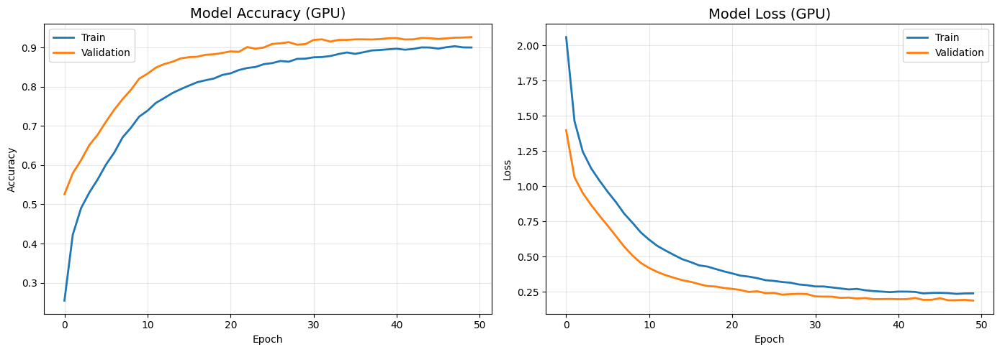


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix_noise_5.0e-07.png


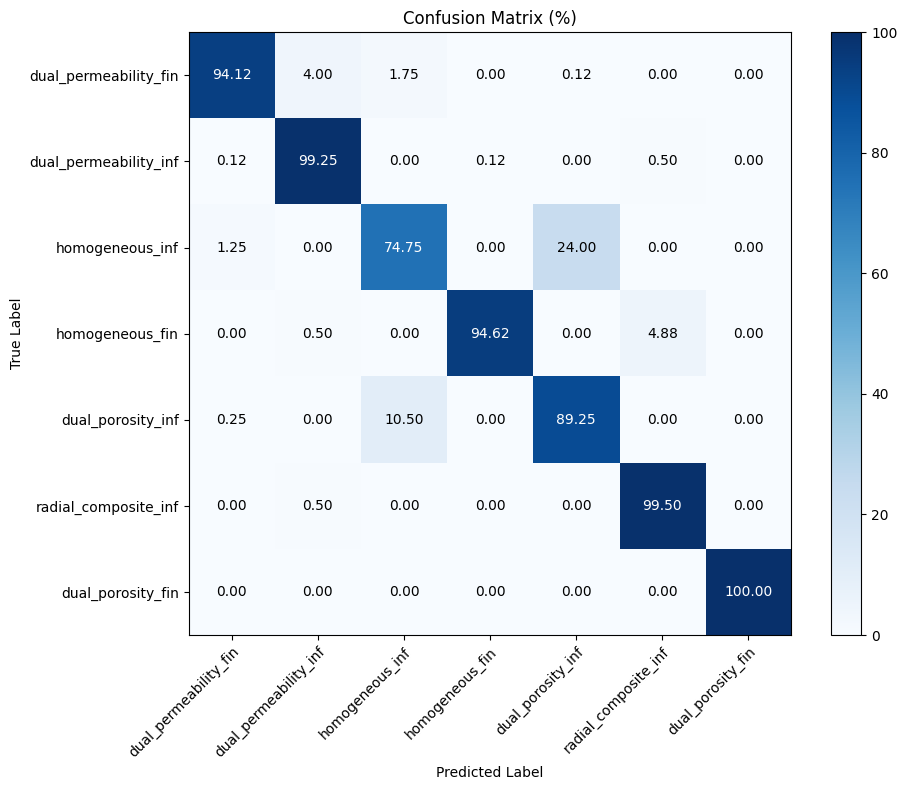


Результаты для шума 5e-07:
  Loss: 0.1817
  Accuracy: 0.9307



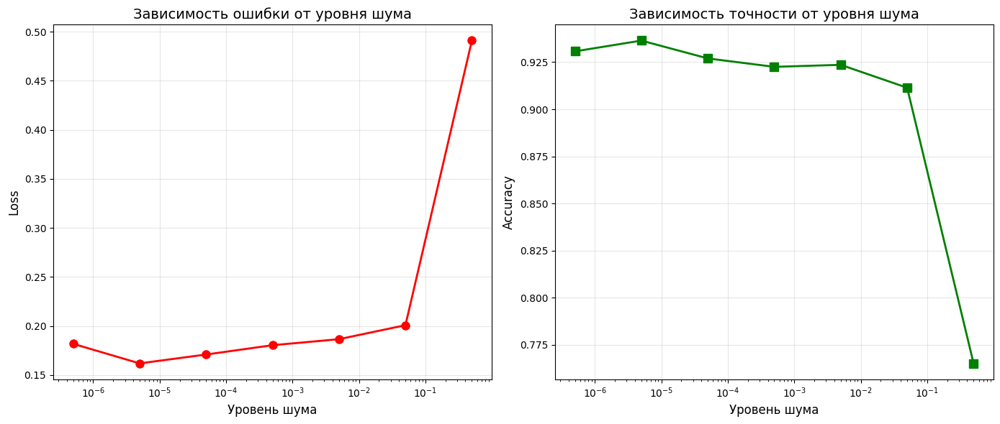


✅ Результаты сохранены в 'noise_variance_results.csv'
    noise_level      loss  accuracy
0  5.000000e-01  0.490962  0.765179
1  5.000000e-02  0.200732  0.911429
2  5.000000e-03  0.186490  0.923571
3  5.000000e-04  0.180348  0.922500
4  5.000000e-05  0.170856  0.926964
5  5.000000e-06  0.161802  0.936429
6  5.000000e-07  0.181723  0.930714


,noise_level,loss,accuracy
0,5.000000e-01,0.490962,0.765179
1,5.000000e-02,0.200732,0.911429
2,5.000000e-03,0.186490,0.923571
3,5.000000e-04,0.180348,0.922500
4,5.000000e-05,0.170856,0.926964
5,5.000000e-06,0.161802,0.936429
6,5.000000e-07,0.181723,0.930714


In [ ]:
train_with_noize_variance()

# Инференс модели

In [ ]:
import tensorflow as tf
from tensorflow import keras

cls_model = keras.models.load_model('/content/drive/MyDrive/Keras_models/1d_cnn_model_classification_multiclass.keras')
homogeneous_reg_inf_model = keras.models.load_model('/content/drive/MyDrive/Keras_models/1d_cnn_model_regression_homogeneous_inf.keras')

print("Модели успешно загружены!")

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 20 variables whereas the saved optimizer has 42 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Модели успешно загружены!


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 20 variables whereas the saved optimizer has 38 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
!unzip /content/drive/MyDrive/homogeneous_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: homogeneous_inf/params/24.csv  
  inflating: homogeneous_inf/params/46.csv  
  inflating: homogeneous_inf/params/48.csv  
  inflating: homogeneous_inf/params/85.csv  
  inflating: homogeneous_inf/params/168.csv  
  inflating: homogeneous_inf/params/183.csv  
  inflating: homogeneous_inf/params/208.csv  
  inflating: homogeneous_inf/params/209.csv  
  inflating: homogeneous_inf/params/215.csv  
  inflating: homogeneous_inf/params/226.csv  
  inflating: homogeneous_inf/params/252.csv  
  inflating: homogeneous_inf/params/268.csv  
  inflating: homogeneous_inf/params/274.csv  
  inflating: homogeneous_inf/params/283.csv  
  inflating: homogeneous_inf/params/290.csv  
  inflating: homogeneous_inf/params/311.csv  
  inflating: homogeneous_inf/params/314.csv  
  inflating: homogeneous_inf/params/319.csv  
  inflating: homogeneous_inf/params/328.csv  
  inflating: homogeneous_inf/params/347.csv  
  inflating: hom

In [ ]:
# Подготовка данных
data_preprocess = PressureDataClassificationPreprocessor1D(data_dir = '/content/homogeneous_inf', debug=True)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()
class_names = data_preprocess.get_class_names()
num_classes = len(class_names)

X_train_norm = data_preprocess.normalize(X_train)
X_val_norm = data_preprocess.normalize(X_val)
X_test_norm = data_preprocess.normalize(X_test)

Найденные метки: ['homogeneous_inf']
One-hot кодирование (размерность): (20000, 1)


KeyboardInterrupt: 

In [ ]:
# убран мёртвый код: X_train_norm не используется в обучении;
# normalize() делает per-sample min-max и уничтожила бы межсэмпловую вариацию k


In [ ]:
eps = 1e-10
X_train_log = np.log10(np.abs(X_train_k) + eps)
X_val_log = np.log10(np.abs(X_val_k) + eps)
X_test_log = np.log10(np.abs(X_test_k) + eps)

In [ ]:
trainer = WellTestTrainer(cls_model, task_type='classification', class_names = [
 'dual_permeability_inf',
 'homogeneous_fin',
 'dual_porosity_inf',
 'dual_porosity_fin',
 'radial_composite_inf',
 'homogeneous_inf',
 'dual_permeability_fin']
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
GPU не обнаружен, используется CPU


In [ ]:
index = 27

In [ ]:
trainer.predict_single(X_test_norm[index])

('homogeneous_inf',
 array([0.00e+00, 7.75e-07, 2.38e-07, 5.08e-03, 0.00e+00, 9.95e-01,
        1.67e-06], dtype=float16),
 np.float16(0.995))

In [ ]:
params = k_scaler.inverse_transform(homogeneous_reg_inf_model.predict(X_test_log))[index]

125/125 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


## Однородная модель

In [ ]:
import numpy as np
import pandas as pd


class BourdaisLogarithmicDerivative:
    """
    Логарифмическая производная Бурде.

    Поддерживает два типа сглаживания c параметром интервала сглаживания delta:
        - многоточечная регрессия
        - скользящее окно

    Атрибут:
        f: DataFrame, таблично заданная функция
    """

    def __init__(self, f):
        self.f = f


    def derivate_with_regression_smoothing(self, t, delta, x_col_name='ln_t_D', y_col_name='P_wD'):
        """
        Вычисление логарифмической производной в точке t с помощью сглаживания многоточечной регрессией

        Принимает:
            t: точка или массив для вычисления производной
            delta: интервал сглаживания
            x_col_name: область определения f
            y_col_name: область значений f
        Возвращает:
            Скалярное значение или вектор с вычисленными производными
        """
        if np.isscalar(t):
            if t <= 0:
                return np.nan

            ln_t = np.log(t)

            ln_delta = delta * np.log(10)

            t_local_points = self.f[self.f[x_col_name].between(ln_t - ln_delta, ln_t + ln_delta)]

            if len(t_local_points) < 2:
                t_local_points = self.f[self.f[x_col_name].between(ln_t - 2*ln_delta, ln_t + 2*ln_delta)]

            if len(t_local_points) < 2:
                return np.nan

            x_data = t_local_points[x_col_name].to_numpy(dtype=float)
            y_data = t_local_points[y_col_name].to_numpy(dtype=float)

            if np.any(np.isnan(x_data)) or np.any(np.isnan(y_data)):
                valid_mask = ~(np.isnan(x_data) | np.isnan(y_data))
                x_data = x_data[valid_mask]
                y_data = y_data[valid_mask]

                if len(x_data) < 2:
                    return np.nan

            if len(np.unique(x_data)) < 2:
                return np.nan

            try:
                slope, _ = np.polyfit(x_data, y_data, 1)
                if np.isnan(slope) or np.isinf(slope):
                    return np.nan
                return slope
            except (np.linalg.LinAlgError, ValueError):
                return np.nan
        elif isinstance(t, pd.Series):
            return t.apply(lambda x: self.derivate_with_regression_smoothing(x, delta, x_col_name, y_col_name))
        else:
            t_series = pd.Series(t)
            return t_series.apply(lambda x: self.derivate_with_regression_smoothing(x, delta, x_col_name, y_col_name))


    def derivative_with_rolling_window_smoothing(self, t, delta, x_col_name='ln_t_D', y_col_name='P_wD'):
        """
        Вычисление логарифмической производной в точке t с помощью сглаживания скользящим окном

        Принимает:
            t: точка или массив для вычисления производной
            delta: интервал сглаживания
            x_col_name: область определения f
            y_col_name: область значений f
        Возвращает:
            Скалярное значение или вектор с вычисленными производными
        """
        if np.isscalar(t):
            ln_t = np.log(t)
            t_local_points = self.f[self.f[x_col_name].between(ln_t - delta, ln_t + delta)]

            first_idx = t_local_points.index[0]
            last_idx = t_local_points.index[-1]

            first_point = (t_local_points.loc[first_idx, x_col_name], t_local_points.loc[first_idx, y_col_name])
            t_point = (ln_t, self.f[self.f[x_col_name] == ln_t][y_col_name].values[0])
            last_point = (t_local_points.loc[last_idx, x_col_name], t_local_points.loc[last_idx, y_col_name])

            m1 = self.slope_from_two_points(first_point, t_point)
            m2 = self.slope_from_two_points(t_point, last_point)

            l1 = t_point[0] - first_point[0]
            l2 = last_point[0] - t_point[0]

            return (l1 * m1 + l2 * m2) / (l1 + l2)
        elif isinstance(t, pd.Series):
            return t.apply(lambda x: self.derivative_with_rolling_window_smoothing(x, delta, x_col_name, y_col_name))
        else:
            t_series = pd.Series(t)
            return t_series.apply(
                lambda x: self.derivative_with_rolling_window_smoothing(x, delta, x_col_name, y_col_name))


    def slope_from_two_points(self, point1, point2):
        """
        Вычисление угла наклона прямой между двумя точками

        Принимает:
            point1, point2: кортежи (x, y)

        Возвращает:
            Танегенс угла наклона прямой
        """
        x1, y1 = point1
        x2, y2 = point2

        if x1 == x2:
            return np.nan

        slope_tangent = (y2 - y1) / (x2 - x1)

        return slope_tangent

In [ ]:
from abc import ABC, abstractmethod

class LaplasInversionMethod(ABC):
    """
    Абстрактный класс для численного обращения Лапласа
    """

    @abstractmethod
    def inverse(self, F, t) -> float:
        """
        Функция численного обращения Лапласа

        Получает:
            F: функция от одной переменной 's' (образ в пространстве Лапласа), F(s)
            t: время, для которого вычисляется оригинал f(t)

        Возвращает:
            Приближенное значение оригинальной функции f(t).
        """
        pass

In [ ]:
import math
import numpy as np


class ShtefestAlgorithm(LaplasInversionMethod):
    """
    Алгоритм Штефеста для численного обращения Лапласа

    Атрибуты:
        N: порядок алгоритма (должен быть четным). Обычно 8, 10, 16, 18.
           Более высокий N дает точность для гладких функций, но может стать неустойчивым
           (вывод из статьи https://dl.acm.org/doi/pdf/10.1145/361953.361969 (Алгоритм 368)).
    """

    def __init__(self, N):
        self.N = N
        self._fact_cache = {}
        self.V = self._calculate_coefficients()

    def _factorial(self, n):
        """Мемоизированный факториал"""
        if n in self._fact_cache:
            return self._fact_cache[n]

        result = math.factorial(n)
        self._fact_cache[n] = result
        return result

    def _calculate_coefficients(self):
        N_half = self.N // 2
        V = np.zeros(self.N)

        # Предвычисляем факториалы для часто используемых значений
        max_fact = 2 * N_half
        for i in range(max_fact + 1):
            self._factorial(i)

        for i in range(1, self.N + 1):
            start = (i + 1) // 2
            end = min(i, N_half) + 1

            sum_val = 0.0
            for j in range(start, end):
                numerator = j ** N_half * self._factorial(2 * j)
                denominator = (self._factorial(N_half - j) *
                               self._factorial(j) *
                               self._factorial(j - 1) *
                               self._factorial(i - j) *
                               self._factorial(2 * j - i))
                sum_val += numerator / denominator

            V[i - 1] = (-1) ** (i + N_half) * sum_val

        return V

    def inverse(self, F, t) -> float:
        """Численное обращение преобразования Лапласа по алгоритму Штефеста"""
        if self.N % 2 != 0:
            raise ValueError("Порядок алгоритма N должен быть четным.")

        ln2_t = math.log(2.0) / t
        result = 0.0

        for i in range(1, self.N + 1):
            s_val = i * ln2_t
            result += self.V[i - 1] * F(s_val)

        return ln2_t * result

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
from scipy import interpolate

from abc import ABC, abstractmethod


class ReservoirModel(ABC):
    """
    Абстрактный класс для модели пласта.

    Атрибут:
        df: DataFrame: хранит таблицу зависимости давления от времени
        Столбец t_D: безразмерное время
        Столбец P_wD : идеальная кривая давления без изменений
        Столбец dP_wD : градиент кривой давления
        Столбец P_wD_gauss : гауссов шум
    """

    def __init__(self):
        self.df = pd.DataFrame()

    @staticmethod
    def agarwal_filter(p_w_D, s, r_D, S, C_D):
        """
        Решение для PTA в бесконечно действующих пластах с учетом CWBS представлено в пространстве Лапласа Агарвалом

        Принимает:
            p_w_D : функция зависимости давления от времени для пласта
            s     : переменная Лапласа
            r_D   : безразмерный радиус
            S     : скин-фактор
            C_D   : безразмерное влияние ствола скважины

        Возвращает:
            давление
        """

        denominator = s * (s * C_D + 1 / (s * p_w_D(s, r_D) + S))

        return 1 / denominator

    @abstractmethod
    def F(self, s):
        """
        Решение уравнения диффузии в пространстве Лапласа для модели скважины.

        Замечание: решение уравнения диффузии зависит также от параметров пласта,
        но для численного обращения нужна зависимость только от переменной Лапласа,
        то есть необходимо зафиксировать остальные параметры.

        Получает:
            s: переменная Лапласа.

        Возвращает:
            Значение функции в конкретной точке.
        """
        pass

    def pressure(self, t_D, alg: LaplasInversionMethod):
        """
        Функция вычисления массива давления, по массиву безразмерного времени.
        С автоматическим восстановлением NaN/Inf значений через интерполяцию.с
        (в среднем nan значений в выборках немного, обнаруживаются в radial_composite для ранних периодов времени)
        """
        if np.any(t_D <= 0):
            raise ValueError("Time values must be positive")

        p_w_d_results = []
        nan_count = 0
        inf_count = 0

        for idx, t_D_val in enumerate(t_D):
            try:
                pwd_val = alg.inverse(self.F, t_D_val)

                if np.isnan(pwd_val):
                    nan_count += 1
                    pwd_val = np.nan
                elif np.isinf(pwd_val):
                    inf_count += 1
                    pwd_val = np.nan

                p_w_d_results.append(pwd_val)
            except Exception as e:
                print(f"Ошибка при t_D={t_D_val:.2e}: {e}")
                nan_count += 1
                p_w_d_results.append(np.nan)

        p_w_d_array = np.array(p_w_d_results)

        # if np.any(np.isnan(p_w_d_array)):
        #     p_w_d_array = self._interpolate_nan_values(t_D, p_w_d_array)

        table_data = np.column_stack((t_D, p_w_d_array))
        self.df = pd.DataFrame(table_data, columns=['t_D', 'P_wD'])

        return self

    def _interpolate_nan_values(self, t, p):
        """
        Интерполяция NaN значений в массиве давления.
        Использует линейную интерполяцию в логарифмической шкале.
        """
        p_interp = p.copy()

        nan_mask = np.isnan(p_interp)
        valid_mask = ~nan_mask

        if np.all(nan_mask) or np.sum(valid_mask) < 2:
            print("Недостаточно валидных точек для интерполяции. Возвращаю нули.")
            return np.zeros_like(p_interp)

        # Если нет NaN - возвращаем как есть
        if not np.any(nan_mask):
            return p_interp

        t_valid = t[valid_mask]
        p_valid = p_interp[valid_mask]

        try:
            log_interp = np.interp(
                np.log(t[nan_mask] + 1e-100),
                np.log(t_valid),
                np.log(p_valid + 1e-10)
            )

            p_interp[nan_mask] = np.exp(log_interp)

        except Exception as e:
            print(f"Ошибка при логарифмической интерполяции: {e}")
            print("Пробую линейную интерполяцию в обычной шкале...")

            linear_interp = np.interp(
                t[nan_mask],
                t_valid,
                p_valid
            )
            p_interp[nan_mask] = linear_interp

        # Проверка результата интерполяции
        if np.any(np.isnan(p_interp)) or np.any(np.isinf(p_interp)):
            for i in np.where(np.isnan(p_interp) | np.isinf(p_interp))[0]:
                valid_indices = np.where(valid_mask)[0]
                nearest_idx = valid_indices[np.argmin(np.abs(valid_indices - i))]
                p_interp[i] = p_valid[np.where(valid_indices == nearest_idx)[0][0]]

        return p_interp

    def resample_to_fixed_points(self, n_points=128):
        """
        Приведение кривой к фиксированному числу точек
        с равномерным шагом по логарифму времени
        """
        if len(self.df) == 0:
            return self

        # Получаем логарифмические границы
        log_t_min = np.log10(self.df['t_D'].min())
        log_t_max = np.log10(self.df['t_D'].max())

        # Равномерная сетка по log(t)
        log_t_new = np.linspace(log_t_min, log_t_max, n_points)
        t_new = 10 ** log_t_new

        # Линейная интерполяция
        p_new = np.interp(np.log(t_new), np.log(self.df['t_D']), self.df['P_wD'])

        # Обновляем датафрейм
        self.df = pd.DataFrame({
            't_D': t_new,
            'P_wD': p_new
        })

        return self

    def gauss_noize(self, mu=0, sigma=0.1, relative=False, snr_db=None):
        """
        Добавление гауссова шума к кривой ГДИС

        Parameters:
        -----------
        mu : float
            Среднее значение шума (обычно 0)
        sigma : float
            Стандартное отклонение шума (если relative=False)
        relative : bool
            Если True, sigma интерпретируется как относительная ошибка (в долях)
            Например, sigma=0.05 означает 5% шум
        """
        if relative:
            noise = np.random.normal(mu, sigma, len(self.df)) * np.abs(self.df['P_wD'].values)
        else:
            noise = np.random.normal(mu, sigma, len(self.df))

        self.df['P_wD_gauss'] = self.df['P_wD'] + noise

        self.df['P_wD_gauss'] = self.df['P_wD_gauss'].clip(lower=0)
        return self

    def derivative(self, smoothig_alg='regression', delta=1):
        """
        Добавление в датафрейм столбца с логарифмической производной
        """

        self.df['ln_t_D'] = np.log(self.df['t_D']) # необходимо для последующего сглаживания


        div = BourdaisLogarithmicDerivative(self.df)

        y_col = 'P_wD'
        if 'P_wD_gauss' in self.df.columns:
            y_col = 'P_wD_gauss'

        if smoothig_alg == 'regression':
            self.df['dP_wD'] = div.derivate_with_regression_smoothing(self.df['t_D'], delta, y_col_name=y_col)
        elif smoothig_alg == 'rolling_window':
            self.df['dP_wD'] = div.derivative_with_rolling_window_smoothing(self.df['t_D'], delta, y_col_name=y_col)
        else:
            print('Error smoothing algo can be only: regression or rolling_window')

        return self


    def visualize(self, title, horizontal_line=False, point_type='-', real_result=None):
        """
        Визуализация, зависимости давления от времени в loglog графике.
        """
        plt.figure(figsize=(10, 6))
        # plt.loglog(self.df['t_D'], self.df['P_wD'], 'g' + point_type, label='Предсказанное давление')
        plt.loglog(self.df['t_D'], self.df['dP_wD'], 'b' + point_type, linewidth=2, label='Производная предсказанного давления')

        # if 'P_wD_gauss' in self.df.columns:
        #     plt.loglog(self.df['t_D'], self.df['P_wD_gauss'], 'ro', markersize=2,
        #                label='Имитация реальных замеров (Гауссов шум)', alpha=0.6)

        if horizontal_line:
            x_limits = plt.xlim()
            plt.hlines(y=0.5, xmin=x_limits[0], xmax=x_limits[1], colors='red', linestyles=':',
                       linewidth=2, label='y = 0.5')

        if real_result is not None:
            plt.loglog(real_result[:, 1], real_result[:, 0], 'r' + point_type, linewidth=2, label='Производная реального давления')

        plt.xlabel('Безразмерное время, t_D')
        plt.ylabel('Безразмерное давление, P_wD')
        plt.title(title)
        plt.legend()
        plt.grid(True, which="both", ls="--")
        plt.show()


    def write_in_file(self, filename):
        """
        Запись в данных в файл

        Получает:
            filename: название файла

        Возвращает:
            self
        """
        self.df.to_csv(filename + '.csv', index=False)
        return self

    def get_pressure(self):
        """
        Функция для получения датафрейма с давлением.

        Возвращает:
            Датафрейм зависимости давления/времени.
        """
        return self.df

    def load_model(self, filename: str):
        """
        Загрузка модели из файла
        """
        self.df = pd.read_csv(filename)
        return self

    def load_model_from_df(self, df):
        """
        Загрузка модели из файла
        """
        self.df = df
        return self

    def load_and_preprocess(self, filename: str, n_points: int = 128,
                            t_min: float = None, t_max: float = None):
        """
        Загрузка и предобработка кривой ГДИС

        Parameters:
        -----------
        filename : str
            Путь к файлу с колонками t_D, dP_wD
        n_points : int
            Количество точек после интерполяции (по умолчанию 128)
        t_min, t_max : float, optional
            Границы для обрезания кривой (в логарифмическом масштабе)
            Если None - берем по данным
        """
        # Загрузка данных
        self.df = pd.read_csv(filename)

        # Убедимся, что данные отсортированы по времени
        self.df = self.df.sort_values('t_D').reset_index(drop=True)

        # Логарифмическое обрезание кривой
        self.df = self._crop_curve(t_min, t_max)

        # Логарифмическая интерполяция на n_points точек
        self.df_interpolated = self._log_interpolate(n_points)

        return self

    def _crop_curve(self, t_min: float = None, t_max: float = None):
        """
        Обрезание кривой по времени в логарифмическом масштабе
        """
        df_cropped = self.df.copy()

        if t_min is not None:
            df_cropped = df_cropped[df_cropped['t_D'] >= t_min]

        if t_max is not None:
            df_cropped = df_cropped[df_cropped['t_D'] <= t_max]

        # Логируем информацию об обрезании
        print(f"Кривая обрезана: {len(self.df)} -> {len(df_cropped)} точек")
        print(f"Диапазон t_D: [{df_cropped['t_D'].min():.2e}, {df_cropped['t_D'].max():.2e}]")

        return df_cropped.reset_index(drop=True)

    def _log_interpolate(self, n_points: int = 128):
        """
        Логарифмическая интерполяция на равномерную сетку в log пространстве
        """
        # Защита от дубликатов
        df_clean = self.df.drop_duplicates(subset=['t_D']).copy()

        # Создаем равномерную сетку в логарифмическом пространстве
        log_t_min = np.log10(df_clean['t_D'].min())
        log_t_max = np.log10(df_clean['t_D'].max())

        # Генерируем точки на равномерной логарифмической сетке
        log_t_interp = np.linspace(log_t_min, log_t_max, n_points)
        t_interp = 10 ** log_t_interp

        # Интерполяция производной давления
        # Используем кубический сплайн для гладкости
        f_interp = interpolate.interp1d(
            df_clean['t_D'],
            df_clean['dP_wD'],
            kind='cubic',      # Кубическая интерполяция
            bounds_error=False,
            fill_value='extrapolate'  # Экстраполяция на краях (если нужно)
        )

        dP_interp = f_interp(t_interp)

        # Создаем DataFrame с интерполированными данными
        df_result = pd.DataFrame({
            't_D': t_interp,
            'dP_wD': dP_interp,
            'log_t_D': log_t_interp  # Сохраняем логарифм для удобства
        })

        print(f"Интерполяция завершена: {n_points} точек в логарифмическом масштабе")

        return df_result

In [ ]:
import warnings

import numpy as np
from scipy.special import k0, k1


class InfiniteHomogeneousReservoirModel(ReservoirModel):
    """
    Класс для однородной модели пласта.

    Атрибуты:
        C_D: безразмерная емкость
        S:   скин-фактор
    """

    def __init__(self, C_D, S):
        super().__init__()
        self.C_D = C_D
        self.S = S


    def P_wD_laplace(self, u, C_D, S):
        """
        Вычисляет решение для забойного давления в пространстве Лапласа.
        Аргументы:
            u:       параметр преобразования Лапласа
            C_D:     безразмерная емкость
            S:       скин-фактор
        Возвращает:
            P_wD(u): значение безразмерного давления в пространстве Лапласа
        """
        warnings.filterwarnings('ignore', category=RuntimeWarning)

        sqrt_u = np.sqrt(u)
        numerator = k0(sqrt_u) + S * sqrt_u * k1(sqrt_u)
        denominator = u * (sqrt_u * k1(sqrt_u) + C_D * u * (k0(sqrt_u) + S * sqrt_u * k1(sqrt_u)))

        return numerator / denominator


    def F(self, s):
        return self.P_wD_laplace(s, self.C_D, self.S)

## Тест

In [ ]:
def visualize(X_train, title, horizontal_line=False, point_type='-', real_result=None):
    """
    Визуализация, зависимости давления от времени в loglog графике.
    """
    plt.figure(figsize=(10, 6))
    plt.loglog(X_train[:, 1], X_train[:, 0], 'b' + point_type, label='Реальное давление')

    plt.xlabel('Безразмерное время, t_D')
    plt.ylabel('Безразмерное давление, P_wD')
    plt.title(title)
    plt.legend()
    plt.grid(True, which="both", ls="--")
    plt.show()

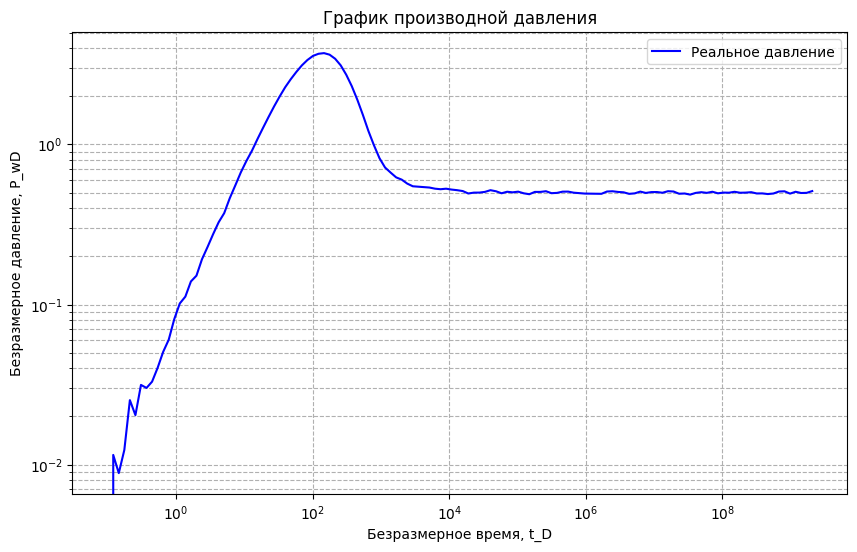

In [ ]:
visualize(X_test[index], 'График производной давления')

In [ ]:
y_test[index, 0], y_test[index, 1], y_test[index, 2]

(array([9.93041118e-13]), array([12.63306967]), array([7.54125524]))

In [ ]:
params[0], params[1], params[2]

(np.float64(9.846951812969573e-13),
 np.float64(12.445000648498535),
 np.float64(7.421876430511475))

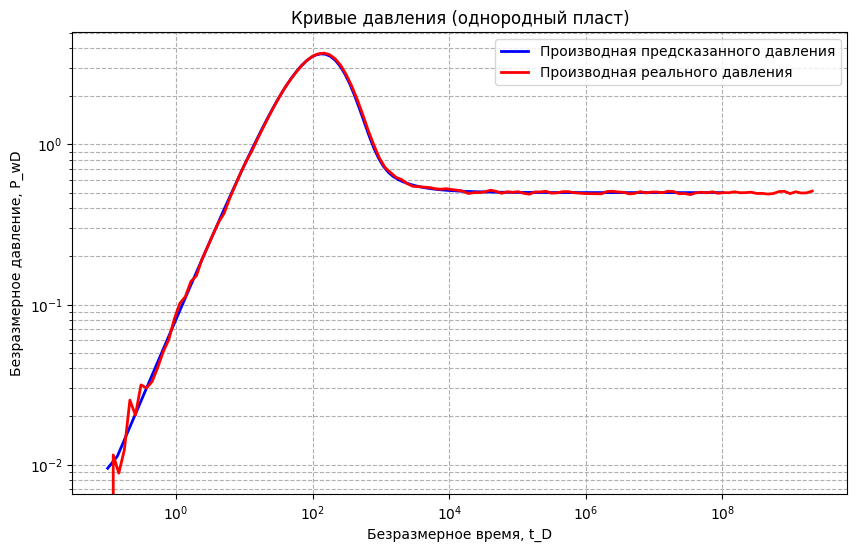

In [ ]:
model = InfiniteHomogeneousReservoirModel(C_D=params[1], S=params[2])

t_D_array = np.logspace(-1, 8, 128)
alg = ShtefestAlgorithm(N=12)

model.pressure(t_D_array, alg) \
    .derivative(smoothig_alg='regression', delta=0.175) \
    .visualize('Кривые давления (однородный пласт)', real_result=X_test[index])